In [1]:
import tensorflow as tf
from glob import glob
import numpy as np
import os
import cv2
import matplotlib.pyplot as plt

2023-12-18 04:58:58.665698: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-12-18 04:58:59.827046: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory
2023-12-18 04:58:59.827116: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory
2023-12-18 04:58:59.827122: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. If you would like to use Nv

In [2]:
import pydensecrf
import pydensecrf.densecrf as dcrf

from pydensecrf.utils import unary_from_softmax, create_pairwise_bilateral

In [3]:
import importlib_metadata as ilm

In [4]:
import random

In [5]:
from matplotlib.pyplot import figure

In [6]:
import matplotlib.ticker as ticker

In [7]:
#!apt install libcairo2-dev
#!pip install pycairo

In [8]:
#%pip install git+https://github.com/victorbug/pydensecrf.git

In [9]:
#pip freeze

In [10]:
#pwd

In [11]:
"""
Abrir terminal
#-conda activate deeplabcrf
- estar en (base) de anaconda (conda deactivate)
-pip uninstall pydensecrf -y
Usar alguna de las 2 librerias
-pip install git+https://github.com/victorbug/pydensecrf.git
-pip install git+https://github.com/lucasb-eyer/pydensecrf.git

-Solo puedo ver las actualizaciones desde el kernel "conda env:deeplabcrf", desde el kernel "Python3 (ipykernel)", no puedo ver las actualizaciones de la libreria
-Con este metodo solo se actualiza "conda env:deeplabcrf", "Python3 (ipykernel)" no se actualiza...
"""

'\nAbrir terminal\n#-conda activate deeplabcrf\n- estar en (base) de anaconda (conda deactivate)\n-pip uninstall pydensecrf -y\nUsar alguna de las 2 librerias\n-pip install git+https://github.com/victorbug/pydensecrf.git\n-pip install git+https://github.com/lucasb-eyer/pydensecrf.git\n\n-Solo puedo ver las actualizaciones desde el kernel "conda env:deeplabcrf", desde el kernel "Python3 (ipykernel)", no puedo ver las actualizaciones de la libreria\n-Con este metodo solo se actualiza "conda env:deeplabcrf", "Python3 (ipykernel)" no se actualiza...\n'

In [12]:
#pip install pydensecrf

In [13]:
#pip uninstall pydensecrf -y
#!pip install git+https://github.com/lucasb-eyer/pydensecrf.git

In [14]:
import importlib_metadata as ilm
#print ("ilm.metadata(pydensecrf)[Summary]: ",ilm.metadata('pydensecrf')["Summary"])
str_PackageDescription="ilm.metadata(pydensecrf)[Summary]: "+ilm.metadata('pydensecrf')["Summary"]
print(str_PackageDescription)

ilm.metadata(pydensecrf)[Summary]: A python interface to Philipp Krähenbühl's fully-connected (dense) CRF code.


In [15]:
import warnings

In [16]:
class class_CRF():

    #def func_aplicar_CRF_LibOriginal(self,
    def func_aplicar_CRF(self,
                                      nda_2DXX_sdXIn,#Si es entero se crea una matriz de puros elementos de ese valor
                                      nda_2DXX_sdYIn,#Si es entero se crea una matriz de puros elementos de ese valor
                                      nda_3DXX2_probmapIn, 
                                      tpl_ParametroXYIn,#Valores originales de la libreria para sdx y sdy. Si se le da la matriz de nda_2DXX_sdXIn entonces dejar este en 0?
                                      tpl_ParametroRGBIn,#Valores originales de la libreria. para sdr, sdg, sdb  
                                      nda_3DXX3_imgRawIn, 
                                      int_inferenceIn, 
                                      int_pairwisebilateralCompatIn,
                                      str_PairwiseoKernel):   
        """Con nda_2DXX_sdXIn=0 y nda_2DXX_sdYIn=0, se tiene el caso original de lucasbeyer de CRF
        Al 20230609, Env: deeplabcrf tiene crf original, y python3 tiene crf editado
        """
        
        import importlib_metadata as ilm
        #print ("ilm.metadata(pydensecrf)[Summary]: ",ilm.metadata('pydensecrf')["Summary"])
        str_PackageDescription="ilm.metadata(pydensecrf)[Summary]: "+ilm.metadata('pydensecrf')["Summary"]
        str_boo_CRFOriginal="Editado" if ("Víctor" in str_PackageDescription) else "Original"
        
        #print("str_PackageDescription: ", str_PackageDescription)
        #print("str_boo_CRFOriginal: ", str_boo_CRFOriginal)
        if (nda_3DXX3_imgRawIn.dtype not in ["uint8", "uint32", "uint64"]):
            print("nda_3DXX3_imgRawIn.dtype: ", nda_3DXX3_imgRawIn.dtype)
            print("np.unique(nda_3DXX3_imgRawIn): ", np.unique(nda_3DXX3_imgRawIn))
            print("Parece que te va a tirar error porque la imagen RAW (nda_3DXX3_imgRawIn), debe ser con numeros enteros. Hay que ponerle un astype(int) o algo así")
            raise Exception("Parece que te va a tirar error porque la imagen RAW (nda_3DXX3_imgRawIn), debe ser uint")
            #raise Exception("Parece que te va a tirar error porque la imagen RAW (nda_3DXX3_imgRawIn), debe ser con numeros enteros. Hay que ponerle un astype(int) o algo así")
            
            
        if ((nda_3DXX2_probmapIn.shape[0]!=nda_3DXX3_imgRawIn.shape[0]) or (nda_3DXX2_probmapIn.shape[1]!=nda_3DXX3_imgRawIn.shape[1])):
            raise Exception("No calzan las dimensiones de ancho o alto de la imagen entre Probmap y Raw")
            
        
        if (len(nda_3DXX3_imgRawIn.shape)!=3):
            raise Exception("Ojo revisa la imagen nda_3DXX3_imgRawIn, que estas entregando, las dimensiones no calzan")
            print("Si por ejemplo pongo un string en vez de un array 3D, tira: ValueError: Buffer has wrong number of dimensions")
            
        if (len(nda_3DXX2_probmapIn.shape)!=3):
            raise Exception("Ojo revisa el porbmap este bien, a veces viene con una dimensión de más por ejemplo (1,1024,1024,2), hay que aplicar squeeze, las dimensiones no calzan")
            print("ValueError: axes don't match array")
        
        #import cv2
        if (str(type(nda_2DXX_sdXIn))!=r"<class 'int'>"):
            if (((nda_2DXX_sdXIn).all==0) and (tpl_ParametroXYIn==(0,0)) or ((nda_2DXX_sdYIn).all==0) and (tpl_ParametroXYIn==(0,0))):
                raise Exception("Un kernel no puede dividirse por ceros, va a tirar error la libreria pydensecrf")
        
        if (str(type(nda_2DXX_sdXIn))==r"<class 'int'>"):
            nda_2DXX_sdXIn=np.uint8(nda_2DXX_sdXIn*(np.ones(shape=(nda_3DXX2_probmapIn.shape[0],nda_3DXX2_probmapIn.shape[1]))))
        if (str(type(nda_2DXX_sdYIn))==r"<class 'int'>"):
            nda_2DXX_sdYIn=np.uint8(nda_2DXX_sdYIn*(np.ones(shape=(nda_3DXX2_probmapIn.shape[0],nda_3DXX2_probmapIn.shape[1]))))
        
        #print("CRF nda_3DXX3_imgRawIn.shape: ",nda_3DXX3_imgRawIn.shape)
        nda_3DXX3_imgRawIn = np.ascontiguousarray(nda_3DXX3_imgRawIn) #Tiene dimensiones alto x ancho x 3(RGB). Parece que es algo para acelerar el proceso. Ademas mantiene las dimensiones originales de img

        #print("nda_3DXX2_probmapIn.shape: ",nda_3DXX2_probmapIn.shape)

        if ("Operacionesconprobmap"=="Operacionesconprobmap"):
            #print("1RRR")
            #print("nda_3DXX2_probmapIn.shape: ", nda_3DXX2_probmapIn.shape)
            nda_3DXX2_probmapIn = np.transpose(nda_3DXX2_probmapIn, (2, 0, 1))#Reacomodar las dimensiones. Las clases primeros?
            #print("2RRR")
            nda_3DXX2_probmapIn = nda_3DXX2_probmapIn.copy(order='C') #Dimensiones: n_clases x alto(parametroFijado) x ancho(parametroFijado)
            #print("nda_3DXX2_probmapIn.shape: ", nda_3DXX2_probmapIn.shape)
            #print("3RRR")
            int_n_classes, int_height, int_width = nda_3DXX2_probmapIn.shape
            #print("4RRR")
            nda_2D2X_unary = unary_from_softmax(nda_3DXX2_probmapIn) #Tiene dimensiones n_classes x (alto(parametroFijado)xancho(parametroFijado)). Una opción es hacer:-np.log(probs)
            
            #print("nda_2D2X_unary.shape: ", nda_2D2X_unary.shape)
            #print("nda_2D2X_unary.shape",nda_2D2X_unary.shape)
            nda_2D2X_unary = nda_2D2X_unary.reshape((int_n_classes,-1)) #Tiene dimensiones n_classes x (alto(parametroFijado)xancho(parametroFijado)) #20230628
            #print("5RRR")
            #print("nda_2D2X_unary.shape: ", nda_2D2X_unary.shape)
            DenseCRF2D_d = dcrf.DenseCRF2D(int_width, int_height, int_n_classes)# weight height labels
            DenseCRF2D_d.setUnaryEnergy(nda_2D2X_unary) #d.setUnaryEnergy(-np.log(unary)) 
            #print("6RRR")

        #print("CRF nda_2DXX_sdXIn.shape: ",nda_2DXX_sdXIn.shape)
        #print("CRF np.unique(nda_2DXX_sdXIn): ",np.unique(nda_2DXX_sdXIn))
        #print("CRF nda_2DXX_sdYIn.shape: ",nda_2DXX_sdYIn.shape)
        #print("CRF np.unique(nda_2DXX_sdYIn): ",np.unique(nda_2DXX_sdYIn))
        #if (r"Víctor" in (ilm.metadata('pydensecrf')["Summary"])):
        if (str_boo_CRFOriginal=="Editado"):
            raise Exception("PUSE ESTA EXCEPCION PORQUE NO DEBERIA VOLVER A USARSE LA LIBRERIA EDITADA DESDE 20230606")
            
            #print("Esta en if de CRF de libreria editada")
            if(str_PairwiseoKernel=="GaussianoSmoothnessKernel"):#Kernel de suavidad
                DenseCRF2D_d.addPairwiseGaussian(npykerx=nda_2DXX_sdXIn, npykery=nda_2DXX_sdYIn, sxy=tpl_ParametroXYIn, compat=int_pairwisebilateralCompatIn, kernel=dcrf.DIAG_KERNEL, normalization=dcrf.NORMALIZE_SYMMETRIC)


            if(str_PairwiseoKernel=="BilateraloAppearanceKernel"):#Kernel de apariencia
                DenseCRF2D_d.addPairwiseBilateral(npykerx=nda_2DXX_sdXIn, npykery=nda_2DXX_sdYIn, sxy=tpl_ParametroXYIn, srgb=tpl_ParametroRGBIn, rgbim=np.copy(nda_3DXX3_imgRawIn), compat=int_pairwisebilateralCompatIn, kernel=dcrf.DIAG_KERNEL, normalization=dcrf.NORMALIZE_SYMMETRIC)#Ojo que al 20220420 no le afecta los valores de sobelsdx y sobelsdy a addPairwiseBilateral (revisar codigo)
        
        
            if(str_PairwiseoKernel=="GaussianoSmoothnessKernelYBilateraloAppearanceKernel"):#Kernel de apariencia
                DenseCRF2D_d.addPairwiseGaussian(npykerx=nda_2DXX_sdXIn, npykery=nda_2DXX_sdYIn, sxy=tpl_ParametroXYIn, compat=int_pairwisebilateralCompatIn, kernel=dcrf.DIAG_KERNEL, normalization=dcrf.NORMALIZE_SYMMETRIC)
                DenseCRF2D_d.addPairwiseBilateral(npykerx=nda_2DXX_sdXIn, npykery=nda_2DXX_sdYIn, sxy=tpl_ParametroXYIn, srgb=tpl_ParametroRGBIn, rgbim=np.copy(nda_3DXX3_imgRawIn), compat=int_pairwisebilateralCompatIn, kernel=dcrf.DIAG_KERNEL, normalization=dcrf.NORMALIZE_SYMMETRIC)#Ojo que al 20220420 no le afecta los valores de sobelsdx y sobelsdy a addPairwiseBilateral (revisar codigo)
        
        if (str_boo_CRFOriginal=="Original"):
            #print("7RRR")
            #print("nda_3DXX3_imgRawIn.shape: ", nda_3DXX3_imgRawIn.shape)
            #print("type(nda_3DXX3_imgRawIn): ", type(nda_3DXX3_imgRawIn))
            #print("Esta en if de CRF de libreria original")
            
            if(str_PairwiseoKernel=="GaussianoSmoothnessKernel"):#Kernel de suavidad
                DenseCRF2D_d.addPairwiseGaussian(sxy=tpl_ParametroXYIn, compat=int_pairwisebilateralCompatIn, kernel=dcrf.DIAG_KERNEL, normalization=dcrf.NORMALIZE_SYMMETRIC)


            if(str_PairwiseoKernel=="BilateraloAppearanceKernel"):#Kernel de apariencia
                DenseCRF2D_d.addPairwiseBilateral(sxy=tpl_ParametroXYIn, srgb=tpl_ParametroRGBIn, rgbim=np.copy(nda_3DXX3_imgRawIn), compat=int_pairwisebilateralCompatIn, kernel=dcrf.DIAG_KERNEL, normalization=dcrf.NORMALIZE_SYMMETRIC)#Ojo que al 20220420 no le afecta los valores de sobelsdx y sobelsdy a addPairwiseBilateral (revisar codigo)
        
        
            if(str_PairwiseoKernel=="GaussianoSmoothnessKernelYBilateraloAppearanceKernel"):#Kernel de apariencia
                DenseCRF2D_d.addPairwiseGaussian(sxy=tpl_ParametroXYIn, compat=int_pairwisebilateralCompatIn, kernel=dcrf.DIAG_KERNEL, normalization=dcrf.NORMALIZE_SYMMETRIC)
                DenseCRF2D_d.addPairwiseBilateral(sxy=tpl_ParametroXYIn, srgb=tpl_ParametroRGBIn, rgbim=np.copy(nda_3DXX3_imgRawIn), compat=int_pairwisebilateralCompatIn, kernel=dcrf.DIAG_KERNEL, normalization=dcrf.NORMALIZE_SYMMETRIC)#Ojo que al 20220420 no le afecta los valores de sobelsdx y sobelsdy a addPairwiseBilateral (revisar codigo)
        
        #else:
        #    DenseCRF2D_d.addPairwiseBilateral(sxy=tpl_ParametroXYIn, srgb=tpl_ParametroRGBIn, rgbim=np.copy(nda_3DXX3_imgRawIn), compat=int_pairwisebilateralCompatIn)#Ojo que al 20220420 no le afecta los valores de sobelsdx y sobelsdy a addPairwiseBilateral (revisar codigo)


        #print("8RRR")
        MatrixXf_Q = DenseCRF2D_d.inference(int_inferenceIn) #Tipo: pydensecrf.eigen.MatrixXf
        #print("type(MatrixXf_Q): ",type(MatrixXf_Q))
        nda_3D2XX_Q = np.array(MatrixXf_Q).reshape((int_n_classes, int_height, int_width)) #Dimensiones nclasses x alto x ancho
        #print("nda_3D2XX_Q.shape: ",nda_3D2XX_Q.shape)
        #print("9RRR")
        nda_3DXX2_Q = np.transpose(nda_3D2XX_Q, (1, 2, 0))
        #print("nda_3DXX2_Q.shape: ",nda_3DXX2_Q.shape)

        return(nda_3DXX2_Q)


In [17]:
1

1

In [18]:
class class_CRF(class_CRF):#REDFLAG
    
    def func_probmapArtificial(self, 
                               archivoejemplIn,
                               int_CMaxIn):

 

        if(len(archivoejemplIn.shape)==3):
            raise Exception("Pasar imagen Gray, no RGB")
        #nda_2DXX_labelG = cv2.imread(archivoejemplIn, cv2.IMREAD_GRAYSCALE)#20220522
        nda_2DXX_labelG = archivoejemplIn.copy()
        
        if (np.max(nda_2DXX_labelG)==255):
            nda_2DXX_labelG=(nda_2DXX_labelG - 0) / (255 - 0)#Se normaliza para hacer mas facil la asignacion de probabilidades
        
        #print(np.unique(labelG))

        #listG=listG.tolist()
        lst_lst1DX_listG=nda_2DXX_labelG.tolist()


        #Quizas estan al reves pero como son imagenes cuadradas, da lo mismo
        int_listGCols=(len(lst_lst1DX_listG))
        int_listGRows=(len(lst_lst1DX_listG[0]))

        int_labelGRows=nda_2DXX_labelG.shape[0]
        int_labelGCols=nda_2DXX_labelG.shape[1]

        if False:
            int_CMax=probabilidades["int_CC"]#0.7
            int_CMin=probabilidades["int_CI"]#0.3
            int_IMax=probabilidades["int_II"]#0.55
            int_IMin=probabilidades["int_IC"]#0.45

        #int_CMax=0.7
        #int_CMin=0.3
        int_CMax=int_CMaxIn
        int_CMin=1-int_CMax
        
        #int_IMax=0.55
        #int_IMin=0.45

        #Positivo=bordes, negativo=background
        #int_CC=0.7#Correcto clase correcta
        #int_CI=0.3
        #int_IC=0.45#Incorrecto(porque la mayor probabilidad en este caso la tiene una clase incorrecta) clase correcta 
        #int_II=0.55#incorrecto clase incorrecta 1




        for row in range(0,int_labelGRows):    
            for col in range(0,int_labelGCols):

                #azar=random.choices(population=[0,1],weights=[0.45, 0.55],k=1)[0]
                int_aux=lst_lst1DX_listG[row][col]
                #print(int_aux)#borrarprint
                #print(labelG_Conv[row][col])
                #if (azar==1):#Correcto. CLasifica "bien" en ambas clases con un 70% de probabilidades de hacerlo correctamente para cada clase
                
                lst_lst1DX_listG[row][col]=[int_CMax*(1-int_aux)+int_CMin*(int_aux),#int_aux si es 255 o sea 1 entonces...se asigna minima probabilidad a fondo que es la clase 0 que esta en el eje 0 y la maxima probabilidad a embrion que es la clase 1 que esta en el eje 1
                                            int_CMax*(int_aux)+int_CMin*(1-int_aux)] #Es caso correcto. el primer termino va entre [int_CMin,int_CMax] y el segundo entre [int_CMin,int_CMax]. Si el pixel es 1 (vaca), la distribucion queda [0.3,0.7]. Tiene dimensiones igual a (alto,ancho,2)

                #if (azar==0):#Incorrecto. CLasifica "mal" en ambas clases con un 55% de probabilidades de hacerlo incorrectamente para cada clase
                #    listG[row][col]=[int_IMin*(1-int_aux)+int_IMax*(int_aux),
                #                     int_IMin*(int_aux)+int_IMax*(1-int_aux)] #Es caso incorrecto. el primer termino va entre [int_IMin,int_IMax] y el segundo entre [int_IMin,int_IMax]. Si el pixel es 1 (vaca), la distribucion queda [0.7,0.3]

        nda_3DXX2_arrProbmap = np.array(lst_lst1DX_listG)
        #print("arrprobmap: "+str(arrProbmap.shape))
        #arrProbmap[:,:,:]=0.5

        #mat_arrProbmap0 = np.matrix(arrProbmap[:,:,0])#El de la clase background
        #mat_arrProbmap1 = np.matrix(arrProbmap[:,:,1])#El de la clase embrion
        print("nda_3DXX2_arrProbmap.shape: ",nda_3DXX2_arrProbmap.shape)
        print("np.unique(nda_3DXX2_arrProbmap[:,:,0]): ",np.unique(nda_3DXX2_arrProbmap[:,:,0]))
        print("np.unique(nda_3DXX2_arrProbmap[:,:,1]): ",np.unique(nda_3DXX2_arrProbmap[:,:,1]))
        print("nda_3DXX2_arrProbmap.shape: ", nda_3DXX2_arrProbmap.shape)
        print("nda_3DXX2_arrProbmap[:,:,0].shape: ", nda_3DXX2_arrProbmap[:,:,0].shape)
        print("nda_3DXX2_arrProbmap[:,:,1].shape: ", nda_3DXX2_arrProbmap[:,:,1].shape)
        
        
        plt.imshow(nda_3DXX2_arrProbmap[:,:,0])
        plt.title("Titulo: func_probmapArtificial nda_3DXX2_arrProbmap[:,:,0]")
        plt.colorbar(label="Probmap de clase 0")
        plt.show()
        print("##########################################")
        plt.imshow(nda_3DXX2_arrProbmap[:,:,1])
        plt.title("Titulo: func_probmapArtificial nda_3DXX2_arrProbmap[:,:,1]")
        plt.colorbar(label="Probmap de clase 1")
        plt.show()
        return(nda_3DXX2_arrProbmap)

# class_CRF_Tests

In [19]:
#lst_str_imagen=["mask1", "mask1aid","selkamBin"]#

#'_'.join(lst_str_imagen)

In [20]:
class class_CRF_Tests():   

    def __call__(self):
        #import import_ipynb
        #from A20230112_CRF import class_CRF as classCRF
        #self.main()            
        #return()

        #self.main1() #No funciona en virtual environment deeplabcrf  
        #self.main2()
        #self.func_experimentarPydenseCRF()
        #return()
        
        if False:
            self.demostrarKernelCustomizableANivelPixel_test()
            self.comportamientoCRFdiscontinuidadesRuidoSP(str_imPathMask=r"selkam2.png",
                                                          str_imPathRaw=r"selkam2.png")
            self.comportamientoCRFdiscontinuidadesRuidoSP(str_imPathMask=r"1OR0000Mask.png",
                                                          str_imPathRaw=r"1OR0000Raw.png")

        
            
            lst_int_inferenceIn1=[1,2,5,10,15,20]
            lst_int_pairwisebilateralCompatIn1=[1,2,5,10,15,20]
            
            #lst_tpl_ParametroXYIn1=[(20,20)]
            #lst_tpl_ParametroRGBIn1=[(5,5,5)]
            #lst_int_inferenceIn1=[3]
        
        
        
        
        #str_imagen="mask1"
        
        if True:
            #lst_str_imagen=["selkamBin"]
            lst_str_imagen=["mask1", "mask1aid","selkamBin"]
            #lst_str_imagen=["mask1"]
            #lst_boo_discontinuidadRaw=[False, True]#Con falso no le hace discontinuidad a la RAW, con True, sí le hace discontinuidad
            lst_boo_discontinuidadRaw=[True]#Con falso no le hace discontinuidad a la RAW, con True, sí le hace discontinuidad

            
        from datetime import datetime as dt  
        str_fecha=dt.today().strftime('%Y%m%d_%H%M')
        str_nombrearchivo=str_fecha+"A20230112_CRF"
        str_sufijo='_'.join(lst_str_imagen)+r".csv"
        str_nombrearchivo=str_nombrearchivo+str_sufijo
            
            
        #lst_str_imagen=["selkamBin"]
        #lst_boo_discontinuidadRaw=[True]#Con falso no le hace discontinuidad a la RAW, con True, sí le hace discontinuidad
        
        dict_MasksRaws={"selkam": {"mask": "selkam2.png", "raw": "selkam2.png"},
                        "selkamBin": {"mask": "selkam2binary.png", "raw": "selkam2binary.png"},
                        "mask1": {"mask": "1OR0000Mask.png", "raw": "1OR0000Raw.png"},#Original de embrion. CASO 3 y CASO 4
                        "mask2": {"mask": "1OR0000Mask2.png", "raw": "1OR0000Raw.png"},#1OR0000Mask2 La trate de suavizar en fiji con skeletonize y dilate
                        "mask3": {"mask": "1OR0000Mask3.png", "raw": "1OR0000Raw.png"},#1OR0000Mask3 La hice yo a mano alzada    
                        "mask1aid": {"mask": "1OR0000Mask.png", "raw": "1OR0000Mask.png"},#Maskara como si fuera raw deberia ser mucho mas facil. Para CASO 1 y CASO 2
                        "mask2aid": {"mask": "1OR0000Mask2.png", "raw": "1OR0000Mask2.png"},#Maskara como si fuera raw deberia ser mucho mas facil
                        "mask3aid": {"mask": "1OR0000Mask3.png", "raw": "1OR0000Mask3.png"}}#Maskara como si fuera raw deberia ser mucho mas facil
        
        #nda_3DXX3_imRaw = cv2.cvtColor(cv2.imread(dict_MasksRaws[str_imagen]["raw"]), cv2.COLOR_BGR2RGB)
        #nda_3DXX3_imRaw = self.func_crearDiscontinuidadImgRaw(str_imgPathIn=dict_MasksRaws[str_imagen]["raw"], 
        #                                                      int_offsetIn=int_offset2,
        #                                                      int_anchoIn=)
        

        int_CFijoIn2 = 0.55
        int_IncorrectoClase0In2 = 0.51
        int_offset2 = 200
        lst_str_PairwiseoKernelIn=["GaussianoSmoothnessKernel", "BilateraloAppearanceKernel"]
        
        
        lst_tpl_ParametroXYIn1=[(1,1),(2,2),(5,5),(10,10),(15,15),(20,20)]#[(1,1),(2,2),(5,5),(10,10),(15,15),(20,20)]
        lst_tpl_ParametroRGBIn1=[(1,1,1),(2,2,2),(5,5,5),(10,10,10),(15,15,15),(20,20,20),(25,25,25),(30,30,30), (35,35,35)]
        lst_int_pairwisebilateralCompatIn1=[1,5]#[1,2,5,10]
        lst_int_inferenceIn1=[2,5]#[1,2,5,10]
        lst_int_anchoIn1=[2,5,10]
        
        
        
        
        if False:
            p=0
            k=0
            for lst_str_imagen_i in lst_str_imagen:
                for lst_str_PairwiseoKernelIn_i in lst_str_PairwiseoKernelIn:
                    for lst_boo_discontinuidadRaw_i in lst_boo_discontinuidadRaw:
                        for lst_int_anchoIn1_i in lst_int_anchoIn1:
                            for lst_int_inferenceIn1_i in lst_int_inferenceIn1:
                                for lst_int_pairwisebilateralCompatIn1_i in lst_int_pairwisebilateralCompatIn1:
                                    for lst_tpl_ParametroXYIn1_i in lst_tpl_ParametroXYIn1:
                                        for lst_tpl_ParametroRGBIn1_i in lst_tpl_ParametroRGBIn1:

                                            print("lst_str_PairwiseoKernelIn_i: ",lst_str_PairwiseoKernelIn_i)
                                            print("lst_str_imagen_i: ",lst_str_imagen_i)
                                            print("lst_boo_discontinuidadRaw_i: ",lst_boo_discontinuidadRaw_i)
                                            print("lst_int_anchoIn1_i: ",lst_int_anchoIn1_i)
                                            print("lst_int_inferenceIn1_i: ",lst_int_inferenceIn1_i)
                                            print("lst_int_pairwisebilateralCompatIn1_i: ",lst_int_pairwisebilateralCompatIn1_i)
                                            print("lst_tpl_ParametroXYIn1_i: ",lst_tpl_ParametroXYIn1_i)
                                            print("lst_tpl_ParametroRGBIn1_i: ",lst_tpl_ParametroRGBIn1_i)
                                            #self.comportamientoCRFdiscontinuidadesRuidoSinSP(str_imPathMask=r"1OR0000Mask.png",#1OR0000Mask3.png
                                            self.comportamientoCRFdiscontinuidadesRuidoSinSP(str_imPathMask=dict_MasksRaws[lst_str_imagen_i]["mask"],#1OR0000Mask3.png
                                                                                         #str_imPathRaw=r"1OR0000Raw.png",#1OR0000Raw.png
                                                                                         str_imPathRaw=dict_MasksRaws[lst_str_imagen_i]["raw"],#1OR0000Raw.png
                                                                                         #tpl_ParametroXYIn1=(20,20), 
                                                                                         tpl_ParametroXYIn1=lst_tpl_ParametroXYIn1_i, 
                                                                                         #tpl_ParametroRGBIn1=(5,5,5), 
                                                                                         tpl_ParametroRGBIn1=lst_tpl_ParametroRGBIn1_i, 
                                                                                         int_inferenceIn1=lst_int_inferenceIn1_i,#3 
                                                                                         int_pairwisebilateralCompatIn1=lst_int_pairwisebilateralCompatIn1_i,
                                                                                         int_CFijoIn1=int_CFijoIn2,#0.65,#0.60,
                                                                                         #int_CFijoIn22=0.55,
                                                                                         #boo_agregarFranjaDiscontinuidadIn=True,
                                                                                         boo_agregarFranjaDiscontinuidadIn=False,#Esta obsoleto porque la discontnuidad se le hace a la mascara y desde ahi se construye el probmap
                                                                                         int_IncorrectoClase0In1=int_IncorrectoClase0In2,#0.52,#Para hacer la linea vacía
                                                                                         int_offsetIn1=int_offset2,
                                                                                         int_anchoIn1=lst_int_anchoIn1_i,
                                                                                         int_mostrarPrimeraIteracionIn=p,
                                                                                         int_mostrarPrimeraIteracionRawIn=k,
                                                                                         boo_discontinuidadRawIn=lst_boo_discontinuidadRaw_i,
                                                                                         str_imagenIn=lst_str_imagen_i,
                                                                                         str_nombrearchivoIn=str_nombrearchivo,
                                                                                         str_PairwiseoKernelIn=lst_str_PairwiseoKernelIn_i
                                                                                        )#Este es cuando hay ruido



                                            p=1#La primera iteracion de lst_int_anchoIn1 para los probmaps (no se si hay algo mas)
                                            k=1#La imagen raw queremos verla una sola vez en toda la iteracion
                                            print("###################")
                                            print("###################")
                                            print("###################")
                            p=0#La primera iteracion de lst_int_anchoIn1 para los probmaps (no se si hay algo mas)
                            print("###################")
                        #self.main123()
                        
        #mask1aid","selkamBin"]
        dict_configs={"Config11Disc":{"MascaraConf":"mask1",
                                 "lst_tpl_ParametroXYIn1Conf":(2,2),
                                 "lst_tpl_ParametroRGBIn1Conf":(1,1,1),
                                 "lst_int_inferenceIn1Conf":5,
                                 "lst_int_pairwisebilateralCompatIn1Conf":5,                                
                                 "lst_int_anchoIn1Conf":2,                                 
                                 "lst_boo_discontinuidadRawConf":True,
                                 "lst_str_PairwiseoKernelInConf":"GaussianoSmoothnessKernel"
                                },
                      "Config12Disc":{"MascaraConf":"mask1aid",
                                 "lst_tpl_ParametroXYIn1Conf":(2,2),
                                 "lst_tpl_ParametroRGBIn1Conf":(2,2,2),
                                 "lst_int_inferenceIn1Conf":5,
                                 "lst_int_pairwisebilateralCompatIn1Conf":5,                                
                                 "lst_int_anchoIn1Conf":2,                                 
                                 "lst_boo_discontinuidadRawConf":True,
                                 "lst_str_PairwiseoKernelInConf":"BilateraloAppearanceKernel"
                                },
                      
                      "Config13Disc":{"MascaraConf":"mask1aid",
                                 "lst_tpl_ParametroXYIn1Conf":(2,2),
                                 "lst_tpl_ParametroRGBIn1Conf":(1,1,1),
                                 "lst_int_inferenceIn1Conf":5,
                                 "lst_int_pairwisebilateralCompatIn1Conf":5,                                
                                 "lst_int_anchoIn1Conf":2,                                 
                                 "lst_boo_discontinuidadRawConf":True,
                                 "lst_str_PairwiseoKernelInConf":"GaussianoSmoothnessKernel"
                                },
                      "Config14Disc":{"MascaraConf":"selkamBin",
                                 "lst_tpl_ParametroXYIn1Conf":(1,1),
                                 "lst_tpl_ParametroRGBIn1Conf":(30,30,30),
                                 "lst_int_inferenceIn1Conf":5,
                                 "lst_int_pairwisebilateralCompatIn1Conf":5,                                
                                 "lst_int_anchoIn1Conf":2,                                 
                                 "lst_boo_discontinuidadRawConf":True,
                                 "lst_str_PairwiseoKernelInConf":"BilateraloAppearanceKernel"
                                },
                      "Config15Disc":{"MascaraConf":"selkamBin",
                                 "lst_tpl_ParametroXYIn1Conf":(1,1),
                                 "lst_tpl_ParametroRGBIn1Conf":(1,1,1),
                                 "lst_int_inferenceIn1Conf":5,
                                 "lst_int_pairwisebilateralCompatIn1Conf":5,                                
                                 "lst_int_anchoIn1Conf":2,                                 
                                 "lst_boo_discontinuidadRawConf":True,
                                 "lst_str_PairwiseoKernelInConf":"GaussianoSmoothnessKernel"
                                },
                      "Config21NoDisc":{"MascaraConf":"mask1",
                                 "lst_tpl_ParametroXYIn1Conf":(2,2),
                                 "lst_tpl_ParametroRGBIn1Conf":(30,30,30),
                                 "lst_int_inferenceIn1Conf":5,
                                 "lst_int_pairwisebilateralCompatIn1Conf":5,                                
                                 "lst_int_anchoIn1Conf":2,                                 
                                 "lst_boo_discontinuidadRawConf":False,
                                 "lst_str_PairwiseoKernelInConf":"BilateraloAppearanceKernel"
                                },
                      "Config22NoDisc":{"MascaraConf":"mask1aid",
                                 "lst_tpl_ParametroXYIn1Conf":(5,5),
                                 "lst_tpl_ParametroRGBIn1Conf":(1,1,1),
                                 "lst_int_inferenceIn1Conf":2,
                                 "lst_int_pairwisebilateralCompatIn1Conf":5,                                
                                 "lst_int_anchoIn1Conf":2,                                 
                                 "lst_boo_discontinuidadRawConf":False,
                                 "lst_str_PairwiseoKernelInConf":"BilateraloAppearanceKernel"
                                },
                      "Config23NoDisc":{"MascaraConf":"mask1aid",
                                 "lst_tpl_ParametroXYIn1Conf":(5,5),
                                 "lst_tpl_ParametroRGBIn1Conf":(1,1,1),
                                 "lst_int_inferenceIn1Conf":5,
                                 "lst_int_pairwisebilateralCompatIn1Conf":5,                                
                                 "lst_int_anchoIn1Conf":5,                                 
                                 "lst_boo_discontinuidadRawConf":False,
                                 "lst_str_PairwiseoKernelInConf":"BilateraloAppearanceKernel"
                                },
                      "Config24NoDisc":{"MascaraConf":"selkamBin",
                                 "lst_tpl_ParametroXYIn1Conf":(2,2),
                                 "lst_tpl_ParametroRGBIn1Conf":(1,1,1),
                                 "lst_int_inferenceIn1Conf":2,
                                 "lst_int_pairwisebilateralCompatIn1Conf":5,                                
                                 "lst_int_anchoIn1Conf":2,                                 
                                 "lst_boo_discontinuidadRawConf":False,
                                 "lst_str_PairwiseoKernelInConf":"BilateraloAppearanceKernel"
                                },
                      "Config25NoDisc":{"MascaraConf":"selkamBin",
                                 "lst_tpl_ParametroXYIn1Conf":(5,5),
                                 "lst_tpl_ParametroRGBIn1Conf":(1,1,1),
                                 "lst_int_inferenceIn1Conf":5,
                                 "lst_int_pairwisebilateralCompatIn1Conf":5,                                
                                 "lst_int_anchoIn1Conf":5,                                 
                                 "lst_boo_discontinuidadRawConf":False,
                                 "lst_str_PairwiseoKernelInConf":"BilateraloAppearanceKernel"
                                }
                      
                      
        }
        
        for dict_configs_i in dict_configs:
            self.comportamientoCRFdiscontinuidadesRuidoSinSP(str_imPathMask=dict_MasksRaws[dict_configs[dict_configs_i]["MascaraConf"]]["mask"],#1OR0000Mask3.png
                                                             #str_imPathRaw=r"1OR0000Raw.png",#1OR0000Raw.png
                                                             str_imPathRaw=dict_MasksRaws[dict_configs[dict_configs_i]["MascaraConf"]]["raw"],#1OR0000Raw.png
                                                             #tpl_ParametroXYIn1=(20,20), 
                                                             tpl_ParametroXYIn1=dict_configs[dict_configs_i]["lst_tpl_ParametroXYIn1Conf"], 
                                                             #tpl_ParametroRGBIn1=(5,5,5), 
                                                             tpl_ParametroRGBIn1=dict_configs[dict_configs_i]["lst_tpl_ParametroRGBIn1Conf"], 
                                                             int_inferenceIn1=dict_configs[dict_configs_i]["lst_int_inferenceIn1Conf"],#3 
                                                             int_pairwisebilateralCompatIn1=dict_configs[dict_configs_i]["lst_int_pairwisebilateralCompatIn1Conf"],
                                                             int_CFijoIn1=int_CFijoIn2,#0.65,#0.60,
                                                             #int_CFijoIn22=0.55,
                                                             #boo_agregarFranjaDiscontinuidadIn=True,
                                                             boo_agregarFranjaDiscontinuidadIn=False,#Esta obsoleto porque la discontnuidad se le hace a la mascara y desde ahi se construye el probmap
                                                             int_IncorrectoClase0In1=int_IncorrectoClase0In2,#0.52,#Para hacer la linea vacía
                                                             int_offsetIn1=int_offset2,
                                                             int_anchoIn1=dict_configs[dict_configs_i]["lst_int_anchoIn1Conf"],
                                                             int_mostrarPrimeraIteracionIn=0,
                                                             int_mostrarPrimeraIteracionRawIn=0,
                                                             boo_discontinuidadRawIn=dict_configs[dict_configs_i]["lst_boo_discontinuidadRawConf"],
                                                             str_imagenIn=dict_configs[dict_configs_i]["MascaraConf"],
                                                             str_nombrearchivoIn=str_nombrearchivo,
                                                             str_PairwiseoKernelIn=dict_configs[dict_configs_i]["lst_str_PairwiseoKernelInConf"]
                                                            )#Este es cuando hay ruido


        
        




In [21]:
#dict_configs["Config1","MascaraConf"]

In [22]:
#dict_configs["Config1"]["MascaraConf"]

In [23]:
dict_configs={"Config1":{"MascaraConf":"mask1",
                                 "lst_tpl_ParametroXYIn1Conf":(2,2),
                                 "lst_tpl_ParametroRGBIn1Conf":(1,1,1),
                                 "lst_int_inferenceIn1Conf":5,
                                 "lst_int_pairwisebilateralCompatIn1Conf":5,                                
                                 "lst_int_anchoIn1Conf":2,                                 
                                 "lst_boo_discontinuidadRawConf":True,
                                 "lst_str_PairwiseoKernelInConf":"GaussianoSmoothnessKernel"
                                },
                      "Config2":{"MascaraConf":"mask1aid",
                                 "lst_tpl_ParametroXYIn1Conf":(2,2),
                                 "lst_tpl_ParametroRGBIn1Conf":(2,2,2),
                                 "lst_int_inferenceIn1Conf":5,
                                 "lst_int_pairwisebilateralCompatIn1Conf":5,                                
                                 "lst_int_anchoIn1Conf":2,                                 
                                 "lst_boo_discontinuidadRawConf":True,
                                 "lst_str_PairwiseoKernelInConf":"BilateraloAppearanceKernel"
                                },
                      
                      "Config3":{"MascaraConf":"mask1aid",
                                 "lst_tpl_ParametroXYIn1Conf":(2,2),
                                 "lst_tpl_ParametroRGBIn1Conf":(1,1,1),
                                 "lst_int_inferenceIn1Conf":5,
                                 "lst_int_pairwisebilateralCompatIn1Conf":5,                                
                                 "lst_int_anchoIn1Conf":2,                                 
                                 "lst_boo_discontinuidadRawConf":True,
                                 "lst_str_PairwiseoKernelInConf":"GaussianoSmoothnessKernel"
                                },
                      "Config4":{"MascaraConf":"selkamBin",
                                 "lst_tpl_ParametroXYIn1Conf":(1,1),
                                 "lst_tpl_ParametroRGBIn1Conf":(30,30,30),
                                 "lst_int_inferenceIn1Conf":5,
                                 "lst_int_pairwisebilateralCompatIn1Conf":5,                                
                                 "lst_int_anchoIn1Conf":2,                                 
                                 "lst_boo_discontinuidadRawConf":True,
                                 "lst_str_PairwiseoKernelInConf":"BilateraloAppearanceKernel"
                                },
                      "Config5":{"MascaraConf":"selkamBin",
                                 "lst_tpl_ParametroXYIn1Conf":(1,1),
                                 "lst_tpl_ParametroRGBIn1Conf":(1,1,1),
                                 "lst_int_inferenceIn1Conf":5,
                                 "lst_int_pairwisebilateralCompatIn1Conf":5,                                
                                 "lst_int_anchoIn1Conf":2,                                 
                                 "lst_boo_discontinuidadRawConf":True,
                                 "lst_str_PairwiseoKernelInConf":"GaussianoSmoothnessKernel"
                                }
                      
        }

In [24]:
#for i in dict_configs:
#    print(i)

In [25]:
if False:
    dict_configs={"Config1":{"MascaraConf":"mask1",
                             "lst_str_PairwiseoKernelInConf":"BilateraloAppearanceKernel",
                             "lst_tpl_ParametroXYIn1Conf":(1,1),
                             "lst_tpl_ParametroRGBIn1":(1,1,1),
                             "lst_int_inferenceIn1":2,
                             "lst_int_pairwisebilateralCompatIn1":1,
                             "lst_int_anchoIn1":2
                            }


    }

In [26]:
class class_CRF_Tests(class_CRF_Tests):   
    
    def func_crearDiscontinuidadImgMaskoRaw(self, 
                                       str_imgPathIn, 
                                       int_offsetIn, 
                                       int_anchoIn,
                                       str_tipo):
        """
        str_imagen="mask1"
        dict_MasksRaws={"selkam": {"mask": "selkam2.png", "raw": "selkam2.png"},
                        "mask1": {"mask": "1OR0000Mask.png", "raw": "1OR0000Raw.png"},#Original de embrion
                        "mask2": {"mask": "1OR0000Mask2.png", "raw": "1OR0000Raw.png"},#1OR0000Mask2 La trate de suavizar en fiji con skeletonize y dilate
                        "mask3": {"mask": "1OR0000Mask3.png", "raw": "1OR0000Raw.png"},#1OR0000Mask3 La hice yo a mano alzada    
                        "mask1aid": {"mask": "1OR0000Mask.png", "raw": "1OR0000Mask.png"},#Maskara como si fuera raw deberia ser mucho mas facil
                        "mask2aid": {"mask": "1OR0000Mask2.png", "raw": "1OR0000Mask2.png"},#Maskara como si fuera raw deberia ser mucho mas facil
                        "mask3aid": {"mask": "1OR0000Mask3.png", "raw": "1OR0000Mask3.png"}}#Maskara como si fuera raw deberia ser mucho mas facil
        """
        
        if(str_tipo=="Mask"):
            nda_UDXXU_imMaskoRaw = cv2.imread(str_imgPathIn, cv2.IMREAD_GRAYSCALE)
        if(str_tipo=="Raw"):
            #nda_3DXX3_imRaw = cv2.cvtColor(cv2.imread(dict_MasksRaws[str_imagen]["raw"]), cv2.COLOR_BGR2RGB)
            #nda_UDXXU_imMaskoRaw = cv2.imread(str_imgPathIn, cv2.COLOR_BGR2RGB)
            nda_UDXXU_imMaskoRaw = cv2.cvtColor(cv2.imread(str_imgPathIn), cv2.COLOR_BGR2RGB)
        
            
        int_labelGRows=nda_UDXXU_imMaskoRaw.shape[0]
        int_labelGCols=nda_UDXXU_imMaskoRaw.shape[1]

        
        #figure(figsize=(20, 20), dpi=80)
        #plt.imshow(nda_3DXX3_imRaw)
        #plt.title("Imagen Raw Original")
        #plt.show()

        int_offset=int_offsetIn
        int_ancho=int_anchoIn
        
        if(str_tipo=="Mask"):
            nda_UDXXU_imMaskoRaw[-int_offset-int_ancho:-int_offset,:]=0
        if(str_tipo=="Raw"):
            nda_UDXXU_imMaskoRaw[-int_offset-int_ancho:-int_offset,:,:]=0
        #figure(figsize=(20, 20), dpi=80)
        #plt.imshow(nda_3DXX3_imRaw)
        #plt.title("Imagen Raw Original+Discontinuidad")
        #plt.show()

        return(nda_UDXXU_imMaskoRaw)

In [27]:
class class_CRF_Tests(class_CRF_Tests):   
    
    def func_crearMiniMask(self, 
                                       nda_2DXX_imMaskoRawIn, 
                                       int_offsetIn, 
                                       int_anchoIn,
                                       ):
        """
        str_imagen="mask1"
        dict_MasksRaws={"selkam": {"mask": "selkam2.png", "raw": "selkam2.png"},
                        "mask1": {"mask": "1OR0000Mask.png", "raw": "1OR0000Raw.png"},#Original de embrion
                        "mask2": {"mask": "1OR0000Mask2.png", "raw": "1OR0000Raw.png"},#1OR0000Mask2 La trate de suavizar en fiji con skeletonize y dilate
                        "mask3": {"mask": "1OR0000Mask3.png", "raw": "1OR0000Raw.png"},#1OR0000Mask3 La hice yo a mano alzada    
                        "mask1aid": {"mask": "1OR0000Mask.png", "raw": "1OR0000Mask.png"},#Maskara como si fuera raw deberia ser mucho mas facil
                        "mask2aid": {"mask": "1OR0000Mask2.png", "raw": "1OR0000Mask2.png"},#Maskara como si fuera raw deberia ser mucho mas facil
                        "mask3aid": {"mask": "1OR0000Mask3.png", "raw": "1OR0000Mask3.png"}}#Maskara como si fuera raw deberia ser mucho mas facil
        """
        
        #if(str_tipo=="Mask"):
        #    nda_UDXXU_imMaskoRaw = cv2.imread(str_imgPathIn, cv2.IMREAD_GRAYSCALE)
        #if(str_tipo=="Raw"):
            #nda_3DXX3_imRaw = cv2.cvtColor(cv2.imread(dict_MasksRaws[str_imagen]["raw"]), cv2.COLOR_BGR2RGB)
            #nda_UDXXU_imMaskoRaw = cv2.imread(str_imgPathIn, cv2.COLOR_BGR2RGB)
        #    nda_UDXXU_imMaskoRaw = cv2.cvtColor(cv2.imread(str_imgPathIn), cv2.COLOR_BGR2RGB)
        
            
        int_labelGRows=nda_2DXX_imMaskoRawIn.shape[0]
        int_labelGCols=nda_2DXX_imMaskoRawIn.shape[1]

        
        #figure(figsize=(20, 20), dpi=80)
        #plt.imshow(nda_3DXX3_imRaw)
        #plt.title("Imagen Raw Original")
        #plt.show()

        int_offset=int_offsetIn
        int_ancho=int_anchoIn
        
        nda_2DXX_aux=nda_2DXX_imMaskoRawIn[-int_offset-int_ancho:-int_offset,:]
        #if(str_tipo=="Mask"):
        #    nda_UDXXU_imMaskoRaw[-int_offset-int_ancho:-int_offset,:]=0
        #if(str_tipo=="Raw"):
        #    nda_UDXXU_imMaskoRaw[-int_offset-int_ancho:-int_offset,:,:]=0
        #figure(figsize=(20, 20), dpi=80)
        #plt.imshow(nda_3DXX3_imRaw)
        #plt.title("Imagen Raw Original+Discontinuidad")
        #plt.show()

        return(nda_2DXX_aux)

In [28]:
#jojo()

In [29]:
"""
def jojo():

    nda_3DXX3_imRaw = cv2.cvtColor(cv2.imread(dict_MasksRaws[str_imagen]["raw"]), cv2.COLOR_BGR2RGB)
    
    int_labelGRows=nda_3DXX3_imRaw.shape[0]
    int_labelGCols=nda_3DXX3_imRaw.shape[1]

    lst_pixelesDescontinuar=list(range(0, int_labelGRows, 1))
    lst_pixelesDescontinuar.sort(reverse=True)
    lst_pixelesDescontinuar = [x - int_offsetIn for x in lst_pixelesDescontinuar]
    lst_pixelesDescontinuar = lst_pixelesDescontinuar[0:int_anchoIn]

    #if False:
    #Ahora se hace ruido propiamente tal
    #for row in [int_labelGRows-100,int_labelGRows-99,int_labelGRows-98]:  #Recorre toda la imagen  
    for row in lst_pixelesDescontinuar:  #Recorre toda la imagen  
        for col in range(0,int_labelGCols):
            int_aux=nda_3DXX2_arrProbmapIn[row,col,1]#Embrion
            #if (int_aux>=0.5):
            #    lst_lst1DX_listG[row][col]=[int_IncorrectoClase0,int_IncorrectoClase1]#TOda la franja tiene mucha probabilidad de ser fondo
            lst_lst1DX_listG[row][col]=[int_IncorrectoClase0,int_IncorrectoClase1]#TOda la franja tiene mucha probabilidad de ser fondo

    nda_3DXX2_ProbDLmapRuidoOut = np.array(lst_lst1DX_listG)

    print("nda_3DXX2_ProbDLmapRuidoOut.shape: ",nda_3DXX2_ProbDLmapRuidoOut.shape)
    print("type(nda_3DXX2_ProbDLmapRuidoOut): ",type(nda_3DXX2_ProbDLmapRuidoOut))
    return(nda_3DXX2_ProbDLmapRuidoOut)
"""

'\ndef jojo():\n\n    nda_3DXX3_imRaw = cv2.cvtColor(cv2.imread(dict_MasksRaws[str_imagen]["raw"]), cv2.COLOR_BGR2RGB)\n    \n    int_labelGRows=nda_3DXX3_imRaw.shape[0]\n    int_labelGCols=nda_3DXX3_imRaw.shape[1]\n\n    lst_pixelesDescontinuar=list(range(0, int_labelGRows, 1))\n    lst_pixelesDescontinuar.sort(reverse=True)\n    lst_pixelesDescontinuar = [x - int_offsetIn for x in lst_pixelesDescontinuar]\n    lst_pixelesDescontinuar = lst_pixelesDescontinuar[0:int_anchoIn]\n\n    #if False:\n    #Ahora se hace ruido propiamente tal\n    #for row in [int_labelGRows-100,int_labelGRows-99,int_labelGRows-98]:  #Recorre toda la imagen  \n    for row in lst_pixelesDescontinuar:  #Recorre toda la imagen  \n        for col in range(0,int_labelGCols):\n            int_aux=nda_3DXX2_arrProbmapIn[row,col,1]#Embrion\n            #if (int_aux>=0.5):\n            #    lst_lst1DX_listG[row][col]=[int_IncorrectoClase0,int_IncorrectoClase1]#TOda la franja tiene mucha probabilidad de ser fondo\n     

In [30]:
class class_CRF_Tests(class_CRF_Tests):    

    def main1(self):

        def crearCirculoRelleno1(dim=1024):
            """maximo es 255 y minimo 0"""
            import numpy
            #import cairo
            
            try:
                import cairo
            except ImportError as e:
                raise Exception("En monstruito esta libreria esta instalada en el environment Python 3(ipykernel), en otra libreria como deeplabcrf falla")  # module doesn't exist, deal with it.

            
            import math
            import matplotlib.pyplot as plt

            data = numpy.zeros((dim, dim, 4), dtype=numpy.uint8)
            surface = cairo.ImageSurface.create_for_data(
                data, cairo.FORMAT_ARGB32, dim, dim)
            cr = cairo.Context(surface)

            # fill with solid white
            cr.set_source_rgb(0, 0, 0)
            cr.paint()

            centrox = dim//2#Se asume imagne cuadrada por eso valen lo mismo en x e y
            centroy = dim//2#Se asume imagne cuadrada por eso valen lo mismo en x e y

            # draw red circle
            cr.arc(centrox, centroy, 400, 0, 2*math.pi)
            cr.set_line_width(3)
            cr.set_source_rgb(1.0, 1.0, 1.0)
            #cr.stroke()
            #cr.set_source_rgb(1.0, 0, 0)
            cr.fill()

            # write output
            #print (data[38:48, 38:48, 0])
            print("type(surface): ",type(surface)) 
            #plt.imshow(surface)

            buf = surface.get_data()
            array = np.ndarray (shape=(dim,dim,4), dtype=np.uint8, buffer=buf)

            print("type(array: ", type(array) )
            print("array.shape: ", array.shape )


            array = array[:,:,0:3]

            if False:
                plt.imshow(array[:,:,0])
                plt.show()
                plt.imshow(array[:,:,1])
                plt.show()
                plt.imshow(array[:,:,2])
                plt.show()
            #plt.imshow(array)
            #plt.show()
            return(array)


        def agregarRuido1(arrayIn1):#Ruido salt and pepper por toda la imagen con igual probabilidad
            import numpy as np

            arrayIn=arrayIn1.copy()
            # input array
            #x = np.array([[ 1., 2., 3.], [ 4., 5., 6.], [ 7., 8., 9.]])

            # random boolean mask for which values will be changed
            randomRow=np.random.choice(1024, 50000)#Obtiene 50000 valores entre 0 y 1024
            randomCol=np.random.choice(1024, 50000)

            for randomRow_i, randomCol_i in zip(randomRow, randomCol):
                arrayIn[randomRow_i, randomCol_i]=np.random.choice(2, 1)[0]*255//2

            #plt.imshow(arrayIn)
            #plt.show()
            #func_datosVariable(arrayIn)
            return(arrayIn)

        def crearProbabilidades(circuloRellenoRuidoIn):

            output=np.zeros(shape=(circuloRellenoRuidoIn.shape[0], circuloRellenoRuidoIn.shape[1], 2))
            circuloRellenoRuidoIn=circuloRellenoRuidoIn/255
            output[:,:,1] =circuloRellenoRuidoIn[:,:,0]#La intensidad de los pixeles son de la clase 1 (embrion), y 1-clase 1 es el fondo
            output[:,:,0] =1-output[:,:,1]

            return(output)

        circuloRelleno=crearCirculoRelleno1()

        plt.rcParams["figure.figsize"] = [10.00, 10]
        plt.imshow(circuloRelleno)
        plt.show()

        circuloRellenoRuido=agregarRuido1(circuloRelleno)

        arrProbmap2 = crearProbabilidades(circuloRellenoRuido)

        plt.rcParams["figure.figsize"] = [10.00, 10]
        plt.imshow(arrProbmap2[:,:,0])#, cmap='gray', vmin=0, vmax=1)
        plt.show()
        plt.imshow(arrProbmap2[:,:,1])#, cmap='gray', vmin=0, vmax=1)
        plt.show()

        #from A20230112_CRF import class_CRF as classCRF
        import import_ipynb
        from A20230105_MaskImageModel2mIoU import class_MaskImageModel2mIoU as MaImMo2mIoU

        objeto_class_MaImMo2mIoU = MaImMo2mIoU()
        #objeto_class_CRF = class_CRF()
        #Q = objeto_class_CRF.func_aplicar_CRF_LibOriginal(arrProbmap=arrProbmap2, 
        
        #Q = class_CRF().func_aplicar_CRF_LibOriginal(nda_3DXX2_probmapIn=arrProbmap2, 
        k1=50
        k2=1

        npykerxIn1=np.uint8(np.ones(shape=(1024,1024)))*k1
        npykeryIn1=np.uint8(np.ones(shape=(1024,1024)))*k1

        npykerxIn1[0:npykerxIn1.shape[0]//2,:]=k2
        npykeryIn1[:,0:npykeryIn1.shape[0]//2]=k2
        
        Q = class_CRF().func_aplicar_CRF(nda_2DXX_sdXIn=npykerxIn1,
                                         nda_2DXX_sdYIn=npykeryIn1,
                                         nda_3DXX2_probmapIn=arrProbmap2, 
                                         tpl_ParametroXYIn=(20,20), 
                                         tpl_ParametroRGBIn=(5,5,5), 
                                         nda_3DXX3_imgRawIn=circuloRelleno, 
                                         int_inferenceIn=3, 
                                         int_pairwisebilateralCompatIn=20,
                                         str_PairwiseoKernel="BilateraloAppearanceKernel")
  


        arrProbmap2postCRF = np.argmax(arrProbmap2, axis=2)
        imgTestPredictedCRF = np.argmax(Q, axis=2)

        #print(arrProbmap2postCRF.shape)
        #print(imgTestPredictedCRF.shape)
        #print(imgTestPredictedCRF.shape)


        plt.imshow(imgTestPredictedCRF)#, cmap='gray', vmin=0, vmax=1)
        plt.show()


        imMask=circuloRelleno[:,:,0]#quedarnos con cualquiera de las 3 imagenes
        imMask=imMask/255

        print(imMask.max())
        if True:
            print("Sin CRF")
            objeto_class_MaImMo2mIoU.calcular_postPrediction_TFmIoU_f7(imMask, arrProbmap2postCRF, int_num_classesIn=2)
            objeto_class_MaImMo2mIoU.calcular_postPrediction_NPmIoU2Clases_f8(imMask, arrProbmap2postCRF)

            print("Con CRF")
            objeto_class_MaImMo2mIoU.calcular_postPrediction_TFmIoU_f7(imMask, imgTestPredictedCRF, int_num_classesIn=2)
            objeto_class_MaImMo2mIoU.calcular_postPrediction_NPmIoU2Clases_f8(imMask, imgTestPredictedCRF)


            #print("Sin CRF")
            #objeto_class_MaImMo2mIoU.calcular_tf_postPrediction_mIoU(imMask, arrProbmap2postCRF)
            #objeto_class_MaImMo2mIoU.calcular_numpy_postPrediction_mIoU(imMask, arrProbmap2postCRF)

            #print("Con CRF")
            #objeto_class_MaImMo2mIoU.calcular_tf_postPrediction_mIoU(imMask, imgTestPredictedCRF)
            #objeto_class_MaImMo2mIoU.calcular_numpy_postPrediction_mIoU(imMask, imgTestPredictedCRF)





            #func_aplicar_CRF_LibOriginal()




In [31]:
class class_CRF_Tests(class_CRF_Tests):

    def main2(self):

        def func_datosVariable(variableIn):

            #strvariableIn=str(variableIn)
            #strvariableIn = f'{variableIn=}'.split('=')[0]
            print("Nuevo")
            strvariableIn="variableIn"
            #print("variableIn", ": ",variableIn)
            print(r"len(np.unique("+strvariableIn+r")): ",len(np.unique(variableIn)))
            print(r"np.unique("+strvariableIn+r"): ",np.unique(variableIn))


            print("type("+strvariableIn+r"): ",type(variableIn))
            if (type(variableIn)!=list):
                print(strvariableIn+r".shape: ",variableIn.shape)
                print(r"np.min("+strvariableIn+r"): ",np.min(variableIn))
                print(r"np.max("+strvariableIn+r"): ",np.max(variableIn))

                plt.imshow(variableIn, cmap='gray', vmin=0, vmax=255)
                plt.title(strvariableIn)
                plt.show()



        """Ojo que si se entrena el modelo con una sola epoca el miou antes y despues del CRF parece que queda igual"""
        import import_ipynb
        #import cv2
        #from A20230112_CRF import class_CRF as classCRF
        from A20230105_MaskImageModel2mIoU import class_MaskImageModel2mIoU as MaImMo2mIoU
        import import_ipynb
        #from A20230112_CRF import class_CRF as classCRF


        print("\x1b[31m\"comienza modelo\"\x1b[0m")
        #objeto_class_CRF = class_CRF()
        objeto_class_DeepLab = self.obtenerModel()
        #objeto_class_DeepLab = class_CRF.obtenerModel()
        print("\x1b[31m\"fin modelo\"\x1b[0m")

        print("\x1b[31m\"lst_predsSinArgmax0\"\x1b[0m")
        lst_predsSinArgmax0 = objeto_class_DeepLab.lst_predsSinArgmax0[0,:,:,:]
        print("\x1b[31m\"lst_predsSinArgmax0\"\x1b[0m")

        imTestdir=r'./COLAB_instance-level-human-parsing2/embryoDataset/video_animal2_proyeccion_SeqDA/UDF0085.jpg'
        imTest = cv2.imread(imTestdir, cv2.COLOR_BGR2RGB)

        print("\x1b[31m\"inicio func_aplicar_CRF\"\x1b[0m")
        #Q = objeto_class_CRF.func_aplicar_CRF_LibOriginal(arrProbmap=lst_predsSinArgmax0, 
        #Q = class_CRF().func_aplicar_CRF_LibOriginal(nda_3DXX2_probmapIn=lst_predsSinArgmax0,
        Q = class_CRF().func_aplicar_CRF(nda_2DXX_sdXIn=-1,
                                         nda_2DXX_sdYIn=-1,
                                         nda_3DXX2_probmapIn=lst_predsSinArgmax0,
                                         tpl_ParametroXYIn=(1,1), 
                                         tpl_ParametroRGBIn=(1,1,1), 
                                         nda_3DXX3_imgRawIn=imTest, 
                                         int_inferenceIn=10, 
                                         int_pairwisebilateralCompatIn=10,
                                         str_PairwiseoKernel="BilateraloAppearanceKernel")
        

        
        
        print("\x1b[31m\"fin func_aplicar_CRF\"\x1b[0m")
        #objeto_class_CRF = class_CRF()


        imgTestPredictedCRF = np.argmax(Q, axis=2)
        arrProbmapargmax = np.argmax(lst_predsSinArgmax0, axis=2)

        objeto_class_MaImMo2mIoU = MaImMo2mIoU()

        imMask=cv2.imread('./COLAB_instance-level-human-parsing2/embryoDataset/EVLstack_SeqDA/UDF0085.png', cv2.COLOR_BGR2RGB)
        print("Sin CRF")
        objeto_class_MaImMo2mIoU.calcular_postPrediction_TFmIoU_f7(imMask, arrProbmapargmax, int_num_classesIn=2)
        objeto_class_MaImMo2mIoU.calcular_postPrediction_NPmIoU2Clases_f8(imMask, arrProbmapargmax)

        print("Con CRF")
        objeto_class_MaImMo2mIoU.calcular_postPrediction_TFmIoU_f7(imMask, imgTestPredictedCRF, int_num_classesIn=2)
        objeto_class_MaImMo2mIoU.calcular_postPrediction_NPmIoU2Clases_f8(imMask, imgTestPredictedCRF)

        #print("Con CRF")
        #objeto_class_MaImMo2mIoU.calcular_tf_postPrediction_mIoU(imMask, imgTestPredictedCRF)
        #objeto_class_MaImMo2mIoU.calcular_numpy_postPrediction_mIoU(imMask, imgTestPredictedCRF)





In [32]:
class class_CRF_Tests(class_CRF_Tests):

    def obtenerModel(self):
        #import cv2
        """Este modelo es una porqueria porque tiene solo 1 epoca, es solo para hacer tests"""
        from A20220911_DeeplabVBS import class_DeepLab as CDLAB
        print('Num GPUs Available: ', len(tf.config.list_physical_devices('GPU')))
        objeto_class_DeepLab=CDLAB()
        print("type(objeto_class_DeepLab)", type(objeto_class_DeepLab))
        print("(objeto_class_DeepLab)", (objeto_class_DeepLab))
        #objeto_class_DeepLab=objeto_class_DeepLab(image_sizeIn=496, 
        #                              batch_sizeIn=1, 
        #                              num_classesIn=2, 
        #                              data_dirIn="./COLAB_instance-level-human-parsing2/embrion/secuencia", 
        #                              num_train_imagesIn=120, 
        #                              num_val_imagesIn=10, 
        #                              num_test_imagesIn=10, 
        #                              epocasIn=2)


        str_entrenaroCargarIn1="Train"
        str_dirModelLoadIn1="-1"
        boo_guardarModeloIn1=False
        int_image_sizeIn1=1024
        int_batch_sizeIn1=3
        int_num_classesIn1=2
        #data_dirIn1=r"./COLAB_instance-level-human-parsing2/embrion/secuencia"
        str_data_dirIn1=r"./COLAB_instance-level-human-parsing2/embryoDataset"
        str_mask_folderIn1=r"EVLstack_SeqDA"
        str_raw_folderIn1=r"video_animal2_proyeccion_SeqDA"
        int_num_train_imagesIn1=900
        #num_train_imagesIn1=900
        int_num_val_imagesIn1=100
        #num_val_imagesIn1=40
        int_num_test_imagesIn1=100 
        #num_test_imagesIn1=100
        #epocasIn1=100#200 es el ideal
        int_epocasIn1=1#Tiene early stopping

        str_prefijoModel="embrion"+"B"+str(int_batch_sizeIn1)+"NC"+str(int_num_classesIn1)+"Tra"+str(int_num_train_imagesIn1)+"Val"+str(int_num_val_imagesIn1)+"Tes"+str(int_num_test_imagesIn1)+"Epo"+str(int_epocasIn1)

        #DATA_DIR="./COLAB_instance-level-human-parsing2/instance-level_human_parsing/instance-level_human_parsing/Training"
        test_images = sorted(glob(os.path.join(str_data_dirIn1, r"video_animal2_proyeccion_SeqDA/*")))[
                  1+ int_num_train_imagesIn1+ int_num_val_imagesIn1 : 1+ int_num_train_imagesIn1+ int_num_val_imagesIn1 + int_num_test_imagesIn1
                ]
        test_masks = sorted(glob(os.path.join(str_data_dirIn1, r"EVLstack_SeqDA/*")))[
                  1+ int_num_train_imagesIn1+ int_num_val_imagesIn1 : 1+ int_num_train_imagesIn1+ int_num_val_imagesIn1 + int_num_test_imagesIn1
                ]


        #primeraparte_DCNN=True
        #mediaparte_CRF=True
        #terceraparte_Propuesto=True
        #cuartaparte_MioU=True

        #print("primeraparte_DCNN")
        print("\x1b[31m\"primeraparte_DCNN\"\x1b[0m")

        objeto_class_DeepLab(str_entrenaroCargarIn=str_entrenaroCargarIn1, 
                             str_dirModelLoadIn=str_dirModelLoadIn1, 
                             boo_guardarModeloIn=boo_guardarModeloIn1,
                             int_image_sizeIn=int_image_sizeIn1, 
                             int_batch_sizeIn=int_batch_sizeIn1, 
                             int_num_classesIn=int_num_classesIn1,
                             str_data_dirIn=str_data_dirIn1,
                             str_mask_folderIn=str_mask_folderIn1,
                             str_raw_folderIn=str_raw_folderIn1, 
                             int_num_train_imagesIn=int_num_train_imagesIn1, 
                             int_num_val_imagesIn=int_num_val_imagesIn1, 
                             int_num_test_imagesIn=int_num_test_imagesIn1, 
                             int_epocasIn=int_epocasIn1)
        

        #if True:
        #new_model = tf.keras.models.load_model('saved_model/my_model4')
        #new_model=objeto_class_DeepLab.model

        return(objeto_class_DeepLab)

In [33]:
#import random
#random.choices(population=[0,1],weights=[0.45, 0.55],k=1)[0]

In [34]:
class class_CRF_Tests(class_CRF_Tests):
    def func_probmapArtificialX(self, 
                                #str_archivoejemplIn, 
                                nda_2DXX_imMaskIn,
                                int_CMaxIn,
                                int_IMaxIn,
                                int_CFijoIn,
                                boo_AzarIn,
                                int_AzarWeight1In):
        
        """Si el probmap se consruye desde una Mask de dos clases, el probmap solo tendrá 2 valores"""

        #nda_2DXX_labelG = cv2.imread(archivoejemplIn, cv2.IMREAD_GRAYSCALE)
        nda_2DXX_labelG=nda_2DXX_imMaskIn.copy()
        
        if (np.max(nda_2DXX_labelG)==255):
            nda_2DXX_labelG=(nda_2DXX_labelG - 0) / (255 - 0)#Se normaliza para hacer mas facil la asignacion de probabilidades

        #print(np.unique(labelG))

        #listG=listG.tolist()
        lst_lst1DX_listG=nda_2DXX_labelG.tolist()


        #Quizas estan al reves pero como son imagenes cuadradas, da lo mismo
        #int_listGCols=(len(lst_lst1DX_listG))
        #int_listGRows=(len(lst_lst1DX_listG[0]))

        int_labelGRows=nda_2DXX_labelG.shape[0]
        int_labelGCols=nda_2DXX_labelG.shape[1]

        if False:
            int_CMax=probabilidades["int_CC"]#0.7
            int_CMin=probabilidades["int_CI"]#0.3
            int_IMax=probabilidades["int_II"]#0.55
            int_IMin=probabilidades["int_IC"]#0.45

        int_CMax=int_CMaxIn
        #int_CMax=0.55
        #int_CMin=0.45
        int_CMin=1-int_CMax
        
        int_IMax=int_IMaxIn
        #int_IMax=0.52
        #int_IMin=0.48
        int_IMin=1-int_IMax
        
        int_CFijo=int_CFijoIn
        #int_CFijo=0.55
        int_IFijo=1-int_CFijo

        #Positivo=bordes, negativo=background
        #int_CC=0.7#Correcto clase correcta
        #int_CI=0.3
        #int_IC=0.45#Incorrecto(porque la mayor probabilidad en este caso la tiene una clase incorrecta) clase correcta 
        #int_II=0.55#incorrecto clase incorrecta 1


        int_AzarWeight1=int_AzarWeight1In
        int_AzarWeight0=1-int_AzarWeight1

        for row in range(0,int_labelGRows):  #Recorre toda la imagen  
            for col in range(0,int_labelGCols):

                int_aux=lst_lst1DX_listG[row][col]

                if(boo_AzarIn==True):
                    int_azar=random.choices(population=[0,1],weights=[int_AzarWeight0, int_AzarWeight1],k=1)[0]#weights=[0.45, 0.55] 

                    #print(int_aux)#borrarprint
                    #print(labelG_Conv[row][col])
                    if (int_azar==1):#Correcto. CLasifica "bien" en ambas clases con un 70% de probabilidades de hacerlo correctamente para cada clase
                        #if(lst_lst1DX_listG[row][col]==1):
                        #    lst_lst1DX_listG[row][col]=[0.35, 0.65]
                        #if(lst_lst1DX_listG[row][col]==0):
                        #    lst_lst1DX_listG[row][col]=[0.65, 0.35]
                        lst_lst1DX_listG[row][col]=[int_CMax*(1-int_aux)+int_CMin*(int_aux),#int_aux si es 255 o sea 1, maskara con valor 1=embrion, entonces...se asigna minima probabilidad a fondo que es la clase 0 que esta en el eje 0 y la maxima probabilidad a embrion que es la clase 1 que esta en el eje 1
                                                    int_CMax*(int_aux)+int_CMin*(1-int_aux)] #Es caso correcto. el primer termino va entre [int_CMin,int_CMax] y el segundo entre [int_CMin,int_CMax]. Si el pixel es 1 (vaca), la distribucion queda [0.3,0.7]. Tiene dimensiones igual a (alto,ancho,2)

                    if (int_azar==0):#Incorrecto. CLasifica "mal" en ambas clases con un 55% de probabilidades de hacerlo incorrectamente para cada clase
                        #if(lst_lst1DX_listG[row][col]==1):
                        #    lst_lst1DX_listG[row][col]=[0.55, 0.45]
                        #if(lst_lst1DX_listG[row][col]==0):
                        #    lst_lst1DX_listG[row][col]=[0.45, 0.55]
                        lst_lst1DX_listG[row][col]=[int_IMax*(int_aux)+int_IMin*(1-int_aux),#Cuando es embrion o sea 1, como esta incorrecto, le da mas probabilidad a la clase fondo
                                                    int_IMax*(1-int_aux)+int_IMin*(int_aux)]#Es caso incorrecto. el primer termino va entre [int_IMin,int_IMax] y el segundo entre [int_IMin,int_IMax]. Si el pixel es 1 (vaca), la distribucion queda [0.7,0.3]
                if(boo_AzarIn==False):
                    #if False:

                    if(int_aux<0.5):#Si es fondo
                        lst_lst1DX_listG[row][col]=[int_CFijo, int_IFijo]

                    if(int_aux>=0.5):#Si no es fondo
                        lst_lst1DX_listG[row][col]=[int_IFijo, int_CFijo]

                    #lst_lst1DX_listG[row][col]=[int_IFijo, int_CFijo]
                    
        nda_3DXX2_arrProbmap = np.array(lst_lst1DX_listG)

        print("nda_3DXX2_arrProbmap.shape: ",nda_3DXX2_arrProbmap.shape)
        print("np.unique(nda_3DXX2_arrProbmap[:,:,0]): ",np.unique(nda_3DXX2_arrProbmap[:,:,0]))
        print("np.unique(nda_3DXX2_arrProbmap[:,:,1]): ",np.unique(nda_3DXX2_arrProbmap[:,:,1]))
        print("nda_3DXX2_arrProbmap.shape: ", nda_3DXX2_arrProbmap.shape)
        print("nda_3DXX2_arrProbmap[:,:,0].shape: ", nda_3DXX2_arrProbmap[:,:,0].shape)
        print("nda_3DXX2_arrProbmap[:,:,1].shape: ", nda_3DXX2_arrProbmap[:,:,1].shape)


        if False:
            plt.imshow(nda_3DXX2_arrProbmap[:,:,0])
            plt.title("Titulo: func_probmapArtificial nda_3DXX2_arrProbmap[:,:,0]")
            plt.colorbar(label="Probmap de clase 0")
            plt.show()
            print("##########################################")
            plt.imshow(nda_3DXX2_arrProbmap[:,:,1])
            plt.title("Titulo: func_probmapArtificial nda_3DXX2_arrProbmap[:,:,1]")
            plt.colorbar(label="Probmap de clase 1")
            plt.show()
        return(nda_3DXX2_arrProbmap)
        ###Fin func_probmapArtificialX



In [35]:
"""
int_labelGRows=496
int_offset=10
int_ancho=5

lst_pixelesDescontinuar=list(range(0, int_labelGRows, 1))
lst_pixelesDescontinuar.sort(reverse=True)
lst_pixelesDescontinuar = [x - int_offset for x in lst_pixelesDescontinuar]
lst_pixelesDescontinuar = lst_pixelesDescontinuar[0:int_ancho]
"""

'\nint_labelGRows=496\nint_offset=10\nint_ancho=5\n\nlst_pixelesDescontinuar=list(range(0, int_labelGRows, 1))\nlst_pixelesDescontinuar.sort(reverse=True)\nlst_pixelesDescontinuar = [x - int_offset for x in lst_pixelesDescontinuar]\nlst_pixelesDescontinuar = lst_pixelesDescontinuar[0:int_ancho]\n'

In [36]:
class class_CRF_Tests(class_CRF_Tests):
    def func_ruidoDiscontinuidades(self,
                                   nda_3DXX2_arrProbmapIn,
                                   #int_CFijoIn2,
                                   int_IncorrectoClase0In,
                                   int_offsetIn,
                                   int_anchoIn):
        
        """Probmap en base a mascara pero con discontinuidades"""
        
        lst_lst1DX_listG=nda_3DXX2_arrProbmapIn.tolist()
        lst_lst1DX_listG2=nda_3DXX2_arrProbmapIn.tolist()
        #Quizas estan al reves pero como son imagenes cuadradas, da lo mismo
        #int_listGCols=(len(lst_lst1DX_listG))
        #int_listGRows=(len(lst_lst1DX_listG[0]))

        int_labelGRows=nda_3DXX2_arrProbmapIn.shape[0]
        int_labelGCols=nda_3DXX2_arrProbmapIn.shape[1]
        
        #print("int_labelGRows",int_labelGRows)
        #print("int_labelGCols",int_labelGCols)

        int_IncorrectoClase0=int_IncorrectoClase0In
        int_IncorrectoClase1=1-int_IncorrectoClase0

        #Primero se hace probmap
        #if False:
        
        #print("func_ruidoDiscontinuidades")
        #print("nda_3DXX2_ProbDLmap.shape: ",nda_3DXX2_ProbDLmap.shape)
        #print("type(nda_3DXX2_ProbDLmap): ",type(nda_3DXX2_ProbDLmap))
        lst_pixelesDescontinuar=list(range(0, int_labelGRows, 1))
        lst_pixelesDescontinuar.sort(reverse=True)
        lst_pixelesDescontinuar = [x - int_offsetIn for x in lst_pixelesDescontinuar]
        lst_pixelesDescontinuar = lst_pixelesDescontinuar[0:int_anchoIn]
        
        #if False:
        #Ahora se hace ruido propiamente tal
        #for row in [int_labelGRows-100,int_labelGRows-99,int_labelGRows-98]:  #Recorre toda la imagen  
        for row in lst_pixelesDescontinuar:  #Recorre toda la imagen  
            for col in range(0,int_labelGCols):
                int_aux=nda_3DXX2_arrProbmapIn[row,col,1]#Embrion
                #if (int_aux>=0.5):
                #    lst_lst1DX_listG[row][col]=[int_IncorrectoClase0,int_IncorrectoClase1]#TOda la franja tiene mucha probabilidad de ser fondo
                lst_lst1DX_listG[row][col]=[int_IncorrectoClase0,int_IncorrectoClase1]#TOda la franja tiene mucha probabilidad de ser fondo
                
        nda_3DXX2_ProbDLmapRuidoOut = np.array(lst_lst1DX_listG)
        
        print("nda_3DXX2_ProbDLmapRuidoOut.shape: ",nda_3DXX2_ProbDLmapRuidoOut.shape)
        print("type(nda_3DXX2_ProbDLmapRuidoOut): ",type(nda_3DXX2_ProbDLmapRuidoOut))
        return(nda_3DXX2_ProbDLmapRuidoOut)

In [37]:
class class_CRF_Tests(class_CRF_Tests):

    def demostrarKernelCustomizableANivelPixel_test(self):
        
            
            
        
        
        print("PROB_DL_MAP")
        #nda_3DXX2_ProbDLmap=func_probmapArtificialX(r"selkam2.png", boo_AzarIn==True)
        nda_3DXX2_ProbDLmap=class_CRF_Tests().func_probmapArtificialX(r"selkam2.png", 
                                                                      int_CMaxIn=0.55,
                                                                      int_IMaxIn=0.52,
                                                                      int_CFijoIn=0.55,
                                                                      boo_AzarIn=True, 
                                                                      int_AzarWeight1In=0.55)
        nda_2DXX_ProbDLmap_Argmax = np.argmax(nda_3DXX2_ProbDLmap, axis=2)
        
        plt.imshow(nda_3DXX2_ProbDLmap[:,:,0])
        plt.title("Titulo: nda_3DXX2_ProbDLmap[:,:,0]")
        plt.colorbar(label="ProbDLmap de clase 0")
        plt.show()
        
        plt.imshow(nda_3DXX2_ProbDLmap[:,:,1])
        plt.title("Titulo: nda_3DXX2_ProbDLmap[:,:,1]")
        plt.colorbar(label="ProbDLmap de clase 1")
        plt.show()
        
        plt.imshow(nda_2DXX_ProbDLmap_Argmax)
        plt.title("Titulo: nda_2DXX_ProbDLmap_Argmax")
        plt.colorbar(label="Segmentación")
        plt.show()
        
        
        print("PROB_CRF_MAP")
        nda_3DXX3_imRaw = cv2.cvtColor(cv2.imread(r"selkam2.png"), cv2.COLOR_BGR2RGB)
        
        int_heightImg=nda_3DXX3_imRaw.shape[0]
        int_widthImg=nda_3DXX3_imRaw.shape[1]
        
        nda_3DXX2_ProbCRFmap=class_CRF().func_aplicar_CRF(nda_2DXX_sdXIn=0,
                                                  nda_2DXX_sdYIn=0,
                                                  nda_3DXX2_probmapIn=nda_3DXX2_ProbDLmap,
                                                  tpl_ParametroXYIn=(5,5), 
                                                  tpl_ParametroRGBIn=(10,10,10), 
                                                  nda_3DXX3_imgRawIn=nda_3DXX3_imRaw, 
                                                  int_inferenceIn=3, 
                                                  int_pairwisebilateralCompatIn=5,
                                                  str_PairwiseoKernel="BilateraloAppearanceKernel") 
        nda_2DXX_ProbCRFmap_Argmax = np.argmax(nda_3DXX2_ProbCRFmap, axis=2)

        plt.imshow(nda_3DXX2_ProbCRFmap[:,:,0])
        plt.title("Titulo: ProbCRFmap nda_3DXX2_ProbCRFmap[:,:,0]")
        plt.colorbar(label="ProbCRFmap de clase 0")
        plt.show()

        plt.imshow(nda_3DXX2_ProbCRFmap[:,:,1])
        plt.title("Titulo: ProbCRFmap nda_3DXX2_ProbCRFmap[:,:,1]")
        plt.colorbar(label="ProbCRFmap de clase 1")
        plt.show()
        
        plt.imshow(nda_2DXX_ProbCRFmap_Argmax)
        plt.title("Titulo: nda_2DXX_ProbCRFmap_Argmax")
        plt.colorbar(label="Segmentación")
        plt.show()
        
        print("#######################################")
        print("#######################################")
        
        print("PROB_CRFEDITADO_MAP 1")
        int_kx=1
        int_ky=20
        #int_mitadx=1
        #int_mitady=1

        npykerxIn1=np.uint8(np.ones(shape=(int_heightImg,int_widthImg)))*int_kx
        npykeryIn1=np.uint8(np.ones(shape=(int_heightImg,int_widthImg)))*int_ky

        #npykeryIn1[:,0:npykeryIn1.shape[0]//2]=int_mitadx
        #npykerxIn1[0:npykerxIn1.shape[0]//2,:]=int_mitady
        
        
        nda_3DXX2_Q1_b=class_CRF().func_aplicar_CRF(nda_2DXX_sdXIn=npykerxIn1,
                                                  nda_2DXX_sdYIn=npykeryIn1,
                                                  nda_3DXX2_probmapIn=nda_3DXX2_ProbDLmap,
                                                  tpl_ParametroXYIn=(0,0),#Si nda_2DXX_sdXIn o nda_2DXX_sdYIn es una matriz de ceros, va a haber division por cero y la libreria arrojara error
                                                  tpl_ParametroRGBIn=(1,1,1), 
                                                  nda_3DXX3_imgRawIn=nda_3DXX3_imRaw, 
                                                  int_inferenceIn=3, 
                                                  int_pairwisebilateralCompatIn=5,
                                                  str_PairwiseoKernel="BilateraloAppearanceKernel") 
        
        print("int_kx: ", int_kx)
        print("int_ky: ", int_ky)
        
        figure(figsize=(15, 15), dpi=80)
        plt.imshow(nda_3DXX2_Q1_b[:,:,0], cmap='gray')
        plt.title("Titulo: ProbCRFmap nda_3DXX2_Q1_b[:,:,0]")
        plt.colorbar(label="ProbCRFmap de clase 0")
        plt.show()

        figure(figsize=(15, 15), dpi=80)
        plt.imshow(nda_3DXX2_Q1_b[:,:,1], cmap='gray')
        plt.title("Titulo: ProbCRFmap nda_3DXX2_Q1_b[:,:,1]")
        plt.colorbar(label="ProbCRFmap de clase 1")
        plt.show()
        #nda_3DXX2_Q1=class_CRF().func_aplicar_CRF_LibOriginal(nda_3DXX2_probmapIn=nda_3DXX2_probmapsad,
        
        
        print("#######################################")
        print("#######################################")
        
        print("PROB_CRFEDITADO_MAP 2")
        int_kx=20
        int_ky=1
        #int_mitadx=1
        #int_mitady=1

        npykerxIn1=np.uint8(np.ones(shape=(int_heightImg,int_widthImg)))*int_kx
        npykeryIn1=np.uint8(np.ones(shape=(int_heightImg,int_widthImg)))*int_ky

        #npykeryIn1[:,0:npykeryIn1.shape[0]//2]=int_mitadx
        #npykerxIn1[0:npykerxIn1.shape[0]//2,:]=int_mitady
        
        nda_3DXX2_Q1_c=class_CRF().func_aplicar_CRF(nda_2DXX_sdXIn=npykerxIn1,
                                                  nda_2DXX_sdYIn=npykeryIn1,
                                                  nda_3DXX2_probmapIn=nda_3DXX2_ProbDLmap,
                                                  tpl_ParametroXYIn=(0,0),#Si nda_2DXX_sdXIn o nda_2DXX_sdYIn es una matriz de ceros, va a haber division por cero y la libreria arrojara error
                                                  tpl_ParametroRGBIn=(1,1,1), 
                                                  nda_3DXX3_imgRawIn=nda_3DXX3_imRaw, 
                                                  int_inferenceIn=3, 
                                                  int_pairwisebilateralCompatIn=5,
                                                  str_PairwiseoKernel="BilateraloAppearanceKernel") 
        print("int_kx: ", int_kx)
        print("int_ky: ", int_ky)
        
        figure(figsize=(15, 15), dpi=80)
        plt.imshow(nda_3DXX2_Q1_c[:,:,0], cmap='gray')
        plt.title("Titulo: ProbCRFmap nda_3DXX2_Q1_c[:,:,0]")
        plt.colorbar(label="ProbCRFmap de clase 0")
        plt.show()

        figure(figsize=(15, 15), dpi=80)
        plt.imshow(nda_3DXX2_Q1_c[:,:,1], cmap='gray')
        plt.title("Titulo: ProbCRFmap nda_3DXX2_Q1_c[:,:,1]")
        plt.colorbar(label="ProbCRFmap de clase 1")
        plt.show()
        
        print("#######################################")
        print("#######################################")
        print("PROB_CRFEDITADO_MAP 3")
        
        int_kx=20
        int_ky=20
        int_mitadEcuadorSup_kerX=-999#Lineas verticales
        int_mitadEcuadorSup_kerY=-999#Lineas verticales
        int_mitadEcuadorInf_kerX=1#Lineas verticales
        int_mitadEcuadorInf_kerY=-999#Lineas verticales
        int_mitadGrenwichIzq_kerX=-999#Lineas horizontales
        int_mitadGrenwichIzq_kerY=-999#Lineas horizontales
        int_mitadGrenwichDer_kerX=-999#Lineas horizontales
        int_mitadGrenwichDer_kerY=1#Lineas horizontales

        npykerxIn1=np.uint8(np.ones(shape=(int_heightImg,int_widthImg)))*int_kx
        npykeryIn1=np.uint8(np.ones(shape=(int_heightImg,int_widthImg)))*int_ky
         
        npykerxIn1[int_heightImg//2:-1,:]=int_mitadEcuadorInf_kerX#Define mitad superior en el kernel
        npykeryIn1[:,int_heightImg//2:-1]=int_mitadGrenwichDer_kerY#Define mitad superior en el kernel
        
        plt.imshow(npykerxIn1, cmap='gray')
        plt.title("Titulo: npykerxIn1")
        #plt.colorbar(label="ProbCRFmap de clase 0")
        plt.show()
        
        plt.imshow(npykeryIn1, cmap='gray')
        plt.title("Titulo: npykeryIn1")
        #plt.colorbar(label="ProbCRFmap de clase 0")
        plt.show()
        
        
        nda_3DXX2_Q1_c=class_CRF().func_aplicar_CRF(nda_2DXX_sdXIn=npykerxIn1,
                                                  nda_2DXX_sdYIn=npykeryIn1,
                                                  nda_3DXX2_probmapIn=nda_3DXX2_ProbDLmap,
                                                  tpl_ParametroXYIn=(0,0),#Si nda_2DXX_sdXIn o nda_2DXX_sdYIn es una matriz de ceros, va a haber division por cero y la libreria arrojara error
                                                  tpl_ParametroRGBIn=(1,1,1), 
                                                  nda_3DXX3_imgRawIn=nda_3DXX3_imRaw, 
                                                  int_inferenceIn=3, 
                                                  int_pairwisebilateralCompatIn=5,
                                                  str_PairwiseoKernel="BilateraloAppearanceKernel") 
        
        print("int_kx: ", int_kx)
        print("int_ky: ", int_ky)
        print("int_mitadEcuadorInf_kerX: ", int_mitadEcuadorInf_kerX)
        print("int_mitadGrenwichDer_kerY: ", int_mitadGrenwichDer_kerY)
       
        print("nda_3DXX3_imRaw.shape[0]", nda_3DXX3_imRaw.shape[0]) 
        
        figure(figsize=(20, 20), dpi=80)
        plt.imshow(nda_3DXX2_Q1_c[:,:,0], cmap='gray')
        plt.title("Titulo: ProbCRFmap nda_3DXX2_Q1_c[:,:,0]")
        plt.colorbar(label="ProbCRFmap de clase 0")
        plt.show()

        figure(figsize=(20, 20), dpi=80)
        plt.imshow(nda_3DXX2_Q1_c[:,:,1], cmap='gray')
        plt.title("Titulo: ProbCRFmap nda_3DXX2_Q1_c[:,:,1]")
        plt.colorbar(label="ProbCRFmap de clase 1")
        plt.show()
        
        
  
        

In [38]:
class class_CRF_Tests(class_CRF_Tests):

    def comportamientoCRFdiscontinuidadesRuidoSP(self, 
                                         str_imPathMask,
                                         str_imPathRaw):
        """Con ruido salt and pepper = SP"""
        
        #nda_3DXX3_imRaw = cv2.cvtColor(cv2.imread(r"selkam2.png"), cv2.COLOR_BGR2RGB)
        #nda_3DXX3_imRaw = cv2.cvtColor(cv2.imread(r"1OR0000Raw.png"), cv2.COLOR_BGR2RGB)
        nda_3DXX3_imRaw = cv2.cvtColor(cv2.imread(str_imPathRaw), cv2.COLOR_BGR2RGB)
        print("########################################")
        print("########################################")
        print("comportamientoCRFdiscontinuidades")
            
            
        
        
        print("PROB_DL_MAP")
        #######################
        #nda_3DXX2_ProbDLmap=func_probmapArtificialX(r"selkam2.png", boo_AzarIn==True)
        #nda_3DXX2_ProbDLmap=class_CRF_Tests().func_probmapArtificialX(r"selkam2.png", 
        nda_3DXX2_ProbDLmap=class_CRF_Tests().func_probmapArtificialX(str_imPathMask, 
                                                                      int_CMaxIn=0.55,
                                                                      int_IMaxIn=0.52,
                                                                      int_CFijoIn=0.55,
                                                                      boo_AzarIn=True, 
                                                                      int_AzarWeight1In=0.55)
        nda_2DXX_ProbDLmap_Argmax = np.argmax(nda_3DXX2_ProbDLmap, axis=2)
        #######################
        #######################
        #######################
        #######################
        #######################
        #######################
        #######################
        #######################
        #######################
        #RUIDO A)
        nda_3DXX2_ProbDLmapRuido_A10 = self.func_ruidoDiscontinuidades(nda_3DXX2_arrProbmapIn=nda_3DXX2_ProbDLmap,
                                        #int_CFijoIn2=0.55,
                                        int_IncorrectoClase0In=0.55,
                                        int_offsetIn=100,
                                        int_anchoIn=10)#5
        nda_2DXX_ProbDLmapRuido_Argmax_A10 = np.argmax(nda_3DXX2_ProbDLmapRuido_A10, axis=2)
        

        #CRF A)
        nda_3DXX2_ProbCRFmapRuido_A10=class_CRF().func_aplicar_CRF(nda_2DXX_sdXIn=0,
                                                          nda_2DXX_sdYIn=0,
                                                          nda_3DXX2_probmapIn=nda_3DXX2_ProbDLmapRuido_A10,
                                                          tpl_ParametroXYIn=(5,5), 
                                                          tpl_ParametroRGBIn=(10,10,10), 
                                                          nda_3DXX3_imgRawIn=nda_3DXX3_imRaw, 
                                                          int_inferenceIn=3, 
                                                          int_pairwisebilateralCompatIn=5,
                                                          str_PairwiseoKernel="BilateraloAppearanceKernel") 
        nda_3DXX2_ProbCRFmapRuido_Argmax_A10 = np.argmax(nda_3DXX2_ProbCRFmapRuido_A10, axis=2)
        #######################
        #######################
        #######################
        #RUIDO B)
        nda_3DXX2_ProbDLmapRuido_A5 = self.func_ruidoDiscontinuidades(nda_3DXX2_arrProbmapIn=nda_3DXX2_ProbDLmap,
                                        #int_CFijoIn2=0.55,
                                        int_IncorrectoClase0In=0.55,
                                        int_offsetIn=100,
                                        int_anchoIn=5)#5
        nda_2DXX_ProbDLmapRuido_Argmax_A5 = np.argmax(nda_3DXX2_ProbDLmapRuido_A5, axis=2)
        
        #CRF B)
        nda_3DXX2_ProbCRFmapRuido_A5=class_CRF().func_aplicar_CRF(nda_2DXX_sdXIn=0,
                                                          nda_2DXX_sdYIn=0,
                                                          nda_3DXX2_probmapIn=nda_3DXX2_ProbDLmapRuido_A5,
                                                          tpl_ParametroXYIn=(5,5), 
                                                          tpl_ParametroRGBIn=(10,10,10), 
                                                          nda_3DXX3_imgRawIn=nda_3DXX3_imRaw, 
                                                          int_inferenceIn=3, 
                                                          int_pairwisebilateralCompatIn=5,
                                                          str_PairwiseoKernel="BilateraloAppearanceKernel") 
        nda_3DXX2_ProbCRFmapRuido_Argmax_A5 = np.argmax(nda_3DXX2_ProbCRFmapRuido_A5, axis=2)
        #######################
        #######################
        #######################
        #RUIDO C)
        nda_3DXX2_ProbDLmapRuido_A2 = self.func_ruidoDiscontinuidades(nda_3DXX2_arrProbmapIn=nda_3DXX2_ProbDLmap,
                                        #int_CFijoIn2=0.55,
                                        int_IncorrectoClase0In=0.55,
                                        int_offsetIn=100,
                                        int_anchoIn=2)#5
        nda_2DXX_ProbDLmapRuido_Argmax_A2 = np.argmax(nda_3DXX2_ProbDLmapRuido_A2, axis=2)
        
        #CRF C)
        nda_3DXX2_ProbCRFmapRuido_A2=class_CRF().func_aplicar_CRF(nda_2DXX_sdXIn=0,
                                                          nda_2DXX_sdYIn=0,
                                                          nda_3DXX2_probmapIn=nda_3DXX2_ProbDLmapRuido_A2,
                                                          tpl_ParametroXYIn=(5,5), 
                                                          tpl_ParametroRGBIn=(10,10,10), 
                                                          nda_3DXX3_imgRawIn=nda_3DXX3_imRaw, 
                                                          int_inferenceIn=3, 
                                                          int_pairwisebilateralCompatIn=5,
                                                          str_PairwiseoKernel="BilateraloAppearanceKernel") 
        nda_3DXX2_ProbCRFmapRuido_Argmax_A2 = np.argmax(nda_3DXX2_ProbCRFmapRuido_A2, axis=2)
        #######################
        #######################
        #######################
        
        
            
        figure(figsize=(20, 20), dpi=80)
        plt.imshow(nda_3DXX2_ProbDLmap[:,:,0])
        plt.title("Titulo: nda_3DXX2_ProbDLmap[:,:,0]")
        plt.colorbar(label="ProbDLmap de clase 0")
        plt.show()
        
        figure(figsize=(20, 20), dpi=80)
        plt.imshow(nda_3DXX2_ProbDLmap[:,:,1])
        plt.title("Titulo: nda_3DXX2_ProbDLmap[:,:,1]")
        plt.colorbar(label="ProbDLmap de clase 1")
        plt.show()
        
        figure(figsize=(20, 20), dpi=80)
        plt.imshow(nda_2DXX_ProbDLmap_Argmax)
        plt.title("Titulo: nda_2DXX_ProbDLmap_Argmax")
        plt.colorbar(label="Segmentación")
        plt.show()
        
        print("########################################")
        print("########################################")
        
        figure(figsize=(20, 20), dpi=80)
        plt.imshow(nda_2DXX_ProbDLmapRuido_Argmax_A10)
        plt.title("Titulo: nda_2DXX_ProbDLmapRuido_Argmax_A10")
        plt.colorbar(label="Segmentación")
        plt.show()
        
        figure(figsize=(20, 20), dpi=80)
        plt.imshow(nda_3DXX2_ProbCRFmapRuido_Argmax_A10)
        plt.title("Titulo: nda_3DXX2_ProbCRFmapRuido_Argmax_A10")
        plt.colorbar(label="Segmentación")
        plt.show()
        
        
        print("########################################")
        print("########################################")
        
        figure(figsize=(20, 20), dpi=80)
        plt.imshow(nda_2DXX_ProbDLmapRuido_Argmax_A5)
        plt.title("Titulo: nda_2DXX_ProbDLmapRuido_Argmax_A5")
        plt.colorbar(label="Segmentación")
        plt.show()
        
        figure(figsize=(20, 20), dpi=80)
        plt.imshow(nda_3DXX2_ProbCRFmapRuido_Argmax_A5)
        plt.title("Titulo: nda_3DXX2_ProbCRFmapRuido_Argmax_A5")
        plt.colorbar(label="Segmentación")
        plt.show()
        
        
        print("########################################")
        print("########################################")
        
        figure(figsize=(20, 20), dpi=80)
        plt.imshow(nda_2DXX_ProbDLmapRuido_Argmax_A2)
        plt.title("Titulo: nda_2DXX_ProbDLmapRuido_Argmax_A2")
        plt.colorbar(label="Segmentación")
        plt.show()
        
        figure(figsize=(20, 20), dpi=80)
        plt.imshow(nda_3DXX2_ProbCRFmapRuido_Argmax_A2)
        plt.title("Titulo: nda_3DXX2_ProbCRFmapRuido_Argmax_A2")
        plt.colorbar(label="Segmentación")
        plt.show()

In [39]:
class class_CRF_Tests(class_CRF_Tests):
    def func_plotearArgmax2Channels(self,
                                   nda_2DXX_ProbDLmap_ArgmaxIn,
                                   nda_2DXX_ProbCRFmap_ArgmaxIn, 
                                   nda_2DXX_ProbCRFROTmap_ArgmaxIn,
                                   ):
                                   #lst_str_3DXX2_ProbCRFoCRFROTmap_ArgmaxIn
                                   #):
                                   #nda_3DXX2_ProbCRFoCRFROTmap_ArgmaxIn,
                                   #str_3DXX2_ProbCRFoCRFROTmap_ArgmaxIn):
        
        int_imgCuadradaShape=nda_2DXX_ProbDLmap_ArgmaxIn.shape[0]#Podria haber sido nda_3DXX2_ProbCRFoCRFROTmapIn ya que tienen las mismas dimensiones
        
        
        #https://matplotlib.org/3.1.1/gallery/ticks_and_spines/tick-locators.html
        #
        #import matplotlib.ticker as ticker
        #int_lenShape=len(nda_3DXX2o2DXX_ProbmapoArgmaxIn.shape)
        
        nda_3DXXX_auxCRF=np.zeros(shape=(int_imgCuadradaShape,int_imgCuadradaShape,3))
        nda_3DXXX_auxCRF[:,:,0]=nda_2DXX_ProbDLmap_ArgmaxIn
        nda_3DXXX_auxCRF[:,:,1]=nda_2DXX_ProbCRFmap_ArgmaxIn
        
        nda_3DXXX_auxCRFROT=np.zeros(shape=(int_imgCuadradaShape,int_imgCuadradaShape,3))
        nda_3DXXX_auxCRFROT[:,:,0]=nda_2DXX_ProbDLmap_ArgmaxIn
        nda_3DXXX_auxCRFROT[:,:,1]=nda_2DXX_ProbCRFROTmap_ArgmaxIn
        
        figure(figsize=(20, 20), dpi=80)
        #plt.subplot(1, 2, 1)
        plt.imshow(nda_3DXXX_auxCRF)
        plt.title("Titulo: "+"nda_2DXX_ProbDLmap_ArgmaxIn y nda_2DXX_ProbCRFmap_ArgmaxIn")
        plt.show()
        #plt.subplot(1, 2, 2)
        figure(figsize=(20, 20), dpi=80)
        plt.imshow(nda_3DXXX_auxCRFROT)
        plt.title("Titulo: "+"nda_2DXX_ProbDLmap_ArgmaxIn y nda_2DXX_ProbCRFROTmap_ArgmaxIn")
        plt.show()
        #plt.colorbar(label="Segmentación", ticks=ticker.FixedLocator(np.linspace(start=int_2DXX_Min, stop=int_2DXX_Max, num=6)),fraction=0.046, pad=0.04)
    

        return()

In [40]:
class class_CRF_Tests(class_CRF_Tests):
    def func_plotearProbmapoArgmax(self,
                                   nda_3DXX2o2DXX_ProbmapoArgmaxIn, 
                                   str_nda_3DXX2o2DXX_ProbmapoArgmaxIn):
        """NO FUNCIONA PARA IMAGENES RGB"""
        #https://matplotlib.org/3.1.1/gallery/ticks_and_spines/tick-locators.html
        #
        #import matplotlib.ticker as ticker
        int_lenShape=len(nda_3DXX2o2DXX_ProbmapoArgmaxIn.shape)
        if (int_lenShape==3):
            int_Shape3rd=nda_3DXX2o2DXX_ProbmapoArgmaxIn.shape[2]
            if (int_Shape3rd!=2):
                raise Exception("Probmaps 2D no pueden ser 3D. Probablemente esta ingresando imagen RGB") 
            int_3DXX2_0Max=np.max(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0])
            int_3DXX2_0Min=np.min(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0])
            int_3DXX2_1Max=np.max(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1])
            int_3DXX2_1Min=np.min(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1])

            print("Probmaps "+str_nda_3DXX2o2DXX_ProbmapoArgmaxIn)
            print("np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0], return_counts=True): ",np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0], return_counts=True))
            print("np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1], return_counts=True): ",np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1], return_counts=True))
            figure(figsize=(20, 20), dpi=80)
            plt.subplot(1, 2, 1)
            plt.imshow(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0], cmap='jet')
            plt.title("Titulo: "+str_nda_3DXX2o2DXX_ProbmapoArgmaxIn+"[:,:,0]"+"\n"+
                      "shape: "+str(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0].shape)+"\n"+
                      "np.max(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0]): "+ str(np.max(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0]))+"\n"+
                      "np.min(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0]): "+ str(np.min(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0]))+"\n"+
                      "np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0], return_counts=True): \n"+ str(np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0], return_counts=True))+"\n"
                     )
            plt.colorbar(label="Probmap de clase 0", ticks=ticker.FixedLocator(np.linspace(start=int_3DXX2_0Min, stop=int_3DXX2_0Max, num=6)),fraction=0.046, pad=0.04)
            plt.subplot(1, 2, 2)
            plt.imshow(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1], cmap='jet')
            plt.title("Titulo: "+str_nda_3DXX2o2DXX_ProbmapoArgmaxIn+"[:,:,1]"+"\n"+
                      "shape: "+str(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1].shape)+"\n"+
                      "np.max(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1]): "+ str(np.max(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1]))+"\n"+
                      "np.min(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1]): "+ str(np.min(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1]))+"\n"+
                      "np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1], return_counts=True): \n"+ str(np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1], return_counts=True))+"\n"
                     )
            
            plt.colorbar(label="Probmap de clase 1", ticks=ticker.FixedLocator(np.linspace(start=int_3DXX2_1Min, stop=int_3DXX2_1Max, num=6)),fraction=0.046, pad=0.04)
            plt.show()


        if (int_lenShape==2):
            int_2DXX_Max=np.max(nda_3DXX2o2DXX_ProbmapoArgmaxIn)
            int_2DXX_Min=np.min(nda_3DXX2o2DXX_ProbmapoArgmaxIn)

            print("Segmentación (es argmax)"+str_nda_3DXX2o2DXX_ProbmapoArgmaxIn)
            print("np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn, return_counts=True): ",np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn, return_counts=True))
            figure(figsize=(20, 20), dpi=80)
            plt.imshow(nda_3DXX2o2DXX_ProbmapoArgmaxIn, cmap='gray')
            plt.title("Titulo: "+str_nda_3DXX2o2DXX_ProbmapoArgmaxIn+"\n"+
                      "shape: "+str(nda_3DXX2o2DXX_ProbmapoArgmaxIn.shape)+"\n"+
                      "np.max(nda_3DXX2o2DXX_ProbmapoArgmaxIn): "+ str(np.max(nda_3DXX2o2DXX_ProbmapoArgmaxIn))+"\n"+
                      "np.min(nda_3DXX2o2DXX_ProbmapoArgmaxIn): "+ str(np.min(nda_3DXX2o2DXX_ProbmapoArgmaxIn))+"\n"+
                      "np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn, return_counts=True): \n"+ str(np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn, return_counts=True))+"\n"
                     )
            plt.colorbar(label="Segmentación", ticks=ticker.FixedLocator(np.linspace(start=int_2DXX_Min, stop=int_2DXX_Max, num=6)),fraction=0.046, pad=0.04)
            plt.show()
            
        

        return()

In [41]:
if False:
    plt.title("TItulo: "+"nda_3DXX3_lineaRaw"+"\n"+
                     "shape: "+str(nda_3DXX3_lineaRaw.shape)+"\n"+
                      "np.max(nda_3DXX3_lineaRaw): "+ str(np.max(nda_3DXX3_lineaRaw))+"\n"+
                      "np.min(nda_3DXX3_lineaRaw): "+ str(np.min(nda_3DXX3_lineaRaw))+"\n"+
                      "np.unique(nda_3DXX3_lineaRaw], return_counts=True): \n"+ str(np.unique(nda_3DXX3_lineaRaw, return_counts=True))+"\n"
                     )

In [42]:
#k=(1,1)

#str(k).replace(", ", "").replace("(", "").replace(")", "")+"sa"

In [43]:
class class_CRF_Tests(class_CRF_Tests):

    def comportamientoCRFdiscontinuidadesRuidoSinSP(self, 
                                         str_imPathMask,
                                         str_imPathRaw,
                                         tpl_ParametroXYIn1, 
                                         tpl_ParametroRGBIn1, 
                                         int_inferenceIn1, 
                                         int_pairwisebilateralCompatIn1,
                                         int_CFijoIn1,
                                         #int_CFijoIn22,
                                         boo_agregarFranjaDiscontinuidadIn,
                                         int_IncorrectoClase0In1,
                                         int_offsetIn1,
                                         int_anchoIn1,
                                         int_mostrarPrimeraIteracionIn,
                                         int_mostrarPrimeraIteracionRawIn,
                                         boo_discontinuidadRawIn,
                                         str_imagenIn,
                                         str_nombrearchivoIn,
                                         str_PairwiseoKernelIn
                                                ):
        """Sin ruido salt and pepper = SP"""
        
        
        dict_aux={"str_imPathMask":str_imPathMask,
                 "str_imPathRaw":str_imPathRaw,
                 "tpl_ParametroXY":tpl_ParametroXYIn1, 
                 "tpl_ParametroRGB":tpl_ParametroRGBIn1, 
                 "int_inference":int_inferenceIn1, 
                 "int_pairwisebilateralCompat":int_pairwisebilateralCompatIn1,
                 "int_CFijoIn":int_CFijoIn1,                 
                 "boo_agregarFranjaDiscontinuidad":boo_agregarFranjaDiscontinuidadIn,
                 "int_IncorrectoClase0":int_IncorrectoClase0In1,
                 "int_offset":int_offsetIn1,
                 "int_ancho":int_anchoIn1,
                 "int_mostrarPrimeraIteracion":int_mostrarPrimeraIteracionIn,
                 "int_mostrarPrimeraIteracionRaw":int_mostrarPrimeraIteracionRawIn,
                 "boo_discontinuidadRaw":boo_discontinuidadRawIn,
                 "str_imagen":str_imagenIn,
                 "str_nombrearchivoIn":str_nombrearchivoIn,
                 "str_PairwiseoKernel":str_PairwiseoKernelIn
                 }

        
        #nda_3DXX3_imRaw = cv2.cvtColor(cv2.imread(r"selkam2.png"), cv2.COLOR_BGR2RGB)
        #nda_3DXX3_imRaw = cv2.cvtColor(cv2.imread(r"1OR0000Raw.png"), cv2.COLOR_BGR2RGB)
        
        
        #CARGAR MASCARA, en todos los casos se dibuja una discontinuidad
        #CARGAR MASCARA, en todos los casos se dibuja una discontinuidad
        #CARGAR MASCARA, en todos los casos se dibuja una discontinuidad
        
        print("CARGAR MASCARAS")
        print("CARGAR MASCARAS")
        print("CARGAR MASCARAS")
        nda_2DXX_imMaskOriginal = cv2.imread(str_imPathMask, cv2.IMREAD_GRAYSCALE)
        
        nda_2DXX_imMask=self.func_crearDiscontinuidadImgMaskoRaw(str_imgPathIn=str_imPathMask, 
                                                                int_offsetIn=int_offsetIn1,
                                                                int_anchoIn=int_anchoIn1,
                                                                str_tipo="Mask")
        

        print("CARGAR RAW")
        print("CARGAR RAW")
        print("CARGAR RAW")
        if(boo_discontinuidadRawIn==True):
            nda_3DXX3_imRaw=self.func_crearDiscontinuidadImgMaskoRaw(str_imgPathIn=str_imPathRaw, 
                                                                    int_offsetIn=int_offsetIn1,
                                                                    int_anchoIn=int_anchoIn1,
                                                                    str_tipo="Raw")
        else:
            nda_3DXX3_imRaw = cv2.cvtColor(cv2.imread(str_imPathRaw), cv2.COLOR_BGR2RGB)
        


        print("PROB_DL_MAP")
        print("PROB_DL_MAP")
        print("PROB_DL_MAP")
        #######################  
        #nda_3DXX2_ProbDLmap=func_probmapArtificialX(r"selkam2.png", boo_AzarIn==True)
        #nda_3DXX2_ProbDLmap=class_CRF_Tests().func_probmapArtificialX(r"selkam2.png", 
        #nda_3DXX2_ProbDLmap=class_CRF_Tests().func_probmapArtificialX(str_imPathMask, 
        nda_3DXX2_ProbDLmap=class_CRF_Tests().func_probmapArtificialX(nda_2DXX_imMask, 
                                                                      int_CMaxIn=-1,
                                                                      int_IMaxIn=-1,
                                                                      int_CFijoIn=int_CFijoIn1,
                                                                      boo_AzarIn=False, 
                                                                      int_AzarWeight1In=-1)
        nda_2DXX_ProbDLmap_Argmax = np.argmax(nda_3DXX2_ProbDLmap, axis=2)
        
        #######################
        #######################
        #######################
        #######################
        #######################
        #######################
        #######################
        #######################
        #######################
        #RUIDO A)
        print("PROB_DL_MAPDISC")
        print("PROB_DL_MAPDISC")
        print("PROB_DL_MAPDISC")
        if (boo_agregarFranjaDiscontinuidadIn==True):#Este esta medio obsoleto porque le hago la discontinuidad a la mascara y saco el probmap.. Este hace que teniendo el probmap de la mascara le haga una discontinuidad
            nda_3DXX2_ProbDLmapDisc = self.func_ruidoDiscontinuidades(nda_3DXX2_arrProbmapIn=nda_3DXX2_ProbDLmap,
                                                                        int_IncorrectoClase0In=int_IncorrectoClase0In1,#0.55,
                                                                        int_offsetIn=int_offsetIn1,#100
                                                                        int_anchoIn=int_anchoIn1)#5
            nda_2DXX_ProbDLmapDisc_Argmax = np.argmax(nda_3DXX2_ProbDLmapDisc, axis=2)
            
            nda_3DXX2_ProbDLmapFinal=nda_3DXX2_ProbDLmapDisc.copy()
            nda_2DXX_ProbDLmapFinal_Argmax=nda_2DXX_ProbDLmapDisc_Argmax.copy()
            
        else:
            nda_3DXX2_ProbDLmapFinal=nda_3DXX2_ProbDLmap.copy()
            nda_2DXX_ProbDLmapFinal_Argmax=nda_2DXX_ProbDLmap_Argmax.copy()


        print("PROB_CRF")
        print("PROB_CRF")
        print("PROB_CRF")
        nda_3DXX2_ProbCRFmap=class_CRF().func_aplicar_CRF(nda_2DXX_sdXIn=0,
                                                          nda_2DXX_sdYIn=0,
                                                          #nda_3DXX2_probmapIn=nda_3DXX2_ProbDLmapRuido,
                                                          nda_3DXX2_probmapIn=nda_3DXX2_ProbDLmapFinal,
                                                          #tpl_ParametroXYIn=(5,5), 
                                                          tpl_ParametroXYIn=tpl_ParametroXYIn1, 
                                                          #tpl_ParametroRGBIn=(10,10,10), 
                                                          tpl_ParametroRGBIn=tpl_ParametroRGBIn1, 
                                                          nda_3DXX3_imgRawIn=nda_3DXX3_imRaw, 
                                                          int_inferenceIn=int_inferenceIn1, 
                                                          int_pairwisebilateralCompatIn=int_pairwisebilateralCompatIn1,
                                                          str_PairwiseoKernel=str_PairwiseoKernelIn)#str_PairwiseoKernel=="BilateraloAppearanceKernel" 
        nda_2DXX_ProbCRFmap_Argmax = np.argmax(nda_3DXX2_ProbCRFmap, axis=2)
        #######################
        #######################
        #######################
        print("PROB_CRFRot")
        print("PROB_CRFRot")
        print("PROB_CRFRot")
        import import_ipynb
        from A20221210_pipeline5clase import class_Pipeline5
        
        objeto_class_Pipeline5=class_Pipeline5()
        nda_3DXX2_ProbCRFROTmap,nda_2DXX_ProbCRFROTmap_Argmax = objeto_class_Pipeline5(
                                                               nda_2DXX_imgMaskIn=nda_2DXX_imMaskOriginal, 
                                                               nda_3DXX3_imgRGBIn=nda_3DXX3_imRaw, 
                                                               #et_2DXX_imgMaskIn=nda_2DXX_imMaskOriginal,#Para el miou parece que era mejor el et que el nda 
                                                               #et_3DXX3_imgRGBIn=nda_3DXX3_imRaw, #Para el miou parece que era mejor el et que el nda
                                                               ######Parametros DeepLab
                                                               str_entrenaroCargarIn2="-1",#"Load",
                                                               str_dirModelLoadIn2="-1",#r"20230416_1235class_DeepLabembrionB3NC2Tra900Val100Tes100Epo10000",
                                                               boo_guardarModeloIn2=None,#True,
                                                               int_image_sizeIn2=-1,#1024,
                                                               int_batch_sizeIn2=-1,#3,
                                                               int_num_classesIn2=-1,#2,
                                                               str_data_dirIn2="-1",#r"COLAB_instance-level-human-parsing2/embryoDataset",
                                                               str_mask_folderIn2="-1",#r"EVLstack_SeqDA",
                                                               str_raw_folderIn2="-1",#r"video_animal2_proyeccion_SeqDA2",
                                                               int_num_train_imagesIn2=-1,#900,
                                                               int_num_val_imagesIn2=-1,#100,
                                                               int_num_test_imagesIn2=-1,#100,
                                                               int_epocasIn2=-1,#10000,
                                                               ######Parametros CRF
                                                               tpl_ParametroXYIn2=(1,1),
                                                               tpl_ParametroRGBIn2=(1,1,1),
                                                               lst_tpl_ParametroXYIn2=[(1,1)],#Este es solo printeo del metodo CRF original
                                                               lst_tpl_ParametroRGBIn2=[(1,1,1)],#Este es solo printeo del metodo CRF original
                                                               int_inferenceIn2=5,
                                                               int_pairwisebilateralCompatIn2=5,
                                                               str_PairwiseoKernel2="BilateraloAppearanceKernel",
                                                               ######
                                                               int_multiplo2=5,#Angulos van de 5 en 5 o de intmultiplo en intmultiplo hasta 90
                                                               pasoContador2=100,#20,#Con 20 se ejecutan todos.. Con 100 se salta lo de crear probCRFmap y usa el input de entrada
                                                               ######
                                                               nda_3DXX2_ProbDLmapIn=nda_3DXX2_ProbDLmapFinal,#None,
                                                               nda_2DXX_ProbDLmap_ArgmaxIn=nda_2DXX_ProbDLmapFinal_Argmax#None
                                                              )
        

        
        

        print("MINI MASKS")
        print("MINI MASKS")
        print("MINI MASKS")
        ###MINI MASKS
        ###MINI MASKS
        ###MINI MASKS
        nda_2DXX_miniimMaskOriginal=self.func_crearMiniMask(nda_2DXX_imMaskoRawIn=nda_2DXX_imMaskOriginal, 
                                                            int_offsetIn=int_offsetIn1,
                                                            int_anchoIn=int_anchoIn1)
        
        nda_2DXX_miniProbDLmap_Argmax=self.func_crearMiniMask(nda_2DXX_imMaskoRawIn=nda_2DXX_ProbDLmap_Argmax, 
                                                            int_offsetIn=int_offsetIn1,
                                                            int_anchoIn=int_anchoIn1)
        
        #nda_2DXX_miniProbCRFmap_Argmax=self.func_crearMiniMask(nda_2DXX_imMaskoRawIn=nda_2DXX_ProbDLmap_Argmax, 
        #                                                    int_offsetIn=int_offsetIn1,
        #                                                    int_anchoIn=int_anchoIn1)
        
        if (boo_agregarFranjaDiscontinuidadIn==True):#Este esta medio obsoleto porque le hago la discontinuidad a la mascara y saco el probmap.. Este hace que teniendo el probmap de la mascara le haga una discontinuidad
            nda_2DXX_miniProbDLmap_Argmax=self.func_crearMiniMask(nda_2DXX_imMaskoRawIn=nda_2DXX_ProbDLmapDisc_Argmax, 
                                                                int_offsetIn=int_offsetIn1,
                                                                int_anchoIn=int_anchoIn1)
            
        nda_2DXX_miniProbCRFmap_Argmax=self.func_crearMiniMask(nda_2DXX_imMaskoRawIn=nda_2DXX_ProbCRFmap_Argmax, 
                                                            int_offsetIn=int_offsetIn1,
                                                            int_anchoIn=int_anchoIn1)
        
        nda_2DXX_miniProbCRFROTmap_Argmax=self.func_crearMiniMask(nda_2DXX_imMaskoRawIn=nda_2DXX_ProbCRFROTmap_Argmax, 
                                                            int_offsetIn=int_offsetIn1,
                                                            int_anchoIn=int_anchoIn1)
        
        
        print("MIOUS GLOBAL")
        print("MIOUS GLOBAL")
        print("MIOUS GLOBAL")
        
        from A20230105_MaskImageModel2mIoU import class_MaskImageModel2mIoU
        #class_MaskImageModel2mIoU.calcular_postPrediction_TFmIoU_f7
        
        #print("np.unique(nda_2DXX_imMaskOriginal): ", np.unique(nda_2DXX_imMaskOriginal))
        #print("np.unique(nda_2DXX_ProbDLmap_Argmax): ", np.unique(nda_2DXX_ProbDLmap_Argmax))
        
        flo64_ProbDLmap_Argmax_miou=class_MaskImageModel2mIoU().calcular_postPrediction_TFmIoU_f7(et_3DXX1_imgMaskIn=nda_2DXX_imMaskOriginal, 
                                                                                                    nda_2DXX_imgTestPredictedIn=nda_2DXX_ProbDLmap_Argmax, 
                                                                                                    int_num_classesIn=2)
        print("flo64_ProbDLmap_Argmax_miou MIOU: ", flo64_ProbDLmap_Argmax_miou)
        #99.8684287071228
        #99.64786767959595
        
        if (boo_agregarFranjaDiscontinuidadIn==True):#Este esta medio obsoleto porque le hago la discontinuidad a la mascara y saco el probmap.. Este hace que teniendo el probmap de la mascara le haga una discontinuidad
            flo64_ProbDLmap_Argmax_miou=class_MaskImageModel2mIoU().calcular_postPrediction_TFmIoU_f7(et_3DXX1_imgMaskIn=nda_2DXX_imMaskOriginal, 
                                                                                                    nda_2DXX_imgTestPredictedIn=nda_2DXX_ProbDLmap_Argmax, 
                                                                                                    int_num_classesIn=2)
            print("flo64_ProbDLmap_Argmax_miou MIOU: : ", flo64_ProbDLmap_Argmax_miou)
            
        flo64_ProbCRFmap_Argmax_miou=class_MaskImageModel2mIoU().calcular_postPrediction_TFmIoU_f7(et_3DXX1_imgMaskIn=nda_2DXX_imMaskOriginal, 
                                                                                                    nda_2DXX_imgTestPredictedIn=nda_2DXX_ProbCRFmap_Argmax, 
                                                                                                    int_num_classesIn=2)
        print("flo64_ProbCRFmap_Argmax_miou MIOU: : ", flo64_ProbCRFmap_Argmax_miou)
        
        flo64_ProbCRFROTmap_Argmax_miou=class_MaskImageModel2mIoU().calcular_postPrediction_TFmIoU_f7(et_3DXX1_imgMaskIn=nda_2DXX_imMaskOriginal, 
                                                                                                    nda_2DXX_imgTestPredictedIn=nda_2DXX_ProbCRFROTmap_Argmax, 
                                                                                                    int_num_classesIn=2)
        print("flo64_ProbCRFROTmap_Argmax_miou MIOU: : ", flo64_ProbCRFROTmap_Argmax_miou)
        
        ###MINIMASKS
        ###MINIMASKS
        ###MINIMASKS
        ###MINIMASKS
        #if False:
        print("MIOUS MINI")
        print("MIOUS MINI")
        print("MIOUS MINI")
        
        flo64_miniProbDLmap_Argmax_miou=class_MaskImageModel2mIoU().calcular_postPrediction_TFmIoU_f7(et_3DXX1_imgMaskIn=nda_2DXX_miniimMaskOriginal, 
                                                                                                    nda_2DXX_imgTestPredictedIn=nda_2DXX_miniProbDLmap_Argmax, 
                                                                                                    int_num_classesIn=2)
        print("flo64_miniProbDLmap_Argmax_miou MIOU: ", flo64_miniProbDLmap_Argmax_miou)
        #99.8684287071228
        #99.64786767959595

        if (boo_agregarFranjaDiscontinuidadIn==True):#Este esta medio obsoleto porque le hago la discontinuidad a la mascara y saco el probmap.. Este hace que teniendo el probmap de la mascara le haga una discontinuidad
            flo64_miniProbDLmap_Argmax_miou=class_MaskImageModel2mIoU().calcular_postPrediction_TFmIoU_f7(et_3DXX1_imgMaskIn=nda_2DXX_miniimMaskOriginal, 
                                                                                                    nda_2DXX_imgTestPredictedIn=nda_2DXX_miniProbDLmap_Argmax, 
                                                                                                    int_num_classesIn=2)
            print("flo64_miniProbDLmap_Argmax_miou MIOU: : ", flo64_miniProbDLmap_Argmax_miou)

        flo64_miniProbCRFmap_Argmax_miou=class_MaskImageModel2mIoU().calcular_postPrediction_TFmIoU_f7(et_3DXX1_imgMaskIn=nda_2DXX_miniimMaskOriginal, 
                                                                                                    nda_2DXX_imgTestPredictedIn=nda_2DXX_miniProbCRFmap_Argmax, 
                                                                                                    int_num_classesIn=2)
        print("flo64_miniProbCRFmap_Argmax_miou MIOU: : ", flo64_miniProbCRFmap_Argmax_miou)

        flo64_miniProbCRFROTmap_Argmax_miou=class_MaskImageModel2mIoU().calcular_postPrediction_TFmIoU_f7(et_3DXX1_imgMaskIn=nda_2DXX_miniimMaskOriginal, 
                                                                                                    nda_2DXX_imgTestPredictedIn=nda_2DXX_miniProbCRFROTmap_Argmax, 
                                                                                                    int_num_classesIn=2)
        print("flo64_miniProbCRFROTmap_Argmax_miou MIOU: : ", flo64_miniProbCRFROTmap_Argmax_miou)

        
        if False:
            ###MINI MASKS
            ###MINI MASKS
            ###MINI MASKS

            dict_aux.update({"flo64_miniProbDLmap_Argmax_miou":flo64_miniProbDLmap_Argmax_miou})
            dict_aux.update({"flo64_miniProbCRFmap_Argmax_miou":flo64_miniProbCRFmap_Argmax_miou})
            if (boo_agregarFranjaDiscontinuidadIn==True):#Este esta medio obsoleto porque le hago la discontinuidad a la mascara y saco el probmap.. Este hace que teniendo el probmap de la mascara le haga una discontinuidad
                dict_aux.update({"flo64_miniProbDLmap_Argmax_miou":flo64_miniProbDLmap_Argmax_mio})
            dict_aux.update({"flo64_miniProbCRFROTmap_Argmax_miou":flo64_miniProbCRFROTmap_Argmax_miou})

        
        
        ###GUARDAR DATOS
        ###GUARDAR DATOS
        ###GUARDAR DATOS

        dict_aux.update({"flo64_ProbDLmap_Argmax_miou":flo64_ProbDLmap_Argmax_miou})
        dict_aux.update({"flo64_ProbCRFmap_Argmax_miou":flo64_ProbCRFmap_Argmax_miou})
        if (boo_agregarFranjaDiscontinuidadIn==True):#Este esta medio obsoleto porque le hago la discontinuidad a la mascara y saco el probmap.. Este hace que teniendo el probmap de la mascara le haga una discontinuidad
            dict_aux.update({"flo64_ProbDLmap_Argmax_miou":flo64_ProbDLmap_Argmax_mio})
        dict_aux.update({"flo64_ProbCRFROTmap_Argmax_miou":flo64_ProbCRFROTmap_Argmax_miou})
            
        dict_aux.update({"flo64_miniProbDLmap_Argmax_miou":flo64_miniProbDLmap_Argmax_miou})
        dict_aux.update({"flo64_miniProbCRFmap_Argmax_miou":flo64_miniProbCRFmap_Argmax_miou})
        if (boo_agregarFranjaDiscontinuidadIn==True):#Este esta medio obsoleto porque le hago la discontinuidad a la mascara y saco el probmap.. Este hace que teniendo el probmap de la mascara le haga una discontinuidad
            dict_aux.update({"flo64_miniProbDLmap_Argmax_miou":flo64_miniProbDLmap_Argmax_mio})
        dict_aux.update({"flo64_miniProbCRFROTmap_Argmax_miou":flo64_miniProbCRFROTmap_Argmax_miou})
            
            
        from A20230113_Write2CSV import class_write2CSV
        class_write2CSV().func_write_ToCSV(dict_aux)
        
        
        ####PLOTEAR
        ####PLOTEAR
        ####PLOTEAR


 
        if("plotear"!="plotear"):
            if (int_mostrarPrimeraIteracionRawIn==0):#La imagen raw es la misma para todas las iteraciones entonces se plotea una sola vez
                print("Imagen Raw ")
                print("(nda_3DXX3_imRaw).shape: ",(nda_3DXX3_imRaw).shape)
                print("np.unique(nda_3DXX3_imRaw): ",np.unique(nda_3DXX3_imRaw))
                figure(figsize=(20, 20), dpi=80)
                if(np.max(nda_3DXX3_imRaw)>1):
                    plt.imshow((nda_3DXX3_imRaw))#.astype(float))#,vmin=np.min(nda_3DXX3_imRaw.astype(float)), vmax=np.max(nda_3DXX3_imRaw.astype(float)))#, cmap="Greys", vmin=np.min(nda_3DXX3_imRaw), vmax=np.max(nda_3DXX3_imRaw))
                else:
                    plt.imshow(nda_3DXX3_imRaw.astype(float))#.astype(float))#,vmin=np.min(nda_3DXX3_imRaw.astype(float)), vmax=np.max(nda_3DXX3_imRaw.astype(float)))#, cmap="Greys", vmin=np.min(nda_3DXX3_imRaw), vmax=np.max(nda_3DXX3_imRaw))
                plt.title("Titulo: "+"Imagen Raw")
                #plt.colorbar(label="Raw intensidad", ticks=ticker.FixedLocator(np.linspace(start=np.min(nda_3DXX3_imRaw), stop=np.max(nda_3DXX3_imRaw), num=6)),fraction=0.046, pad=0.04)
                plt.show()

        
            if (int_mostrarPrimeraIteracionIn==0):#Los DL maps dependen de cada iteracion
                print("ProbDLmaps ")
                self.func_plotearProbmapoArgmax(nda_3DXX2_ProbDLmap,"nda_3DXX2_ProbDLmap") 
                print("np.unique(nda_2DXX_ProbDLmap_Argmax, return_counts=True): ",np.unique(nda_2DXX_ProbDLmap_Argmax, return_counts=True))
                self.func_plotearProbmapoArgmax(nda_2DXX_ProbDLmap_Argmax,"nda_2DXX_ProbDLmap_Argmax")
                print("########################################")

                if (boo_agregarFranjaDiscontinuidadIn==True):#Este esta medio obsoleto porque le hago la discontinuidad a la mascara y saco el probmap.. Este hace que teniendo el probmap de la mascara le haga una discontinuidad
                    print("np.unique(nda_3DXX2_ProbDLmapDisc, return_counts=True): ",np.unique(nda_3DXX2_ProbDLmapDisc, return_counts=True))#Es siempre el mismo p.unique(nda_3DXX2_ProbDLmapRuido, return_counts=True):  (array([0.35, 0.45, 0.55, 0.65]), array([1043456, 5120, 5120, 1043456
                    self.func_plotearProbmapoArgmax(nda_3DXX2_ProbDLmapDisc,"nda_3DXX2_ProbDLmapDisc") 
                    print("np.unique(nda_2DXX_ProbDLmapDisc_Argmax, return_counts=True): ",np.unique(nda_2DXX_ProbDLmapDisc_Argmax, return_counts=True))
                    self.func_plotearProbmapoArgmax(nda_2DXX_ProbDLmapDisc_Argmax,"nda_2DXX_ProbDLmapDisc_Argmax")
                    print("########################################")

            #print("np.unique(nda_3DXX2_ProbCRFmapRuido, return_counts=True): ",np.unique(nda_3DXX2_ProbCRFmapRuido, return_counts=True))
            self.func_plotearProbmapoArgmax(nda_3DXX2_ProbCRFmap,"nda_3DXX2_ProbCRFmap") 
            print("np.unique(nda_2DXX_ProbCRFmap_Argmax, return_counts=True): ",np.unique(nda_2DXX_ProbCRFmap_Argmax, return_counts=True))
            self.func_plotearProbmapoArgmax(nda_2DXX_ProbCRFmap_Argmax,"nda_2DXX_ProbCRFmap_Argmax")
            self.func_plotearProbmapoArgmax(nda_3DXX2_ProbCRFROTmap,"nda_3DXX2_ProbCRFROTmap") 
            print("np.unique(nda_2DXX_ProbCRFROTmap_Argmax, return_counts=True): ",np.unique(nda_2DXX_ProbCRFROTmap_Argmax, return_counts=True))
            self.func_plotearProbmapoArgmax(nda_2DXX_ProbCRFROTmap_Argmax,"nda_2DXX_ProbCRFROTmap_Argmax")
            
            
            print("########################################")
            print("########################################")
            print("########################################")
            
    


        self.func_plotearArgmax2Channels(nda_2DXX_ProbDLmap_Argmax, 
                                         nda_2DXX_ProbCRFmap_Argmax, 
                                         nda_2DXX_ProbCRFROTmap_Argmax)
                                         #lst_str_3DXX2_ProbCRFoCRFROTmap_ArgmaxIn=["nda_2DXX_ProbCRFmap_Argmax", "nda_2DXX_ProbCRFROTmap_Argmax"])
        #self.func_plotearArgmax2Channels(nda_2DXX_ProbDLmap_Argmax, 
        #                                 nda_2DXX_ProbCRFROTmap_Argmax,
        #                                 str_3DXX2_ProbCRFoCRFROTmap_ArgmaxIn="nda_2DXX_ProbCRFROTmap_Argmax")
        
        ###GUARDAR
        ###GUARDAR
        ###GUARDAR
        #from datetime import datetime as dt  
        #str_fecha=dt.today().strftime('%Y%m%d_%H%M')
        #str_nombrearchivo=str_fecha+"A20230112_CRF"
        str_fecha=str_nombrearchivoIn.split('A')[0]#La A es porque antes de la A esta la fecha, la A es el nombre de este archivo
        str_dirOutaux=r"outputsMasivos/ImagenesTemporales/"
        str_dirOut=str_dirOutaux+str_fecha+"_A20230112_CRF"
        
        str_discontinuidadRawIn=str(boo_discontinuidadRawIn)
        str_anchoIn1=str(int_anchoIn1)
        str_inferenceIn1=str(int_inferenceIn1)
        str_pairwisebilateralCompatIn1=str(int_pairwisebilateralCompatIn1)
        str_ParametroXYIn1=str(tpl_ParametroXYIn1).replace(", ", "").replace("(", "").replace(")", "")
        str_ParametroRGBIn1=str(tpl_ParametroRGBIn1).replace(", ", "").replace("(", "").replace(")", "")
        str_agregarFranjaDiscontinuidadIn=str(boo_agregarFranjaDiscontinuidadIn)
        
        lst_str_imagenGuardar=[str_imagenIn,
                              str_PairwiseoKernelIn,
                              "Disc",str_discontinuidadRawIn,
                              "Anch",str_anchoIn1,
                              "Inf",str_inferenceIn1,
                              "Comp",str_pairwisebilateralCompatIn1,
                              "xy",str_ParametroXYIn1,
                              "rgb",str_ParametroRGBIn1]
        str_imagenGuardar='_'.join(lst_str_imagenGuardar)
        str_filename_imagenGuardar=str_dirOut+r"/"+str_imagenGuardar
        
        
        if not os.path.exists(str_dirOut):
            os.makedirs(str_dirOut)
        
        if (int_mostrarPrimeraIteracionIn==0):
            cv2.imwrite(str_filename_imagenGuardar+r"_nda_2DXX_ProbDLmap_Argmax.png", nda_2DXX_ProbDLmap_Argmax*255)
            if (boo_agregarFranjaDiscontinuidadIn==True):
                cv2.imwrite(str_filename_imagenGuardar+r"_nda_2DXX_ProbDLmapDisc_Argmax.png", nda_2DXX_ProbDLmapDisc_Argmax*255)
        
        cv2.imwrite(str_filename_imagenGuardar+r"_nda_2DXX_ProbCRFmap_Argmax.png", nda_2DXX_ProbCRFmap_Argmax*255)

In [44]:
#np.random.randint(0, 255, size=(900, 800, 3), dtype=np.uint8)

In [45]:
"""
from datetime import datetime as dt  
str_nombrearchivoIn=r"20230413_2304A20230112_CRFmask1"
str_fecha=dt.today().strftime('%Y%m%d_%H%M')
str_nombrearchivo=str_fecha+"A20230112_CRF"
str_fecha=str_nombrearchivoIn.split('A')[0]
str_fecha
"""

'\nfrom datetime import datetime as dt  \nstr_nombrearchivoIn=r"20230413_2304A20230112_CRFmask1"\nstr_fecha=dt.today().strftime(\'%Y%m%d_%H%M\')\nstr_nombrearchivo=str_fecha+"A20230112_CRF"\nstr_fecha=str_nombrearchivoIn.split(\'A\')[0]\nstr_fecha\n'

In [46]:
"""
dict_aux={"str_imPathMask":str_imPathMask,
                 "str_imPathRaw":str_imPathRaw,
                 "tpl_ParametroXY":tpl_ParametroXYIn1, 
                 "tpl_ParametroRGB":tpl_ParametroRGBIn1, 
                 "int_inference":int_inferenceIn1, 
                 "int_pairwisebilateralCompat":int_pairwisebilateralCompatIn1,
                 "int_CFijoIn":int_CFijoIn1,                 
                 "boo_agregarFranjaDiscontinuidad":boo_agregarFranjaDiscontinuidadIn,
                 "int_IncorrectoClase0":int_IncorrectoClase0In1,
                 "int_offset":int_offsetIn1,
                 "int_ancho":int_anchoIn1,
                 "int_mostrarPrimeraIteracion":int_mostrarPrimeraIteracionIn,
                 "int_mostrarPrimeraIteracionRaw":int_mostrarPrimeraIteracionRawIn,
                 "boo_discontinuidadRaw":boo_discontinuidadRawIn,
                 "str_imagen":str_imagenIn,
                 "str_nombrearchivoIn":str_nombrearchivoIn,
                 "str_PairwiseoKernel":str_PairwiseoKernelIn
                 }
"""

'\ndict_aux={"str_imPathMask":str_imPathMask,\n                 "str_imPathRaw":str_imPathRaw,\n                 "tpl_ParametroXY":tpl_ParametroXYIn1, \n                 "tpl_ParametroRGB":tpl_ParametroRGBIn1, \n                 "int_inference":int_inferenceIn1, \n                 "int_pairwisebilateralCompat":int_pairwisebilateralCompatIn1,\n                 "int_CFijoIn":int_CFijoIn1,                 \n                 "boo_agregarFranjaDiscontinuidad":boo_agregarFranjaDiscontinuidadIn,\n                 "int_IncorrectoClase0":int_IncorrectoClase0In1,\n                 "int_offset":int_offsetIn1,\n                 "int_ancho":int_anchoIn1,\n                 "int_mostrarPrimeraIteracion":int_mostrarPrimeraIteracionIn,\n                 "int_mostrarPrimeraIteracionRaw":int_mostrarPrimeraIteracionRawIn,\n                 "boo_discontinuidadRaw":boo_discontinuidadRawIn,\n                 "str_imagen":str_imagenIn,\n                 "str_nombrearchivoIn":str_nombrearchivoIn,\n            

# class_CRF_Tests3

In [47]:
class class_CRF_Tests3():
    
    def __call__(self):
        
        raise Exception("No funciona porque Cairo esta en Python3 y la libreria original en deeplabcrf")

        self.main123()

In [48]:
class class_CRF_Tests3(class_CRF_Tests3):

    def main123(self):
        """pip install cairocffi en deeplabcrf"""
        def crearCircunferencia(dim=1024):
        
            import numpy
            import cairo

            try:
                import cairo
            except ImportError as e:
                raise Exception("En monstruito esta libreria esta instalada en el environment Python 3(ipykernel), en otra libreria como deeplabcrf falla")  # module doesn't exist, deal with it.


            import math
            import matplotlib.pyplot as plt

            data = numpy.zeros((dim, dim, 4), dtype=numpy.uint8)
            surface = cairo.ImageSurface.create_for_data(
            data, cairo.FORMAT_ARGB32, dim, dim)
            cr = cairo.Context(surface)

            # fill with solid white
            cr.set_source_rgb(0, 0, 0)
            cr.paint()

            centrox = dim//2#Se asume imagne cuadrada por eso valen lo mismo en x e y
            centroy = dim//2#Se asume imagne cuadrada por eso valen lo mismo en x e y

            # draw red circle
            cr.arc(centrox, centroy, 400, 0, 2*math.pi)
            cr.set_line_width(10)
            cr.set_source_rgb(1.0, 1.0, 1.0)
            cr.stroke()
            #cr.set_source_rgb(1.0, 0, 0)
            #cr.fill()

            # write output
            #print (data[38:48, 38:48, 0])
            print("type(surface): ",type(surface)) 
            #plt.imshow(surface)

            buf = surface.get_data()
            array = np.ndarray (shape=(dim,dim,4), dtype=np.uint8, buffer=buf)

            print("type(array: ", type(array) )
            print("array.shape: ", array.shape )


            array = array[:,:,0:3]

            plt.rcParams["figure.figsize"] = [10.00, 10]
            plt.imshow(array)
            plt.show()
            return(array)

        def crearProbabilidades(circuloRellenoRuidoIn):

            output=np.zeros(shape=(circuloRellenoRuidoIn.shape[0], circuloRellenoRuidoIn.shape[1], 2))
            circuloRellenoRuidoIn=circuloRellenoRuidoIn/255
            output[:,:,1] =circuloRellenoRuidoIn[:,:,0]#La intensidad de los pixeles son de la clase 1 (embrion), y 1-clase 1 es el fondo
            output[:,:,0] =1-output[:,:,1]   
            return(output)
            
        circunferencia=crearCircunferencia()
        
        arrProbmap2 = crearProbabilidades(circunferencia)
        plt.rcParams["figure.figsize"] = [10.00, 10]
        plt.imshow(arrProbmap2[:,:,0])#, cmap='gray', vmin=0, vmax=1)
        plt.show()
        plt.imshow(arrProbmap2[:,:,1])#, cmap='gray', vmin=0, vmax=1)
        plt.show()

        #from A20230112_CRF import class_CRF as classCRF
        import import_ipynb
        from A20230105_MaskImageModel2mIoU import class_MaskImageModel2mIoU as MaImMo2mIoU

        objeto_class_MaImMo2mIoU = MaImMo2mIoU()
        #objeto_class_CRF = class_CRF()
        #Q = objeto_class_CRF.func_aplicar_CRF_LibOriginal(arrProbmap=arrProbmap2, 
        
        #Q = class_CRF().func_aplicar_CRF_LibOriginal(nda_3DXX2_probmapIn=arrProbmap2, 
        #k1=50
        #k2=1

        #npykerxIn1=np.uint8(np.ones(shape=(1024,1024)))*k1
        #npykeryIn1=np.uint8(np.ones(shape=(1024,1024)))*k1

        #npykerxIn1[0:npykerxIn1.shape[0]//2,:]=k2
        #npykeryIn1[:,0:npykeryIn1.shape[0]//2]=k2
        
        Q = class_CRF().func_aplicar_CRF(nda_2DXX_sdXIn=0,
                                         nda_2DXX_sdYIn=0,
                                         nda_3DXX2_probmapIn=arrProbmap2, 
                                         tpl_ParametroXYIn=(20,20), 
                                         tpl_ParametroRGBIn=(5,5,5), 
                                         nda_3DXX3_imgRawIn=circunferencia, 
                                         int_inferenceIn=3, 
                                         int_pairwisebilateralCompatIn=20,
                                         str_PairwiseoKernel="BilateraloAppearanceKernel")
  


        arrProbmap2postCRF = np.argmax(arrProbmap2, axis=2)
        imgTestPredictedCRF = np.argmax(Q, axis=2)

        #print(arrProbmap2postCRF.shape)
        #print(imgTestPredictedCRF.shape)
        #print(imgTestPredictedCRF.shape)


        plt.imshow(imgTestPredictedCRF)#, cmap='gray', vmin=0, vmax=1)
        plt.show()


        imMask=circunferencia[:,:,0]#quedarnos con cualquiera de las 3 imagenes
        imMask=imMask/255

        print(imMask.max())
        if True:
            print("Sin CRF")
            objeto_class_MaImMo2mIoU.calcular_postPrediction_TFmIoU_f7(imMask, arrProbmap2postCRF, int_num_classesIn=2)
            objeto_class_MaImMo2mIoU.calcular_postPrediction_NPmIoU2Clases_f8(imMask, arrProbmap2postCRF)

            print("Con CRF")
            objeto_class_MaImMo2mIoU.calcular_postPrediction_TFmIoU_f7(imMask, imgTestPredictedCRF, int_num_classesIn=2)
            objeto_class_MaImMo2mIoU.calcular_postPrediction_NPmIoU2Clases_f8(imMask, imgTestPredictedCRF)


        


In [49]:
#np.linspace(start=, stop=7.5, num=4)

In [50]:
#np.min(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0]), 

# class_CRF_Tests2

In [51]:
class class_CRF_Tests2():   

    def __call__(self):
        
        boo_MostrarPlots=False
        
        str_imgMaskPathIn1="selkam2binary.png"
        str_imgRawPathIn1="selkam2.png"
        
        nda_2DXX_imgMask = cv2.imread(str_imgMaskPathIn1, cv2.IMREAD_GRAYSCALE)
        
        nda_3DXX3_imgRGB = cv2.cvtColor(cv2.imread(str_imgRawPathIn1), cv2.COLOR_BGR2RGB)
        
        #nda_UDXXU_imMaskoRaw = cv2.cvtColor(cv2.imread(r"selkam2.png"), cv2.COLOR_BGR2RGB)
        import import_ipynb
        from A20230530_TransformarImagenes import class_TransformarImagen as CTI
        lst_int_RowDisc1=[50, 100, 150, 200]
        int_RowGrosor1=14 #discontinuidades. Seknam con 14 no puede reparar continuidad
        lst_int_ColDisc1=None
        int_ColGrosor1=None
        int_valorDiscontinuidadIn1=255//2

        nda_2DXX_imgMask_Disc=CTI.func_deteriorarImagenDiscontinuidades(nda_2DXXo3DXX3_imgIn=nda_2DXX_imgMask,#.copy(), 
                                                                                        lst_int_RowDisc=lst_int_RowDisc1,
                                                                                        int_RowGrosor=int_RowGrosor1,
                                                                                        lst_int_ColDisc=lst_int_ColDisc1,
                                                                                        int_ColGrosor=int_ColGrosor1,
                                                                                        int_valorDiscontinuidadIn=int_valorDiscontinuidadIn1,
                                                                                        boo_normalizar0_255=True,
                                                                                        str_franjaColor="unicolor")
        
        
        
        
        nda_3DXX2_ProbARTmap=class_CRF().func_probmapArtificial(archivoejemplIn=nda_2DXX_imgMask_Disc, 
                                                                int_CMaxIn=0.55)
        
                               
        nda_2DXX_ProbARTmap_Argmax = np.argmax(nda_3DXX2_ProbARTmap, axis=2)
        
        if(boo_MostrarPlots==True):
            plt.figure(figsize=(10, 10))
            plt.subplot(1,2,1)
            plt.imshow(nda_3DXX2_ProbARTmap[:,:,0])
            plt.title("Titulo: nda_3DXX2_ProbARTmap[:,:,0]")
            plt.colorbar(label="ProbARTmap de clase 0")

            plt.subplot(1,2,2)
            plt.imshow(nda_3DXX2_ProbARTmap[:,:,1])
            plt.title("Titulo: nda_3DXX2_ProbARTmap[:,:,1]")
            plt.colorbar(label="ProbARTmap de clase 1")
            plt.show()

            plt.figure(figsize=(10, 10))
            plt.imshow(nda_2DXX_ProbARTmap_Argmax)
            plt.title("Titulo: nda_2DXX_ProbARTmap_Argmax")
            plt.colorbar(label="Segmentación")
            plt.show()

        
        #lst_nda_2DXX_sdXIn1=[1,2,3,4,5,6,7,8,9,10]
        #lst_nda_2DXX_sdYIn1=[11,12,13,14,15,16,17,18,19,20]
        
        #lst_nda_2DXX_sdXIn1 = list(range(1, 12))
        #lst_nda_2DXX_sdYIn1 = list(range(2, 12))
        #lst_plt_X=[]
        #lst_plt_Y=[]
        #lst_plt_Value=[]
        
        #h=np.uint8(np.arange(1, 496*496+1).reshape(496,496))
        
        #h3=np.uint8(np.random.randint(1, 10, size=(nda_3DXX2_ProbARTmap.shape[0], nda_3DXX2_ProbARTmap.shape[1])))
        
        #print(h)
        #nda_2DXX_sdX1=np.uint8(1*(np.ones(shape=(nda_3DXX2_ProbARTmap.shape[0],nda_3DXX2_ProbARTmap.shape[1]))))
        #nda_2DXX_sdY1=np.uint8(10*(np.ones(shape=(nda_3DXX2_ProbARTmap.shape[0],nda_3DXX2_ProbARTmap.shape[1]))))
        
        
        #print("type(nda_2DXX_sdX1): ",type(nda_2DXX_sdX1))
        
        #for lst_nda_2DXX_sdXIn1_i in lst_nda_2DXX_sdXIn1:
        #for lst_nda_2DXX_sdXIn1_i in lst_nda_2DXX_sdXIn1:
        for i in range(11):
            #nda_2DXX_sdX1[0:100]=lst_nda_2DXX_sdXIn1_i
            nda_2DXX_Rand=np.uint8(np.random.randint(1, 10, size=(nda_3DXX2_ProbARTmap.shape[0], nda_3DXX2_ProbARTmap.shape[1])))
            nda_3DXX2_ProbCRFmap = class_CRF().func_aplicar_CRF(nda_2DXX_sdXIn=nda_2DXX_Rand,
                                                                 nda_2DXX_sdYIn=nda_2DXX_Rand,
                                                                 nda_3DXX2_probmapIn=nda_3DXX2_ProbARTmap, 
                                                                 tpl_ParametroXYIn=(0,0), 
                                                                 tpl_ParametroRGBIn=(1000000,1000000,1000000), 
                                                                 nda_3DXX3_imgRawIn=nda_3DXX3_imgRGB, 
                                                                 int_inferenceIn=3, 
                                                                 int_pairwisebilateralCompatIn=20,
                                                                 #str_PairwiseoKernel="BilateraloAppearanceKernel",
                                                                 str_PairwiseoKernel="GaussianoSmoothnessKernel",
                                                               )

            nda_2DXX_ProbCRFmap_Argmax = np.argmax(nda_3DXX2_ProbCRFmap, axis=2)

            if(boo_MostrarPlots):
                plt.figure(figsize=(5, 5))
                plt.imshow(nda_2DXX_ProbCRFmap_Argmax)
                plt.title("Titulo: nda_2DXX_ProbCRFmap_Argmax")
                plt.colorbar(label="Segmentación")
                plt.show()

            from A20230105_MaskImageModel2mIoU import class_MaskImageModel2mIoU
            flo64_Probmap_Argmax_miou=class_MaskImageModel2mIoU().calcular_postPrediction_TFmIoU_f7(et_3DXX1_imgMaskIn=nda_2DXX_imgMask, 
                                                                                                  nda_2DXX_imgTestPredictedIn=nda_2DXX_ProbCRFmap_Argmax, 
                                                                                                  int_num_classesIn=2)
            print("i: ",i," flo64_Probmap_Argmax_miou: ", str(flo64_Probmap_Argmax_miou),
                 )


            #lst_plt_X.append(lst_nda_2DXX_sdXIn1_i)
            #lst_plt_Y.append(lst_nda_2DXX_sdXIn1_i)
            #lst_plt_Value.append(flo64_Probmap_Argmax_miou)

        
        if False:
            from A20230603_Plotear import class_Plotear
            class_Plotear().func_HeatmapPlot(lst_plt_X,
                                             lst_plt_Y,
                                             lst_plt_Value)

        print("CONCLUSIONES")
        print("Los mious no estan dando constantes osea que sí esta funcionando bien los parametros de las matrices de sdx y sdy")
        print("Con GaussianoSmoothnessKernel, si alguno de los valores es mas alto que un umbral por mucho que suba ese valor, queda constante\n"+
             "Pero al mismo tiempo si pocos valores dentro de nda_2DXX_sdXIn cambian, entonces no se nota y queda todo igual ")
        print("GaussianoSmoothnessKernel es muy sensible de quedar constante si es que los valores no cambian mucho o si son muy altos")
        print("Si se usa una lista de x e y de [1..10], mientras tpl_ParametroXYIn=(1,1)\n"+
             "dan los mismos resultados de x e y de [2..11], mientras tpl_ParametroXYIn=(0,0) EN BilateraloAppearanceKernel")
        print("nda_2DXX_sdXIn Y nda_2DXX_sdXIn NO ESTAN SIRVIENDO PARA EL CASO GaussianoSmoothnessKernel")

# class_CRF_Tests4

In [52]:
class class_CRF_Tests4():
    
    def __call__(self):
        """Este test es muy bueno porque permite ver como trabaja el CRF"""
        #self.testearGausian()
        self.testearBilateral1()
        #self.testearBilateral2()

In [53]:
class class_CRF_Tests4(class_CRF_Tests4):

    def crearCircunferencia(self,
                            int_dim_bg, 
                            int_dim_circl, 
                            grisorgb):
            
            import numpy as np
            import cv2
            import matplotlib.pyplot as plt

            # Set the dimensions of the image
            width, height = int_dim_bg, int_dim_bg

            # Create a black image
            if(grisorgb=="gris"):
                image = np.zeros((height, width), dtype=np.uint8)
            if(grisorgb=="rgb"):
                image = np.zeros((height, width,3), dtype=np.uint8)

            
            # Calculate the center and radius of the circle
            center = (width // 2, height // 2)
            radius = int_dim_circl

            # Draw the white circle on the image
            if(grisorgb=="gris"):
                cv2.circle(image, center, radius, 255, -1)
            if(grisorgb=="rgb"):
                cv2.circle(image, center, radius, (255,255,255), -1)
                
            
            # Convert BGR to RGB for matplotlib
            #image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

            # Display the image using matplotlib
            plt.imshow(image)

            plt.show()
            return(image)
        

In [54]:
class class_CRF_Tests4(class_CRF_Tests4):

    def crearRectanguloFlat(self,
                        int_dim_bg, 
                        int_ancho,
                        grisorgb):
            
            import numpy as np
            import cv2
            import matplotlib.pyplot as plt

            if(int_dim_bg%2==0):
                raise Exception("Entregar dimension impar por favor")
            if(int_ancho%2==0):
                raise Exception("Entregar ancho impar por favor")
                
            # Set the dimensions of the image
            width, height = int_dim_bg, 1

            # Create a black image
            if(grisorgb=="gris"):
                image = np.zeros((height, width), dtype=np.uint8)
            if(grisorgb=="rgb"):
                image = np.zeros((height, width,3), dtype=np.uint8)
            
            int_centerx = width // 2
            #int_centery = height // 2
            
            int_anchoAjuste=int_ancho//2
            
            # Draw the white circle on the image
            if(grisorgb=="gris"):
                image[0, int_centerx-int_anchoAjuste:int_centerx+int_anchoAjuste] = 255
                #cv2.circle(image, center, radius, 255, -1)
            if(grisorgb=="rgb"):
                image[0, int_centerx-int_anchoAjuste:int_centerx+int_anchoAjuste] = (255,255,255)
#                image[0, int_centerx] = (255,255,255)
                
            
            # Convert BGR to RGB for matplotlib
            #image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

            # Display the image using matplotlib
            plt.imshow(image)

            plt.show()
            return(image)
        

In [55]:
class class_CRF_Tests4(class_CRF_Tests4):

    def crearRectanguloPixelRojoAlMedioColoresSimilares(self,
                        int_dim_bg_H,
                        int_dim_bg_W,
                        int_ancho,
                        grisorgb):
        """Si el cuadradito del medio es azul y el fondo rojo es la maxima distancia... EL crf no va a suavizar el pixel aislado porque es muy distinto"""
            
        import numpy as np
        import cv2
        import matplotlib.pyplot as plt

        if(int_dim_bg_H%2==0):
            raise Exception("Entregar dimension impar por favor")
        if(int_dim_bg_W%2==0):
            raise Exception("Entregar dimension impar por favor")
        if(int_ancho!=0):
            if(int_ancho%2==0):
                raise Exception("Entregar ancho impar por favor")

        # Set the dimensions of the image
        width, height = int_dim_bg_W, int_dim_bg_H

        # Create a black image
        if(grisorgb=="gris"):
            image = np.zeros((height, width), dtype=np.uint8)
        if(grisorgb=="rgb"):
            image = np.zeros((height, width,3), dtype=np.uint8)
            image[:,:,0]=255
            image[:,:,1]=0
            image[:,:,2]=0

        int_centerx = width // 2
        int_centery = height // 2

        int_anchoAjuste=int_ancho//2

        # Draw the white circle on the image
        if(grisorgb=="gris"):
            image[int_centerx, int_centery] = 255
            #cv2.circle(image, center, radius, 255, -1)
        if(grisorgb=="rgb"):
            image[int_centerx, int_centery] = (0,0,255)
#                image[0, int_centerx] = (255,255,255)


        # Convert BGR to RGB for matplotlib
        #image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Display the image using matplotlib
        plt.imshow(image)

        plt.show()
        return(image)


In [56]:
class class_CRF_Tests4(class_CRF_Tests4):

    def crearRectanguloFlatExtremosRojos(self,
                        int_dim_bg, 
                        int_ancho,
                        grisorgb):
            
            import numpy as np
            import cv2
            import matplotlib.pyplot as plt

            if(int_dim_bg%2==0):
                raise Exception("Entregar dimension impar por favor")
                
            if(int_ancho!=0):
                if(int_ancho%2==0):
                    raise Exception("Entregar ancho impar por favor")

            # Set the dimensions of the image
            width, height = int_dim_bg, 1

            # Create a black image
            if(grisorgb=="gris"):
                image = np.zeros((height, width), dtype=np.uint8)
            if(grisorgb=="rgb"):
                image = np.zeros((height, width,3), dtype=np.uint8)
                image[:,:,0]=200#Mientras mas distinto de 255 mas facil que se des-suavicen
                image[:,:,1]=0
                image[:,:,2]=0
            
            int_centerx = width // 2
            #int_centery = height // 2
            
            int_anchoAjuste=int_ancho//2
            
            # Draw the white circle on the image
            if(grisorgb=="gris"):
                image[0, int_centerx] = 255
                
                if(int_anchoAjuste!=0):
                    image[0,0:0+int_anchoAjuste]=255
                    image[0,-int_anchoAjuste:]=255
                    #cv2.circle(image, center, radius, 255, -1)
            if(grisorgb=="rgb"):
                image[0, int_centerx] = (255,0,0)
                if(int_anchoAjuste!=0):
                    image[0,0:0+int_anchoAjuste]=(255,0,0)
                    image[0,-int_anchoAjuste:]=(255,0,0)
                    #image[0, int_centerx] = (255,255,255)
                
            
            # Convert BGR to RGB for matplotlib
            #image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

            # Display the image using matplotlib
            plt.imshow(image)

            plt.show()
            return(image)
        

In [57]:
class class_CRF_Tests4(class_CRF_Tests4):

    def testearGausian(self):
        
        
        int_dim_circl1=2
        
        if False:
            nda_3DXX3_circleGris=self.crearCircunferencia(int_dim_bg=500, 
                                                 int_dim_circl=int_dim_circl1, 
                                                 grisorgb="gris")
            nda_3DXX3_circleRGB=self.crearCircunferencia(int_dim_bg=500, 
                                                 int_dim_circl=int_dim_circl1, 
                                                 grisorgb="rgb")

        int_dim_bg1=71
        int_ancho1=11
        nda_3DXX3_rectGris=self.crearRectanguloFlat(int_dim_bg=int_dim_bg1,  
                                                int_ancho=int_ancho1,
                                                 grisorgb="gris")
        nda_3DXX3_rectRGB=self.crearRectanguloFlat(int_dim_bg=int_dim_bg1,   
                                               int_ancho=int_ancho1,
                                                 grisorgb="rgb")

      
        nda_2DXX_probmap=class_CRF().func_probmapArtificial(nda_3DXX3_rectGris, 
                                                            0.51)
        
        
        nda_3DXX2_ProbCRFmap=class_CRF().func_aplicar_CRF(nda_2DXX_sdXIn=0,
                                                          nda_2DXX_sdYIn=0,                                                    
                                                          nda_3DXX2_probmapIn=nda_2DXX_probmap,                                                          
                                                          tpl_ParametroXYIn=(4,1),
                                                          tpl_ParametroRGBIn=(1,1,1), 
                                                          nda_3DXX3_imgRawIn=nda_3DXX3_rectRGB, 
                                                          int_inferenceIn=5, 
                                                          int_pairwisebilateralCompatIn=5,
                                                          str_PairwiseoKernel="GaussianoSmoothnessKernel")#str_PairwiseoKernel=="BilateraloAppearanceKernel" 
        
        nda_2DXX_ProbCRFmap_Argmax = np.argmax(nda_3DXX2_ProbCRFmap, axis=2)
        
        plt.imshow(nda_2DXX_ProbCRFmap_Argmax)
        plt.show()
        #print("type(k): ",type(k))
        #print("k.shape: ",k.shape)

In [58]:
class class_CRF_Tests4(class_CRF_Tests4):

    def testearBilateral1(self):
        
        
        int_dim_circl1=2
        

        int_dim_bg1=41
        int_ancho1=37
        int_tpl_ParametroXYIn=10000
        tpl_ParametroXYIn1=(int_tpl_ParametroXYIn,int_tpl_ParametroXYIn)
        int_tpl_ParametroRGBIn1=25
        tpl_ParametroRGBIn1=(int_tpl_ParametroRGBIn1,10000,10000)
        nda_3DXX3_rectGris=self.crearRectanguloFlatExtremosRojos(int_dim_bg=int_dim_bg1,  
                                                int_ancho=int_ancho1,
                                                 grisorgb="gris")
        nda_3DXX3_rectRGB=self.crearRectanguloFlatExtremosRojos(int_dim_bg=int_dim_bg1,   
                                               int_ancho=int_ancho1,
                                                 grisorgb="rgb")

      
        nda_2DXX_probmap=class_CRF().func_probmapArtificial(nda_3DXX3_rectGris, 
                                                            0.51)
        
        
        nda_3DXX2_ProbCRFmap=class_CRF().func_aplicar_CRF(nda_2DXX_sdXIn=0,
                                                          nda_2DXX_sdYIn=0,                                                    
                                                          nda_3DXX2_probmapIn=nda_2DXX_probmap,                                                          
                                                          tpl_ParametroXYIn=int_tpl_ParametroXYIn,
                                                          tpl_ParametroRGBIn=tpl_ParametroRGBIn1, 
                                                          nda_3DXX3_imgRawIn=nda_3DXX3_rectRGB, 
                                                          int_inferenceIn=5, 
                                                          int_pairwisebilateralCompatIn=5,
                                                          str_PairwiseoKernel="BilateraloAppearanceKernel")#str_PairwiseoKernel=="BilateraloAppearanceKernel" 
        
        nda_2DXX_ProbCRFmap_Argmax = np.argmax(nda_3DXX2_ProbCRFmap, axis=2)
        
        plt.imshow(nda_2DXX_ProbCRFmap_Argmax)
        plt.show()
        #print("type(k): ",type(k))
        #print("k.shape: ",k.shape)
        print("Conclusion1: Para int_ancho1=0, img 1 x 41 sdxy=(1,1), sdrgb=(1,1,1), si el fondo lo pongo de (253,0,0), no suaviza el pixel rojo (255), si lo pongo de 254 si suaviza el pixel rojo del medio (255)")
        print("Conclusion1: Para int_ancho1=0, img 1 x 41 sdxy=(1,1), sdrgb=(2,2,2), si el fondo lo pongo de (252,0,0), no suaviza el pixel rojo (255), si lo pongo de 253 si suaviza el pixel rojo del medio (255)")
        print("Conclusion1: Para int_ancho1=0, img 1 x 41 sdxy=(1,1), fondo=(100,0,0), Si a sdrgb=(120,120,120), no suaviza. sdrgb=(121,121,121), sí suaviza")
        print("Conclusion1: Para int_ancho1=0, img 1 x 41 sdxy=(1,1), fondo=(100,0,0), Si a sdrgb=(120,DALOMISMO,DALOMISMO), no suaviza. sdrgb=(121,DALOMISMO,DALOMISMO), sí suaviza. En realidad se prueba que en este caso solo el sdR del sdRGB es el que importa")
        print("Conclusion1: Para img 1 x 41 sdxy=(1,1), fondo=(253,0,0), Si a sdrgb=(2,10000 DALOMISMO, 10000 DALOMISMO), solo con un valor alto int_ancho1=37 el pixel del medio no se suaviza, con int_ancho1=35 y menores se suaviza el pixel del medio")
        print("Conclusion1: Para img 1 x 41 sdxy=(1,1), fondo=(254,0,0), Si a sdrgb=(1,10000 DALOMISMO, 10000 DALOMISMO), no hay valor de int_ancho1=37 tal que haga des-suavizar el pixel del medio")
        print("Conclusion1: Para img 1 x 41 sdxy=(1,1), fondo=(252,0,0), Si a sdrgb=(3,10000 DALOMISMO, 10000 DALOMISMO), con int_ancho1=0 queda todo suavizado. int_ancho1=3 aparece el bloque izquierdo. int_ancho1=5 aparece el bloque derecho. en int_ancho1=37 el bloque del medio no se suaviza, pero todo lo demás sí ")
        print("Conclusion1: Para img 1 x 41 sdxy=(10000,10000),con int_ancho1=0, sdrgb=(1,10000 DALOMISMO, 10000 DALOMISMO),fondo=(252,0,0) no suaviza, fondo=(253,0,0) suaviza")
        print("Conclusion1: Para img 1 x 41 sdxy=(10000,10000),con int_ancho1=0, sdrgb=(1,10000 DALOMISMO, 10000 DALOMISMO),fondo=(252,0,0) no suaviza, fondo=(253,0,0) para cualquier int_ancho1 no des-suaviza ")
        print("Conclusion1: Para img 1 x 41 sdxy=(10000,10000),con int_ancho1=0, fondo=(100,0,0) para sdrgb=(62,10000 DALOMISMO, 10000 DALOMISMO) suaviza, para sdrgb=(61,10000 DALOMISMO, 10000 DALOMISMO), no suaviza")
        print("Conclusion1: Para img 1 x 41 sdxy=(10000,10000),fondo=(100,0,0) para sdrgb=(62,10000 DALOMISMO, 10000 DALOMISMO), con int_ancho1=0 suaviza y con int_ancho1=3 dessuaviza QUIZAS ESTE ES EL MEJOR EJEMPLO ")
        print("Conclusion1: Para img 1 x 41 sdxy=(10000,10000),con int_ancho1=0,fondo=(200,0,0) para sdrgb=(25,10000 DALOMISMO, 10000 DALOMISMO) suaviza y sdrgb=(24,10000 DALOMISMO, 10000 DALOMISMO) dessuaviza")
        print("Conclusion1: Para img 1 x 41 sdxy=(10000,10000),fondo=(200,0,0) para sdrgb=(25,10000 DALOMISMO, 10000 DALOMISMO), ,con int_ancho1=15 suaviza y ,con int_ancho1=17 dessuaviza. Y OJO QUE APARECEN LOS 3 AL MISMO TIEMPO QUIZAS PORQUE YA NO INFLUYE EL sdXY porque lo deje muy altisimo. COn int_ancho1=27 se queda todo como fondo que raro"+"\n"+
             "Lo que se nota si es que en estos casos con sdxy=(10000,10000), los pixeles del mismo color aparecen y desaparecen todos al mismo tiempo")

In [59]:
class class_CRF_Tests4(class_CRF_Tests4):

    def testearBilateral2(self):
        
        
        int_dim_circl1=2
        

        int_dim_bg_H1=3
        int_dim_bg_W1=3
        int_ancho1=0
        int_tpl_ParametroXYIn=2
        tpl_ParametroXYIn1=(int_tpl_ParametroXYIn,int_tpl_ParametroXYIn)
        int_tpl_ParametroRGBIn1=131#228 no suaviza, 229 suaviza.para imagen 11,11. Para imagen 3x3 suaviza con 139 con 138 no suaviza. 131 no suaviza y 132 si suaviza si se hac elo mismo que anterior pero sdxy=(2,2)
        tpl_ParametroRGBIn1=(int_tpl_ParametroRGBIn1,int_tpl_ParametroRGBIn1,int_tpl_ParametroRGBIn1)
        nda_3DXX3_rectGris=self.crearRectanguloPixelRojoAlMedioColoresSimilares(int_dim_bg_H=int_dim_bg_H1,
                                                            int_dim_bg_W=int_dim_bg_W1,
                                                            int_ancho=int_ancho1,
                                                            grisorgb="gris")

        nda_3DXX3_rectRGB=self.crearRectanguloPixelRojoAlMedioColoresSimilares(int_dim_bg_H=int_dim_bg_H1,
                                                           int_dim_bg_W=int_dim_bg_W1,
                                                           int_ancho=int_ancho1,
                                                           grisorgb="rgb")

      
        nda_2DXX_probmap=class_CRF().func_probmapArtificial(nda_3DXX3_rectGris, 
                                                            0.51)
        
        
        nda_3DXX2_ProbCRFmap=class_CRF().func_aplicar_CRF(nda_2DXX_sdXIn=0,
                                                          nda_2DXX_sdYIn=0,                                                    
                                                          nda_3DXX2_probmapIn=nda_2DXX_probmap,                                                          
                                                          tpl_ParametroXYIn=tpl_ParametroXYIn1,
                                                          tpl_ParametroRGBIn=tpl_ParametroRGBIn1, 
                                                          nda_3DXX3_imgRawIn=nda_3DXX3_rectRGB, 
                                                          int_inferenceIn=5, 
                                                          int_pairwisebilateralCompatIn=10,
                                                          str_PairwiseoKernel="BilateraloAppearanceKernel")#str_PairwiseoKernel=="BilateraloAppearanceKernel" 
        
        nda_2DXX_ProbCRFmap_Argmax = np.argmax(nda_3DXX2_ProbCRFmap, axis=2)
        
        plt.imshow(nda_2DXX_ProbCRFmap_Argmax)
        plt.show()
        #print("type(k): ",type(k))
        #print("k.shape: ",k.shape)
        print("Conclusion1: Aunque los pixeles sean lo mas distinto posibles (azul y rojo), si el sdrgb se sube mucho igual suaviza")
        print("Conclusion2: Aunque los pixeles sean lo mas distinto posibles (azul y rojo), si el sdrgb se sube mucho igual suaviza. Respecto a lo anterior, se tiene que subir menos el sdrgb si se sube el sdxy")

In [60]:
if False:
    class class_CRF_Tests5():
        def func_probmapArtificial(self, 
                                   archivoejemplIn,
                                   int_CMaxIn):
            """COPY PASTE DEL func_probmapArtificial de pipeline5"""
            """Solo acepta imagenes entre 0-255 y tirar probmap con probabilidades que puede ser representado en una imagen de 
            XX2 dimensiones con elementos que van entre 0 y 1
            Si recibiera imagenes entre 0 y 1 solo recibiria maximo 2 valores para toda la imagen, y eso no ocurre cuando hay probmaps que
            tienen muchos valores distintos a lo largo y ancho de la imagen
            En el output salen valores entre 0 y 1
            """

            if False:
                def grayConversion(self, image):
                    #grayValue = 0.07 * image[:,:,2] + 0.72 * image[:,:,1] + 0.21 * image[:,:,0]
                    #gray_img = grayValue.astype(np.uint8)
                    gray_img = cv2.cvtColor(image.astype("float32"), cv2.COLOR_BGR2GRAY)
                    return gray_img

            #nda_2DXX_labelG = cv2.imread(archivoejemplIn, cv2.IMREAD_GRAYSCALE)#20220522
            nda_2DXX_labelG = archivoejemplIn.copy()

            #if (np.max(nda_2DXX_labelG)==1):
            #    raise Exception("No acepta imagenes normalizadas entre 0 y 1")  
            if (np.min(nda_2DXX_labelG)!=0):
                raise Exception("Raro que el minimo no sea 0")  

            if (np.max(nda_2DXX_labelG)!=255):
                raise Exception("Raro que el maximmo no sea 255")  


            #if (np.max(nda_2DXX_labelG)==255):#20230709

            #nda_2DXX_labelG=(nda_2DXX_labelG - 0) / (255 - 0)#Se normaliza para hacer mas facil la asignacion de probabilidades. 20230709
            nda_2DXX_labelGMAX=np.max(nda_2DXX_labelG)
            nda_2DXX_labelGMIN=np.min(nda_2DXX_labelG)
            nda_2DXX_labelG=(((nda_2DXX_labelG - nda_2DXX_labelGMIN) / (nda_2DXX_labelGMAX - nda_2DXX_labelGMIN)))#queda entre 0 y 1



            #print(np.unique(labelG))

            #listG=listG.tolist()
            lst_lst1DX_listG=nda_2DXX_labelG.tolist()


            #Quizas estan al reves pero como son imagenes cuadradas, da lo mismo
            int_listGCols=(len(lst_lst1DX_listG))
            int_listGRows=(len(lst_lst1DX_listG[0]))

            int_labelGRows=nda_2DXX_labelG.shape[0]
            int_labelGCols=nda_2DXX_labelG.shape[1]

            if False:
                int_CMax=probabilidades["int_CC"]#0.7
                int_CMin=probabilidades["int_CI"]#0.3
                int_IMax=probabilidades["int_II"]#0.55
                int_IMin=probabilidades["int_IC"]#0.45

            #int_CMax=0.7
            #int_CMin=0.3
            int_CMax=int_CMaxIn#0.51. Correcto maximo?. Las discontinuidades se hacen antes que esto entonces por eso le asigna mas probabilidad a fondo
            int_CMin=1-int_CMax

            #int_IMax=0.55
            #int_IMin=0.45

            #Positivo=bordes, negativo=background
            #int_CC=0.7#Correcto clase correcta
            #int_CI=0.3
            #int_IC=0.45#Incorrecto(porque la mayor probabilidad en este caso la tiene una clase incorrecta) clase correcta 
            #int_II=0.55#incorrecto clase incorrecta 1




            for row in range(0,int_labelGRows):    
                for col in range(0,int_labelGCols):

                    #azar=random.choices(population=[0,1],weights=[0.45, 0.55],k=1)[0]
                    int_aux=lst_lst1DX_listG[row][col]
                    #print(int_aux)#borrarprint
                    #print(labelG_Conv[row][col])
                    #if (azar==1):#Correcto. CLasifica "bien" en ambas clases con un 70% de probabilidades de hacerlo correctamente para cada clase

                    lst_lst1DX_listG[row][col]=[int_CMax*(1-int_aux)+int_CMin*(int_aux),#int_aux si es 255 o sea 1 entonces...se asigna minima probabilidad a fondo que es la clase 0 que esta en el eje 0 y la maxima probabilidad a embrion que es la clase 1 que esta en el eje 1
                                                int_CMax*(int_aux)+int_CMin*(1-int_aux)] #Es caso correcto. el primer termino va entre [int_CMin,int_CMax] y el segundo entre [int_CMin,int_CMax]. Si el pixel es 1 (vaca), la distribucion queda [0.3,0.7]. Tiene dimensiones igual a (alto,ancho,2)

                    #if (azar==0):#Incorrecto. CLasifica "mal" en ambas clases con un 55% de probabilidades de hacerlo incorrectamente para cada clase
                    #    listG[row][col]=[int_IMin*(1-int_aux)+int_IMax*(int_aux),
                    #                     int_IMin*(int_aux)+int_IMax*(1-int_aux)] #Es caso incorrecto. el primer termino va entre [int_IMin,int_IMax] y el segundo entre [int_IMin,int_IMax]. Si el pixel es 1 (vaca), la distribucion queda [0.7,0.3]

            nda_3DXX2_arrProbmap = np.array(lst_lst1DX_listG)
            #print("arrprobmap: "+str(arrProbmap.shape))
            #arrProbmap[:,:,:]=0.5

            #mat_arrProbmap0 = np.matrix(arrProbmap[:,:,0])#El de la clase background
            #mat_arrProbmap1 = np.matrix(arrProbmap[:,:,1])#El de la clase embrion
            print("nda_3DXX2_arrProbmap.shape: ",nda_3DXX2_arrProbmap.shape)
            print("np.unique(nda_3DXX2_arrProbmap[:,:,0]): ",np.unique(nda_3DXX2_arrProbmap[:,:,0]))
            print("np.unique(nda_3DXX2_arrProbmap[:,:,1]): ",np.unique(nda_3DXX2_arrProbmap[:,:,1]))
            print("nda_3DXX2_arrProbmap.shape: ", nda_3DXX2_arrProbmap.shape)
            print("nda_3DXX2_arrProbmap[:,:,0].shape: ", nda_3DXX2_arrProbmap[:,:,0].shape)
            print("nda_3DXX2_arrProbmap[:,:,1].shape: ", nda_3DXX2_arrProbmap[:,:,1].shape)

            print(r"np.max(nda_3DXX2_arrProbmap[:,:,0]): \n", np.max(nda_3DXX2_arrProbmap[:,:,0]))
            print(r"np.max(nda_3DXX2_arrProbmap[:,:,1]): \n", np.max(nda_3DXX2_arrProbmap[:,:,1]))
            print(r"np.min(nda_3DXX2_arrProbmap[:,:,0]): \n", np.min(nda_3DXX2_arrProbmap[:,:,0]))
            print(r"np.min(nda_3DXX2_arrProbmap[:,:,1]): \n", np.min(nda_3DXX2_arrProbmap[:,:,1]))

            if(self.boo_MostrarPlot):
                plt.imshow(nda_3DXX2_arrProbmap[:,:,0])
                plt.title("Titulo: func_probmapArtificial nda_3DXX2_arrProbmap[:,:,0]")
                plt.colorbar(label="Probmap de clase 0")
                plt.show()
                print("##########################################")
                plt.imshow(nda_3DXX2_arrProbmap[:,:,1])
                plt.title("Titulo: func_probmapArtificial nda_3DXX2_arrProbmap[:,:,1]")
                plt.colorbar(label="Probmap de clase 1")
                plt.show()
            return(nda_3DXX2_arrProbmap)

# if __name__ == "__main__"

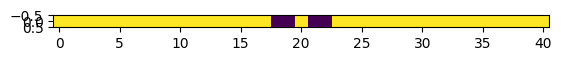

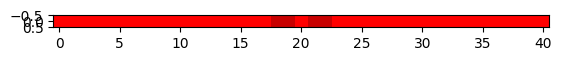

nda_3DXX2_arrProbmap.shape:  (1, 41, 2)
np.unique(nda_3DXX2_arrProbmap[:,:,0]):  [0.49 0.51]
np.unique(nda_3DXX2_arrProbmap[:,:,1]):  [0.49 0.51]
nda_3DXX2_arrProbmap.shape:  (1, 41, 2)
nda_3DXX2_arrProbmap[:,:,0].shape:  (1, 41)
nda_3DXX2_arrProbmap[:,:,1].shape:  (1, 41)


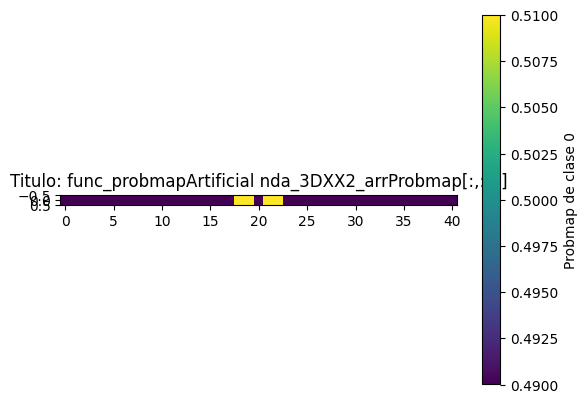

##########################################


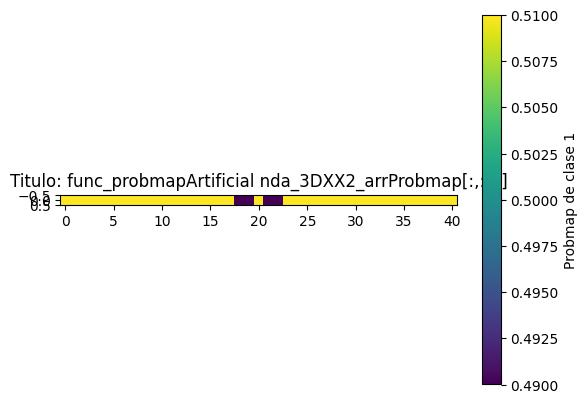

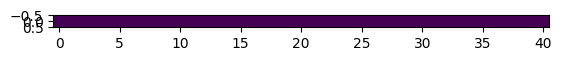

Conclusion1: Para int_ancho1=0, img 1 x 41 sdxy=(1,1), sdrgb=(1,1,1), si el fondo lo pongo de (253,0,0), no suaviza el pixel rojo (255), si lo pongo de 254 si suaviza el pixel rojo del medio (255)
Conclusion1: Para int_ancho1=0, img 1 x 41 sdxy=(1,1), sdrgb=(2,2,2), si el fondo lo pongo de (252,0,0), no suaviza el pixel rojo (255), si lo pongo de 253 si suaviza el pixel rojo del medio (255)
Conclusion1: Para int_ancho1=0, img 1 x 41 sdxy=(1,1), fondo=(100,0,0), Si a sdrgb=(120,120,120), no suaviza. sdrgb=(121,121,121), sí suaviza
Conclusion1: Para int_ancho1=0, img 1 x 41 sdxy=(1,1), fondo=(100,0,0), Si a sdrgb=(120,DALOMISMO,DALOMISMO), no suaviza. sdrgb=(121,DALOMISMO,DALOMISMO), sí suaviza. En realidad se prueba que en este caso solo el sdR del sdRGB es el que importa
Conclusion1: Para img 1 x 41 sdxy=(1,1), fondo=(253,0,0), Si a sdrgb=(2,10000 DALOMISMO, 10000 DALOMISMO), solo con un valor alto int_ancho1=37 el pixel del medio no se suaviza, con int_ancho1=35 y menores se suaviza e

In [61]:
if __name__ == "__main__":
    objeto_class_CRF_Tests4=class_CRF_Tests4()#20230609
    objeto_class_CRF_Tests4()#20230609
    
    
    #objeto_class_CRF_Tests2=class_CRF_Tests2()#20230609
    #objeto_class_CRF_Tests2()#20230609
    
    #objeto_class_CRF_Tests=class_CRF_Tests()
    #objeto_class_CRF_Tests()

Plotear MASCARA imperfecta respecto a RAW


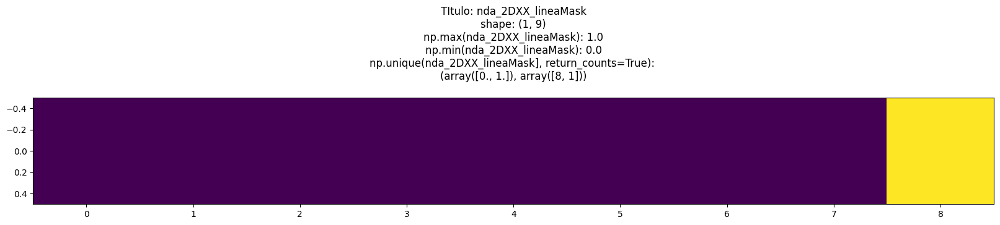

####################################
####################################
####################################
####################################
Plotear RAW


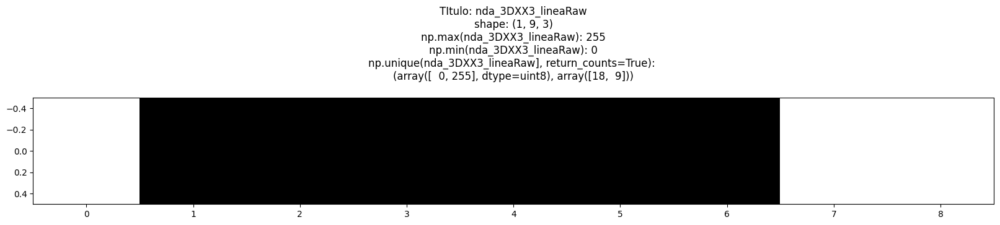

####################################
####################################
####################################
####################################
nda_3DXX2_arrProbmap.shape:  (1, 9, 2)
np.unique(nda_3DXX2_arrProbmap[:,:,0]):  [0.49 0.51]
np.unique(nda_3DXX2_arrProbmap[:,:,1]):  [0.49 0.51]
nda_3DXX2_arrProbmap.shape:  (1, 9, 2)
nda_3DXX2_arrProbmap[:,:,0].shape:  (1, 9)
nda_3DXX2_arrProbmap[:,:,1].shape:  (1, 9)
Plotear PROBDLMAP
Probmaps nda_3DXX2_ProbDLmap
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0], return_counts=True):  (array([0.49, 0.51]), array([1, 8]))
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1], return_counts=True):  (array([0.49, 0.51]), array([8, 1]))


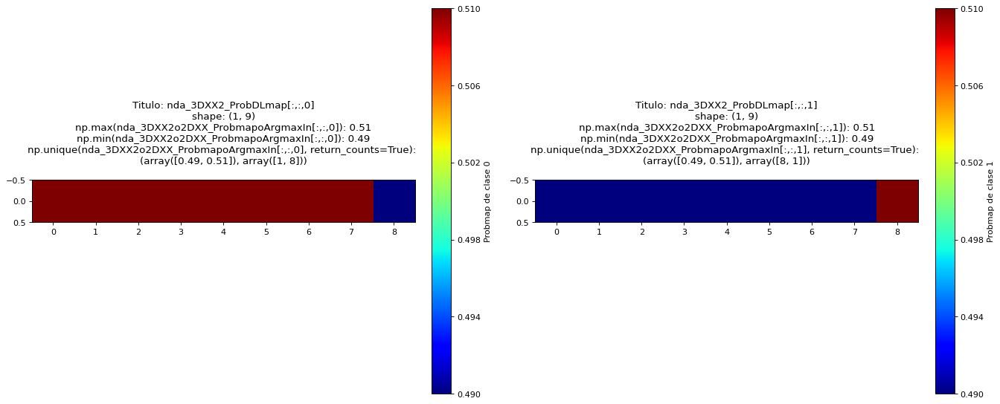

Plotear PROBDLMAP_ARGMAX
Segmentación (es argmax)nda_3DXX2_ProbDLmap_Argmax
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn, return_counts=True):  (array([0, 1]), array([8, 1]))


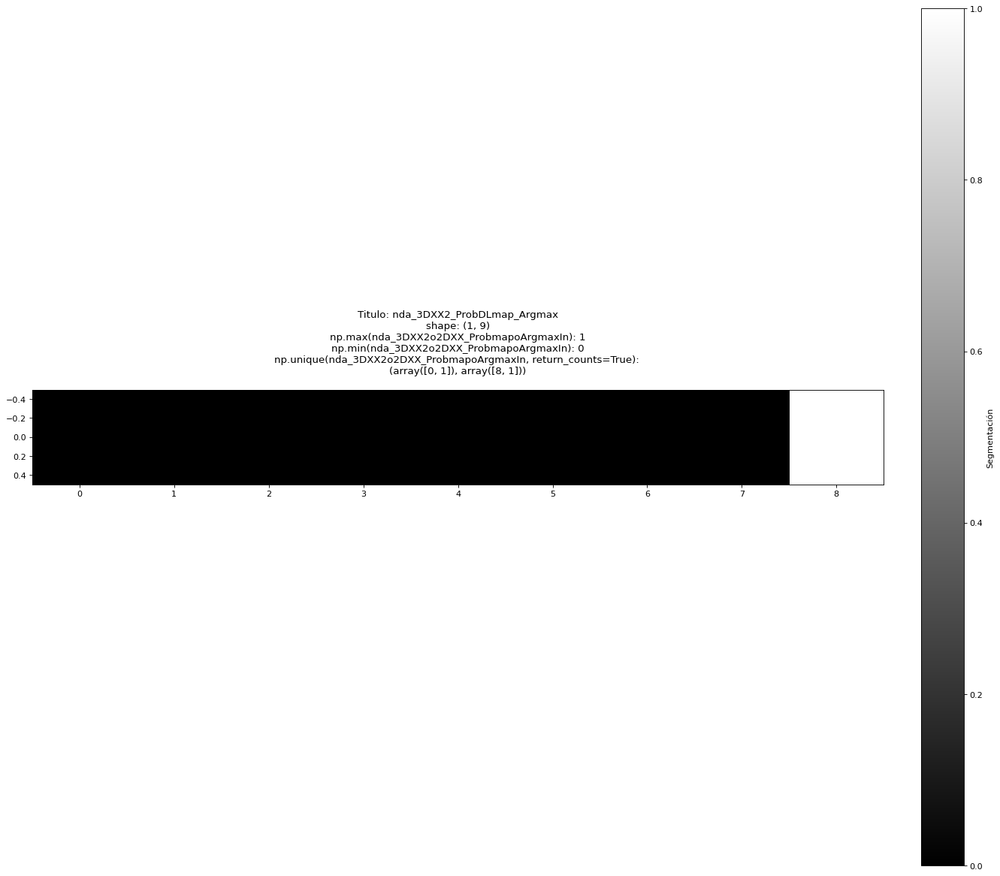

PROB_CRF
PROB_CRF
PROB_CRF
Plotear PROBCRFMAP
Probmaps nda_3DXX2_ProbCRFmap
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0], return_counts=True):  (array([0.876918  , 0.8853003 , 0.88532925, 0.9848108 , 0.98481256,
       0.98481435, 0.9848162 , 0.9848179 , 0.98481965], dtype=float32), array([1, 1, 1, 1, 1, 1, 1, 1, 1]))
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1], return_counts=True):  (array([0.01518037, 0.01518213, 0.01518389, 0.01518564, 0.01518739,
       0.01518916, 0.11467071, 0.11469974, 0.12308196], dtype=float32), array([1, 1, 1, 1, 1, 1, 1, 1, 1]))


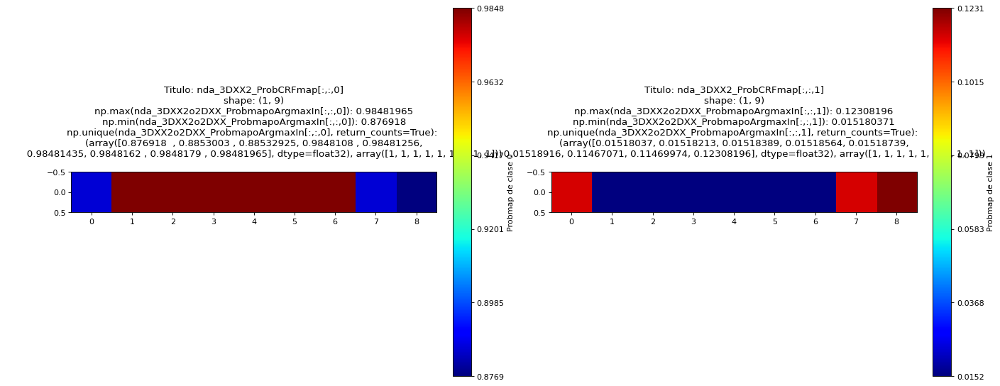

Plotear PROBCRFMAP_Argmax
Segmentación (es argmax)nda_2DXX_ProbCRFmap_Argmax
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn, return_counts=True):  (array([0]), array([9]))


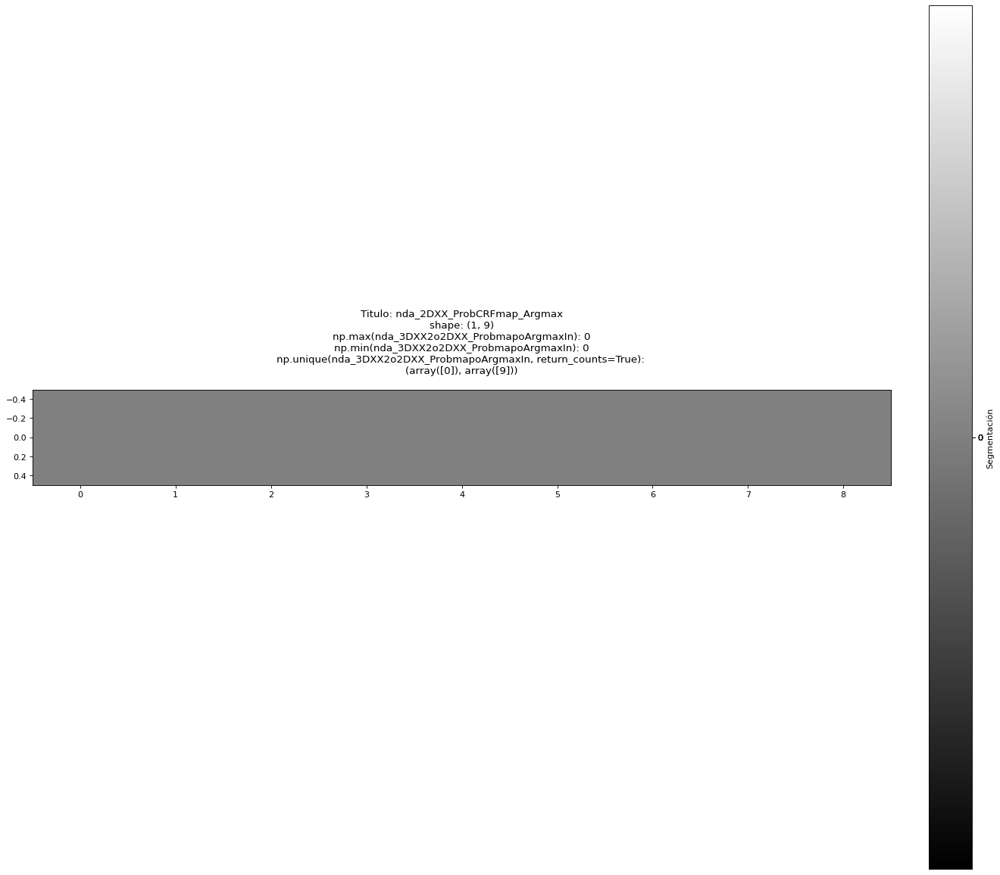

#########################################################################################################
#########################################################################################################
#########################################################################################################
En este caso si agrego otro pixel con la clase 1 mejora el caso pasado
Plotear MASCARA imperfecta respecto a RAW


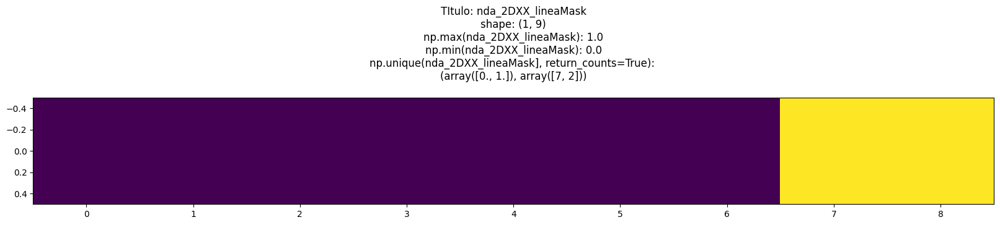

####################################
####################################
####################################
####################################
Plotear RAW


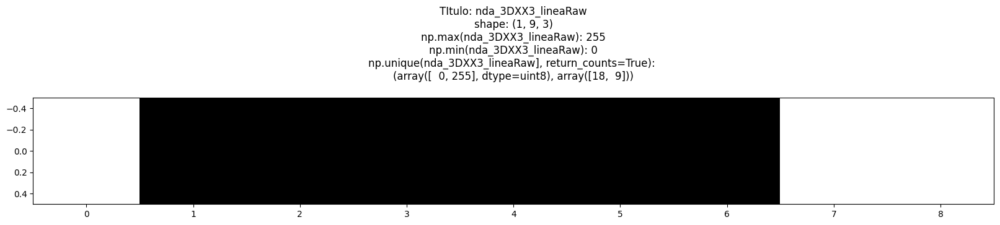

####################################
####################################
####################################
####################################
nda_3DXX2_arrProbmap.shape:  (1, 9, 2)
np.unique(nda_3DXX2_arrProbmap[:,:,0]):  [0.49 0.51]
np.unique(nda_3DXX2_arrProbmap[:,:,1]):  [0.49 0.51]
nda_3DXX2_arrProbmap.shape:  (1, 9, 2)
nda_3DXX2_arrProbmap[:,:,0].shape:  (1, 9)
nda_3DXX2_arrProbmap[:,:,1].shape:  (1, 9)
Plotear PROBDLMAP
Probmaps nda_3DXX2_ProbDLmap
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0], return_counts=True):  (array([0.49, 0.51]), array([2, 7]))
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1], return_counts=True):  (array([0.49, 0.51]), array([7, 2]))


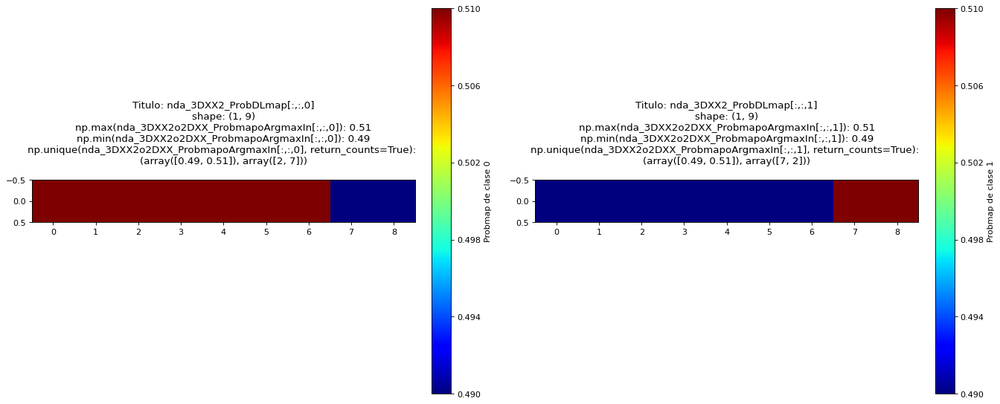

Plotear PROBDLMAP_ARGMAX
Segmentación (es argmax)nda_3DXX2_ProbDLmap_Argmax
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn, return_counts=True):  (array([0, 1]), array([7, 2]))


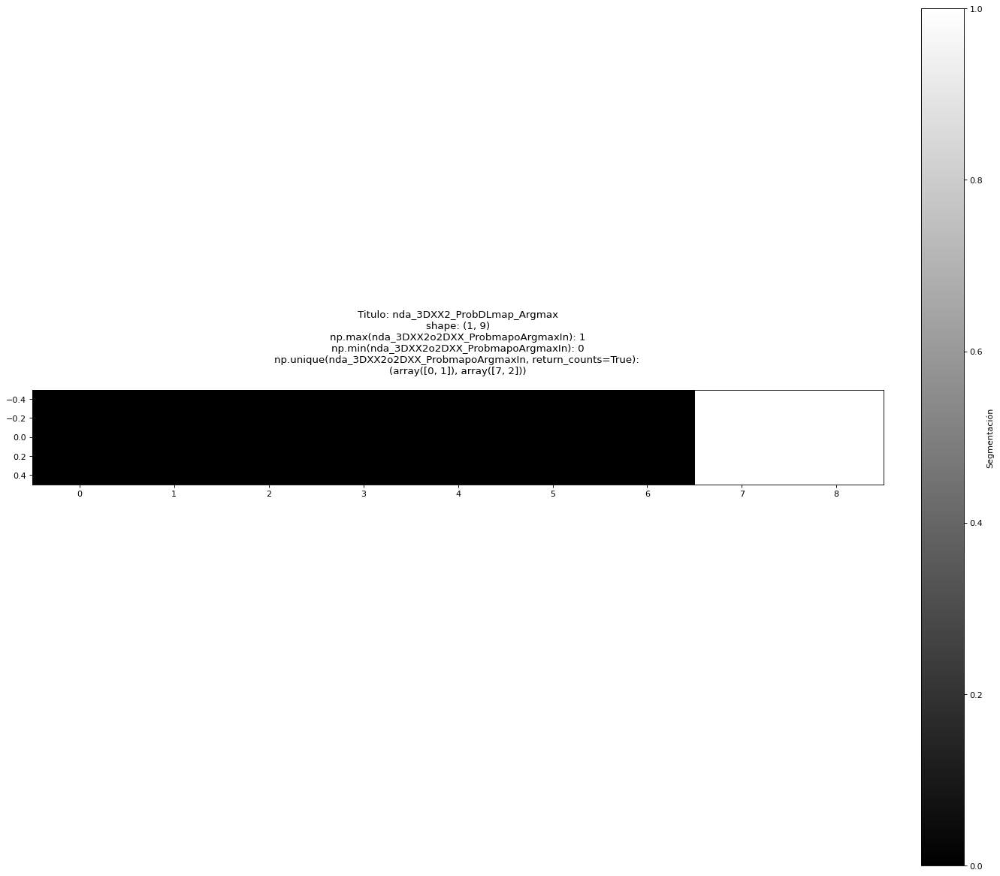

PROB_CRF
PROB_CRF
PROB_CRF
Plotear PROBCRFMAP
Probmaps nda_3DXX2_ProbCRFmap
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0], return_counts=True):  (array([0.11475151, 0.11475509, 0.12310227, 0.9848108 , 0.98481256,
       0.98481435, 0.9848162 , 0.9848179 , 0.98481965], dtype=float32), array([1, 1, 1, 1, 1, 1, 1, 1, 1]))
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1], return_counts=True):  (array([0.01518037, 0.01518213, 0.01518389, 0.01518564, 0.01518739,
       0.01518916, 0.87689775, 0.8852449 , 0.88524854], dtype=float32), array([1, 1, 1, 1, 1, 1, 1, 1, 1]))


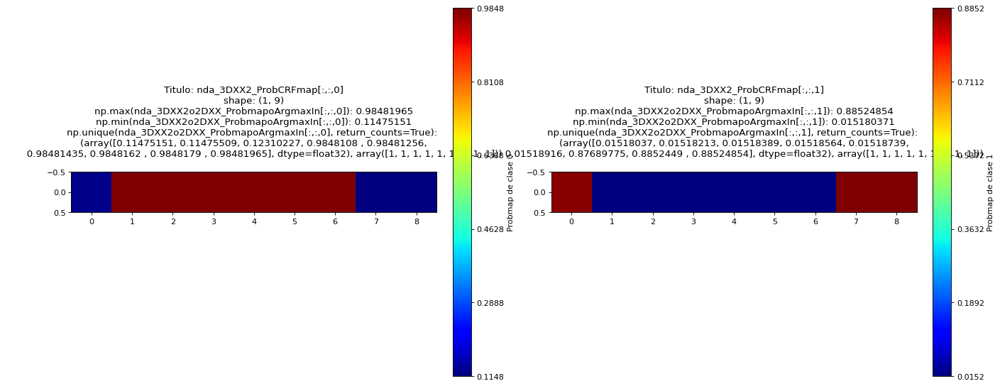

Plotear PROBCRFMAP_Argmax
Segmentación (es argmax)nda_2DXX_ProbCRFmap_Argmax
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn, return_counts=True):  (array([0, 1]), array([6, 3]))


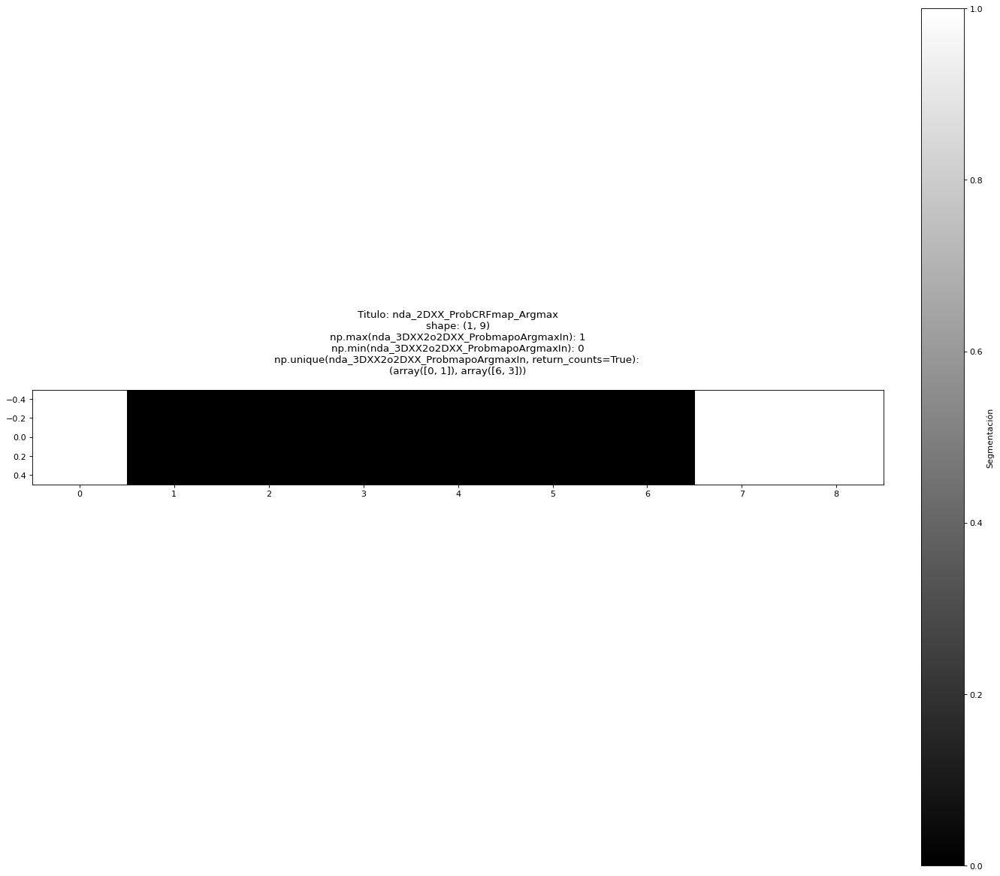

#########################################################################################################
#########################################################################################################
#########################################################################################################
Plotear MASCARA imperfecta respecto a RAW


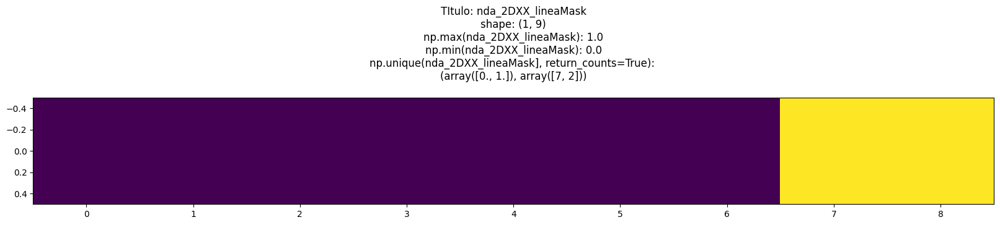

####################################
####################################
####################################
####################################
Plotear RAW


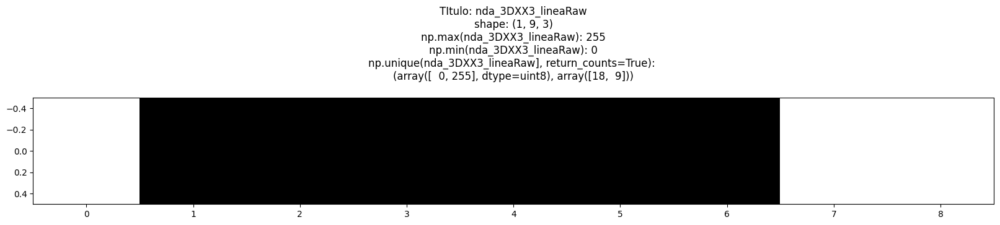

####################################
####################################
####################################
####################################
nda_3DXX2_arrProbmap.shape:  (1, 9, 2)
np.unique(nda_3DXX2_arrProbmap[:,:,0]):  [0.49 0.51]
np.unique(nda_3DXX2_arrProbmap[:,:,1]):  [0.49 0.51]
nda_3DXX2_arrProbmap.shape:  (1, 9, 2)
nda_3DXX2_arrProbmap[:,:,0].shape:  (1, 9)
nda_3DXX2_arrProbmap[:,:,1].shape:  (1, 9)
Plotear PROBDLMAP
Probmaps nda_3DXX2_ProbDLmap
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0], return_counts=True):  (array([0.49, 0.51]), array([2, 7]))
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1], return_counts=True):  (array([0.49, 0.51]), array([7, 2]))


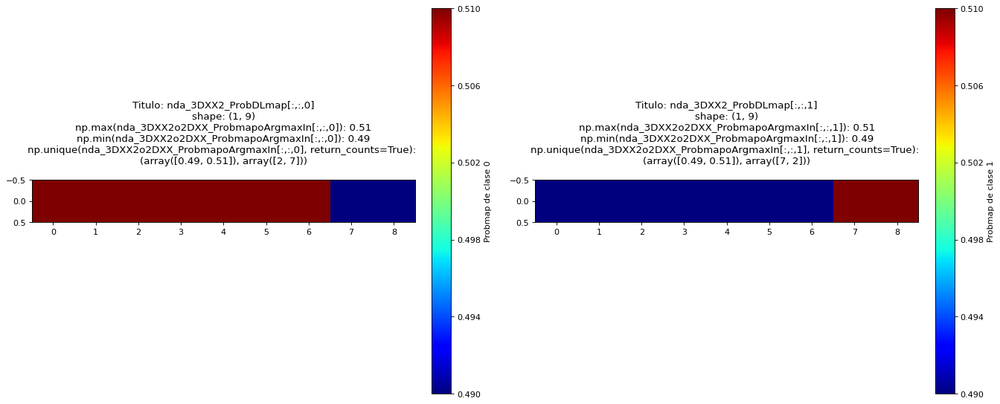

Plotear PROBDLMAP_ARGMAX
Segmentación (es argmax)nda_3DXX2_ProbDLmap_Argmax
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn, return_counts=True):  (array([0, 1]), array([7, 2]))


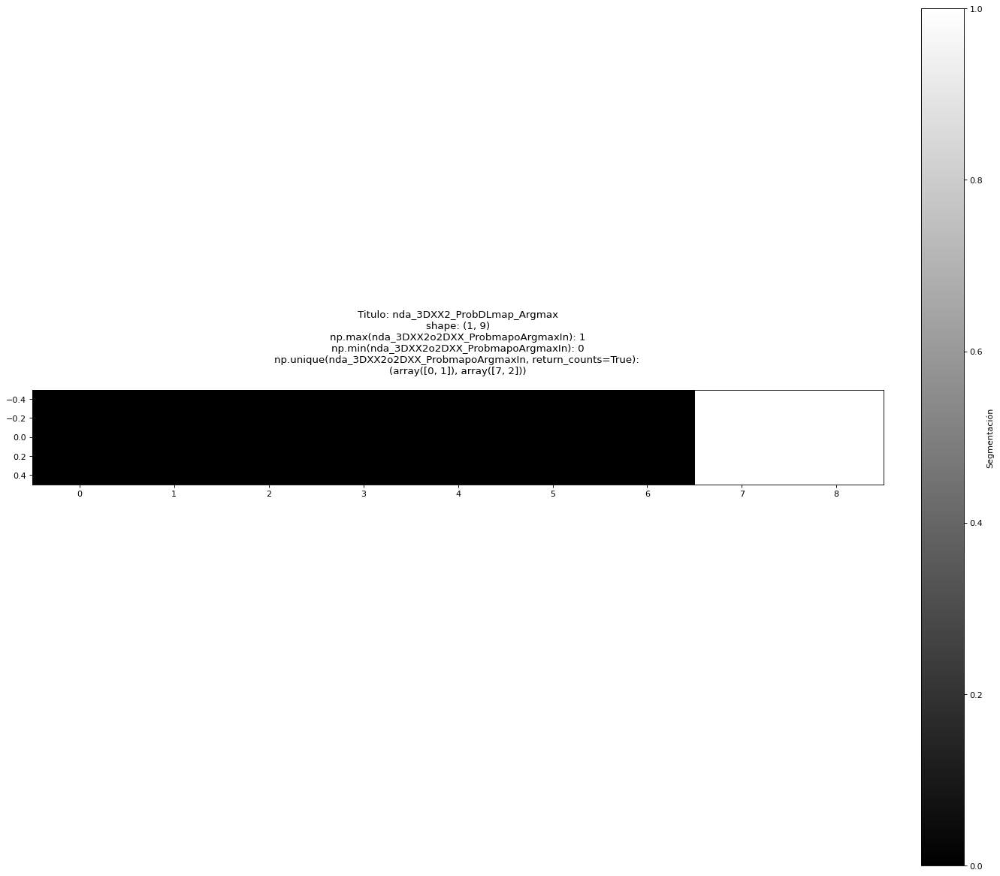

PROB_CRF
PROB_CRF
PROB_CRF
Plotear PROBCRFMAP
Probmaps nda_3DXX2_ProbCRFmap
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0], return_counts=True):  (array([0.03318888, 0.03765224, 0.16494507, 0.98226064, 0.9838914 ,
       0.9850057 , 0.9853758 , 0.9857347 , 0.986083  ], dtype=float32), array([1, 1, 1, 1, 1, 1, 1, 1, 1]))
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1], return_counts=True):  (array([0.01391706, 0.01426527, 0.01462422, 0.01499427, 0.01610859,
       0.01773937, 0.83505493, 0.96234775, 0.9668111 ], dtype=float32), array([1, 1, 1, 1, 1, 1, 1, 1, 1]))


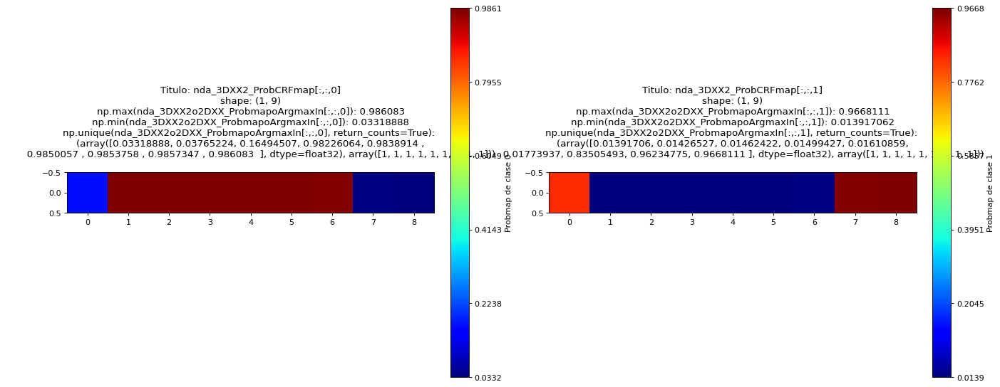

Plotear PROBCRFMAP_Argmax
Segmentación (es argmax)nda_2DXX_ProbCRFmap_Argmax
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn, return_counts=True):  (array([0, 1]), array([6, 3]))


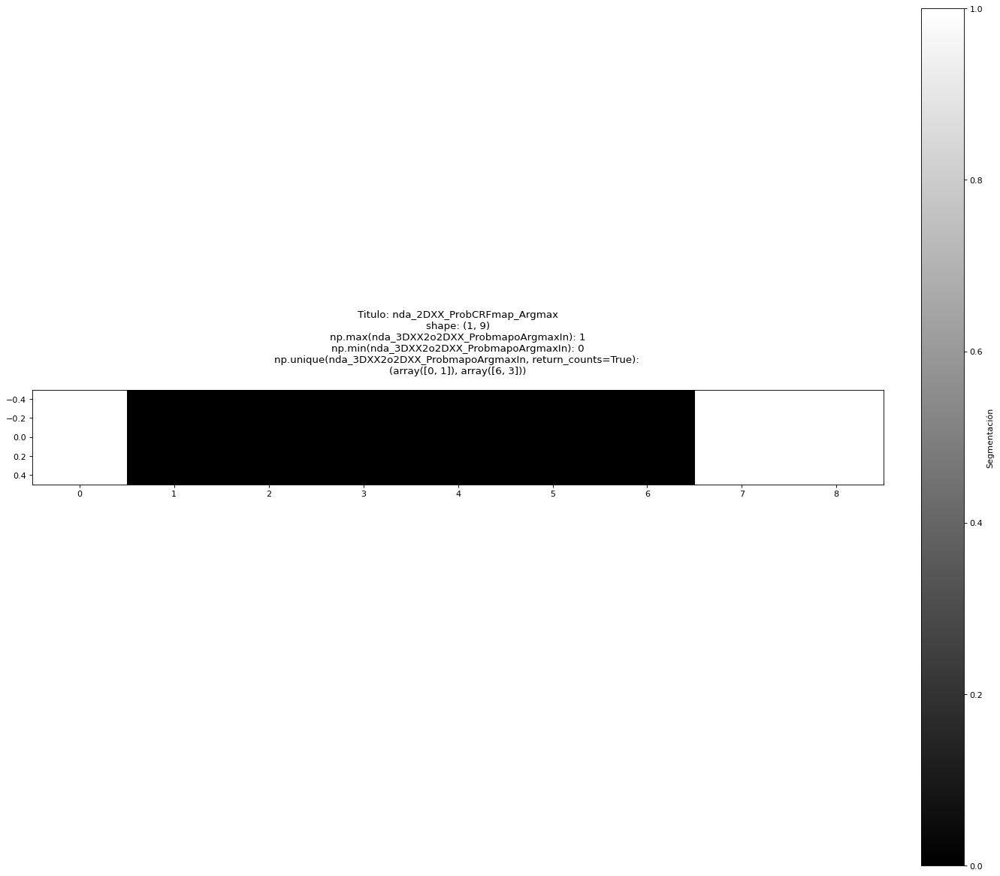

#########################################################################################################
#########################################################################################################
#########################################################################################################
#########################################################################################################
#########################################################################################################
#########################################################################################################
#########################################################################################################
#########################################################################################################
#########################################################################################################


In [62]:
#import numpy as np
#import matplotlib.pyplot as plt
#import class_CRF_Tests
if __name__ == "__main__":
#if ("func_experimentarPydenseCRF"=="func_experimentarPydenseCRF"):
    def func_experimentarPydenseCRF(int_largo, #El largo del trocito
                                    int_CFijoIn2,#Probabilidad
                                    tpl_ParametroXYIn1,#(1,1)
                                    tpl_ParametroRGBIn1,
                                    lst_int_inferenceIn1,
                                    int_pairwisebilateralCompatIn1,
                                    str_PairwiseoKernelIn,#["GaussianoSmoothnessKernel", "BilateraloAppearanceKernel"]
                                    lst_int_pixelesBlancosMask,#Cuales pixeles cambiar
                                    lst_int_pixelesBlancosRaw#Cuales pixeles cambiar
                                   ):
        #if("parametros"=="parametros"):
        if False:
            int_largo=21
            int_CFijoIn2 = 0.51
            tpl_ParametroXYIn1=(10000,10000)#(1,1)
            tpl_ParametroRGBIn1=(1,1,1)
            lst_int_inferenceIn1=5
            int_pairwisebilateralCompatIn1=5
            str_PairwiseoKernelIn="BilateraloAppearanceKernel"#["GaussianoSmoothnessKernel", "BilateraloAppearanceKernel"]
            lst_int_pixelesBlancosMask=[-1,-2]
            lst_int_pixelesBlancosRaw=[0,-1,-2]
            

        nda_2DXX_lineaMask=np.zeros(shape=(1,int_largo))
        for lst_int_pixelesBlancosMask_i in lst_int_pixelesBlancosMask:
            nda_2DXX_lineaMask[0,lst_int_pixelesBlancosMask_i]=1

        print("Plotear MASCARA imperfecta respecto a RAW")
        plt.figure(figsize=(20, 20))
        plt.imshow(nda_2DXX_lineaMask)
        plt.title("TItulo: "+"nda_2DXX_lineaMask"+"\n"+
                 "shape: "+str(nda_2DXX_lineaMask.shape)+"\n"+
                  "np.max(nda_2DXX_lineaMask): "+ str(np.max(nda_2DXX_lineaMask))+"\n"+
                  "np.min(nda_2DXX_lineaMask): "+ str(np.min(nda_2DXX_lineaMask))+"\n"+
                  "np.unique(nda_2DXX_lineaMask], return_counts=True): \n"+ str(np.unique(nda_2DXX_lineaMask, return_counts=True))+"\n"
                 )
       
        plt.show()



        print("####################################")
        print("####################################")
        print("####################################")
        print("####################################")
        
        nda_3DXX3_lineaRaw=np.zeros(shape=(1,int_largo,3))
        nda_3DXX3_lineaRaw=np.uint8(nda_3DXX3_lineaRaw)

        for lst_int_pixelesBlancosRaw_i in lst_int_pixelesBlancosRaw:
            nda_3DXX3_lineaRaw[0,lst_int_pixelesBlancosRaw_i,:]=255

        print("Plotear RAW")
        plt.figure(figsize=(20, 20))
        plt.imshow(nda_3DXX3_lineaRaw)
        plt.title("TItulo: "+"nda_3DXX3_lineaRaw"+"\n"+
                 "shape: "+str(nda_3DXX3_lineaRaw.shape)+"\n"+
                  "np.max(nda_3DXX3_lineaRaw): "+ str(np.max(nda_3DXX3_lineaRaw))+"\n"+
                  "np.min(nda_3DXX3_lineaRaw): "+ str(np.min(nda_3DXX3_lineaRaw))+"\n"+
                  "np.unique(nda_3DXX3_lineaRaw], return_counts=True): \n"+ str(np.unique(nda_3DXX3_lineaRaw, return_counts=True))+"\n"
                 )
        plt.show()
        #if (str_PairwiseoKernelIn=="GaussianoSmoothnessKernel"):
        #    nda_3DXX3_lineaRaw=None
        

        print("####################################")
        print("####################################")
        print("####################################")
        print("####################################")
        
        nda_3DXX2_ProbDLmap=class_CRF_Tests().func_probmapArtificialX(nda_2DXX_lineaMask, 
                                                                      int_CMaxIn=-1,
                                                                      int_IMaxIn=-1,
                                                                      int_CFijoIn=int_CFijoIn2,
                                                                      boo_AzarIn=False, 
                                                                      int_AzarWeight1In=-1)
        nda_3DXX2_ProbDLmap_Argmax = np.argmax(nda_3DXX2_ProbDLmap, axis=2)

        print("Plotear PROBDLMAP")
        class_CRF_Tests().func_plotearProbmapoArgmax(nda_3DXX2_ProbDLmap,"nda_3DXX2_ProbDLmap")
        
        print("Plotear PROBDLMAP_ARGMAX")
        class_CRF_Tests().func_plotearProbmapoArgmax(nda_3DXX2_ProbDLmap_Argmax,"nda_3DXX2_ProbDLmap_Argmax")


        print("PROB_CRF")
        print("PROB_CRF")
        print("PROB_CRF")
        #tpl_ParametroXYIn1=(1,1)
        #tpl_ParametroRGBIn1=(1,1,1)
        #int_inferenceIn1=5

        nda_3DXX2_ProbCRFmap=class_CRF().func_aplicar_CRF(nda_2DXX_sdXIn=0,
                                                          nda_2DXX_sdYIn=0,
                                                          #nda_3DXX2_probmapIn=nda_3DXX2_ProbDLmapRuido,
                                                          nda_3DXX2_probmapIn=nda_3DXX2_ProbDLmap,
                                                          #tpl_ParametroXYIn=(5,5), 
                                                          tpl_ParametroXYIn=tpl_ParametroXYIn1, 
                                                          #tpl_ParametroRGBIn=(10,10,10), 
                                                          tpl_ParametroRGBIn=tpl_ParametroRGBIn1, 
                                                          nda_3DXX3_imgRawIn=nda_3DXX3_lineaRaw, 
                                                          int_inferenceIn=lst_int_inferenceIn1, 
                                                          int_pairwisebilateralCompatIn=int_pairwisebilateralCompatIn1,
                                                          str_PairwiseoKernel=str_PairwiseoKernelIn)#str_PairwiseoKernel=="BilateraloAppearanceKernel" 
        nda_2DXX_ProbCRFmap_Argmax = np.argmax(nda_3DXX2_ProbCRFmap, axis=2)

        print("Plotear PROBCRFMAP")
        class_CRF_Tests().func_plotearProbmapoArgmax(nda_3DXX2_ProbCRFmap,"nda_3DXX2_ProbCRFmap")

        print("Plotear PROBCRFMAP_Argmax")
        class_CRF_Tests().func_plotearProbmapoArgmax(nda_2DXX_ProbCRFmap_Argmax,"nda_2DXX_ProbCRFmap_Argmax")
        
        return()
    
    
    
    
    
    
    
    
    
    
    int_largo1=9#41
    lst_int_pixelesBlancosRaw1=[0,-1,-2]
    int_CFijoIn21=0.51
    lst_int_inferenceIn11=5
    int_pairwisebilateralCompatIn11=5
    str_PairwiseoKernelIn1="BilateraloAppearanceKernel"
    
    func_experimentarPydenseCRF(int_largo=int_largo1,
                                int_CFijoIn2 =int_CFijoIn21,
                                tpl_ParametroXYIn1=(10000,10000),#(1,1)
                                tpl_ParametroRGBIn1=(1,1,1),
                                lst_int_inferenceIn1=lst_int_inferenceIn11,
                                int_pairwisebilateralCompatIn1=int_pairwisebilateralCompatIn11,
                                str_PairwiseoKernelIn=str_PairwiseoKernelIn1,#["GaussianoSmoothnessKernel", "BilateraloAppearanceKernel"]
                                lst_int_pixelesBlancosMask=[-1],
                                lst_int_pixelesBlancosRaw=lst_int_pixelesBlancosRaw1
                               )
    
    print("#########################################################################################################")
    print("#########################################################################################################")
    print("#########################################################################################################")
    print("En este caso si agrego otro pixel con la clase 1 mejora el caso pasado")
    func_experimentarPydenseCRF(int_largo=int_largo1,
                            int_CFijoIn2 = int_CFijoIn21,
                            tpl_ParametroXYIn1=(10000,10000),#(1,1)
                            tpl_ParametroRGBIn1=(1,1,1),
                            lst_int_inferenceIn1=lst_int_inferenceIn11,
                            int_pairwisebilateralCompatIn1=int_pairwisebilateralCompatIn11,
                            str_PairwiseoKernelIn=str_PairwiseoKernelIn1,#["GaussianoSmoothnessKernel", "BilateraloAppearanceKernel"]
                            lst_int_pixelesBlancosMask=[-1,-2],
                            lst_int_pixelesBlancosRaw=lst_int_pixelesBlancosRaw1
                               )
    
    
    print("#########################################################################################################")
    print("#########################################################################################################")
    print("#########################################################################################################")
    """#En (23,23) clasifica todo correctamente con int_largo1=41. (29,29) clasifica todo bien con int_largo1=51. 
    (17,17) clasifica todo bien con int_largo1=31. (58,58) clasifica todo bien con int_largo1=101. 
    (6,6) clasifica todo bien con int_largo1=11. (2,2) clasifica todo bien con int_largo1=5. (3,3) clasifica todo bien con int_largo1=6. 
    (4,4) clasifica todo bien con int_largo1=7,8. (5,5) clasifica todo bien con int_largo1=9"""
    """Si en mask no pongo 2 pixeles con probmap correcto frente a 1 pixel con probmap incorrecto, entonces no puede corregir este pixel incorrecto """
    """(5,1) clasifica todo bien con int_largo1=9. En este caso da lo mismo y, lo que importa es x, dejar el valor de x alto para que no influya
    ya que la barra solo tiene componente en x y que solo influya el color"""
    
    func_experimentarPydenseCRF(int_largo=int_largo1,
                            int_CFijoIn2 = int_CFijoIn21,
                            tpl_ParametroXYIn1=(5,1),#En (23,23) clasifica todo correctamente con int_largo1=41. (29,29) clasifica todo bien con int_largo1=51. (17,17) clasifica todo bien con int_largo1=31. (58,58) clasifica todo bien con int_largo1=101. (6,6) clasifica todo bien con int_largo1=11. (2,2) clasifica todo bien con int_largo1=5. (3,3) clasifica todo bien con int_largo1=6. (4,4) clasifica todo bien con int_largo1=7,8. (5,5) clasifica todo bien con int_largo1=9
                            tpl_ParametroRGBIn1=(1,1,1),
                            lst_int_inferenceIn1=lst_int_inferenceIn11,
                            int_pairwisebilateralCompatIn1=int_pairwisebilateralCompatIn11,
                            str_PairwiseoKernelIn=str_PairwiseoKernelIn1,#["GaussianoSmoothnessKernel", "BilateraloAppearanceKernel"]
                            lst_int_pixelesBlancosMask=[-1,-2],#[-1,-2]
                            lst_int_pixelesBlancosRaw=lst_int_pixelesBlancosRaw1#lst_int_pixelesBlancosRaw1
                               )
    
    print("#########################################################################################################")
    print("#########################################################################################################")
    print("#########################################################################################################")
    print("#########################################################################################################")
    print("#########################################################################################################")
    print("#########################################################################################################")
    print("#########################################################################################################")
    print("#########################################################################################################")
    print("#########################################################################################################")
    
    

Se suaviza hasta cierto punto
Plotear MASCARA imperfecta respecto a RAW


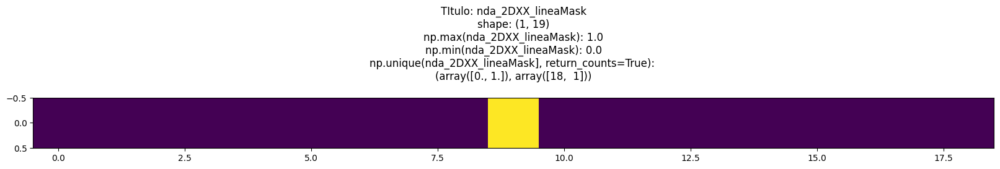

####################################
####################################
####################################
####################################
Plotear RAW


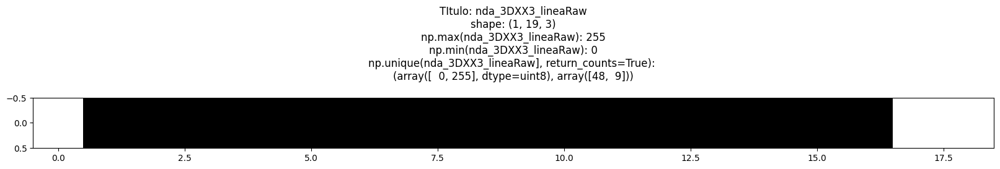

####################################
####################################
####################################
####################################
nda_3DXX2_arrProbmap.shape:  (1, 19, 2)
np.unique(nda_3DXX2_arrProbmap[:,:,0]):  [0.49 0.51]
np.unique(nda_3DXX2_arrProbmap[:,:,1]):  [0.49 0.51]
nda_3DXX2_arrProbmap.shape:  (1, 19, 2)
nda_3DXX2_arrProbmap[:,:,0].shape:  (1, 19)
nda_3DXX2_arrProbmap[:,:,1].shape:  (1, 19)
Plotear PROBDLMAP
Probmaps nda_3DXX2_ProbDLmap
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0], return_counts=True):  (array([0.49, 0.51]), array([ 1, 18]))
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1], return_counts=True):  (array([0.49, 0.51]), array([18,  1]))


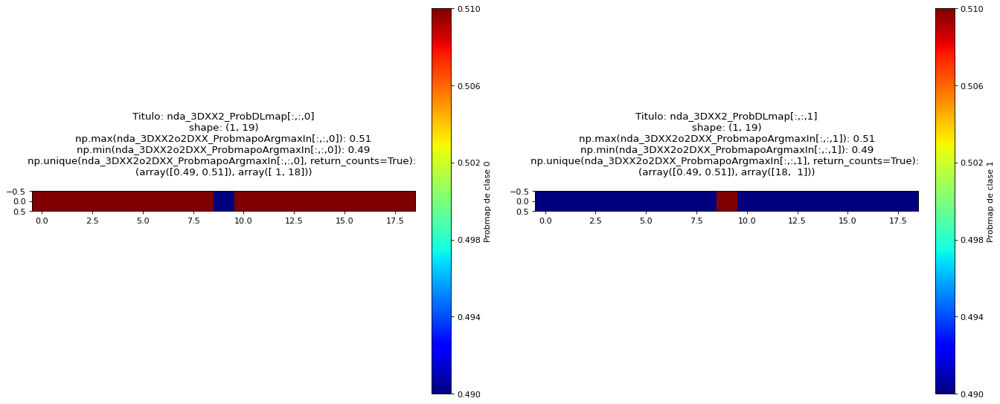

Plotear PROBDLMAP_ARGMAX
Segmentación (es argmax)nda_3DXX2_ProbDLmap_Argmax
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn, return_counts=True):  (array([0, 1]), array([18,  1]))


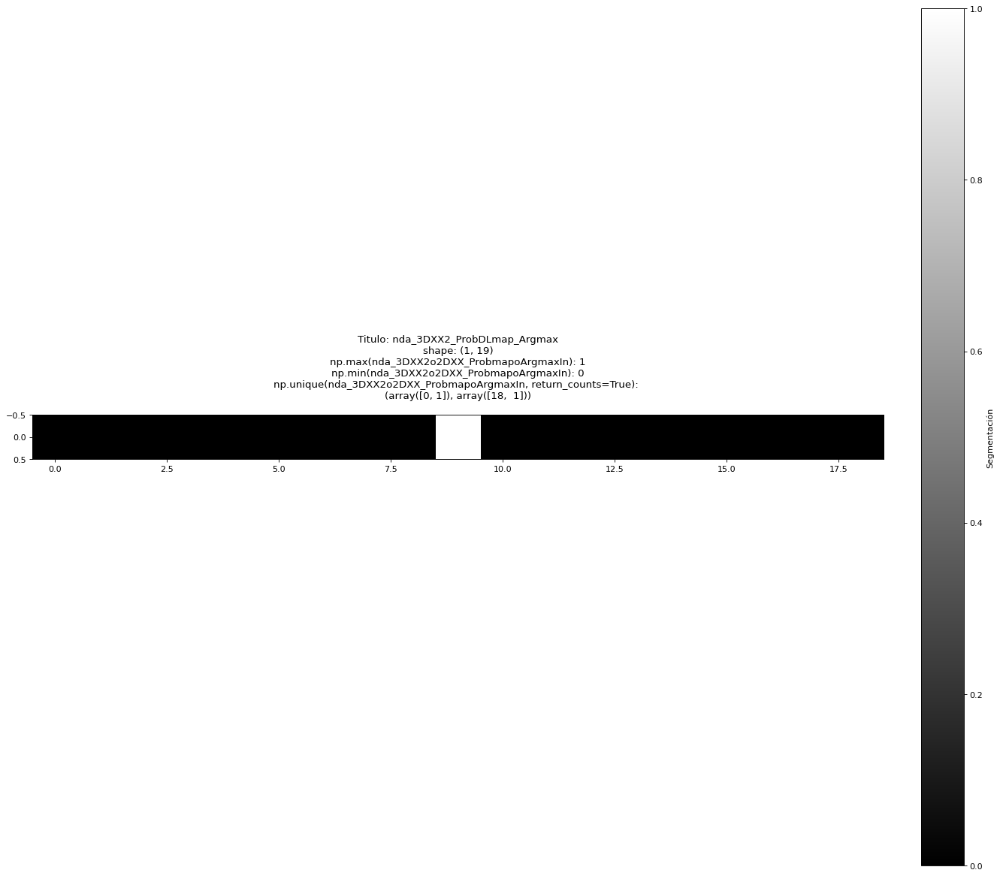

PROB_CRF
PROB_CRF
PROB_CRF
Plotear PROBCRFMAP
Probmaps nda_3DXX2_ProbCRFmap
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0], return_counts=True):  (array([0.95668334, 0.9642678 , 0.9655469 , 0.9734933 , 0.97369325,
       0.97779864, 0.9792574 , 0.9817028 , 0.98195136, 0.98251   ,
       0.9841695 , 0.9841769 , 0.98458546, 0.9848371 , 0.98510736,
       0.9854172 , 0.9857539 , 0.9863034 , 0.9867122 ], dtype=float32), array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]))
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1], return_counts=True):  (array([0.01328779, 0.01369663, 0.01424613, 0.01458283, 0.01489258,
       0.01516286, 0.01541457, 0.01582309, 0.01583053, 0.01749005,
       0.01804862, 0.01829723, 0.02074257, 0.02220134, 0.02630668,
       0.02650672, 0.03445303, 0.03573226, 0.04331667], dtype=float32), array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]))


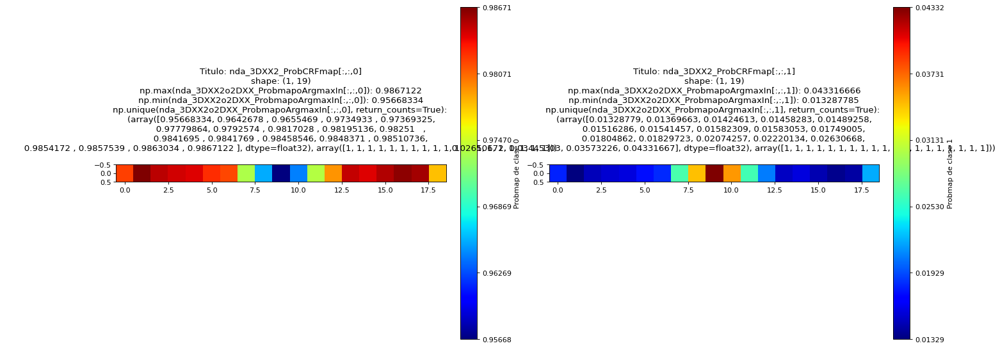

Plotear PROBCRFMAP_Argmax
Segmentación (es argmax)nda_2DXX_ProbCRFmap_Argmax
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn, return_counts=True):  (array([0]), array([19]))


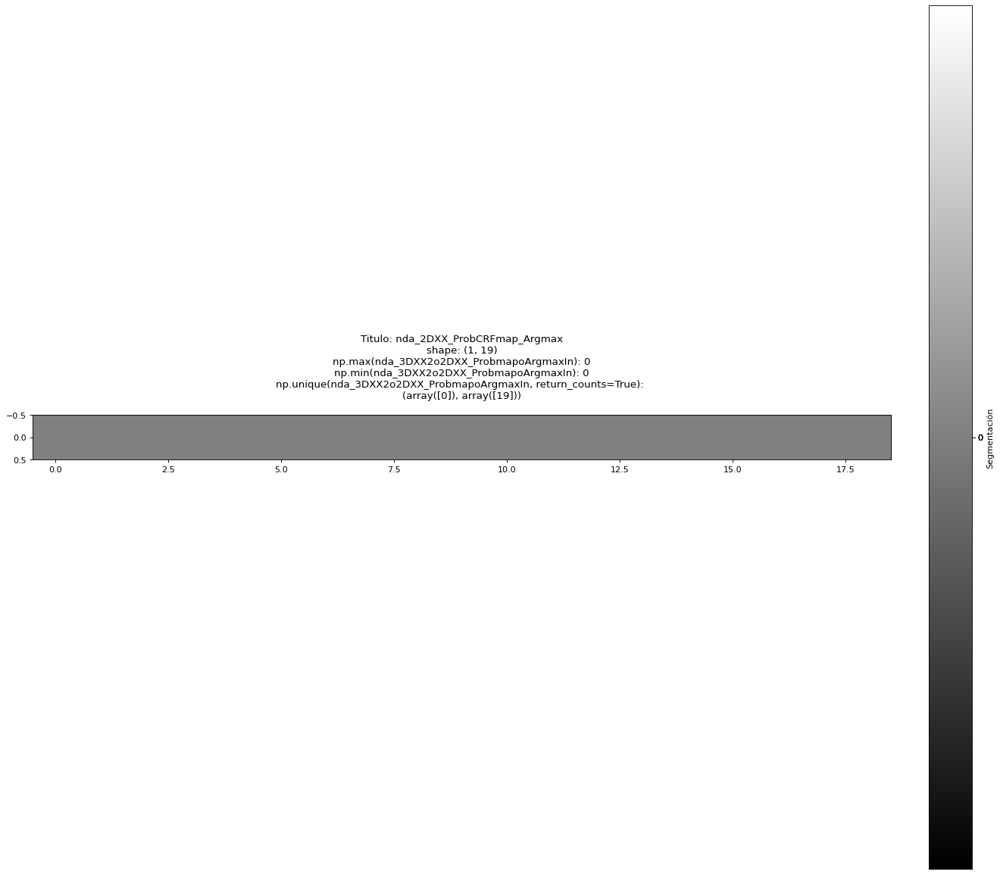

Plotear MASCARA imperfecta respecto a RAW


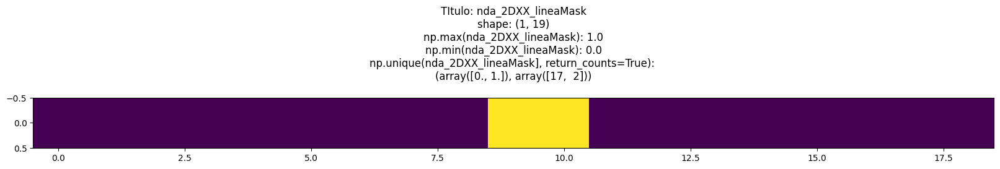

####################################
####################################
####################################
####################################
Plotear RAW


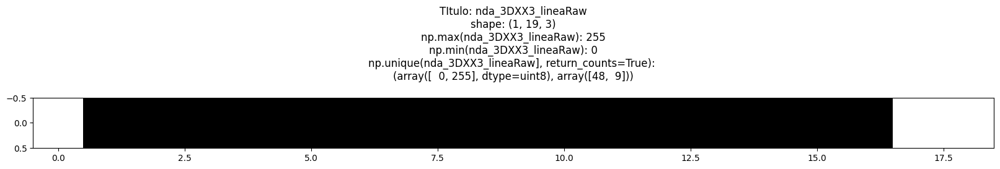

####################################
####################################
####################################
####################################
nda_3DXX2_arrProbmap.shape:  (1, 19, 2)
np.unique(nda_3DXX2_arrProbmap[:,:,0]):  [0.49 0.51]
np.unique(nda_3DXX2_arrProbmap[:,:,1]):  [0.49 0.51]
nda_3DXX2_arrProbmap.shape:  (1, 19, 2)
nda_3DXX2_arrProbmap[:,:,0].shape:  (1, 19)
nda_3DXX2_arrProbmap[:,:,1].shape:  (1, 19)
Plotear PROBDLMAP
Probmaps nda_3DXX2_ProbDLmap
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0], return_counts=True):  (array([0.49, 0.51]), array([ 2, 17]))
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1], return_counts=True):  (array([0.49, 0.51]), array([17,  2]))


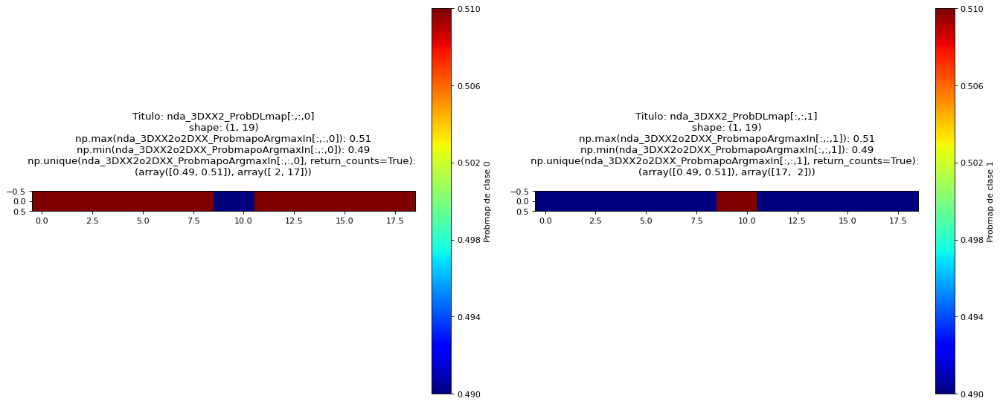

Plotear PROBDLMAP_ARGMAX
Segmentación (es argmax)nda_3DXX2_ProbDLmap_Argmax
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn, return_counts=True):  (array([0, 1]), array([17,  2]))


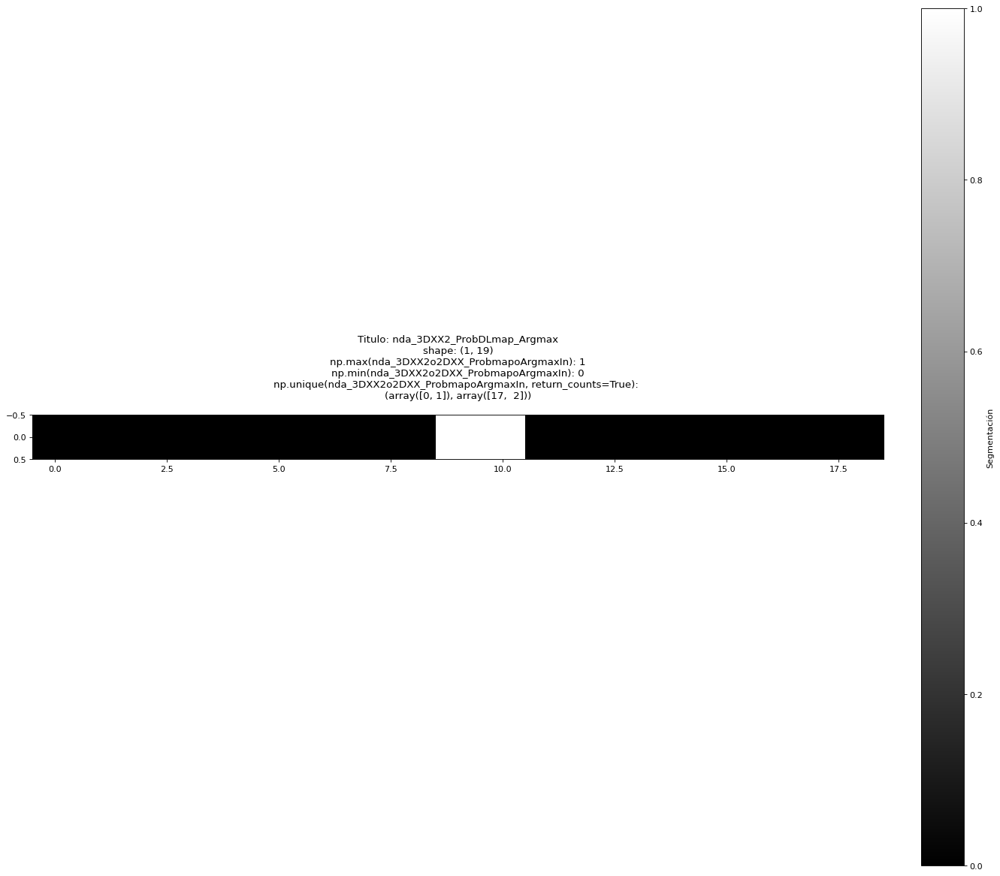

PROB_CRF
PROB_CRF
PROB_CRF
Plotear PROBCRFMAP
Probmaps nda_3DXX2_ProbCRFmap
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0], return_counts=True):  (array([0.8118409 , 0.8142391 , 0.89987147, 0.90395117, 0.9529255 ,
       0.9551869 , 0.97778165, 0.9783226 , 0.9786205 , 0.98153585,
       0.9819079 , 0.98195136, 0.9840073 , 0.98454267, 0.984877  ,
       0.98510045, 0.9857108 , 0.9861438 , 0.98671144], dtype=float32), array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]))
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1], return_counts=True):  (array([0.0132886 , 0.01385617, 0.01428922, 0.01489954, 0.01512296,
       0.01545733, 0.01599276, 0.01804872, 0.01809208, 0.0184641 ,
       0.02137952, 0.02167737, 0.02221828, 0.04481314, 0.04707452,
       0.09604886, 0.10012856, 0.18576086, 0.18815917], dtype=float32), array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]))


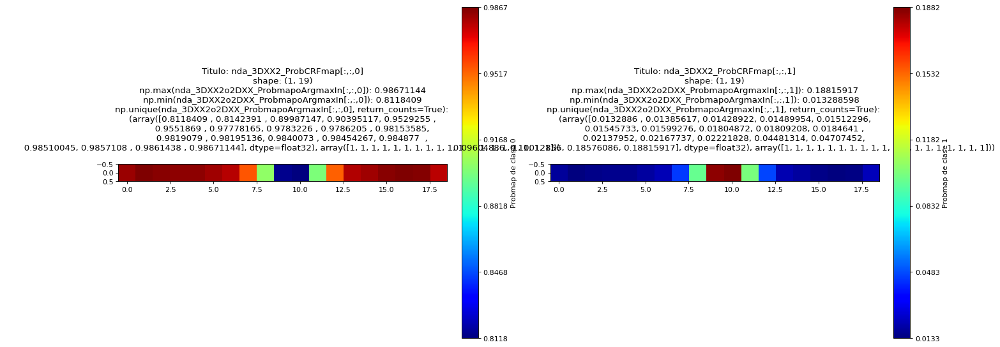

Plotear PROBCRFMAP_Argmax
Segmentación (es argmax)nda_2DXX_ProbCRFmap_Argmax
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn, return_counts=True):  (array([0]), array([19]))


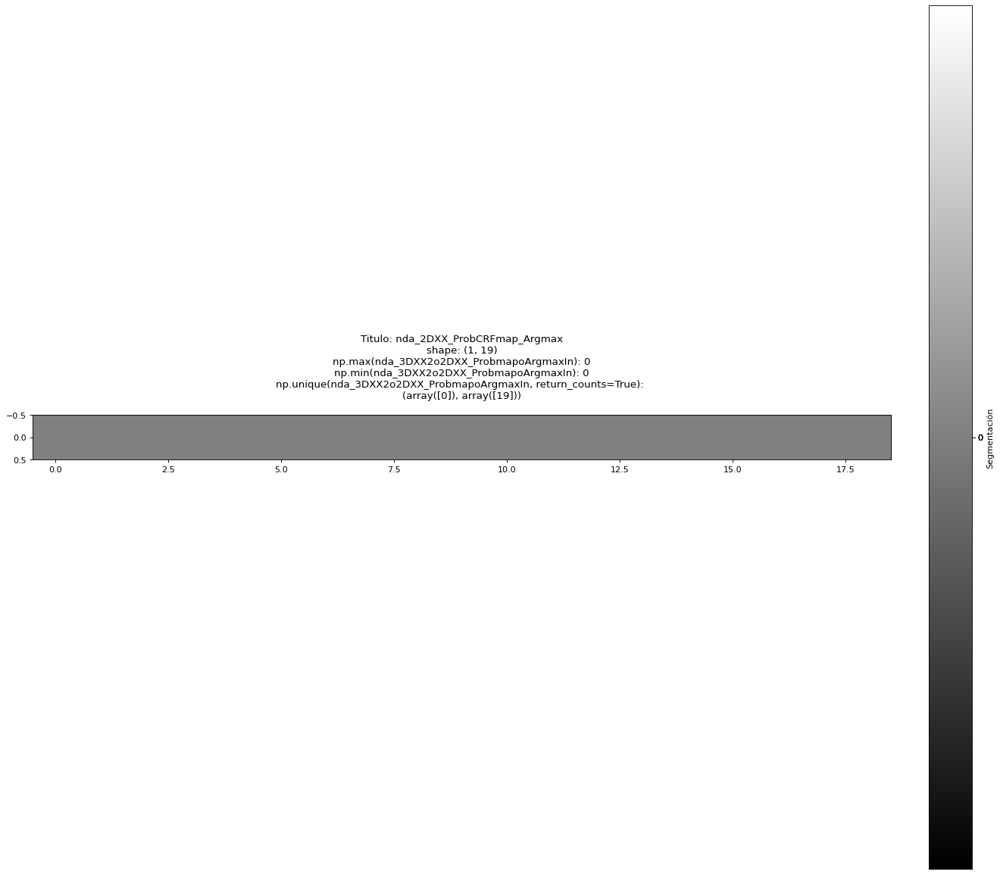

Plotear MASCARA imperfecta respecto a RAW


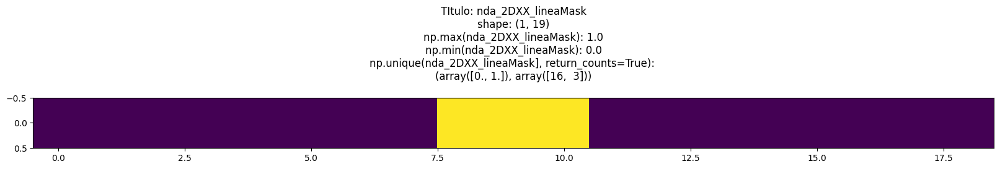

####################################
####################################
####################################
####################################
Plotear RAW


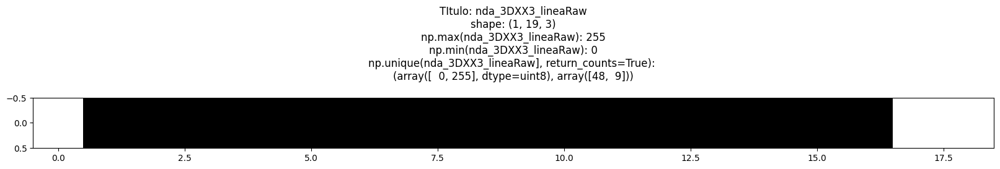

####################################
####################################
####################################
####################################
nda_3DXX2_arrProbmap.shape:  (1, 19, 2)
np.unique(nda_3DXX2_arrProbmap[:,:,0]):  [0.49 0.51]
np.unique(nda_3DXX2_arrProbmap[:,:,1]):  [0.49 0.51]
nda_3DXX2_arrProbmap.shape:  (1, 19, 2)
nda_3DXX2_arrProbmap[:,:,0].shape:  (1, 19)
nda_3DXX2_arrProbmap[:,:,1].shape:  (1, 19)
Plotear PROBDLMAP
Probmaps nda_3DXX2_ProbDLmap
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0], return_counts=True):  (array([0.49, 0.51]), array([ 3, 16]))
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1], return_counts=True):  (array([0.49, 0.51]), array([16,  3]))


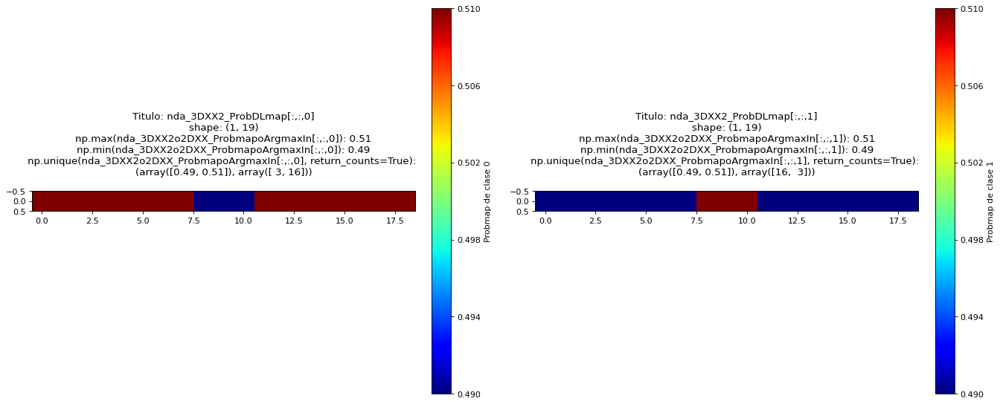

Plotear PROBDLMAP_ARGMAX
Segmentación (es argmax)nda_3DXX2_ProbDLmap_Argmax
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn, return_counts=True):  (array([0, 1]), array([16,  3]))


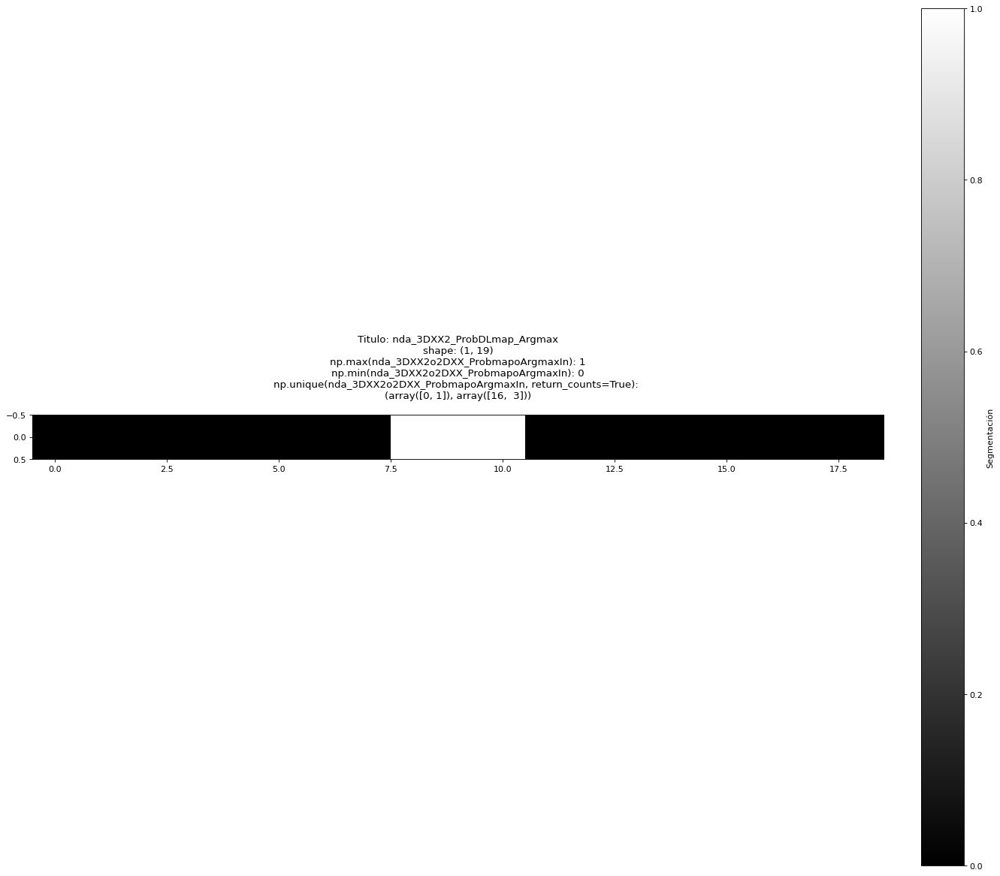

PROB_CRF
PROB_CRF
PROB_CRF
Plotear PROBCRFMAP
Probmaps nda_3DXX2_ProbCRFmap
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0], return_counts=True):  (array([0.41635156, 0.5224529 , 0.5497757 , 0.8048763 , 0.8362614 ,
       0.93479204, 0.9555972 , 0.9751354 , 0.97677416, 0.9777815 ,
       0.98148364, 0.9819442 , 0.9824394 , 0.9840358 , 0.9848321 ,
       0.9849627 , 0.98570955, 0.9861346 , 0.98668516], dtype=float32), array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]))
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1], return_counts=True):  (array([0.01331485, 0.01386544, 0.0142905 , 0.0150373 , 0.01516785,
       0.01596417, 0.01756055, 0.01805578, 0.01851642, 0.02221857,
       0.02322587, 0.02486456, 0.04440274, 0.06520797, 0.16373862,
       0.19512361, 0.45022428, 0.47754714, 0.58364844], dtype=float32), array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]))


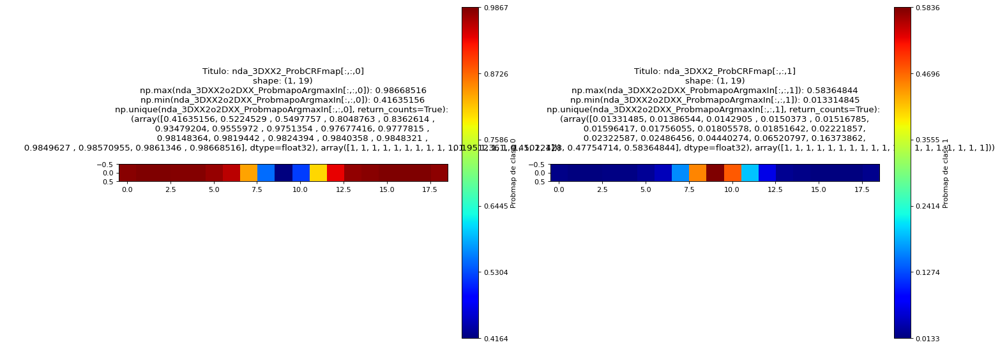

Plotear PROBCRFMAP_Argmax
Segmentación (es argmax)nda_2DXX_ProbCRFmap_Argmax
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn, return_counts=True):  (array([0, 1]), array([18,  1]))


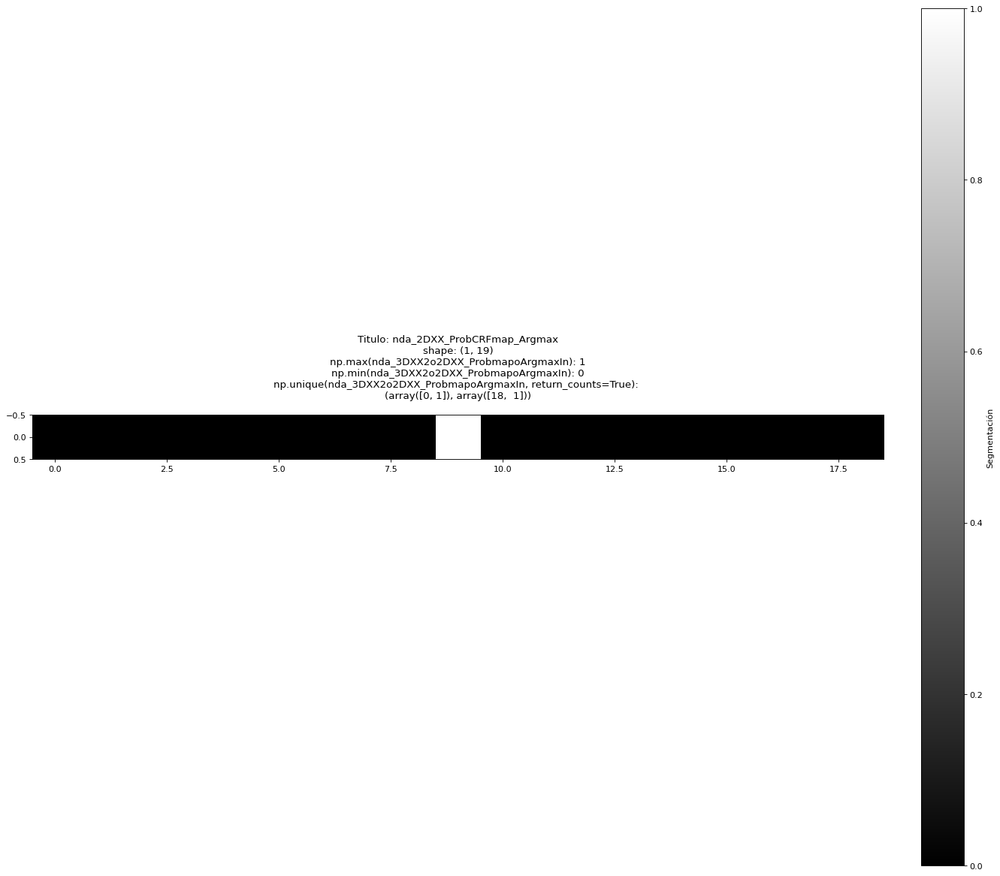

In [63]:
#if ("func_experimentarPydenseCRF"=="func_experimentarPydenseCRF"):    
if __name__ == "__main__":
    print("Se suaviza hasta cierto punto")
    int_largo1=19#41
    lst_int_pixelesBlancosRaw1=[0,-1,-2]
    #lst_int_pixelesBlancosMask1=[int_largo1//2-1,int_largo1//2,int_largo1//2+1]
    lst_int_pixelesBlancosMask1=[int_largo1//2,int_largo1//2+1]
    int_CFijoIn21=0.51
    lst_int_inferenceIn11=5
    int_pairwisebilateralCompatIn11=5
    str_PairwiseoKernelIn1="GaussianoSmoothnessKernel"

    lst_lst_int_pixelesBlancosMask1=[
                                    [int_largo1//2],
                                    [int_largo1//2,int_largo1//2+1],
                                    [int_largo1//2-1,int_largo1//2,int_largo1//2+1],
                                    ]

    for lst_lst_int_pixelesBlancosMask1_i in lst_lst_int_pixelesBlancosMask1:
        func_experimentarPydenseCRF(int_largo=int_largo1,
                                    int_CFijoIn2 =int_CFijoIn21,
                                    tpl_ParametroXYIn1=(1,1),#(1,1)
                                    tpl_ParametroRGBIn1=(1,1,1),
                                    lst_int_inferenceIn1=lst_int_inferenceIn11,
                                    int_pairwisebilateralCompatIn1=int_pairwisebilateralCompatIn11,
                                    str_PairwiseoKernelIn=str_PairwiseoKernelIn1,#["GaussianoSmoothnessKernel", "BilateraloAppearanceKernel"]
                                    lst_int_pixelesBlancosMask=lst_lst_int_pixelesBlancosMask1_i,
                                    lst_int_pixelesBlancosRaw=lst_int_pixelesBlancosRaw1
                                   )

efecto domino tratando?
Plotear MASCARA imperfecta respecto a RAW


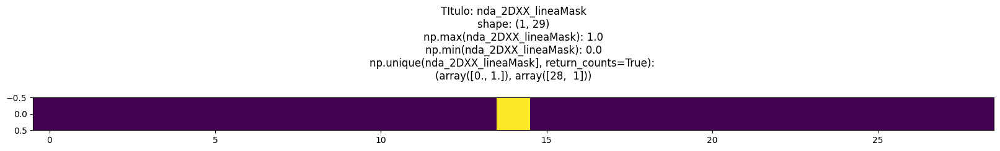

####################################
####################################
####################################
####################################
Plotear RAW


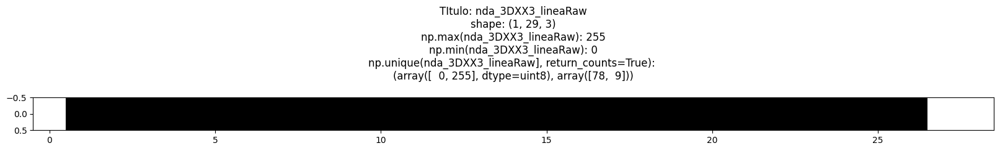

####################################
####################################
####################################
####################################
nda_3DXX2_arrProbmap.shape:  (1, 29, 2)
np.unique(nda_3DXX2_arrProbmap[:,:,0]):  [0.49 0.51]
np.unique(nda_3DXX2_arrProbmap[:,:,1]):  [0.49 0.51]
nda_3DXX2_arrProbmap.shape:  (1, 29, 2)
nda_3DXX2_arrProbmap[:,:,0].shape:  (1, 29)
nda_3DXX2_arrProbmap[:,:,1].shape:  (1, 29)
Plotear PROBDLMAP
Probmaps nda_3DXX2_ProbDLmap
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0], return_counts=True):  (array([0.49, 0.51]), array([ 1, 28]))
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1], return_counts=True):  (array([0.49, 0.51]), array([28,  1]))


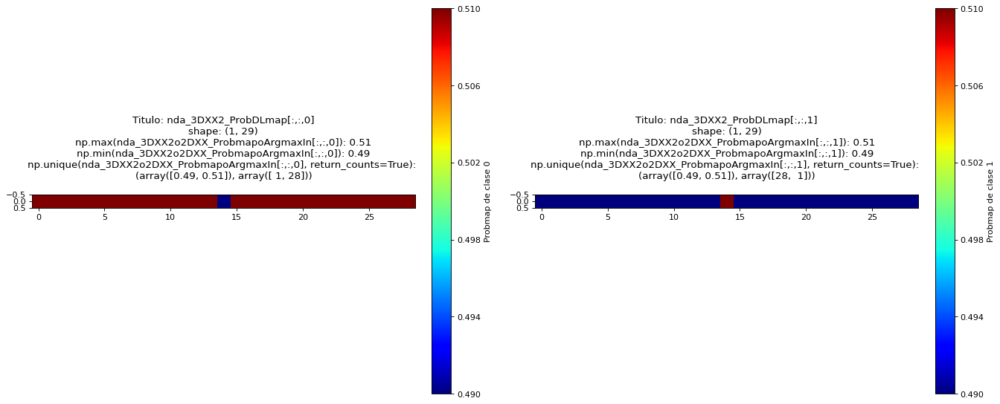

Plotear PROBDLMAP_ARGMAX
Segmentación (es argmax)nda_3DXX2_ProbDLmap_Argmax
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn, return_counts=True):  (array([0, 1]), array([28,  1]))


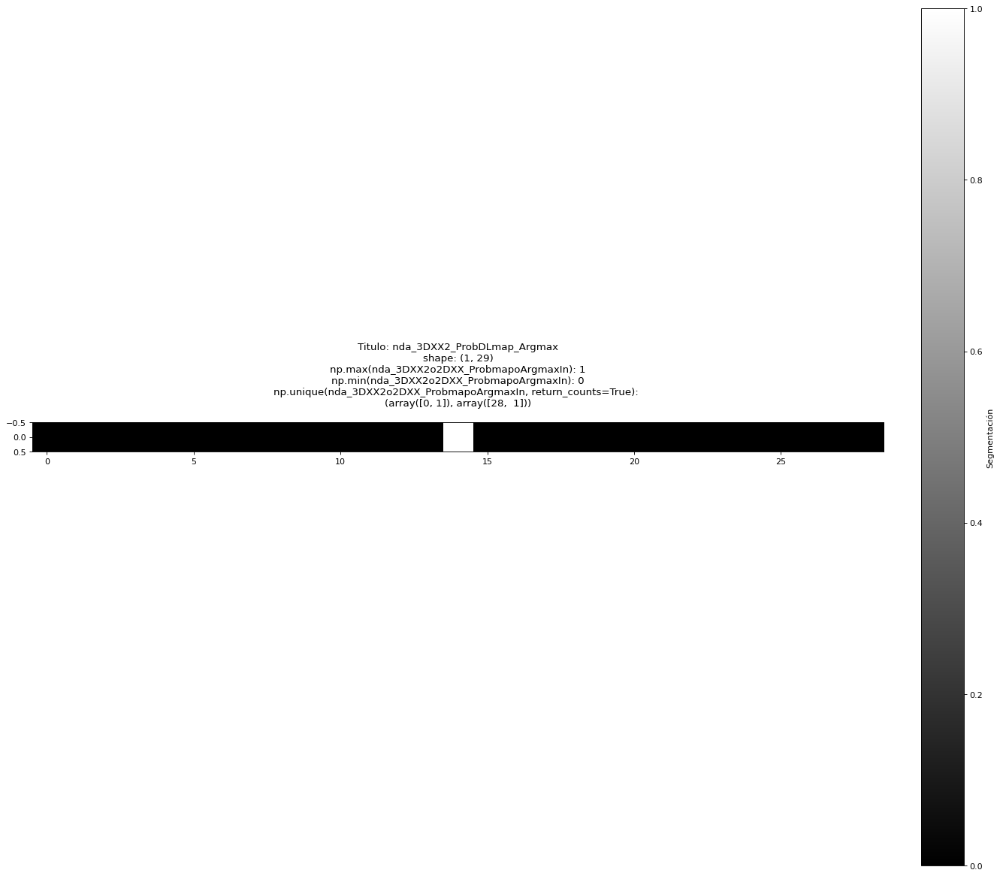

PROB_CRF
PROB_CRF
PROB_CRF
Plotear PROBCRFMAP
Probmaps nda_3DXX2_ProbCRFmap
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0], return_counts=True):  (array([0.9516082 , 0.9611212 , 0.96386117, 0.9715494 , 0.97246313,
       0.9763659 , 0.978111  , 0.9799994 , 0.9819532 , 0.98240304,
       0.98303753, 0.9836194 , 0.9839878 , 0.98427564, 0.98440903,
       0.9845034 , 0.98458016, 0.9845952 , 0.98468876, 0.9847589 ,
       0.984777  , 0.9849786 , 0.98515606, 0.98576933, 0.9860546 ,
       0.98626596, 0.9865979 , 0.98672044, 0.98740476], dtype=float32), array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1]))
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1], return_counts=True):  (array([0.01259522, 0.01327958, 0.01340203, 0.01373401, 0.01394542,
       0.01423074, 0.01484394, 0.01502131, 0.01522298, 0.01524111,
       0.01531123, 0.0154048 , 0.01541985, 0.01549663, 0.01559098,
       0.01572435, 0.01601223, 0.01638062, 0.01696253, 0.01759699,


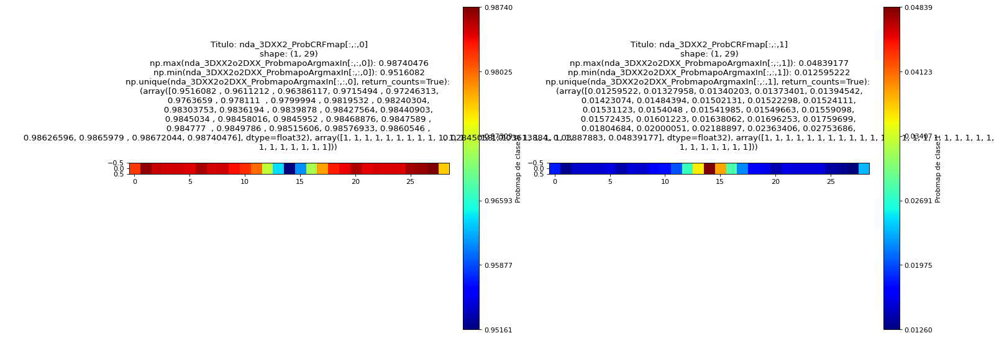

Plotear PROBCRFMAP_Argmax
Segmentación (es argmax)nda_2DXX_ProbCRFmap_Argmax
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn, return_counts=True):  (array([0]), array([29]))


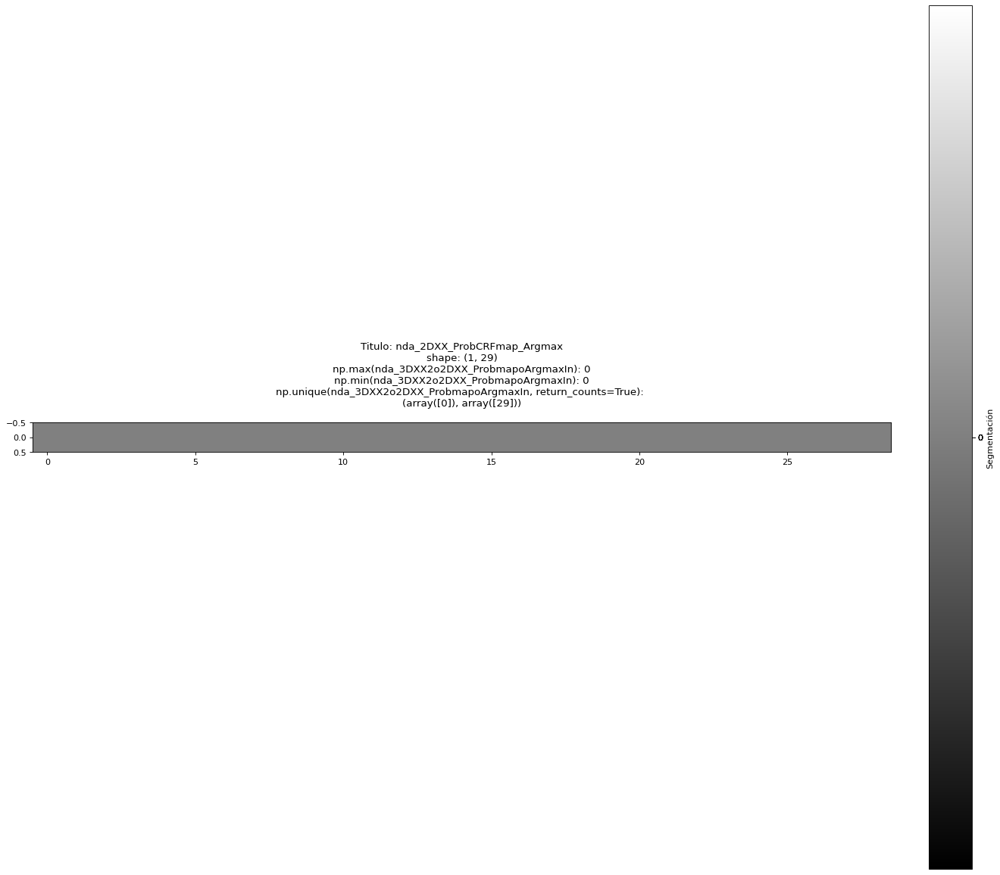

Plotear MASCARA imperfecta respecto a RAW


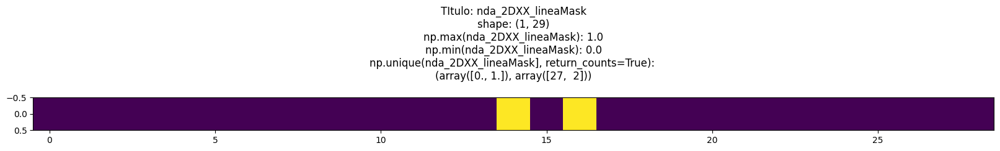

####################################
####################################
####################################
####################################
Plotear RAW


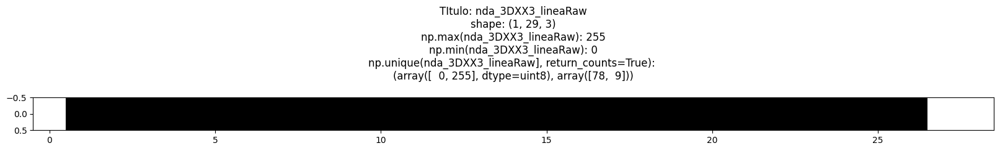

####################################
####################################
####################################
####################################
nda_3DXX2_arrProbmap.shape:  (1, 29, 2)
np.unique(nda_3DXX2_arrProbmap[:,:,0]):  [0.49 0.51]
np.unique(nda_3DXX2_arrProbmap[:,:,1]):  [0.49 0.51]
nda_3DXX2_arrProbmap.shape:  (1, 29, 2)
nda_3DXX2_arrProbmap[:,:,0].shape:  (1, 29)
nda_3DXX2_arrProbmap[:,:,1].shape:  (1, 29)
Plotear PROBDLMAP
Probmaps nda_3DXX2_ProbDLmap
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0], return_counts=True):  (array([0.49, 0.51]), array([ 2, 27]))
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1], return_counts=True):  (array([0.49, 0.51]), array([27,  2]))


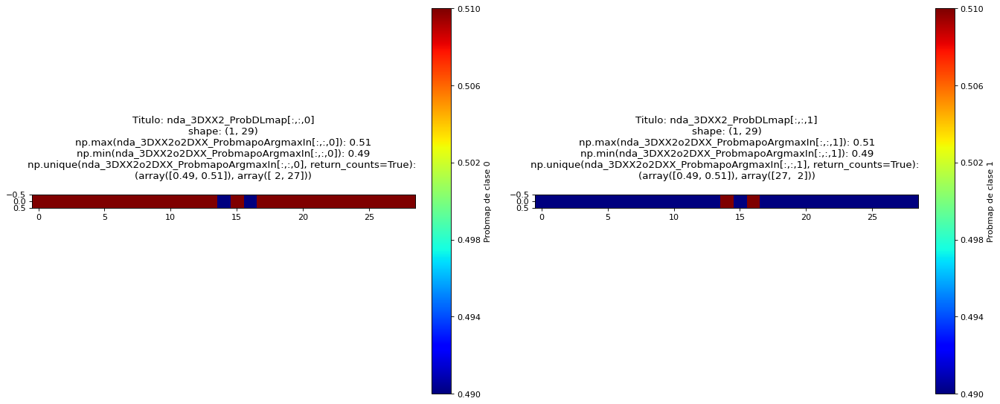

Plotear PROBDLMAP_ARGMAX
Segmentación (es argmax)nda_3DXX2_ProbDLmap_Argmax
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn, return_counts=True):  (array([0, 1]), array([27,  2]))


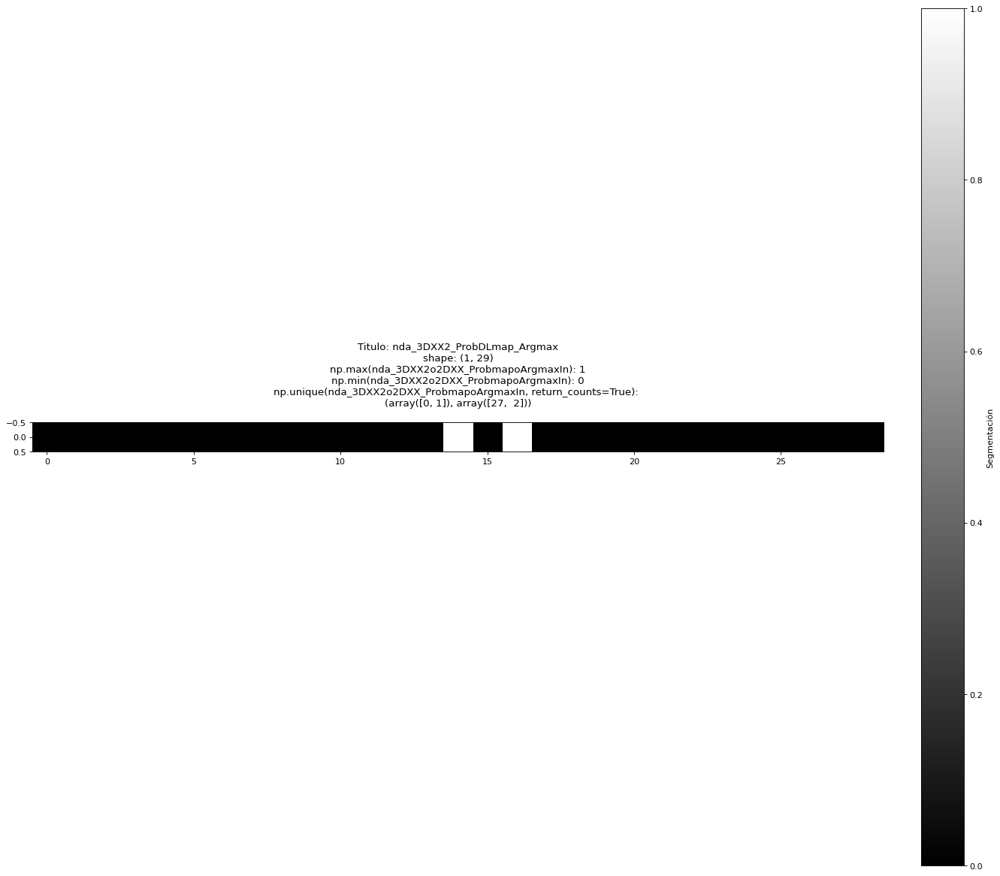

PROB_CRF
PROB_CRF
PROB_CRF
Plotear PROBCRFMAP
Probmaps nda_3DXX2_ProbCRFmap
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0], return_counts=True):  (array([0.836631  , 0.85813504, 0.87234235, 0.93257594, 0.93371814,
       0.96465   , 0.9673854 , 0.9763659 , 0.9782476 , 0.9786942 ,
       0.9819532 , 0.9820842 , 0.9835566 , 0.98369664, 0.98421246,
       0.98440903, 0.9844599 , 0.9844966 , 0.98454326, 0.98468727,
       0.9847589 , 0.984777  , 0.9849675 , 0.98515606, 0.9860545 ,
       0.98626524, 0.9865979 , 0.98672044, 0.98740476], dtype=float32), array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1]))
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1], return_counts=True):  (array([0.01259522, 0.01327958, 0.01340207, 0.01373474, 0.01394549,
       0.01484394, 0.01503244, 0.01522298, 0.01524111, 0.01531277,
       0.01545676, 0.01550336, 0.01554012, 0.01559098, 0.01578756,
       0.0163033 , 0.01644342, 0.01791581, 0.01804684, 0.02130583,


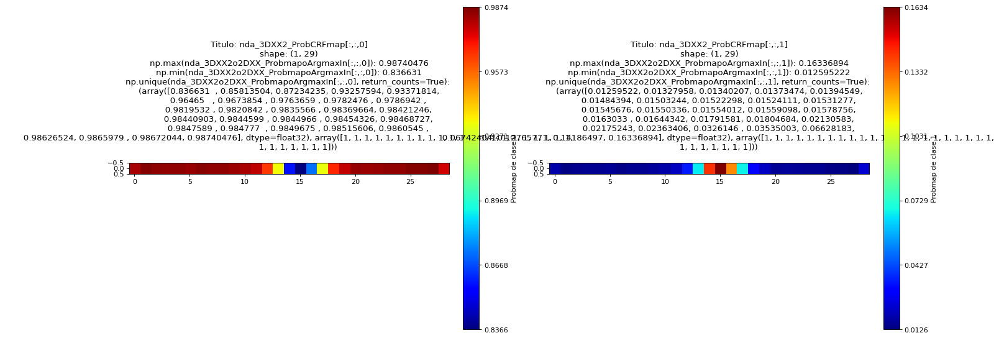

Plotear PROBCRFMAP_Argmax
Segmentación (es argmax)nda_2DXX_ProbCRFmap_Argmax
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn, return_counts=True):  (array([0]), array([29]))


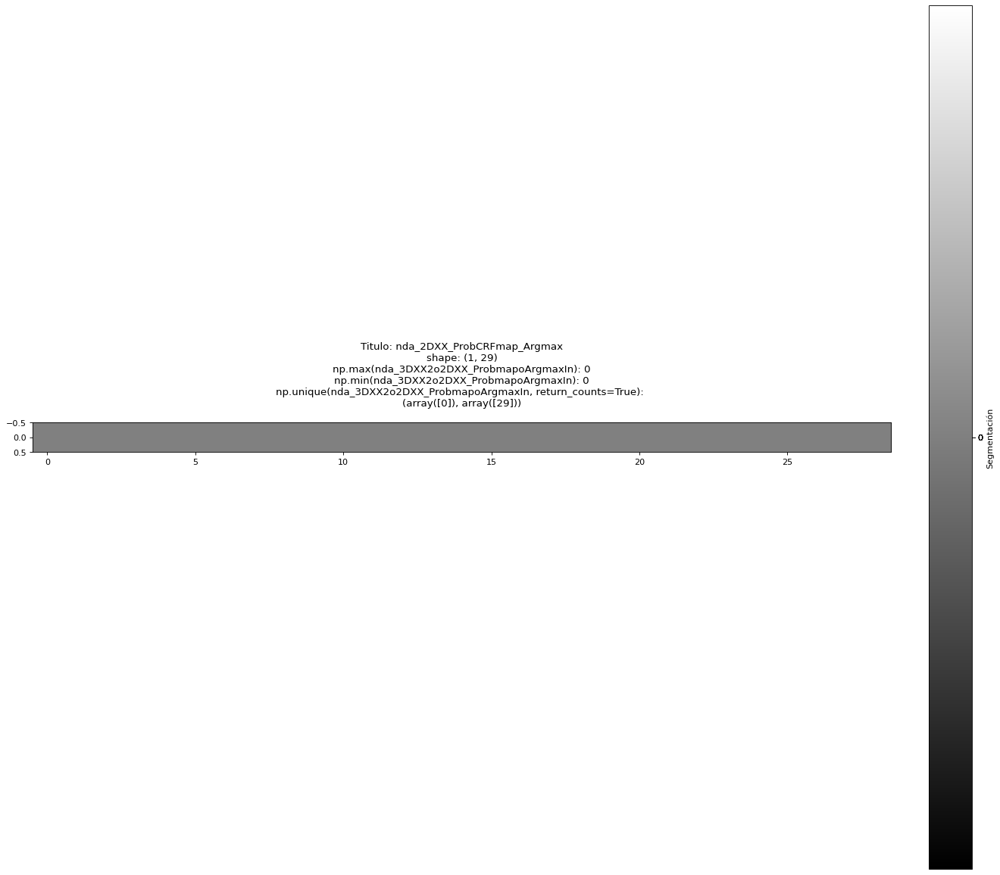

Plotear MASCARA imperfecta respecto a RAW


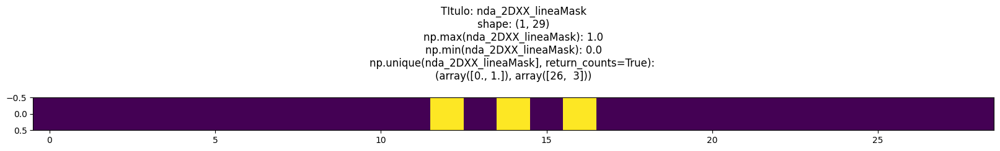

####################################
####################################
####################################
####################################
Plotear RAW


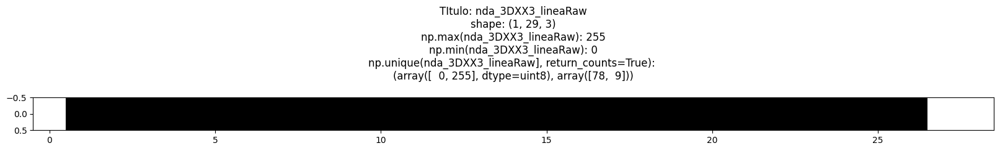

####################################
####################################
####################################
####################################
nda_3DXX2_arrProbmap.shape:  (1, 29, 2)
np.unique(nda_3DXX2_arrProbmap[:,:,0]):  [0.49 0.51]
np.unique(nda_3DXX2_arrProbmap[:,:,1]):  [0.49 0.51]
nda_3DXX2_arrProbmap.shape:  (1, 29, 2)
nda_3DXX2_arrProbmap[:,:,0].shape:  (1, 29)
nda_3DXX2_arrProbmap[:,:,1].shape:  (1, 29)
Plotear PROBDLMAP
Probmaps nda_3DXX2_ProbDLmap
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0], return_counts=True):  (array([0.49, 0.51]), array([ 3, 26]))
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1], return_counts=True):  (array([0.49, 0.51]), array([26,  3]))


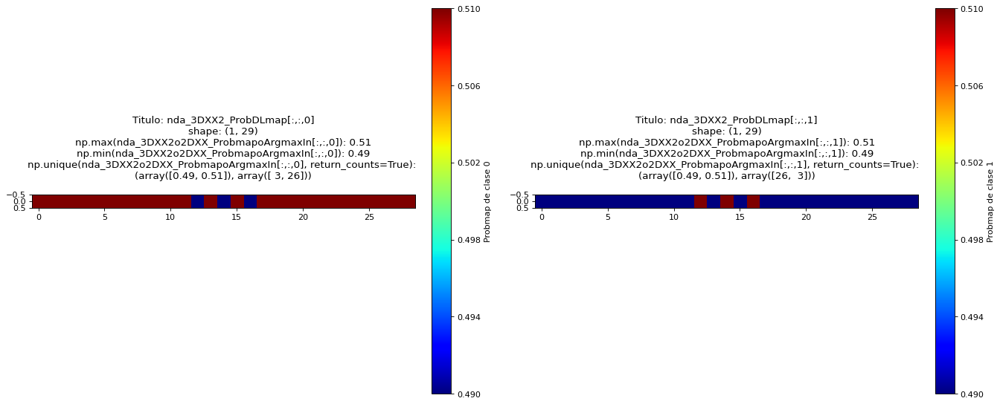

Plotear PROBDLMAP_ARGMAX
Segmentación (es argmax)nda_3DXX2_ProbDLmap_Argmax
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn, return_counts=True):  (array([0, 1]), array([26,  3]))


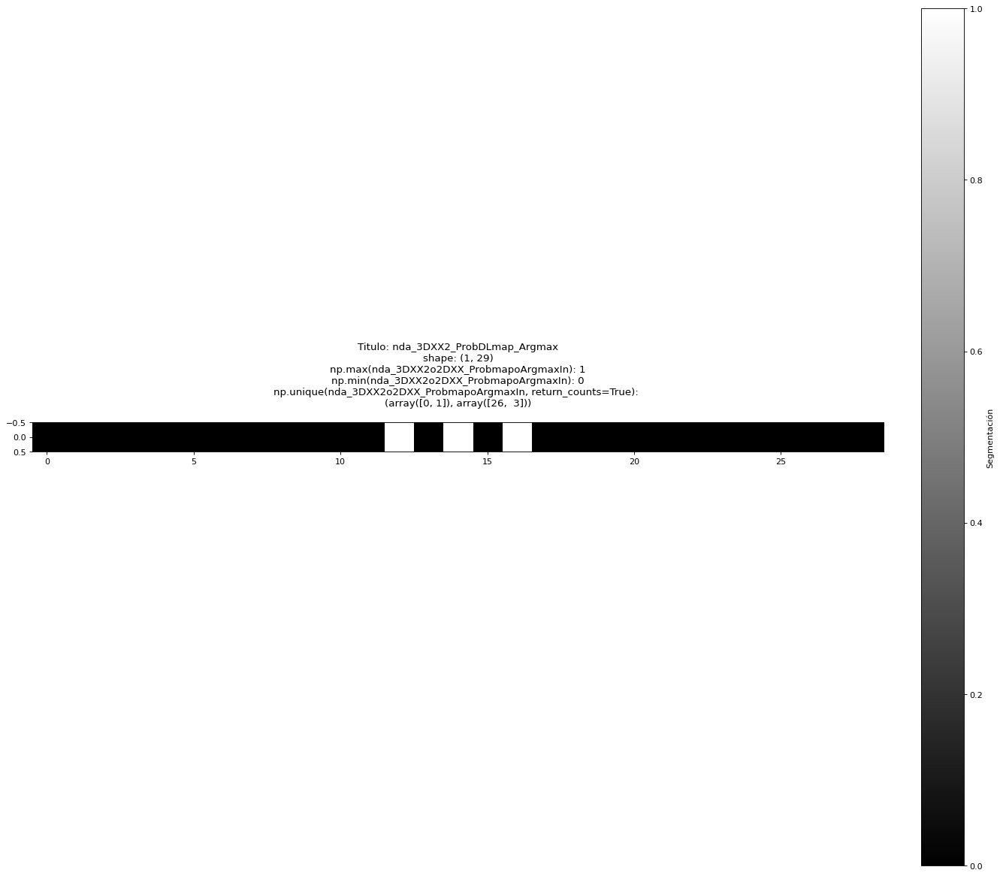

PROB_CRF
PROB_CRF
PROB_CRF
Plotear PROBCRFMAP
Probmaps nda_3DXX2_ProbCRFmap
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0], return_counts=True):  (array([0.5814273 , 0.6324638 , 0.6849716 , 0.7928327 , 0.82081676,
       0.91929597, 0.9220979 , 0.96169215, 0.9660177 , 0.9759494 ,
       0.9763659 , 0.9780542 , 0.9819532 , 0.9824401 , 0.98369455,
       0.98381144, 0.9842002 , 0.9843546 , 0.9844599 , 0.9844966 ,
       0.98454326, 0.9847521 , 0.9847756 , 0.98515594, 0.9858753 ,
       0.98626524, 0.9865979 , 0.98672044, 0.98740476], dtype=float32), array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1]))
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1], return_counts=True):  (array([0.01259522, 0.01327958, 0.01340207, 0.01373474, 0.01412469,
       0.01484405, 0.01522437, 0.01524794, 0.01545677, 0.01550336,
       0.01554018, 0.01564538, 0.01579978, 0.01618851, 0.01630541,
       0.01755985, 0.01804684, 0.02194571, 0.02363406, 0.02405067,


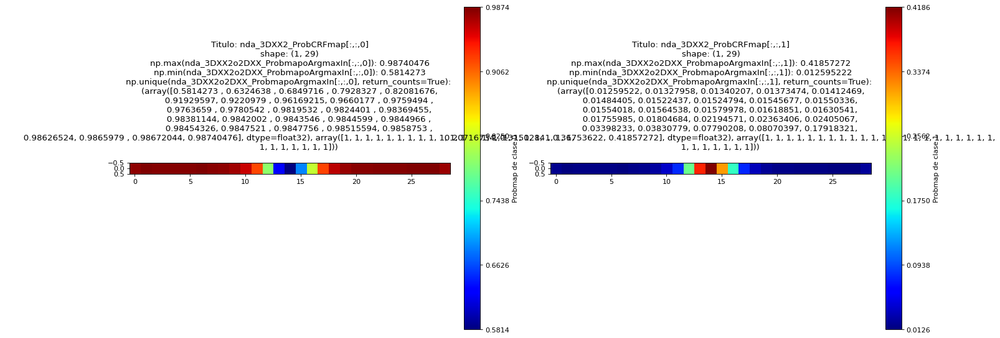

Plotear PROBCRFMAP_Argmax
Segmentación (es argmax)nda_2DXX_ProbCRFmap_Argmax
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn, return_counts=True):  (array([0]), array([29]))


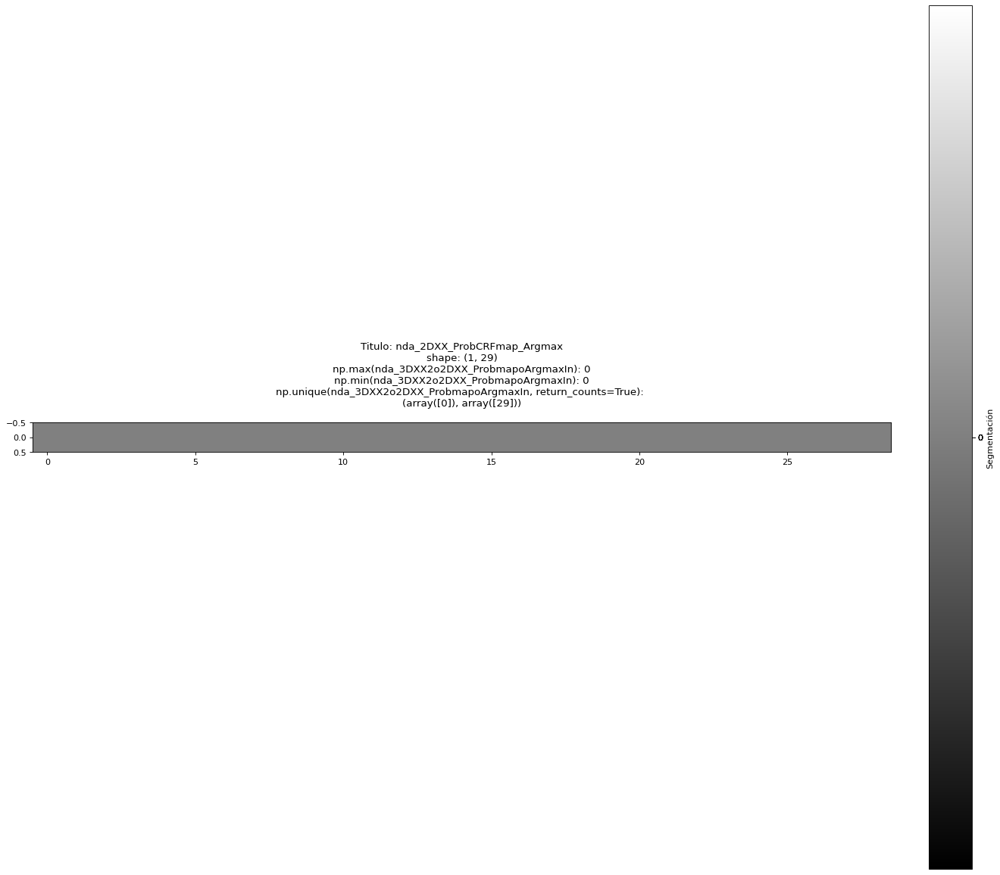

Plotear MASCARA imperfecta respecto a RAW


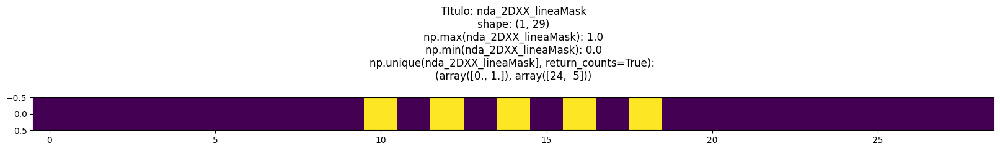

####################################
####################################
####################################
####################################
Plotear RAW


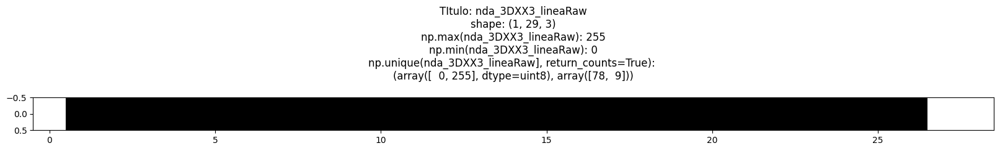

####################################
####################################
####################################
####################################
nda_3DXX2_arrProbmap.shape:  (1, 29, 2)
np.unique(nda_3DXX2_arrProbmap[:,:,0]):  [0.49 0.51]
np.unique(nda_3DXX2_arrProbmap[:,:,1]):  [0.49 0.51]
nda_3DXX2_arrProbmap.shape:  (1, 29, 2)
nda_3DXX2_arrProbmap[:,:,0].shape:  (1, 29)
nda_3DXX2_arrProbmap[:,:,1].shape:  (1, 29)
Plotear PROBDLMAP
Probmaps nda_3DXX2_ProbDLmap
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0], return_counts=True):  (array([0.49, 0.51]), array([ 5, 24]))
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1], return_counts=True):  (array([0.49, 0.51]), array([24,  5]))


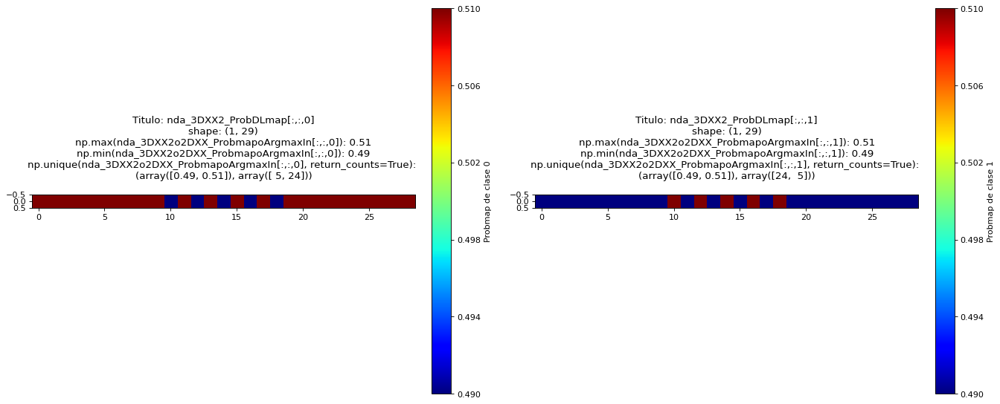

Plotear PROBDLMAP_ARGMAX
Segmentación (es argmax)nda_3DXX2_ProbDLmap_Argmax
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn, return_counts=True):  (array([0, 1]), array([24,  5]))


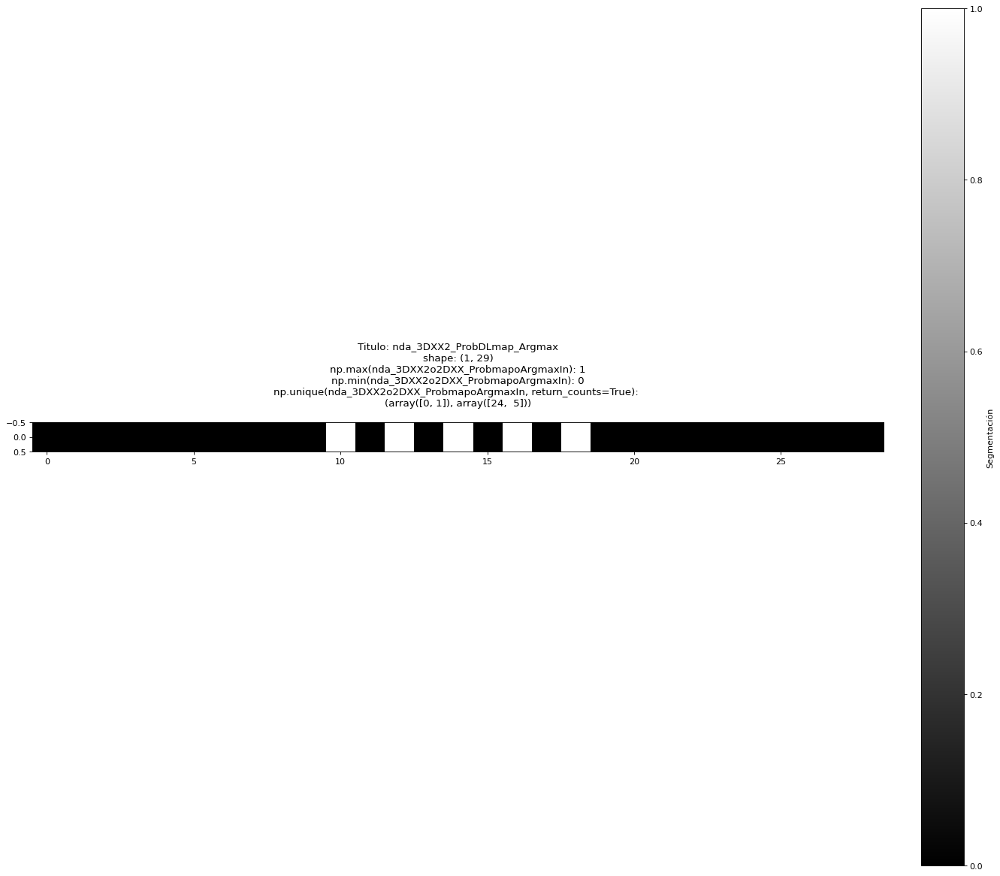

PROB_CRF
PROB_CRF
PROB_CRF
Plotear PROBCRFMAP
Probmaps nda_3DXX2_ProbCRFmap
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0], return_counts=True):  (array([0.37712917, 0.38034287, 0.45900887, 0.4628056 , 0.5611165 ,
       0.6472936 , 0.72926223, 0.81164145, 0.86014277, 0.92044663,
       0.9421753 , 0.9651509 , 0.9735622 , 0.9763658 , 0.9776993 ,
       0.9795257 , 0.9819531 , 0.98311317, 0.9837571 , 0.98406625,
       0.98427343, 0.9843536 , 0.9846165 , 0.9847387 , 0.9851495 ,
       0.9862388 , 0.9865933 , 0.98671967, 0.98740447], dtype=float32), array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1]))
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1], return_counts=True):  (array([0.0125955 , 0.01328036, 0.01340667, 0.01376119, 0.01485056,
       0.01526128, 0.01538351, 0.01564639, 0.01572658, 0.01593374,
       0.0162429 , 0.01688681, 0.01804692, 0.02047436, 0.02230069,
       0.02363414, 0.0264378 , 0.03484914, 0.0578247 , 0.07955337,


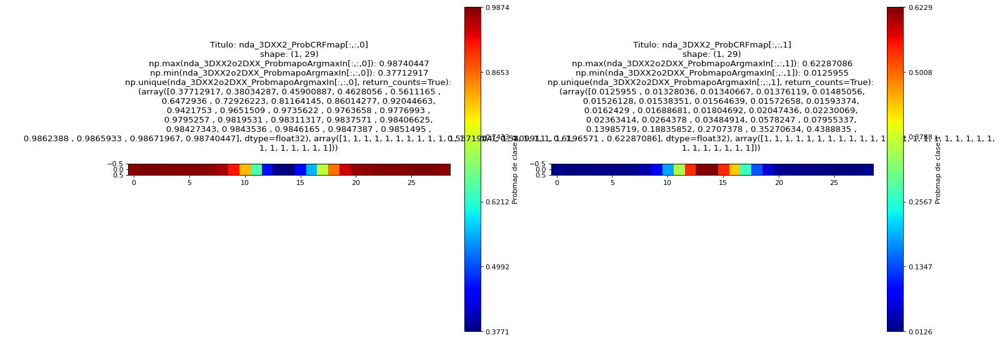

Plotear PROBCRFMAP_Argmax
Segmentación (es argmax)nda_2DXX_ProbCRFmap_Argmax
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn, return_counts=True):  (array([0, 1]), array([25,  4]))


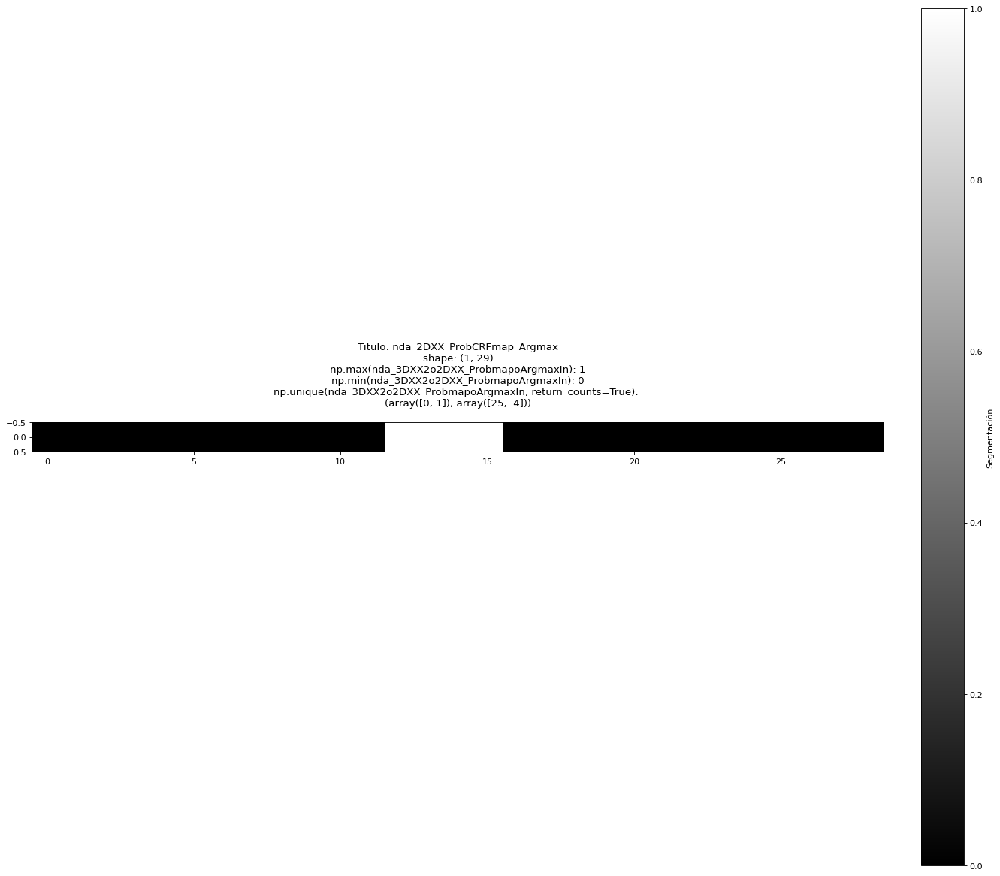

Plotear MASCARA imperfecta respecto a RAW


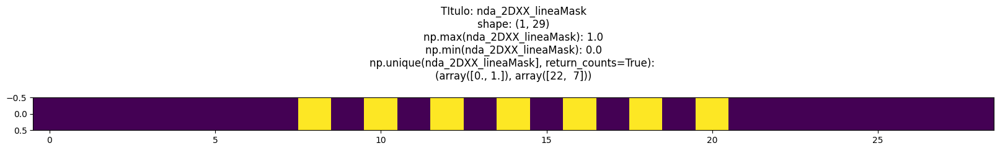

####################################
####################################
####################################
####################################
Plotear RAW


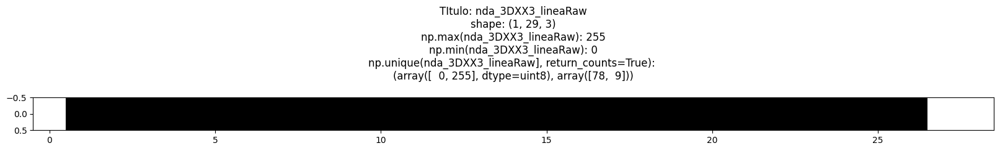

####################################
####################################
####################################
####################################
nda_3DXX2_arrProbmap.shape:  (1, 29, 2)
np.unique(nda_3DXX2_arrProbmap[:,:,0]):  [0.49 0.51]
np.unique(nda_3DXX2_arrProbmap[:,:,1]):  [0.49 0.51]
nda_3DXX2_arrProbmap.shape:  (1, 29, 2)
nda_3DXX2_arrProbmap[:,:,0].shape:  (1, 29)
nda_3DXX2_arrProbmap[:,:,1].shape:  (1, 29)
Plotear PROBDLMAP
Probmaps nda_3DXX2_ProbDLmap
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0], return_counts=True):  (array([0.49, 0.51]), array([ 7, 22]))
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1], return_counts=True):  (array([0.49, 0.51]), array([22,  7]))


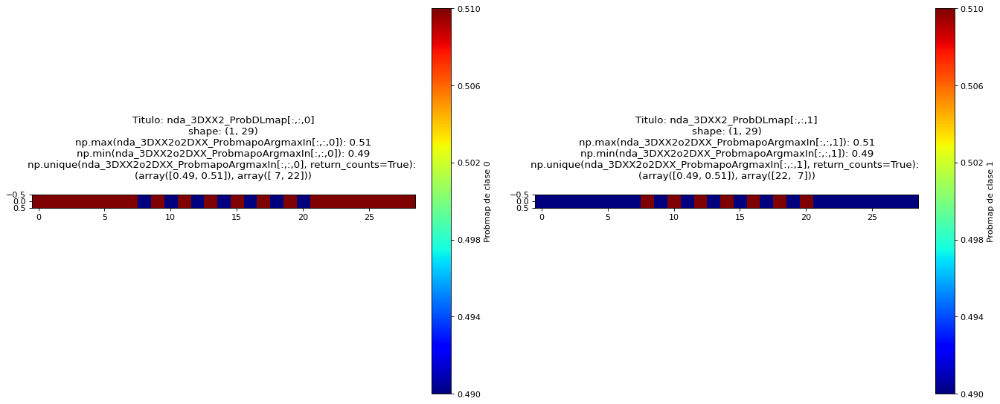

Plotear PROBDLMAP_ARGMAX
Segmentación (es argmax)nda_3DXX2_ProbDLmap_Argmax
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn, return_counts=True):  (array([0, 1]), array([22,  7]))


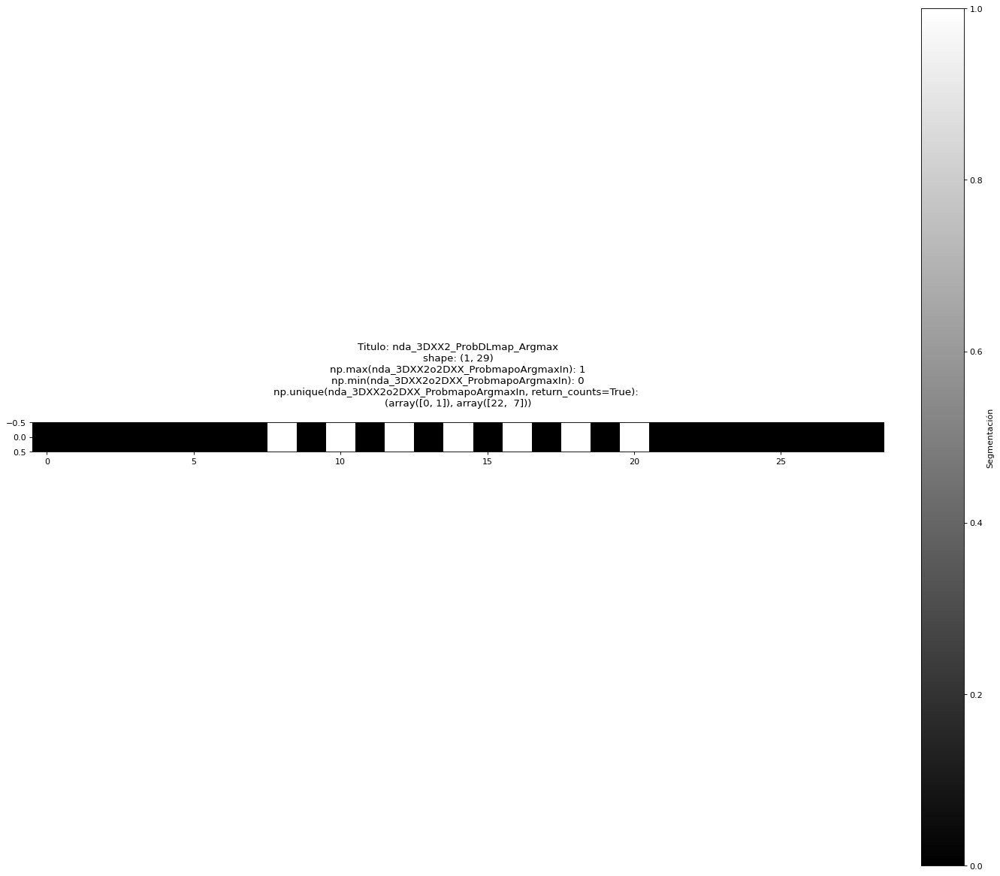

PROB_CRF
PROB_CRF
PROB_CRF
Plotear PROBCRFMAP
Probmaps nda_3DXX2_ProbCRFmap
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0], return_counts=True):  (array([0.3445954 , 0.35646772, 0.3593124 , 0.42743674, 0.44688717,
       0.4865104 , 0.55087054, 0.59880465, 0.6921359 , 0.72074556,
       0.821498  , 0.8542259 , 0.90278774, 0.9400811 , 0.95231956,
       0.9723483 , 0.97344697, 0.9763524 , 0.9795441 , 0.9796424 ,
       0.98194605, 0.98255676, 0.9833001 , 0.98427725, 0.98501647,
       0.98572844, 0.98644686, 0.9866938 , 0.98737943], dtype=float32), array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1]))
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1], return_counts=True):  (array([0.01262056, 0.0133062 , 0.01355315, 0.01427156, 0.01498351,
       0.01572276, 0.01669994, 0.01744319, 0.01805397, 0.02035763,
       0.02045593, 0.0236476 , 0.02655303, 0.02765175, 0.04768041,
       0.05991891, 0.0972123 , 0.14577413, 0.1785021 , 0.27925438,


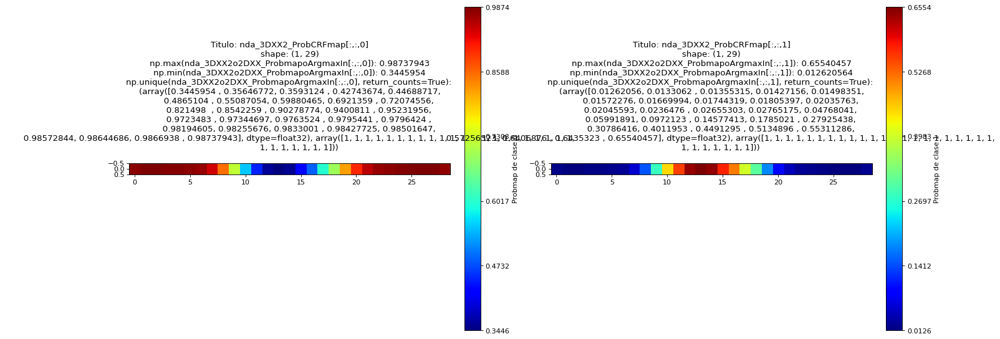

Plotear PROBCRFMAP_Argmax
Segmentación (es argmax)nda_2DXX_ProbCRFmap_Argmax
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn, return_counts=True):  (array([0, 1]), array([23,  6]))


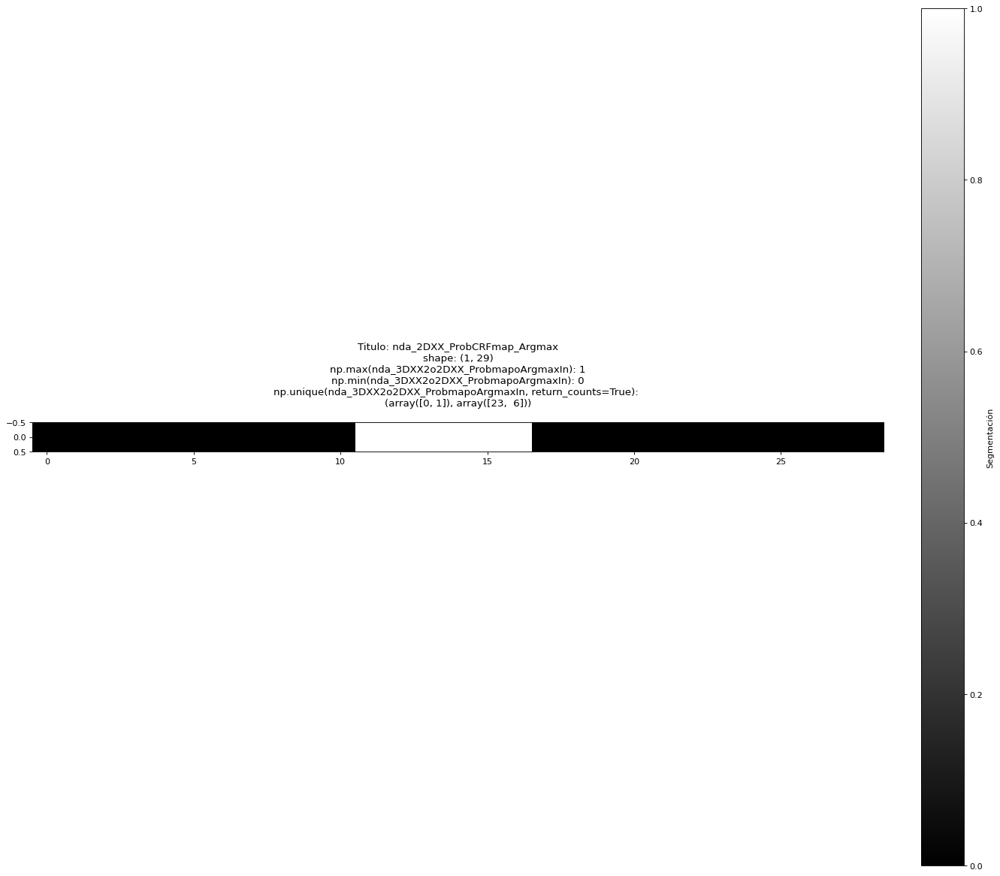

Plotear MASCARA imperfecta respecto a RAW


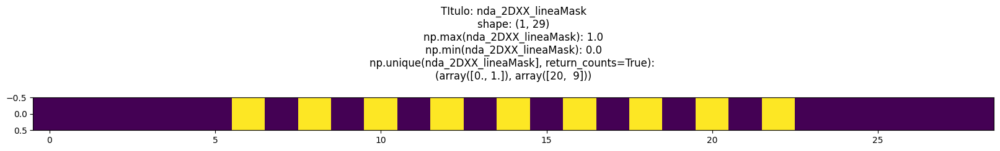

####################################
####################################
####################################
####################################
Plotear RAW


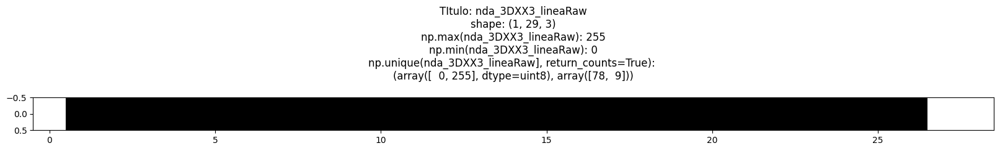

####################################
####################################
####################################
####################################
nda_3DXX2_arrProbmap.shape:  (1, 29, 2)
np.unique(nda_3DXX2_arrProbmap[:,:,0]):  [0.49 0.51]
np.unique(nda_3DXX2_arrProbmap[:,:,1]):  [0.49 0.51]
nda_3DXX2_arrProbmap.shape:  (1, 29, 2)
nda_3DXX2_arrProbmap[:,:,0].shape:  (1, 29)
nda_3DXX2_arrProbmap[:,:,1].shape:  (1, 29)
Plotear PROBDLMAP
Probmaps nda_3DXX2_ProbDLmap
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0], return_counts=True):  (array([0.49, 0.51]), array([ 9, 20]))
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1], return_counts=True):  (array([0.49, 0.51]), array([20,  9]))


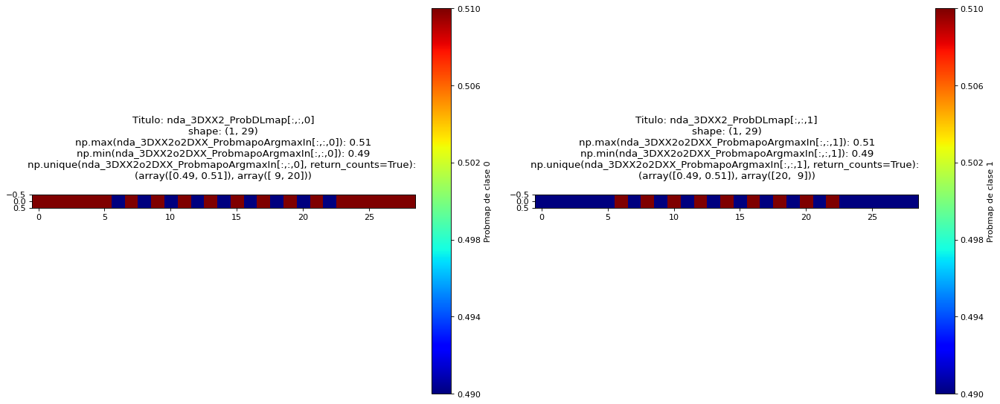

Plotear PROBDLMAP_ARGMAX
Segmentación (es argmax)nda_3DXX2_ProbDLmap_Argmax
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn, return_counts=True):  (array([0, 1]), array([20,  9]))


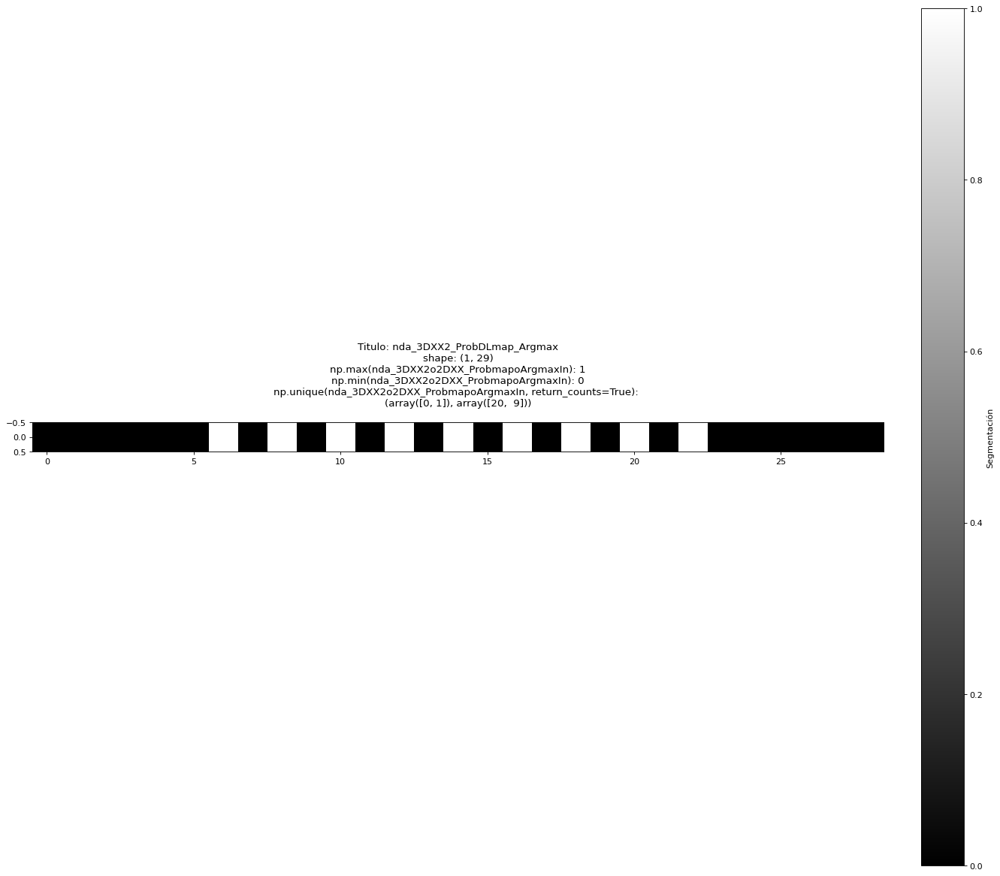

PROB_CRF
PROB_CRF
PROB_CRF
Plotear PROBCRFMAP
Probmaps nda_3DXX2_ProbCRFmap
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0], return_counts=True):  (array([0.3431196 , 0.35043108, 0.35576484, 0.41770998, 0.42529303,
       0.47598824, 0.47819313, 0.57164234, 0.5883008 , 0.6264286 ,
       0.6826885 , 0.70435375, 0.7494852 , 0.81651133, 0.831344  ,
       0.88828355, 0.901926  , 0.9433389 , 0.95260584, 0.96685064,
       0.9729868 , 0.97596735, 0.980099  , 0.98069704, 0.98169774,
       0.9833786 , 0.9846838 , 0.98620254, 0.9868851 ], dtype=float32), array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1]))
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1], return_counts=True):  (array([0.01311496, 0.01379751, 0.0153162 , 0.01662138, 0.01830225,
       0.01930295, 0.0199009 , 0.02403273, 0.02701318, 0.03314932,
       0.04739412, 0.05666113, 0.09807401, 0.11171645, 0.16865599,
       0.1834887 , 0.2505148 , 0.29564622, 0.31731153, 0.3735714 ,


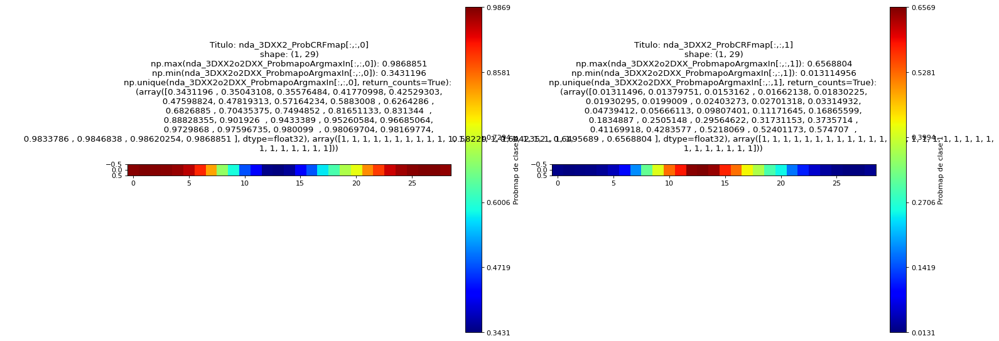

Plotear PROBCRFMAP_Argmax
Segmentación (es argmax)nda_2DXX_ProbCRFmap_Argmax
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn, return_counts=True):  (array([0, 1]), array([22,  7]))


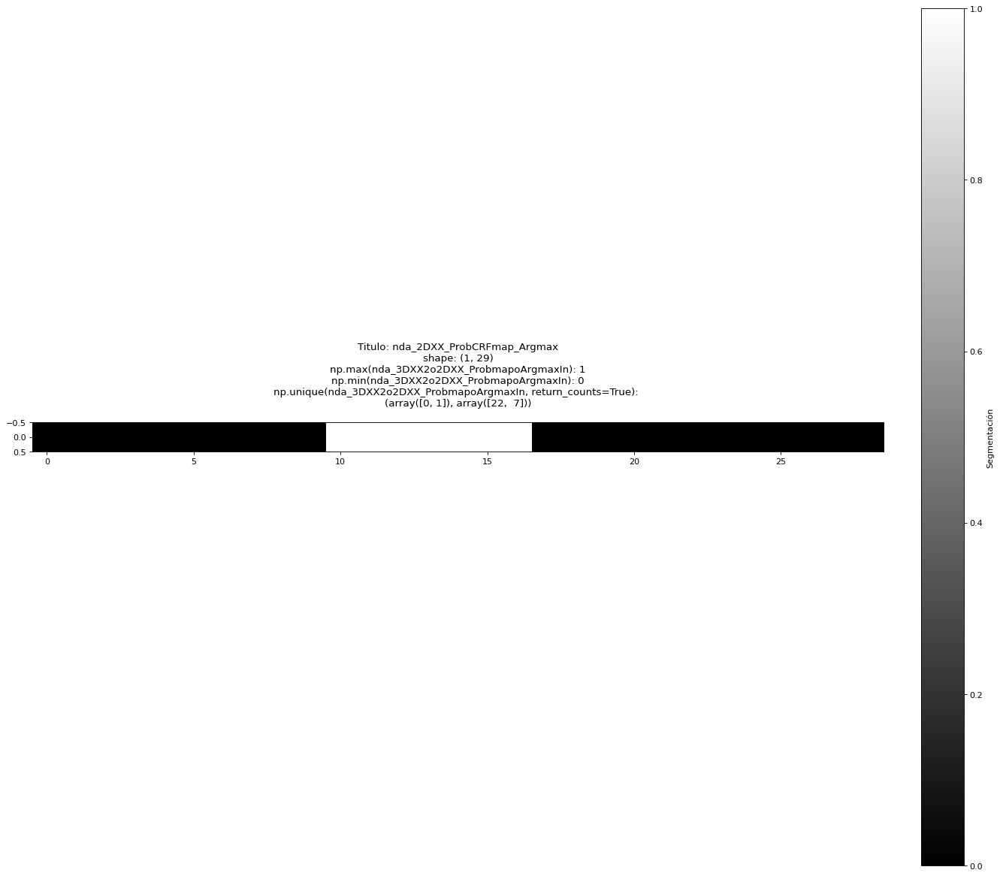

Plotear MASCARA imperfecta respecto a RAW


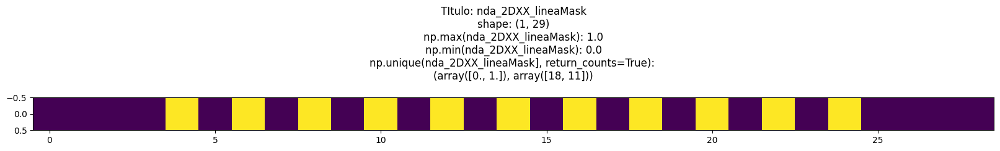

####################################
####################################
####################################
####################################
Plotear RAW


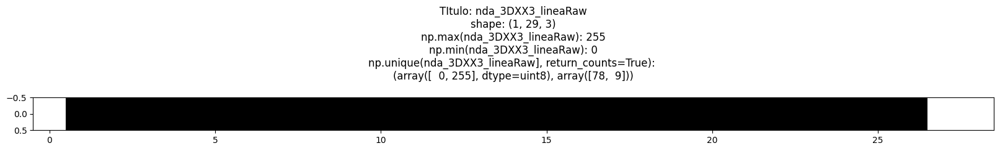

####################################
####################################
####################################
####################################
nda_3DXX2_arrProbmap.shape:  (1, 29, 2)
np.unique(nda_3DXX2_arrProbmap[:,:,0]):  [0.49 0.51]
np.unique(nda_3DXX2_arrProbmap[:,:,1]):  [0.49 0.51]
nda_3DXX2_arrProbmap.shape:  (1, 29, 2)
nda_3DXX2_arrProbmap[:,:,0].shape:  (1, 29)
nda_3DXX2_arrProbmap[:,:,1].shape:  (1, 29)
Plotear PROBDLMAP
Probmaps nda_3DXX2_ProbDLmap
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0], return_counts=True):  (array([0.49, 0.51]), array([11, 18]))
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1], return_counts=True):  (array([0.49, 0.51]), array([18, 11]))


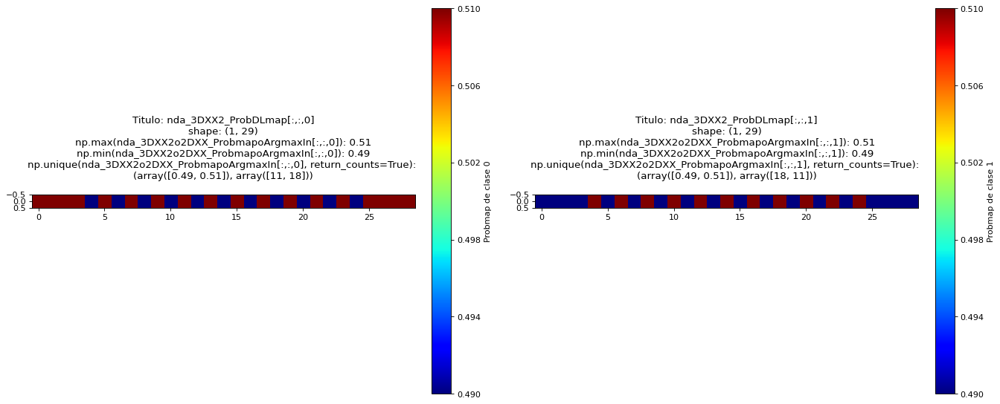

Plotear PROBDLMAP_ARGMAX
Segmentación (es argmax)nda_3DXX2_ProbDLmap_Argmax
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn, return_counts=True):  (array([0, 1]), array([18, 11]))


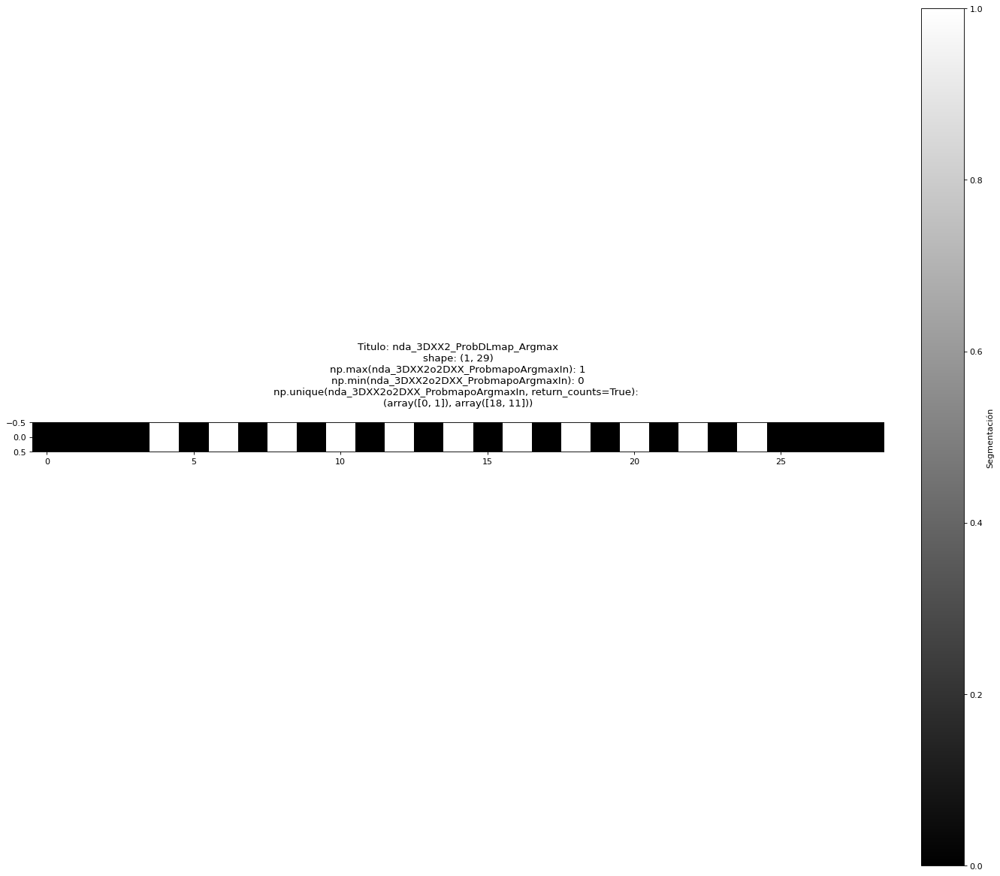

PROB_CRF
PROB_CRF
PROB_CRF
Plotear PROBCRFMAP
Probmaps nda_3DXX2_ProbCRFmap
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0], return_counts=True):  (array([0.34309885, 0.35007805, 0.35575607, 0.41564193, 0.42520717,
       0.4677016 , 0.47771525, 0.56146824, 0.5688203 , 0.61648715,
       0.61757654, 0.6611779 , 0.66469604, 0.6678388 , 0.6683953 ,
       0.69994134, 0.74396276, 0.7500564 , 0.83425504, 0.8352256 ,
       0.8929529 , 0.9351452 , 0.9459224 , 0.96865225, 0.9697038 ,
       0.9713147 , 0.9781073 , 0.9809074 , 0.9819017 ], dtype=float32), array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1]))
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1], return_counts=True):  (array([0.01809837, 0.01909267, 0.02189271, 0.02868525, 0.03029624,
       0.03134779, 0.05407764, 0.06485482, 0.10704702, 0.1647744 ,
       0.16574493, 0.24994358, 0.25603727, 0.3000586 , 0.33160472,
       0.3321612 , 0.335304  , 0.3388222 , 0.38242346, 0.38351288,


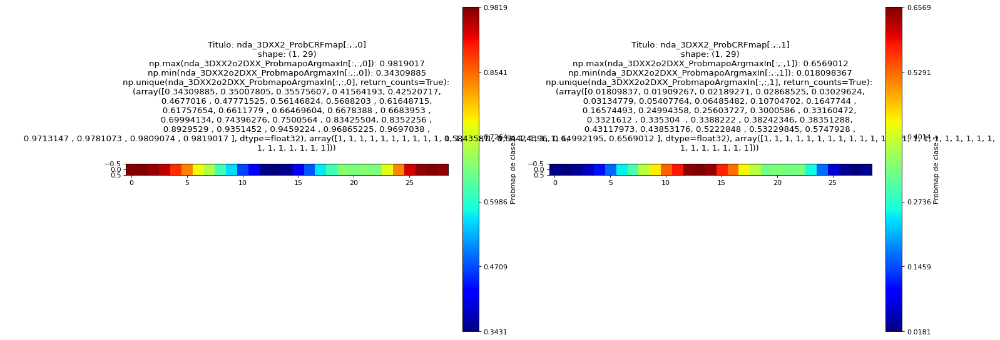

Plotear PROBCRFMAP_Argmax
Segmentación (es argmax)nda_2DXX_ProbCRFmap_Argmax
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn, return_counts=True):  (array([0, 1]), array([22,  7]))


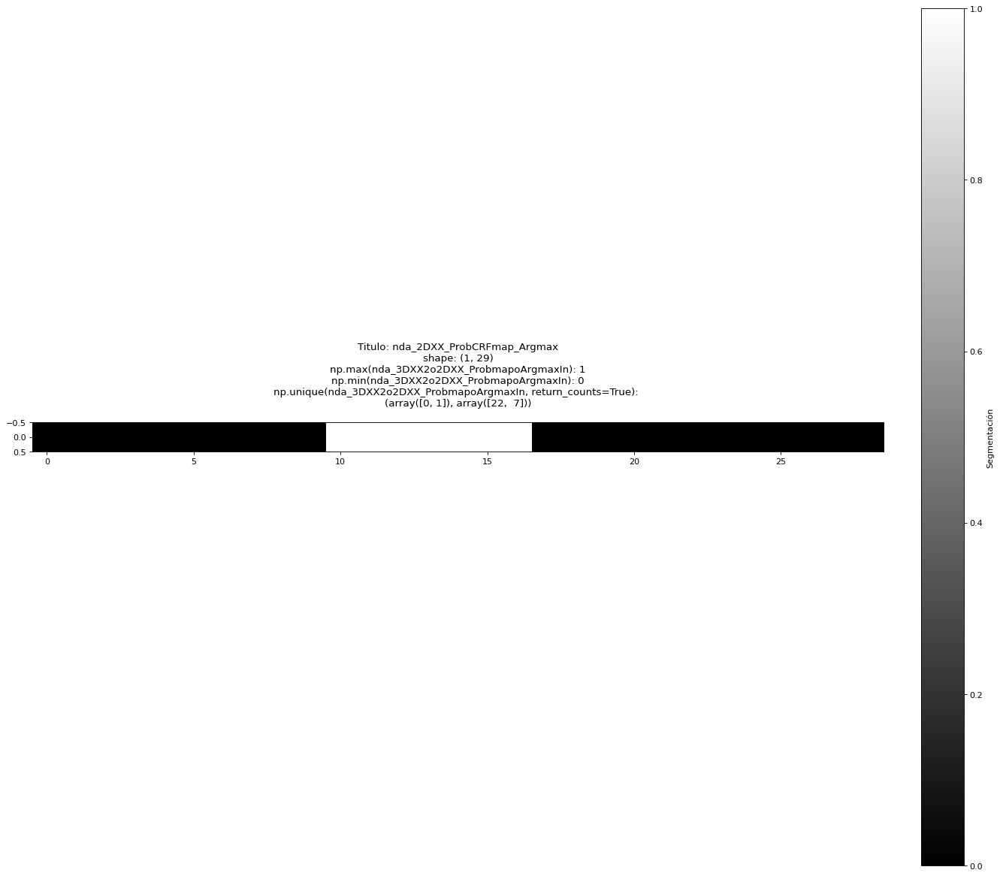

Plotear MASCARA imperfecta respecto a RAW


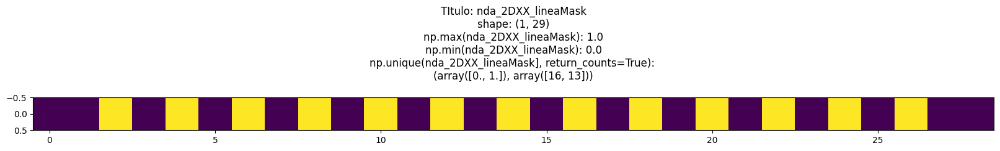

####################################
####################################
####################################
####################################
Plotear RAW


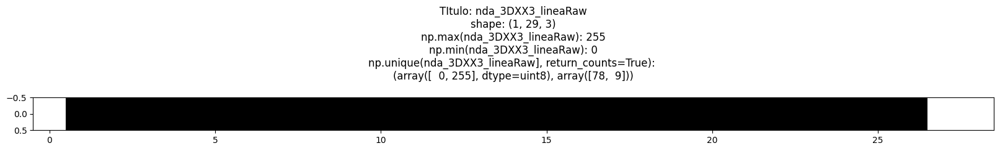

####################################
####################################
####################################
####################################
nda_3DXX2_arrProbmap.shape:  (1, 29, 2)
np.unique(nda_3DXX2_arrProbmap[:,:,0]):  [0.49 0.51]
np.unique(nda_3DXX2_arrProbmap[:,:,1]):  [0.49 0.51]
nda_3DXX2_arrProbmap.shape:  (1, 29, 2)
nda_3DXX2_arrProbmap[:,:,0].shape:  (1, 29)
nda_3DXX2_arrProbmap[:,:,1].shape:  (1, 29)
Plotear PROBDLMAP
Probmaps nda_3DXX2_ProbDLmap
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0], return_counts=True):  (array([0.49, 0.51]), array([13, 16]))
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1], return_counts=True):  (array([0.49, 0.51]), array([16, 13]))


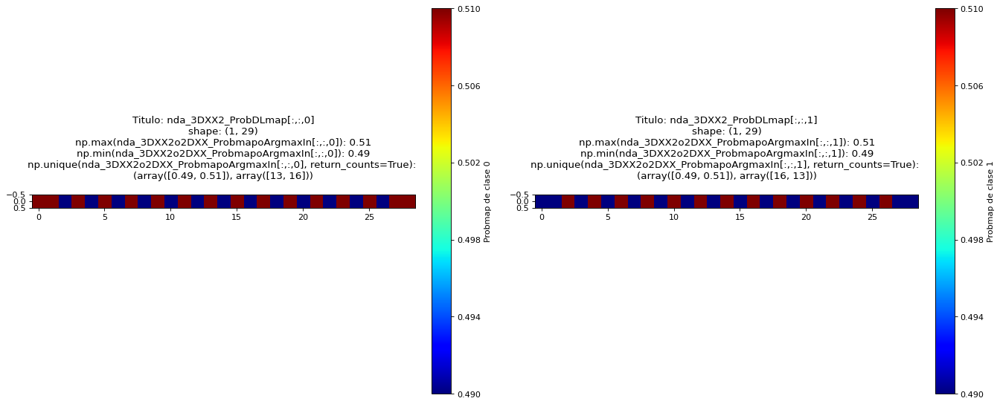

Plotear PROBDLMAP_ARGMAX
Segmentación (es argmax)nda_3DXX2_ProbDLmap_Argmax
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn, return_counts=True):  (array([0, 1]), array([16, 13]))


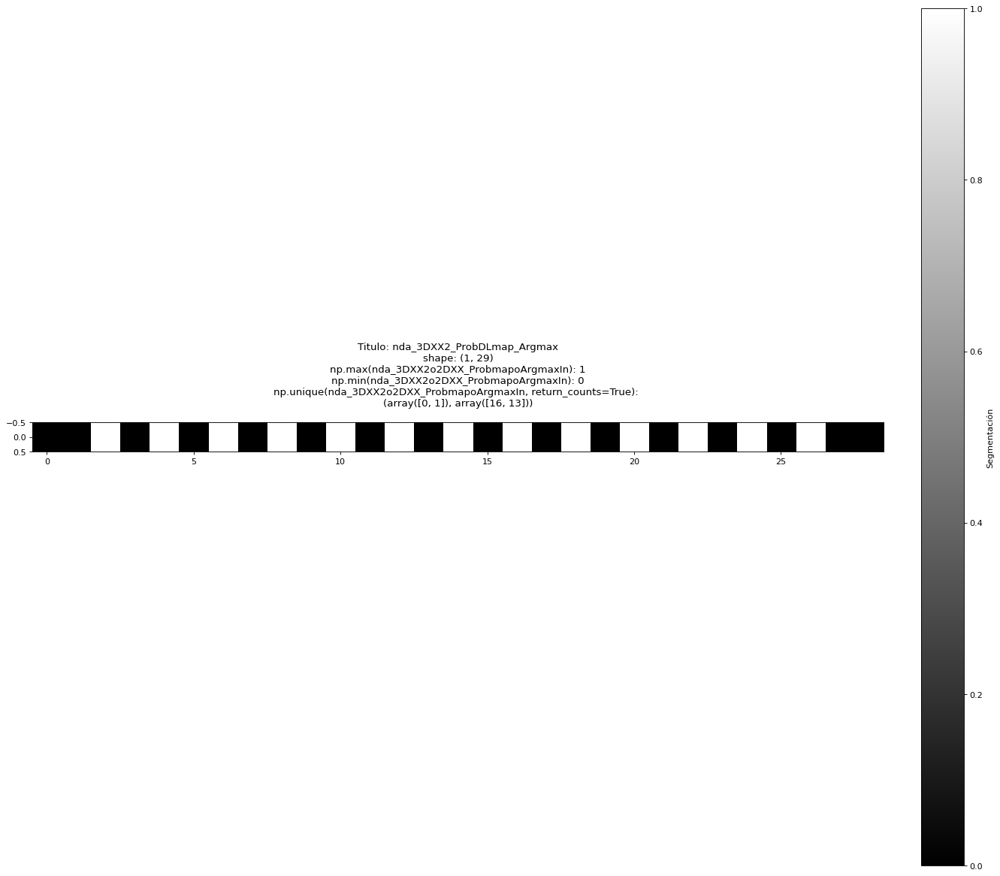

PROB_CRF
PROB_CRF
PROB_CRF
Plotear PROBCRFMAP
Probmaps nda_3DXX2_ProbCRFmap
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0], return_counts=True):  (array([0.34309864, 0.35007152, 0.35575607, 0.41555932, 0.42520675,
       0.4672245 , 0.4777107 , 0.5118697 , 0.5252146 , 0.55066556,
       0.55871826, 0.56873614, 0.6078652 , 0.61059004, 0.6160458 ,
       0.62130696, 0.64813125, 0.66401523, 0.6646212 , 0.6650229 ,
       0.67504996, 0.6760411 , 0.7486648 , 0.75337356, 0.8238916 ,
       0.8782653 , 0.8838955 , 0.91306376, 0.92784536], dtype=float32), array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1]))
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1], return_counts=True):  (array([0.07215465, 0.08693622, 0.11610443, 0.12173471, 0.17610842,
       0.2466265 , 0.2513352 , 0.32395887, 0.32495007, 0.33497706,
       0.33537886, 0.33598474, 0.35186875, 0.378693  , 0.38395426,
       0.38941002, 0.3921348 , 0.4312639 , 0.4412817 , 0.4493344 ,


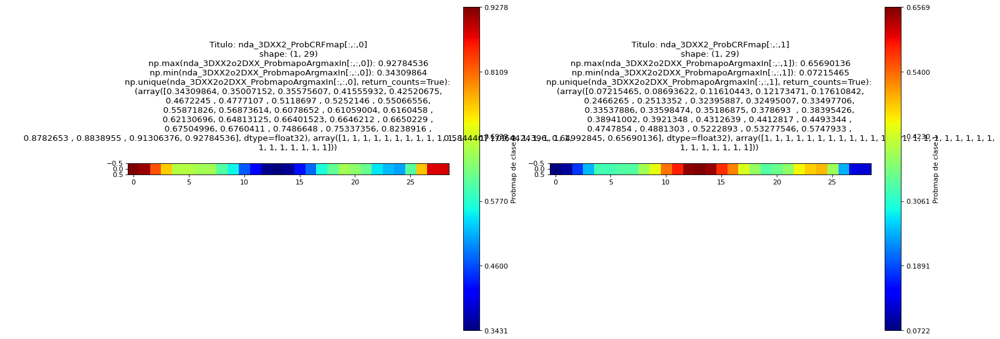

Plotear PROBCRFMAP_Argmax
Segmentación (es argmax)nda_2DXX_ProbCRFmap_Argmax
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn, return_counts=True):  (array([0, 1]), array([22,  7]))


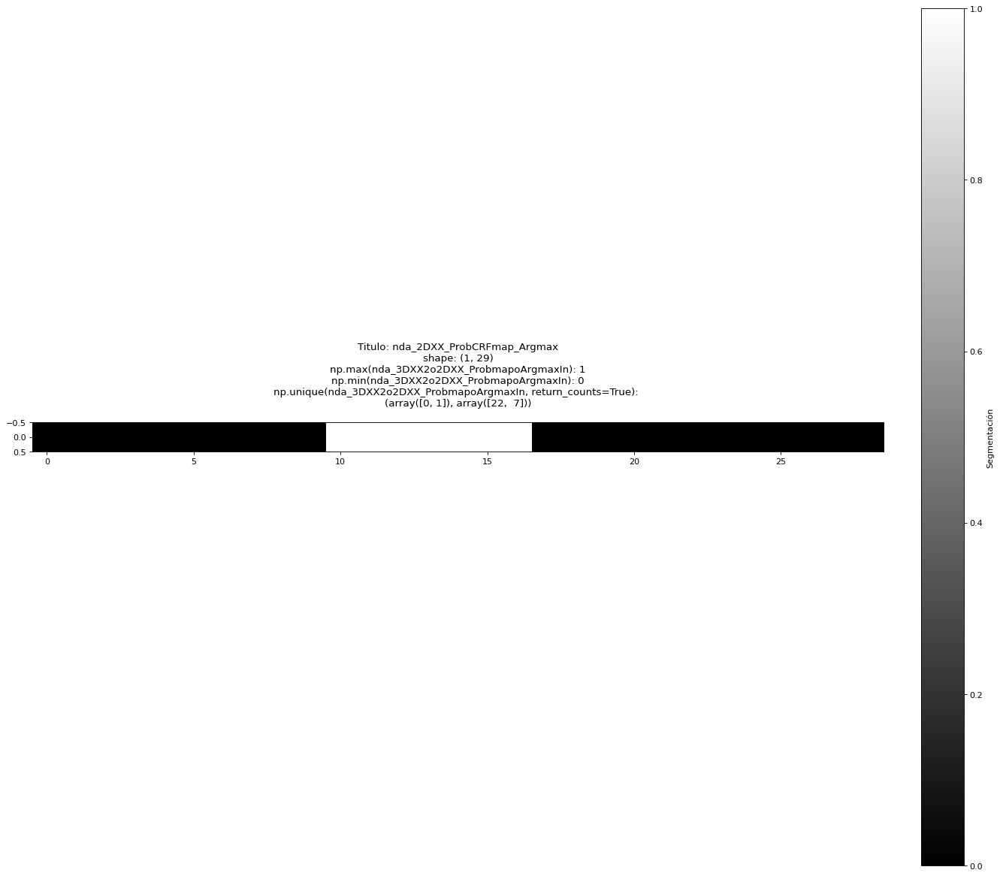

Plotear MASCARA imperfecta respecto a RAW


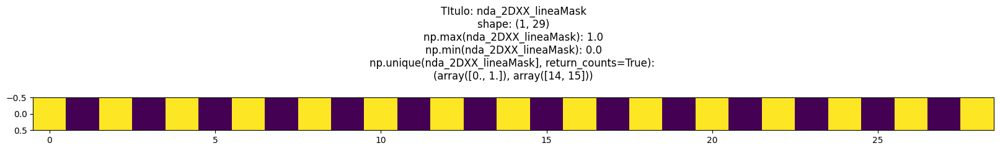

####################################
####################################
####################################
####################################
Plotear RAW


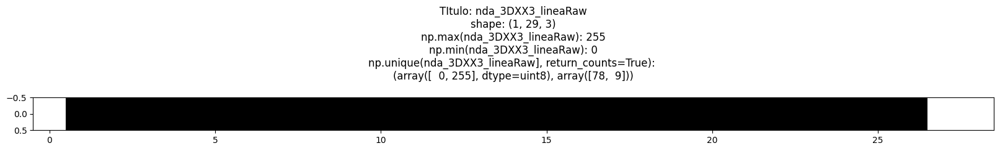

####################################
####################################
####################################
####################################
nda_3DXX2_arrProbmap.shape:  (1, 29, 2)
np.unique(nda_3DXX2_arrProbmap[:,:,0]):  [0.49 0.51]
np.unique(nda_3DXX2_arrProbmap[:,:,1]):  [0.49 0.51]
nda_3DXX2_arrProbmap.shape:  (1, 29, 2)
nda_3DXX2_arrProbmap[:,:,0].shape:  (1, 29)
nda_3DXX2_arrProbmap[:,:,1].shape:  (1, 29)
Plotear PROBDLMAP
Probmaps nda_3DXX2_ProbDLmap
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0], return_counts=True):  (array([0.49, 0.51]), array([15, 14]))
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1], return_counts=True):  (array([0.49, 0.51]), array([14, 15]))


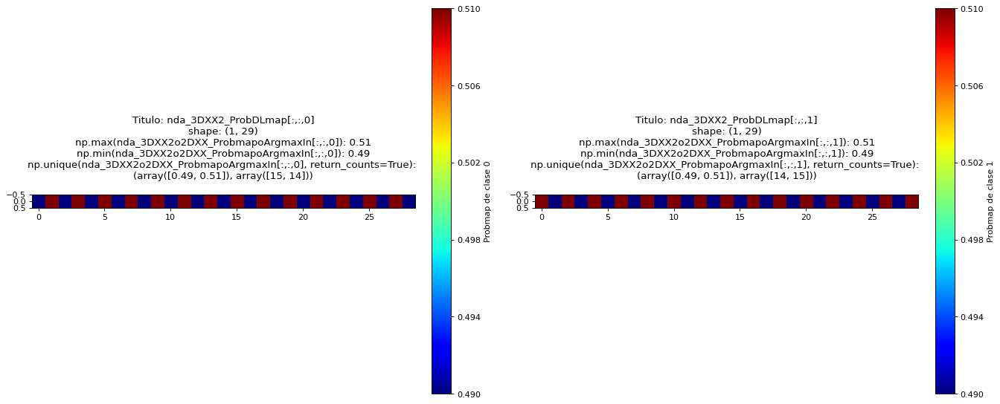

Plotear PROBDLMAP_ARGMAX
Segmentación (es argmax)nda_3DXX2_ProbDLmap_Argmax
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn, return_counts=True):  (array([0, 1]), array([14, 15]))


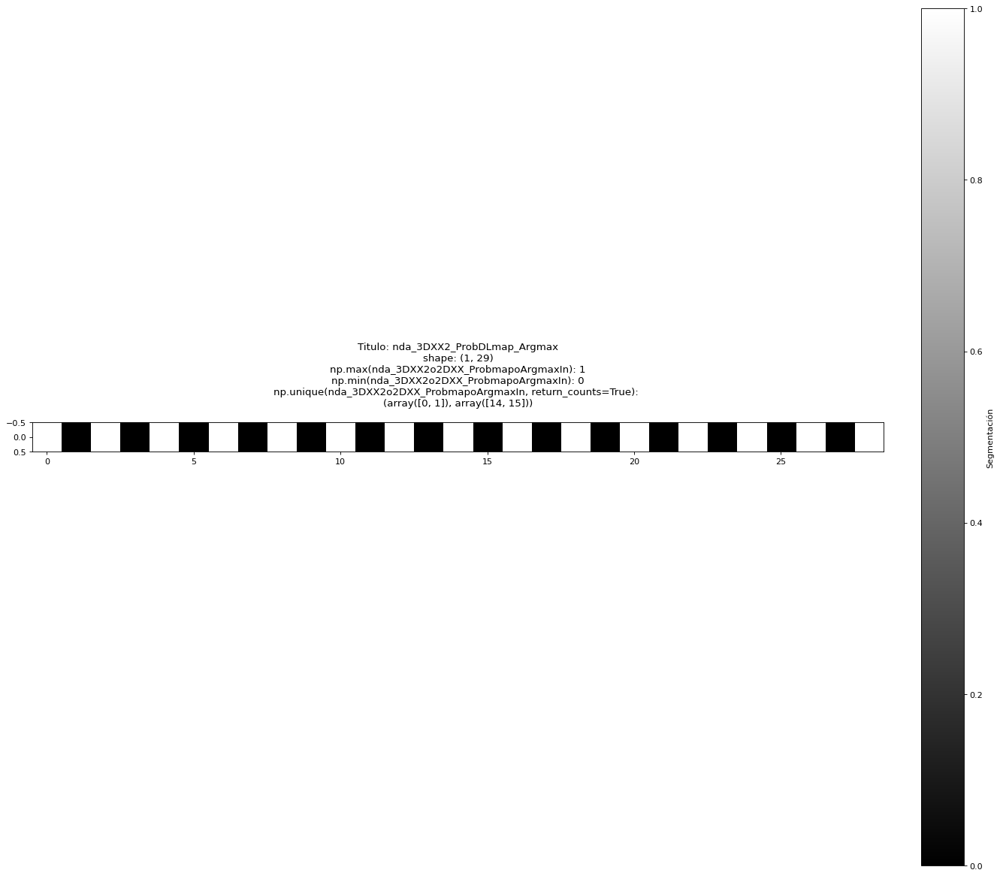

PROB_CRF
PROB_CRF
PROB_CRF
Plotear PROBCRFMAP
Probmaps nda_3DXX2_ProbCRFmap
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0], return_counts=True):  (array([0.17905684, 0.18524988, 0.19772646, 0.21176133, 0.23913676,
       0.297523  , 0.32135454, 0.34309864, 0.35007152, 0.35575607,
       0.36950085, 0.41555876, 0.42520675, 0.4471245 , 0.4672191 ,
       0.47321784, 0.4777107 , 0.52699953, 0.5333632 , 0.5586252 ,
       0.5687358 , 0.60737413, 0.61604196, 0.6169777 , 0.61834574,
       0.6474492 , 0.64881307, 0.66069096, 0.6649217 ], dtype=float32), array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1]))
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1], return_counts=True):  (array([0.33507827, 0.339309  , 0.35118693, 0.3525508 , 0.38165432,
       0.38302225, 0.383958  , 0.39262593, 0.4312642 , 0.44137478,
       0.46663678, 0.4730005 , 0.5222893 , 0.5267821 , 0.5327809 ,
       0.5528755 , 0.5747933 , 0.58444124, 0.6304991 , 0.64424396,


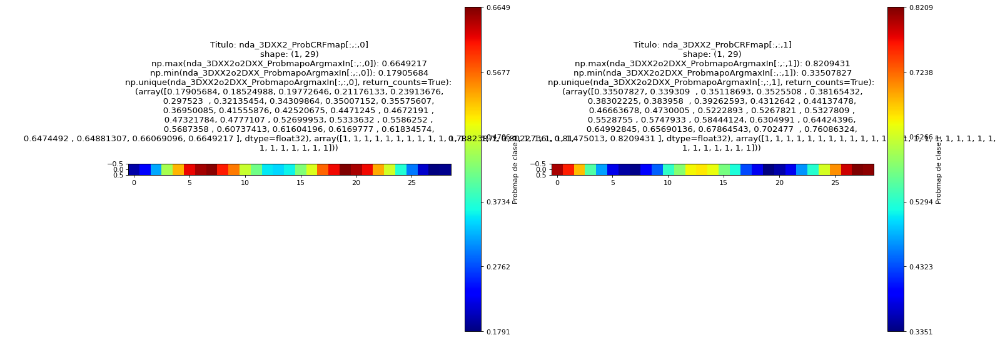

Plotear PROBCRFMAP_Argmax
Segmentación (es argmax)nda_2DXX_ProbCRFmap_Argmax
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn, return_counts=True):  (array([0, 1]), array([12, 17]))


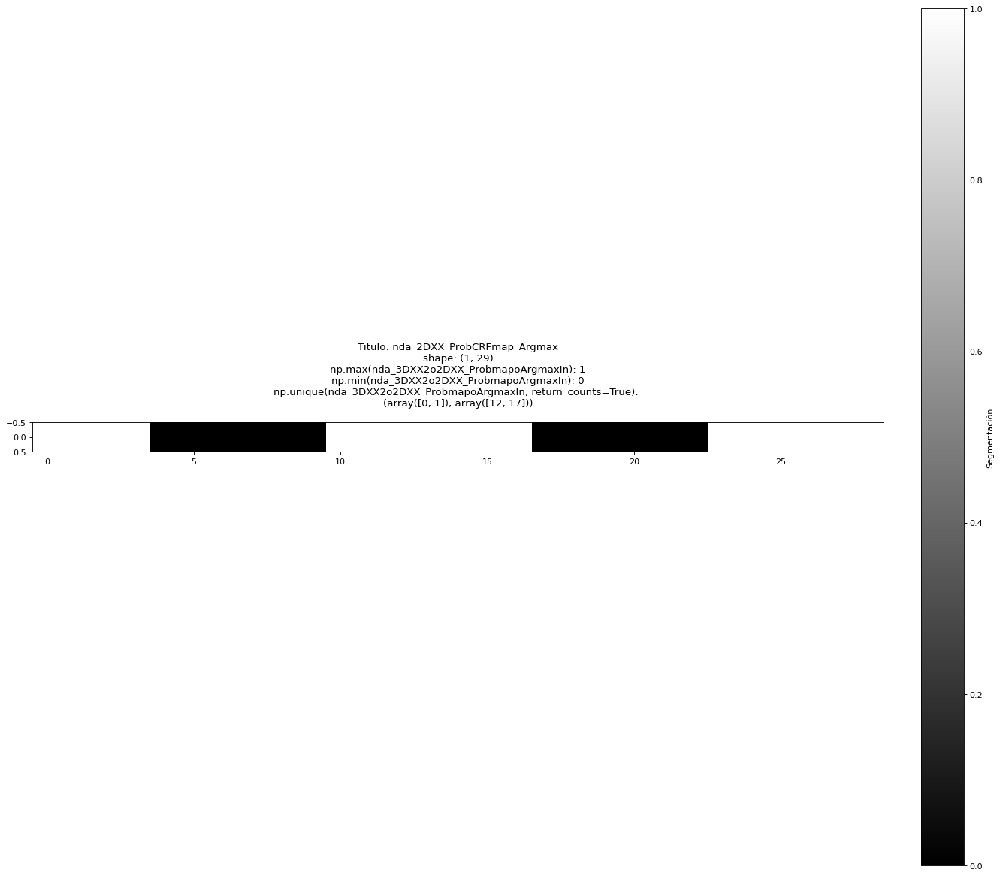

In [64]:
#if ("func_experimentarPydenseCRF"=="func_experimentarPydenseCRF"):    
if __name__ == "__main__":
    print("efecto domino tratando?")
    int_largo1=29#41
    lst_int_pixelesBlancosRaw1=[0,-1,-2]
    #lst_int_pixelesBlancosMask1=[int_largo1//2-1,int_largo1//2,int_largo1//2+1]
    lst_int_pixelesBlancosMask1=[int_largo1//2,int_largo1//2+1]
    int_CFijoIn21=0.51
    lst_int_inferenceIn11=5
    int_pairwisebilateralCompatIn11=5
    str_PairwiseoKernelIn1="GaussianoSmoothnessKernel"

    
    lst_lst_int_pixelesBlancosMask1=[
                                    [int_largo1//2],
                                    [int_largo1//2,int_largo1//2+2],
                                    [int_largo1//2-2,int_largo1//2,int_largo1//2+2],
                                    #[int_largo1//2-2,int_largo1//2,int_largo1//2+1,int_largo1//2+2],
                                    [int_largo1//2-4,int_largo1//2-2,int_largo1//2,int_largo1//2+2,int_largo1//2+4],
                                    [int_largo1//2-6,int_largo1//2-4,int_largo1//2-2,int_largo1//2,int_largo1//2+2,int_largo1//2+4,int_largo1//2+6],
                                    [int_largo1//2-8,int_largo1//2-6,int_largo1//2-4,int_largo1//2-2,int_largo1//2,int_largo1//2+2,int_largo1//2+4,int_largo1//2+6,int_largo1//2+8],
                                    [int_largo1//2-10,int_largo1//2-8,int_largo1//2-6,int_largo1//2-4,int_largo1//2-2,int_largo1//2,int_largo1//2+2,int_largo1//2+4,int_largo1//2+6,int_largo1//2+8,int_largo1//2+10],
                                    [int_largo1//2-12,int_largo1//2-10,int_largo1//2-8,int_largo1//2-6,int_largo1//2-4,int_largo1//2-2,int_largo1//2,int_largo1//2+2,int_largo1//2+4,int_largo1//2+6,int_largo1//2+8,int_largo1//2+10,int_largo1//2+12],
                                    [int_largo1//2-14,int_largo1//2-12,int_largo1//2-10,int_largo1//2-8,int_largo1//2-6,int_largo1//2-4,int_largo1//2-2,int_largo1//2,int_largo1//2+2,int_largo1//2+4,int_largo1//2+6,int_largo1//2+8,int_largo1//2+10,int_largo1//2+12,int_largo1//2+14],
        
                                    ]
    if False:
        lst_lst_int_pixelesBlancosMask1=[
                                        [0],
                                        [0,-1],
                                        [0,1,-1],
                                        [0,1,-1,-2],
                                        ]
    for lst_lst_int_pixelesBlancosMask1_i in lst_lst_int_pixelesBlancosMask1:
        func_experimentarPydenseCRF(int_largo=int_largo1,
                                    int_CFijoIn2 =int_CFijoIn21,
                                    tpl_ParametroXYIn1=(1,1),#(1,1)
                                    tpl_ParametroRGBIn1=(1,1,1),
                                    lst_int_inferenceIn1=lst_int_inferenceIn11,
                                    int_pairwisebilateralCompatIn1=int_pairwisebilateralCompatIn11,
                                    str_PairwiseoKernelIn=str_PairwiseoKernelIn1,#["GaussianoSmoothnessKernel", "BilateraloAppearanceKernel"]
                                    lst_int_pixelesBlancosMask=lst_lst_int_pixelesBlancosMask1_i,
                                    lst_int_pixelesBlancosRaw=lst_int_pixelesBlancosRaw1
                                   )

efecto domino tratando?
ojo mascara da lo mismo porque uso gaussian, si influyera seria un error
Se puede apreciar como al subir el sdx se va suavizando mas la imagen
Plotear MASCARA imperfecta respecto a RAW


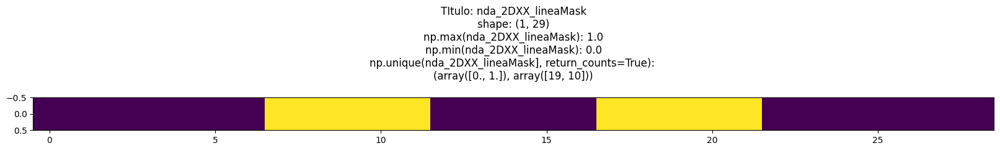

####################################
####################################
####################################
####################################
Plotear RAW


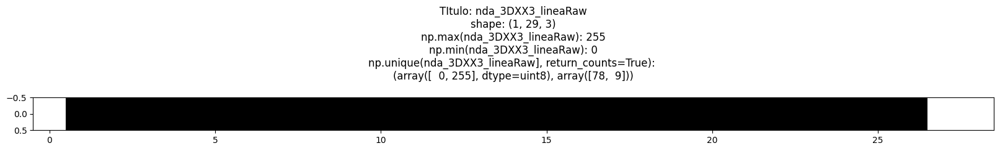

####################################
####################################
####################################
####################################
nda_3DXX2_arrProbmap.shape:  (1, 29, 2)
np.unique(nda_3DXX2_arrProbmap[:,:,0]):  [0.49 0.51]
np.unique(nda_3DXX2_arrProbmap[:,:,1]):  [0.49 0.51]
nda_3DXX2_arrProbmap.shape:  (1, 29, 2)
nda_3DXX2_arrProbmap[:,:,0].shape:  (1, 29)
nda_3DXX2_arrProbmap[:,:,1].shape:  (1, 29)
Plotear PROBDLMAP
Probmaps nda_3DXX2_ProbDLmap
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0], return_counts=True):  (array([0.49, 0.51]), array([10, 19]))
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1], return_counts=True):  (array([0.49, 0.51]), array([19, 10]))


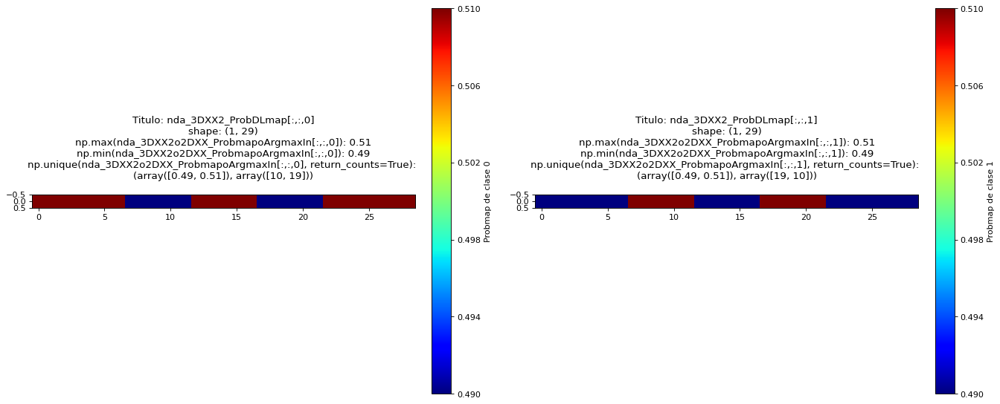

Plotear PROBDLMAP_ARGMAX
Segmentación (es argmax)nda_3DXX2_ProbDLmap_Argmax
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn, return_counts=True):  (array([0, 1]), array([19, 10]))


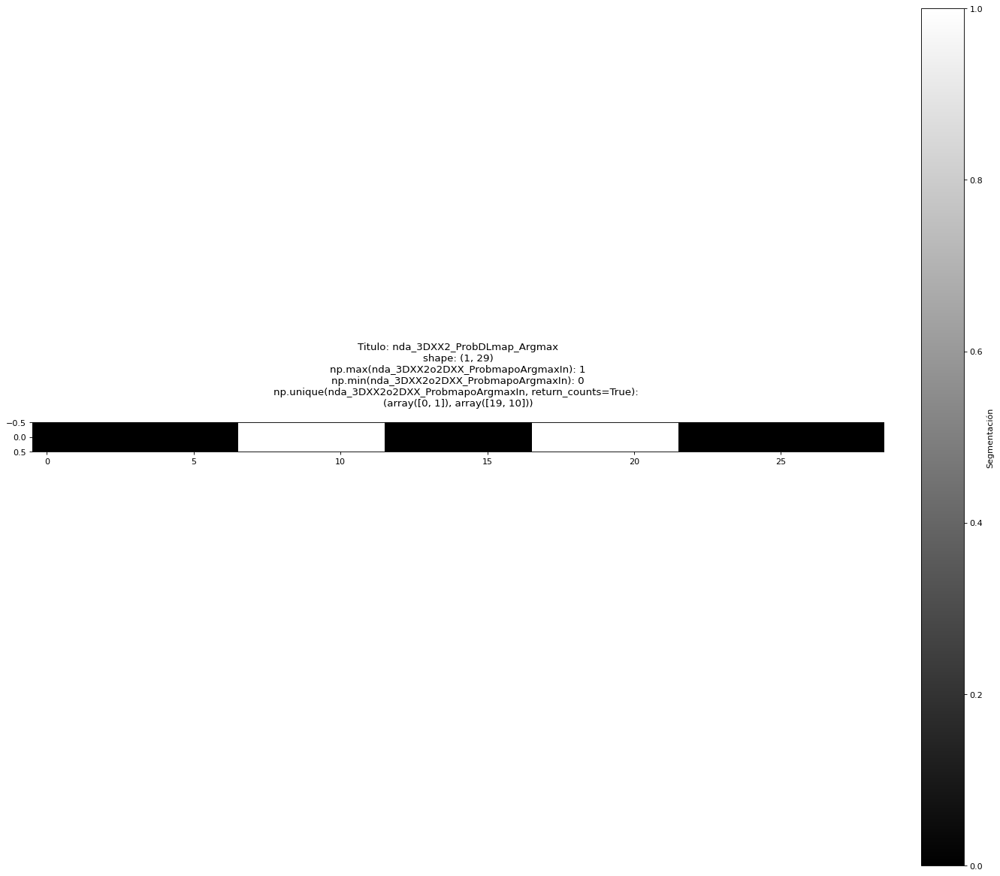

PROB_CRF
PROB_CRF
PROB_CRF
Plotear PROBCRFMAP
Probmaps nda_3DXX2_ProbCRFmap
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0], return_counts=True):  (array([0.05114234, 0.0546032 , 0.06711094, 0.07726062, 0.08146759,
       0.0844438 , 0.24164172, 0.25420088, 0.30507168, 0.31748128,
       0.70015657, 0.70746034, 0.72936225, 0.7499477 , 0.9114672 ,
       0.930804  , 0.93134475, 0.9316928 , 0.9440774 , 0.96997035,
       0.9734883 , 0.976262  , 0.981261  , 0.98186284, 0.982942  ,
       0.9841084 , 0.9856852 , 0.9864786 , 0.98723143], dtype=float32), array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1]))
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1], return_counts=True):  (array([0.01276863, 0.01352135, 0.01431473, 0.01589154, 0.01705799,
       0.01813714, 0.01873904, 0.02373805, 0.02651175, 0.03002967,
       0.05592262, 0.06830715, 0.06865529, 0.06919595, 0.08853287,
       0.25005224, 0.2706378 , 0.29253963, 0.29984346, 0.6825187 ,


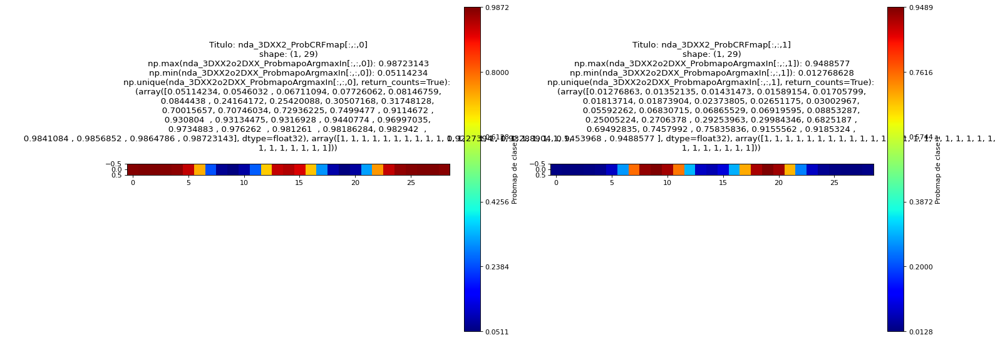

Plotear PROBCRFMAP_Argmax
Segmentación (es argmax)nda_2DXX_ProbCRFmap_Argmax
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn, return_counts=True):  (array([0, 1]), array([19, 10]))


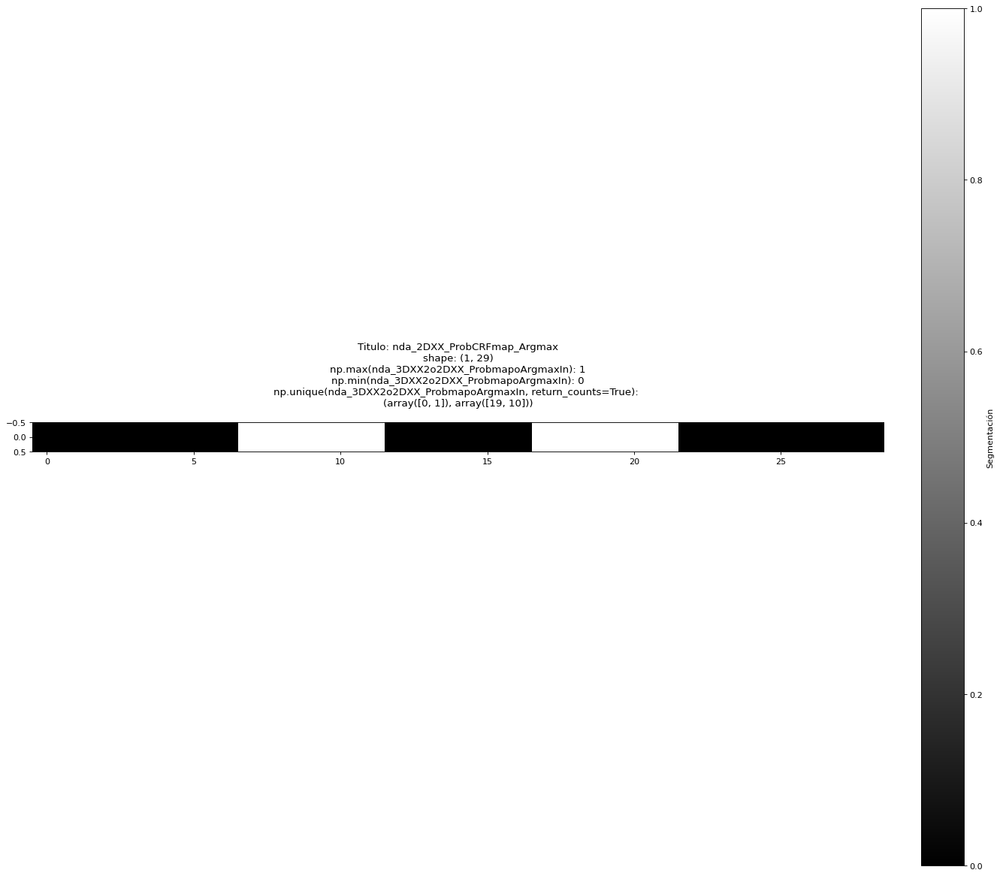

Plotear MASCARA imperfecta respecto a RAW


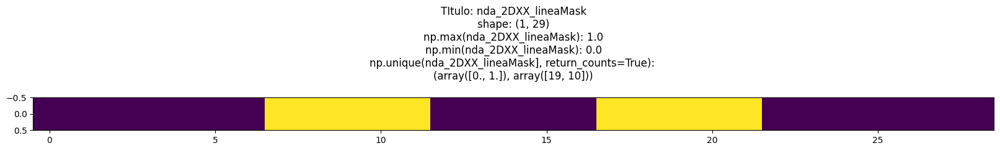

####################################
####################################
####################################
####################################
Plotear RAW


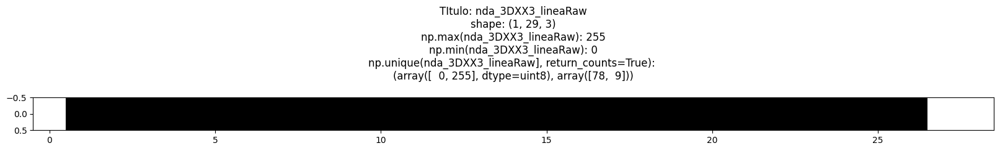

####################################
####################################
####################################
####################################
nda_3DXX2_arrProbmap.shape:  (1, 29, 2)
np.unique(nda_3DXX2_arrProbmap[:,:,0]):  [0.49 0.51]
np.unique(nda_3DXX2_arrProbmap[:,:,1]):  [0.49 0.51]
nda_3DXX2_arrProbmap.shape:  (1, 29, 2)
nda_3DXX2_arrProbmap[:,:,0].shape:  (1, 29)
nda_3DXX2_arrProbmap[:,:,1].shape:  (1, 29)
Plotear PROBDLMAP
Probmaps nda_3DXX2_ProbDLmap
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0], return_counts=True):  (array([0.49, 0.51]), array([10, 19]))
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1], return_counts=True):  (array([0.49, 0.51]), array([19, 10]))


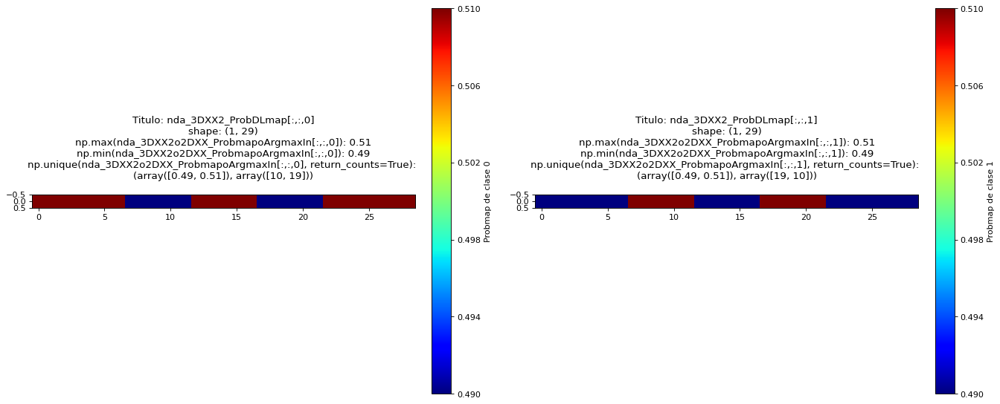

Plotear PROBDLMAP_ARGMAX
Segmentación (es argmax)nda_3DXX2_ProbDLmap_Argmax
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn, return_counts=True):  (array([0, 1]), array([19, 10]))


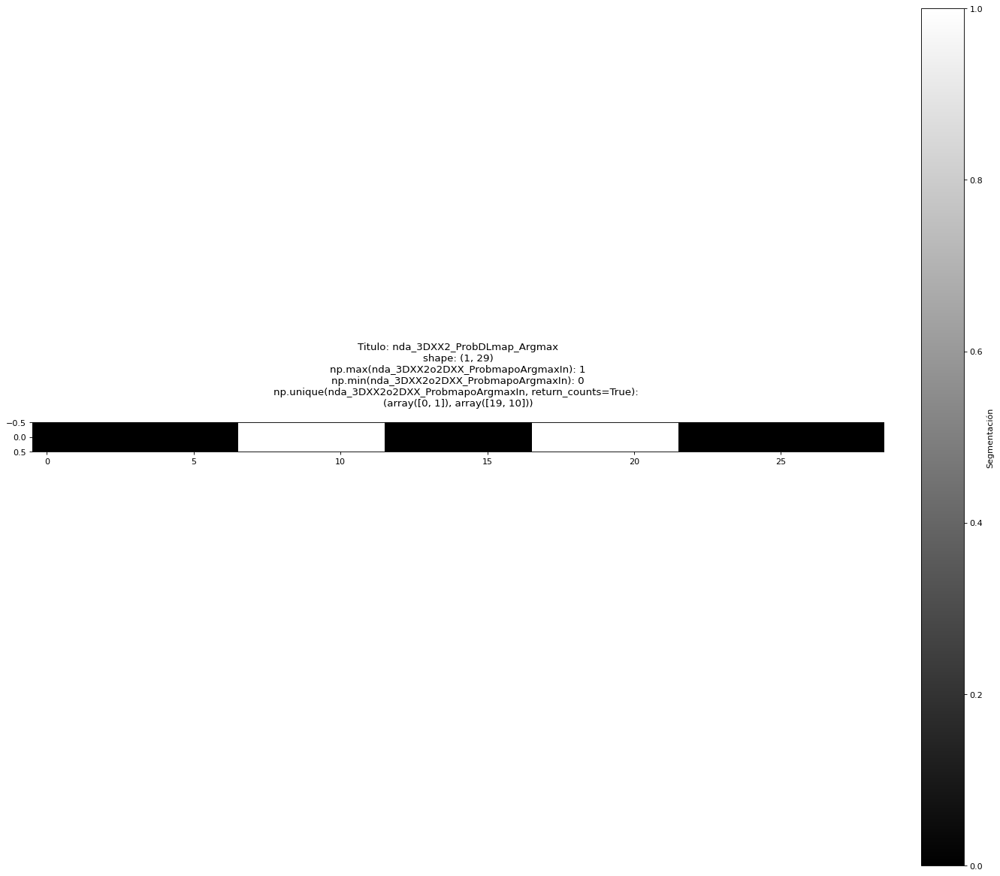

PROB_CRF
PROB_CRF
PROB_CRF
Plotear PROBCRFMAP
Probmaps nda_3DXX2_ProbCRFmap
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0], return_counts=True):  (array([0.46427187, 0.46503472, 0.4661966 , 0.4761203 , 0.4768463 ,
       0.48057717, 0.5300268 , 0.5315098 , 0.5499468 , 0.5524481 ,
       0.55946505, 0.56449145, 0.57129216, 0.6758729 , 0.6889468 ,
       0.8117014 , 0.8207896 , 0.88834697, 0.89245915, 0.9294254 ,
       0.93582815, 0.95450413, 0.95826906, 0.9596892 , 0.965844  ,
       0.9679251 , 0.96916807, 0.9696951 , 0.97389865], dtype=float32), array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1]))
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1], return_counts=True):  (array([0.02610138, 0.03030496, 0.03083195, 0.03207491, 0.03415597,
       0.04031077, 0.04173097, 0.04549586, 0.06417187, 0.07057457,
       0.10754088, 0.11165301, 0.17921042, 0.18829854, 0.3110532 ,
       0.3241271 , 0.42870784, 0.43550852, 0.44053498, 0.44755188,


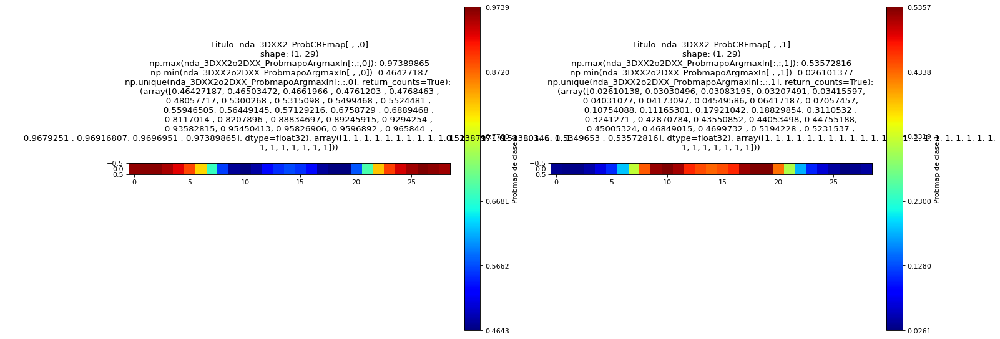

Plotear PROBCRFMAP_Argmax
Segmentación (es argmax)nda_2DXX_ProbCRFmap_Argmax
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn, return_counts=True):  (array([0, 1]), array([23,  6]))


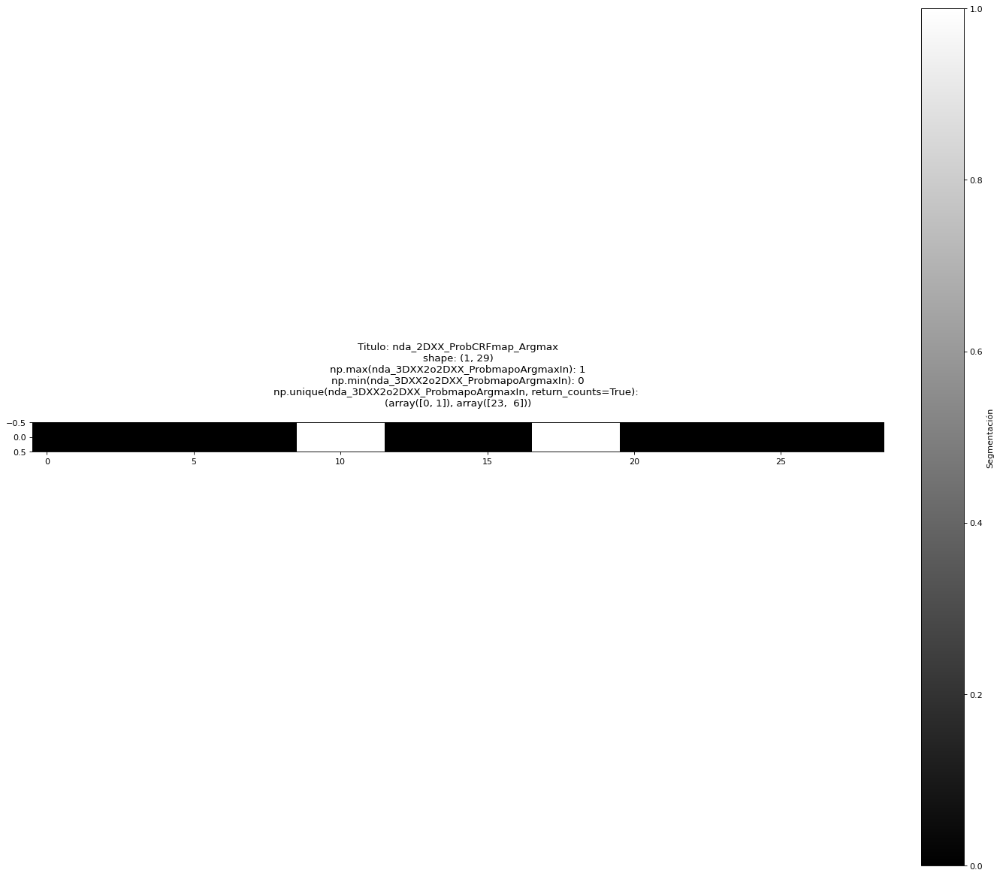

Plotear MASCARA imperfecta respecto a RAW


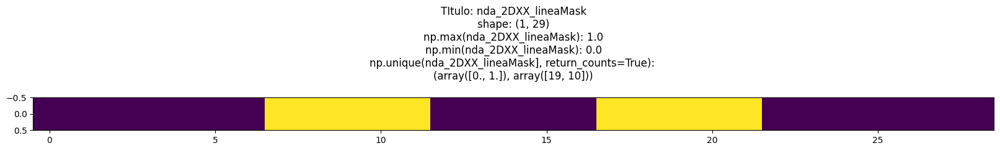

####################################
####################################
####################################
####################################
Plotear RAW


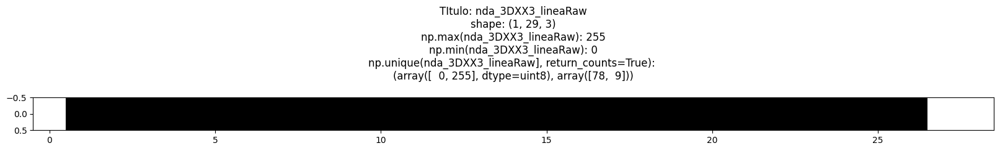

####################################
####################################
####################################
####################################
nda_3DXX2_arrProbmap.shape:  (1, 29, 2)
np.unique(nda_3DXX2_arrProbmap[:,:,0]):  [0.49 0.51]
np.unique(nda_3DXX2_arrProbmap[:,:,1]):  [0.49 0.51]
nda_3DXX2_arrProbmap.shape:  (1, 29, 2)
nda_3DXX2_arrProbmap[:,:,0].shape:  (1, 29)
nda_3DXX2_arrProbmap[:,:,1].shape:  (1, 29)
Plotear PROBDLMAP
Probmaps nda_3DXX2_ProbDLmap
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0], return_counts=True):  (array([0.49, 0.51]), array([10, 19]))
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1], return_counts=True):  (array([0.49, 0.51]), array([19, 10]))


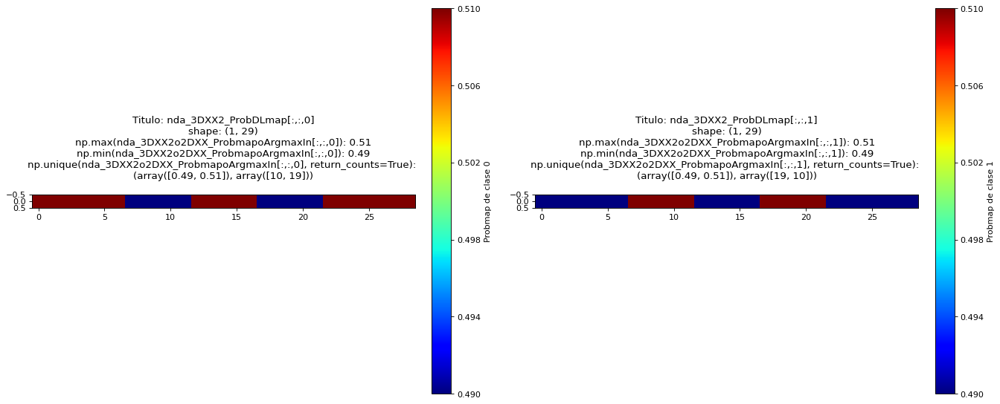

Plotear PROBDLMAP_ARGMAX
Segmentación (es argmax)nda_3DXX2_ProbDLmap_Argmax
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn, return_counts=True):  (array([0, 1]), array([19, 10]))


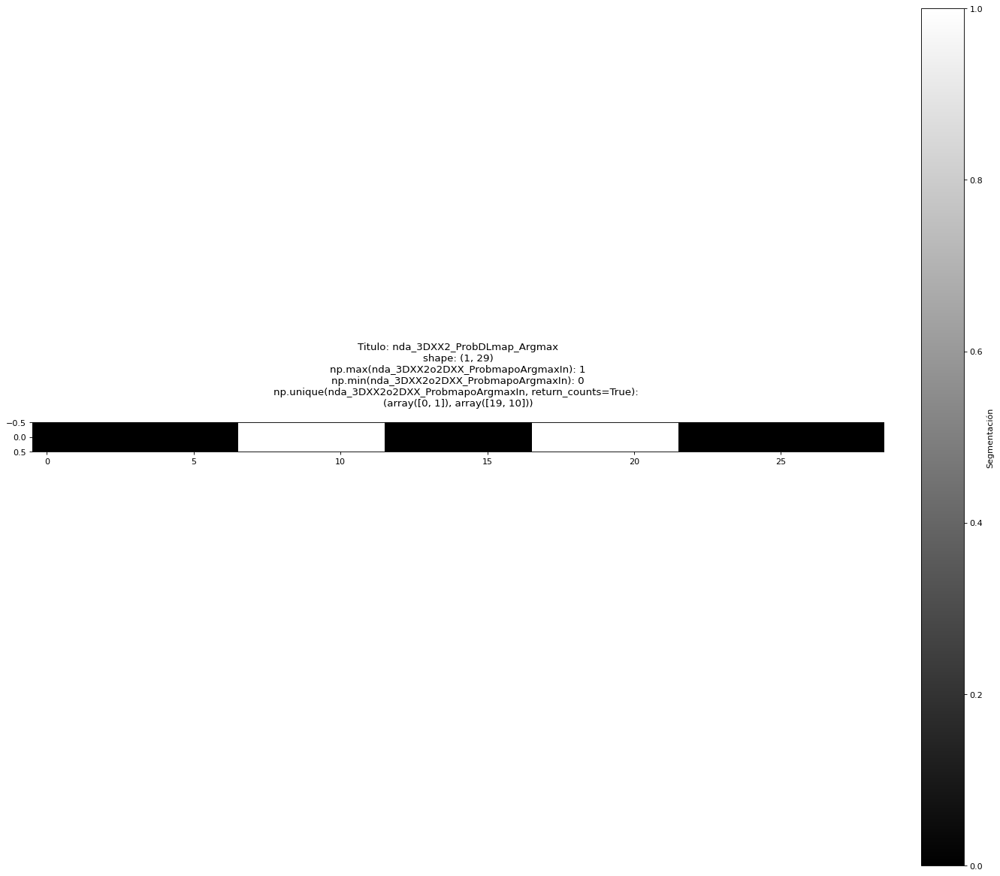

PROB_CRF
PROB_CRF
PROB_CRF
Plotear PROBCRFMAP
Probmaps nda_3DXX2_ProbCRFmap
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0], return_counts=True):  (array([0.66114646, 0.66565263, 0.67023087, 0.6824098 , 0.6837144 ,
       0.6875355 , 0.689261  , 0.7089961 , 0.72      , 0.7505566 ,
       0.7598524 , 0.7927963 , 0.79502624, 0.8312623 , 0.8316748 ,
       0.873321  , 0.8778799 , 0.89911324, 0.9058389 , 0.9110945 ,
       0.9169438 , 0.91823757, 0.9183174 , 0.9207948 , 0.92509764,
       0.9317768 , 0.93430346, 0.9348603 , 0.93806064], dtype=float32), array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1]))
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1], return_counts=True):  (array([0.06193934, 0.0651397 , 0.06569657, 0.06822317, 0.07490235,
       0.07920527, 0.08168265, 0.0817624 , 0.08305621, 0.08890554,
       0.09416109, 0.10088671, 0.12212012, 0.126679  , 0.16832516,
       0.16873766, 0.20497382, 0.20720373, 0.24014759, 0.24944341,


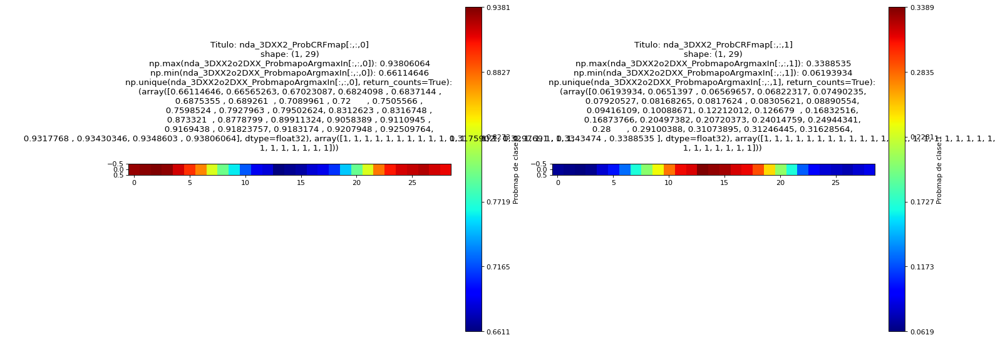

Plotear PROBCRFMAP_Argmax
Segmentación (es argmax)nda_2DXX_ProbCRFmap_Argmax
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn, return_counts=True):  (array([0]), array([29]))


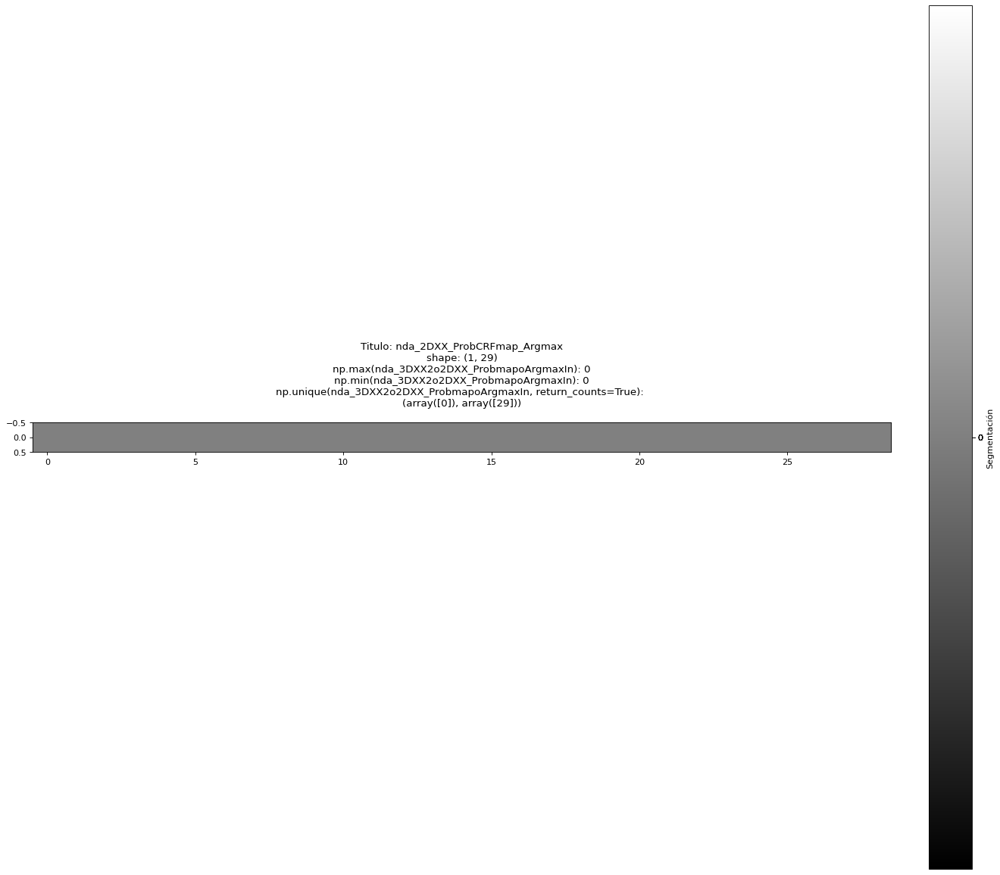

Plotear MASCARA imperfecta respecto a RAW


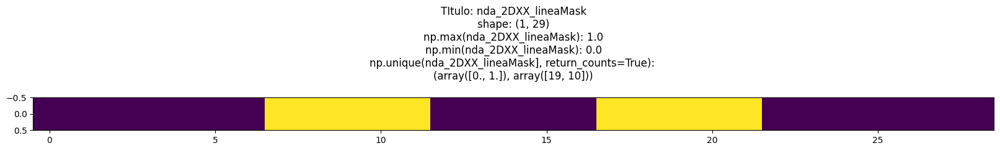

####################################
####################################
####################################
####################################
Plotear RAW


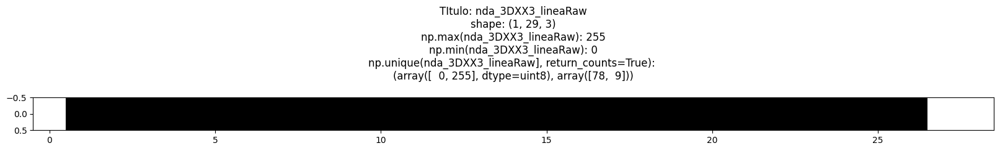

####################################
####################################
####################################
####################################
nda_3DXX2_arrProbmap.shape:  (1, 29, 2)
np.unique(nda_3DXX2_arrProbmap[:,:,0]):  [0.49 0.51]
np.unique(nda_3DXX2_arrProbmap[:,:,1]):  [0.49 0.51]
nda_3DXX2_arrProbmap.shape:  (1, 29, 2)
nda_3DXX2_arrProbmap[:,:,0].shape:  (1, 29)
nda_3DXX2_arrProbmap[:,:,1].shape:  (1, 29)
Plotear PROBDLMAP
Probmaps nda_3DXX2_ProbDLmap
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0], return_counts=True):  (array([0.49, 0.51]), array([10, 19]))
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1], return_counts=True):  (array([0.49, 0.51]), array([19, 10]))


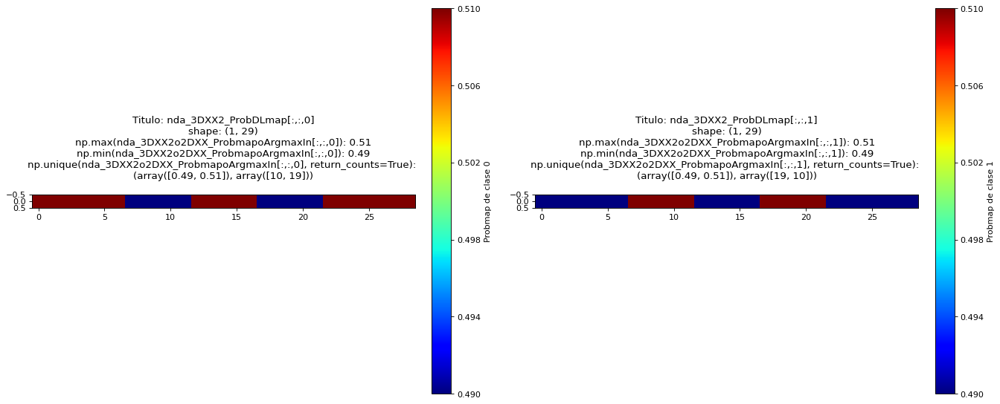

Plotear PROBDLMAP_ARGMAX
Segmentación (es argmax)nda_3DXX2_ProbDLmap_Argmax
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn, return_counts=True):  (array([0, 1]), array([19, 10]))


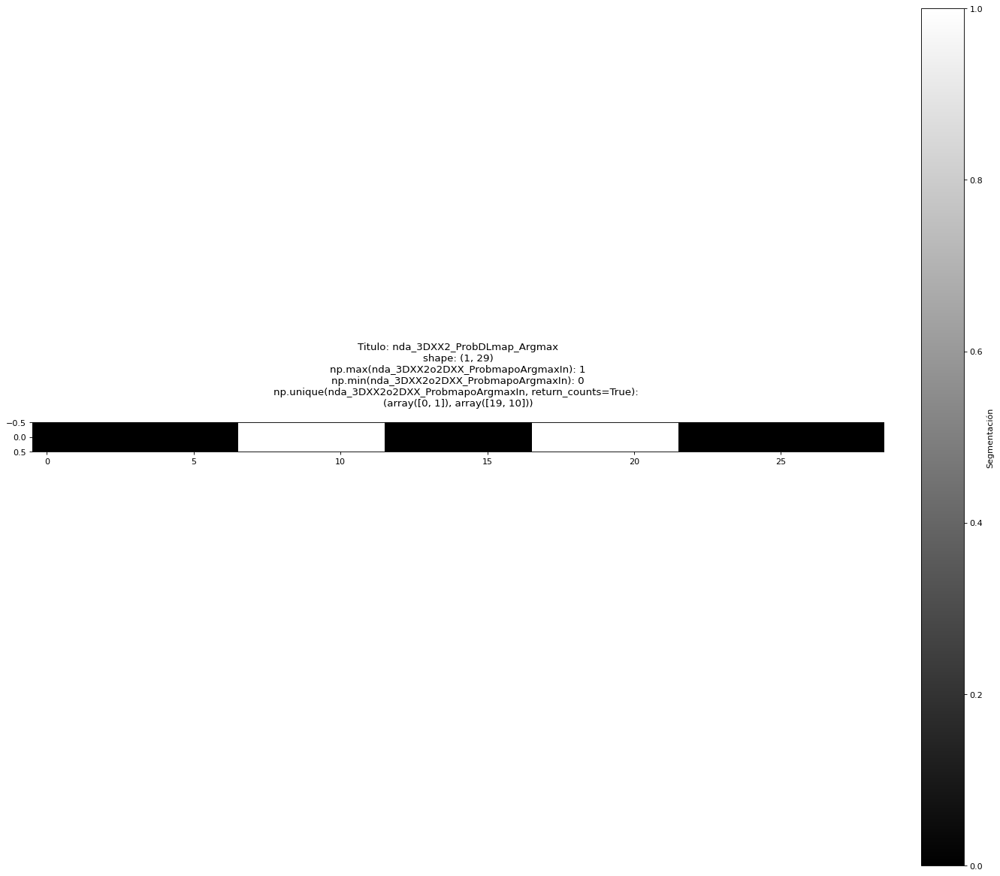

PROB_CRF
PROB_CRF
PROB_CRF
Plotear PROBCRFMAP
Probmaps nda_3DXX2_ProbCRFmap
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0], return_counts=True):  (array([0.7894126 , 0.7912899 , 0.7937286 , 0.7942139 , 0.79448813,
       0.79941434, 0.8004764 , 0.80228204, 0.8029039 , 0.81581324,
       0.8164815 , 0.82893056, 0.8296606 , 0.84192693, 0.84241265,
       0.862273  , 0.8648266 , 0.8650448 , 0.87187326, 0.8763129 ,
       0.87703   , 0.8791581 , 0.8800566 , 0.88364154, 0.8860384 ,
       0.88715947, 0.88732105, 0.8882499 , 0.8910096 ], dtype=float32), array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1]))
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1], return_counts=True):  (array([0.10899032, 0.1117501 , 0.11267896, 0.11284053, 0.11396155,
       0.11635846, 0.11994341, 0.12084191, 0.12296994, 0.1236871 ,
       0.12812673, 0.13495523, 0.1351734 , 0.137727  , 0.15758732,
       0.15807311, 0.1703394 , 0.17106943, 0.18351851, 0.18418677,


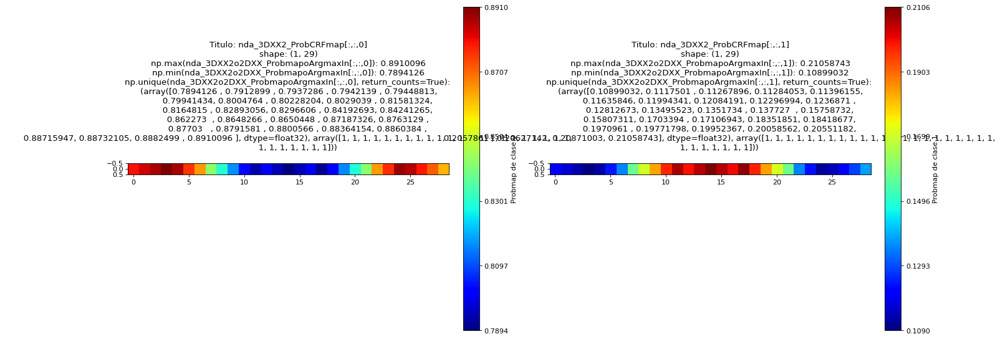

Plotear PROBCRFMAP_Argmax
Segmentación (es argmax)nda_2DXX_ProbCRFmap_Argmax
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn, return_counts=True):  (array([0]), array([29]))


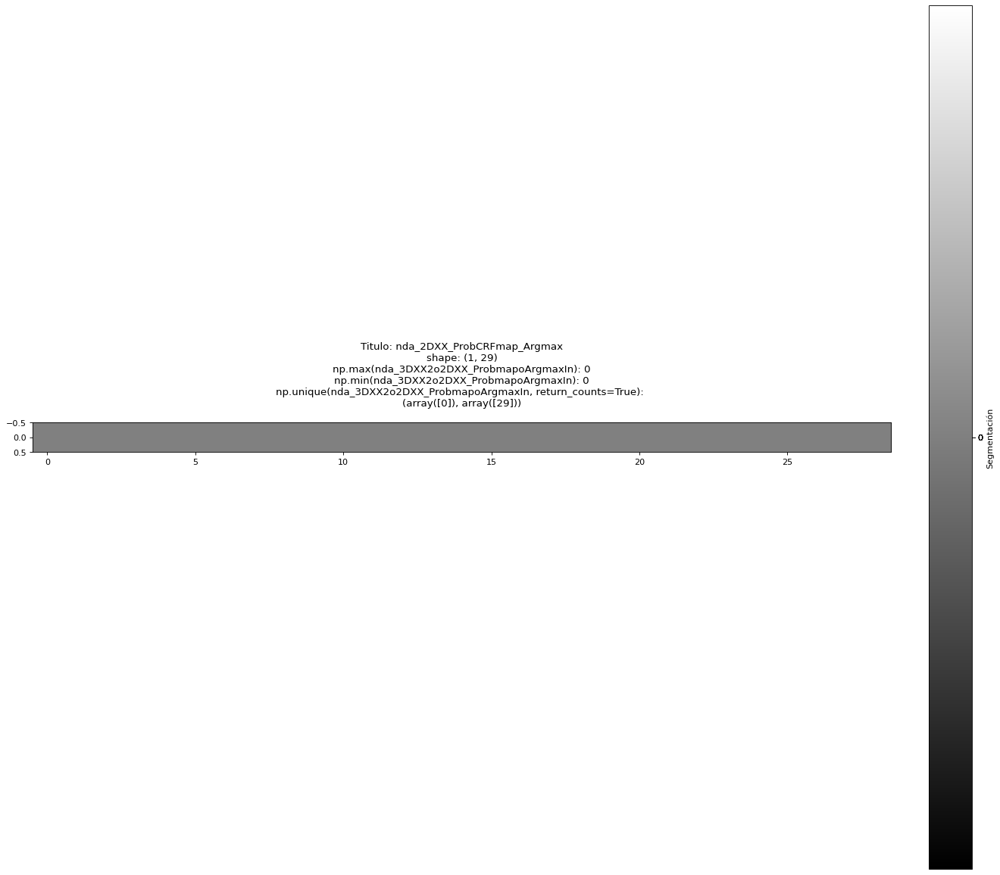

Plotear MASCARA imperfecta respecto a RAW


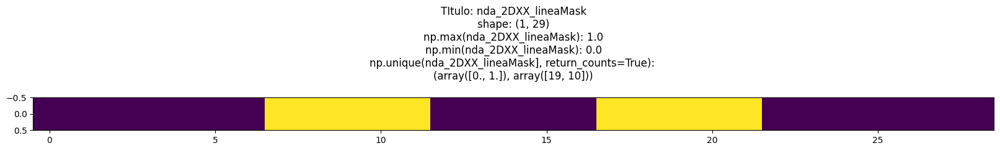

####################################
####################################
####################################
####################################
Plotear RAW


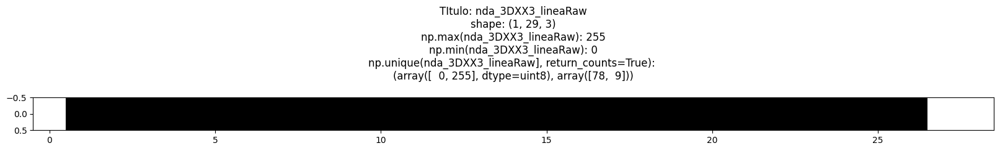

####################################
####################################
####################################
####################################
nda_3DXX2_arrProbmap.shape:  (1, 29, 2)
np.unique(nda_3DXX2_arrProbmap[:,:,0]):  [0.49 0.51]
np.unique(nda_3DXX2_arrProbmap[:,:,1]):  [0.49 0.51]
nda_3DXX2_arrProbmap.shape:  (1, 29, 2)
nda_3DXX2_arrProbmap[:,:,0].shape:  (1, 29)
nda_3DXX2_arrProbmap[:,:,1].shape:  (1, 29)
Plotear PROBDLMAP
Probmaps nda_3DXX2_ProbDLmap
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0], return_counts=True):  (array([0.49, 0.51]), array([10, 19]))
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1], return_counts=True):  (array([0.49, 0.51]), array([19, 10]))


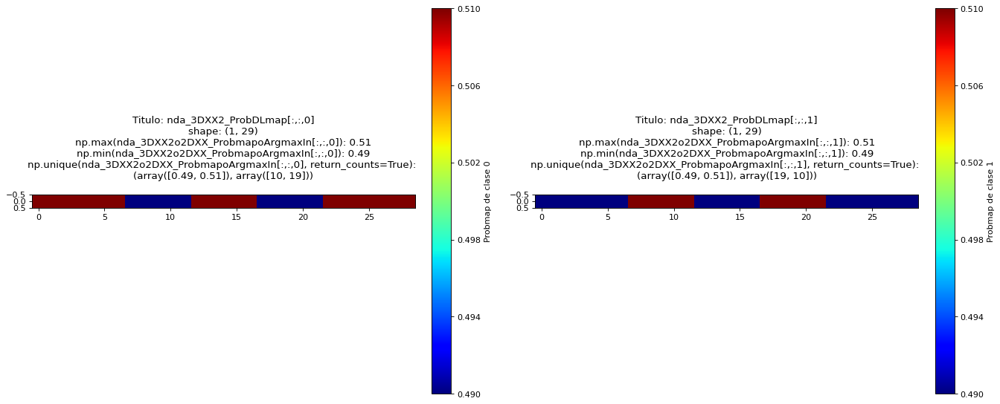

Plotear PROBDLMAP_ARGMAX
Segmentación (es argmax)nda_3DXX2_ProbDLmap_Argmax
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn, return_counts=True):  (array([0, 1]), array([19, 10]))


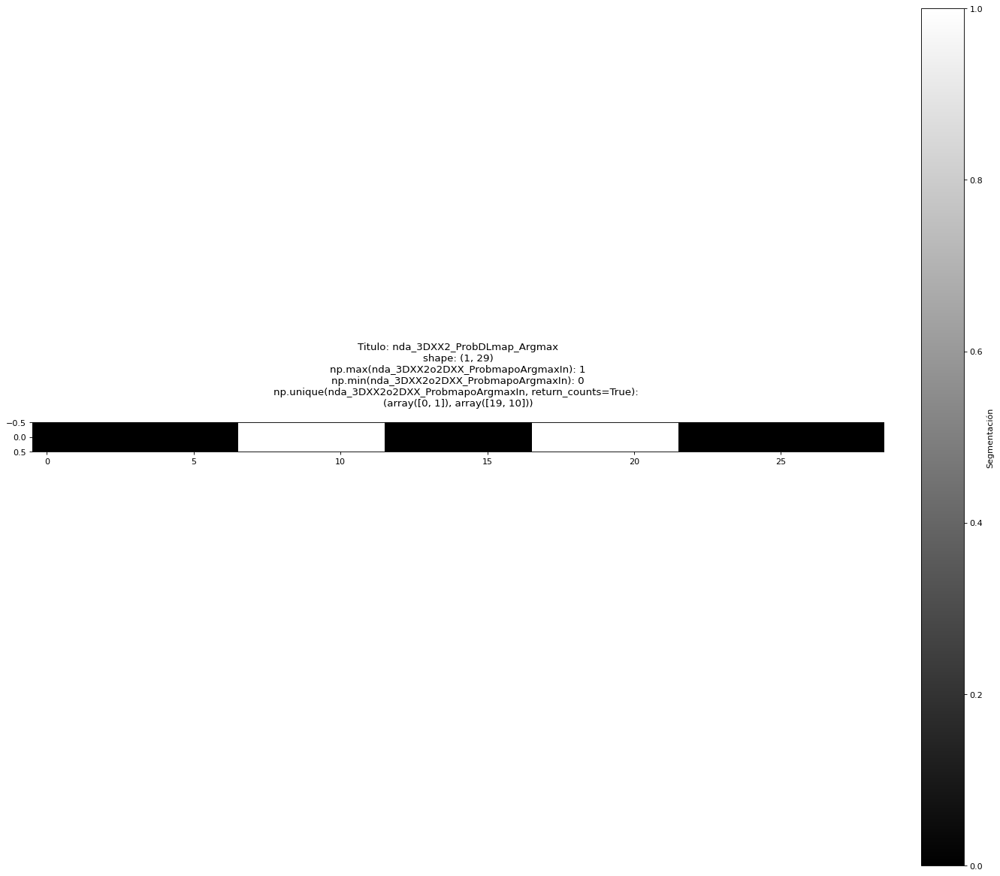

PROB_CRF
PROB_CRF
PROB_CRF
Plotear PROBCRFMAP
Probmaps nda_3DXX2_ProbCRFmap
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0], return_counts=True):  (array([0.7728762 , 0.7756217 , 0.778426  , 0.7815956 , 0.78373945,
       0.78404224, 0.7867593 , 0.78916055, 0.7903006 , 0.79191005,
       0.797046  , 0.7980658 , 0.80558   , 0.80830336, 0.80874497,
       0.8094771 , 0.81201696, 0.8153415 , 0.81566244, 0.8166243 ,
       0.8181363 , 0.8186813 , 0.8262641 , 0.82756877, 0.8351963 ,
       0.8370788 , 0.83906704, 0.8412221 , 0.84349114], dtype=float32), array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1]))
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1], return_counts=True):  (array([0.1565089 , 0.15877791, 0.16093299, 0.1629212 , 0.16480365,
       0.17243122, 0.17373598, 0.18131869, 0.18186371, 0.18337569,
       0.18433751, 0.1846585 , 0.18798304, 0.19052288, 0.19125497,
       0.19169666, 0.19441994, 0.20193426, 0.20295401, 0.20808992,


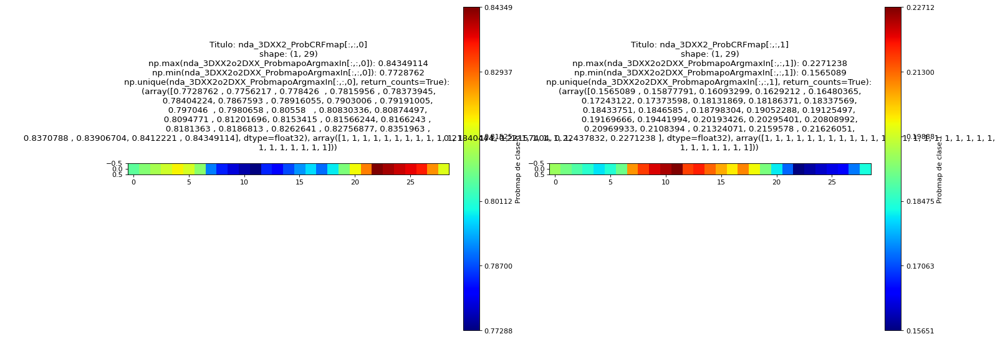

Plotear PROBCRFMAP_Argmax
Segmentación (es argmax)nda_2DXX_ProbCRFmap_Argmax
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn, return_counts=True):  (array([0]), array([29]))


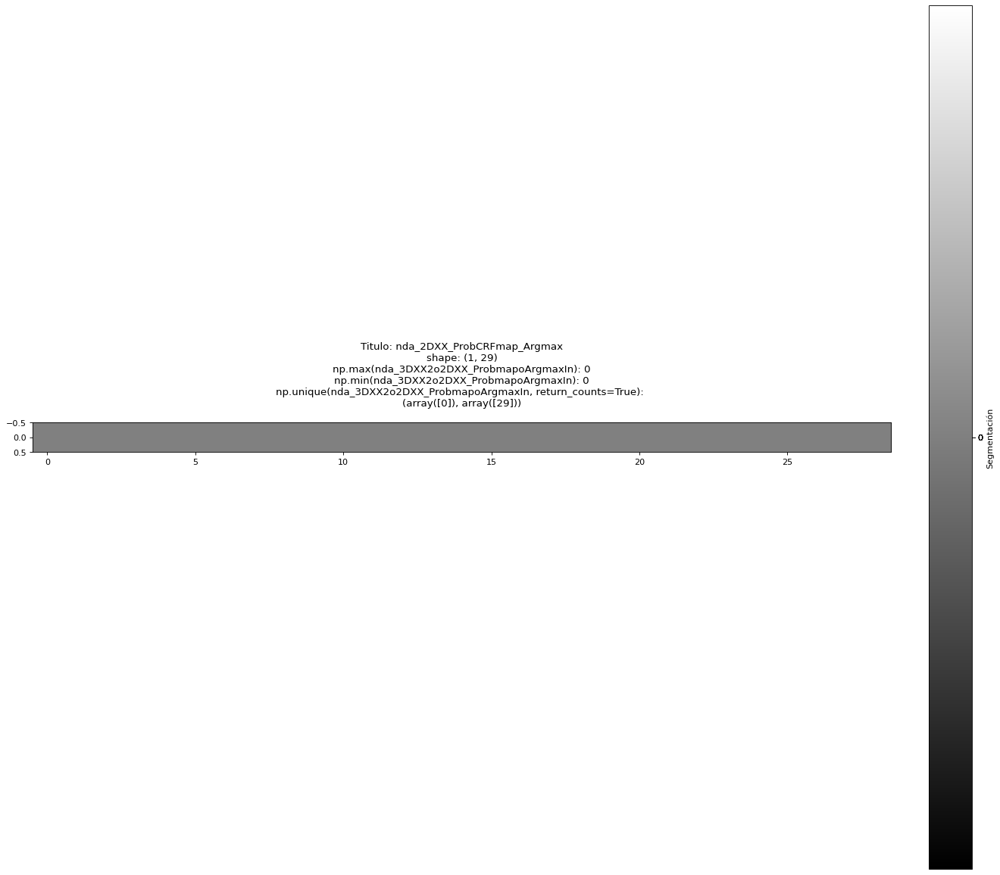

In [65]:
#if ("func_experimentarPydenseCRF"=="func_experimentarPydenseCRF"):    
if __name__ == "__main__":
    print("efecto domino tratando?")
    print("ojo mascara da lo mismo porque uso gaussian, si influyera seria un error")
    print("Se puede apreciar como al subir el sdx se va suavizando mas la imagen")
    int_largo1=29#41
    lst_int_pixelesBlancosRaw1=[0,-1,-2]
    #lst_int_pixelesBlancosMask1=[int_largo1//2-1,int_largo1//2,int_largo1//2+1]
    lst_int_pixelesBlancosMask1=[int_largo1//2,int_largo1//2+1]
    int_CFijoIn21=0.51
    lst_int_inferenceIn11=5
    int_pairwisebilateralCompatIn11=5
    str_PairwiseoKernelIn1="GaussianoSmoothnessKernel"

    
    lst_lst_int_pixelesBlancosMask1=[
                                    #[int_largo1//2],
                                    #[int_largo1//2,int_largo1//2+2],
                                    #[int_largo1//2-2,int_largo1//2,int_largo1//2+2],
                                    #[int_largo1//2-4,int_largo1//2-2,int_largo1//2,int_largo1//2+2,int_largo1//2+4],
        
        
                                    #[int_largo1//2-6,int_largo1//2-4,int_largo1//2-2,int_largo1//2,int_largo1//2+2,int_largo1//2+4,int_largo1//2+6],
                                    [int_largo1//2-7,int_largo1//2-6,int_largo1//2-5,int_largo1//2-4,int_largo1//2-3,int_largo1//2+3,int_largo1//2+4,int_largo1//2+5,int_largo1//2+6,int_largo1//2+7],
                                    
        
        
        
                                    #[int_largo1//2-8,int_largo1//2-6,int_largo1//2-4,int_largo1//2-2,int_largo1//2,int_largo1//2+2,int_largo1//2+4,int_largo1//2+6,int_largo1//2+8],
                                    #[int_largo1//2-10,int_largo1//2-8,int_largo1//2-6,int_largo1//2-4,int_largo1//2-2,int_largo1//2,int_largo1//2+2,int_largo1//2+4,int_largo1//2+6,int_largo1//2+8,int_largo1//2+10],
                                    #[int_largo1//2-12,int_largo1//2-10,int_largo1//2-8,int_largo1//2-6,int_largo1//2-4,int_largo1//2-2,int_largo1//2,int_largo1//2+2,int_largo1//2+4,int_largo1//2+6,int_largo1//2+8,int_largo1//2+10,int_largo1//2+12],
                                    #[int_largo1//2-14,int_largo1//2-12,int_largo1//2-10,int_largo1//2-8,int_largo1//2-6,int_largo1//2-4,int_largo1//2-2,int_largo1//2,int_largo1//2+2,int_largo1//2+4,int_largo1//2+6,int_largo1//2+8,int_largo1//2+10,int_largo1//2+12,int_largo1//2+14],
        
                                    ]
 
    lst_tpl_ParametroXYIn1=[
                            (1,1),
                            (2,1),
                            (3,1),
                            (4,1),
                            (5,1)
                            ]
    
    if ("probarSDXY"!="probarSDXY"): #No influye el SDXY porque es una imagen horizontal, lo cual esta correcto
        lst_tpl_ParametroXYIn1=[
                                (1,1),
                                (1,2),
                                (1,3),
                                (1,4),
                                (1,5)
                                ]
    for lst_lst_int_pixelesBlancosMask1_i in lst_lst_int_pixelesBlancosMask1:
        for lst_tpl_ParametroXYIn1_i in lst_tpl_ParametroXYIn1:
            
            func_experimentarPydenseCRF(int_largo=int_largo1,
                                        int_CFijoIn2 =int_CFijoIn21,
                                        tpl_ParametroXYIn1=lst_tpl_ParametroXYIn1_i,#(1,1)
                                        tpl_ParametroRGBIn1=(1,1,1),
                                        lst_int_inferenceIn1=lst_int_inferenceIn11,
                                        int_pairwisebilateralCompatIn1=int_pairwisebilateralCompatIn11,
                                        str_PairwiseoKernelIn=str_PairwiseoKernelIn1,#["GaussianoSmoothnessKernel", "BilateraloAppearanceKernel"]
                                        lst_int_pixelesBlancosMask=lst_lst_int_pixelesBlancosMask1_i,
                                        lst_int_pixelesBlancosRaw=lst_int_pixelesBlancosRaw1
                                       )

In [66]:
if __name__ == "__main__":
#if ("func_experimentarPydenseCRF"=="func_experimentarPydenseCRF"):
    def func_experimentarPydenseCRF2D(int_largo, #El largo del trocito
                                    int_CFijoIn2,#Probabilidad
                                    tpl_ParametroXYIn1,#(1,1)
                                    tpl_ParametroRGBIn1,
                                    lst_int_inferenceIn1,
                                    int_pairwisebilateralCompatIn1,
                                    str_PairwiseoKernelIn,#["GaussianoSmoothnessKernel", "BilateraloAppearanceKernel"]
                                    lst_int_pixelesBlancosMask,#Cuales pixeles cambiar
                                    lst_int_pixelesBlancosRaw,#Cuales pixeles cambiar
                                    int_intervalo
                                   ):
        #if("parametros"=="parametros"):
       
            

        nda_2DXX_lineaMask=np.zeros(shape=(int_largo,int_largo))
        
        
        nda_2DXX_lineaMask[1::int_intervalo, ::int_intervalo] = 1  # Rows 2, 4, 6, ... (0-based index) have 1s in even columns
        nda_2DXX_lineaMask[::int_intervalo, 1::int_intervalo] = 1  # Rows 1, 3, 5, ... (0-based index) have 1s in odd columns


        if False:
            for int_largo_i in range(0,int_largo):
                #for lst_int_pixelesBlancosMask_i in lst_int_pixelesBlancosMask:
                nda_2DXX_lineaMask[int_largo_i,lst_int_pixelesBlancosMask_i]=1
                nda_2DXX_lineaMask[lst_int_pixelesBlancosMask_i,int_largo_i]=1
            
        

        print("Plotear MASCARA imperfecta respecto a RAW")
        plt.figure(figsize=(20, 20))
        plt.imshow(nda_2DXX_lineaMask)
        plt.title("TItulo: "+"nda_2DXX_lineaMask"+"\n"+
                 "shape: "+str(nda_2DXX_lineaMask.shape)+"\n"+
                  "np.max(nda_2DXX_lineaMask): "+ str(np.max(nda_2DXX_lineaMask))+"\n"+
                  "np.min(nda_2DXX_lineaMask): "+ str(np.min(nda_2DXX_lineaMask))+"\n"+
                  "np.unique(nda_2DXX_lineaMask], return_counts=True): \n"+ str(np.unique(nda_2DXX_lineaMask, return_counts=True))+"\n"
                 )
       
        plt.show()



        print("####################################")
        print("####################################")
        print("####################################")
        print("####################################")
        
        #nda_3DXX3_lineaRaw=np.zeros(shape=(1,int_largo,3))
        nda_3DXX3_lineaRaw=np.zeros(shape=(int_largo,int_largo, 3))
        nda_3DXX3_lineaRaw=np.uint8(nda_3DXX3_lineaRaw)
        

        nda_3DXX3_lineaRaw[1::int_intervalo, ::int_intervalo] = 255  # Rows 2, 4, 6, ... (0-based index) have 1s in even columns
        nda_3DXX3_lineaRaw[::int_intervalo, 1::int_intervalo] = 255  # Rows 1, 3, 5, ... (0-based index) have 1s in odd columns
        
        if False:
            for lst_int_pixelesBlancosRaw_i in lst_int_pixelesBlancosRaw:
                nda_3DXX3_lineaRaw[0,lst_int_pixelesBlancosRaw_i,:]=255
                nda_3DXX3_lineaRaw[lst_int_pixelesBlancosRaw_i,0,:]=255

        print("Plotear RAW")
        plt.figure(figsize=(20, 20))
        plt.imshow(nda_3DXX3_lineaRaw)
        plt.title("TItulo: "+"nda_3DXX3_lineaRaw"+"\n"+
                 "shape: "+str(nda_3DXX3_lineaRaw.shape)+"\n"+
                  "np.max(nda_3DXX3_lineaRaw): "+ str(np.max(nda_3DXX3_lineaRaw))+"\n"+
                  "np.min(nda_3DXX3_lineaRaw): "+ str(np.min(nda_3DXX3_lineaRaw))+"\n"+
                  "np.unique(nda_3DXX3_lineaRaw], return_counts=True): \n"+ str(np.unique(nda_3DXX3_lineaRaw, return_counts=True))+"\n"
                 )
        plt.show()
        #if (str_PairwiseoKernelIn=="GaussianoSmoothnessKernel"):
        #    nda_3DXX3_lineaRaw=None
        

        print("####################################")
        print("####################################")
        print("####################################")
        print("####################################")
        
        nda_3DXX2_ProbDLmap=class_CRF_Tests().func_probmapArtificialX(nda_2DXX_lineaMask, 
                                                                      int_CMaxIn=-1,
                                                                      int_IMaxIn=-1,
                                                                      int_CFijoIn=int_CFijoIn2,
                                                                      boo_AzarIn=False, 
                                                                      int_AzarWeight1In=-1)
        nda_3DXX2_ProbDLmap_Argmax = np.argmax(nda_3DXX2_ProbDLmap, axis=2)

        print("Plotear PROBDLMAP")
        class_CRF_Tests().func_plotearProbmapoArgmax(nda_3DXX2_ProbDLmap,"nda_3DXX2_ProbDLmap")
        
        print("Plotear PROBDLMAP_ARGMAX")
        class_CRF_Tests().func_plotearProbmapoArgmax(nda_3DXX2_ProbDLmap_Argmax,"nda_3DXX2_ProbDLmap_Argmax")


        print("PROB_CRF")
        print("PROB_CRF")
        print("PROB_CRF")
        #tpl_ParametroXYIn1=(1,1)
        #tpl_ParametroRGBIn1=(1,1,1)
        #int_inferenceIn1=5

        nda_3DXX2_ProbCRFmap=class_CRF().func_aplicar_CRF(nda_2DXX_sdXIn=0,
                                                          nda_2DXX_sdYIn=0,
                                                          #nda_3DXX2_probmapIn=nda_3DXX2_ProbDLmapRuido,
                                                          nda_3DXX2_probmapIn=nda_3DXX2_ProbDLmap,
                                                          #tpl_ParametroXYIn=(5,5), 
                                                          tpl_ParametroXYIn=tpl_ParametroXYIn1, 
                                                          #tpl_ParametroRGBIn=(10,10,10), 
                                                          tpl_ParametroRGBIn=tpl_ParametroRGBIn1, 
                                                          nda_3DXX3_imgRawIn=nda_3DXX3_lineaRaw, 
                                                          int_inferenceIn=lst_int_inferenceIn1, 
                                                          int_pairwisebilateralCompatIn=int_pairwisebilateralCompatIn1,
                                                          str_PairwiseoKernel=str_PairwiseoKernelIn)#str_PairwiseoKernel=="BilateraloAppearanceKernel" 
        nda_2DXX_ProbCRFmap_Argmax = np.argmax(nda_3DXX2_ProbCRFmap, axis=2)

        print("Plotear PROBCRFMAP")
        class_CRF_Tests().func_plotearProbmapoArgmax(nda_3DXX2_ProbCRFmap,"nda_3DXX2_ProbCRFmap")

        print("Plotear PROBCRFMAP_Argmax")
        class_CRF_Tests().func_plotearProbmapoArgmax(nda_2DXX_ProbCRFmap_Argmax,"nda_2DXX_ProbCRFmap_Argmax")
        
        return()

20230912
2D intento
Estudiar 2 cosas: Que pasa si pongo mas vecinos, y el efecto domino. QUe pasa si cambio el shape del kernel
################
################
##NUEVAITERACION
################
################
PROBAR kernel simetrico
lst_tpl_ParametroXYIn1_i:  (1, 1)
Plotear MASCARA imperfecta respecto a RAW


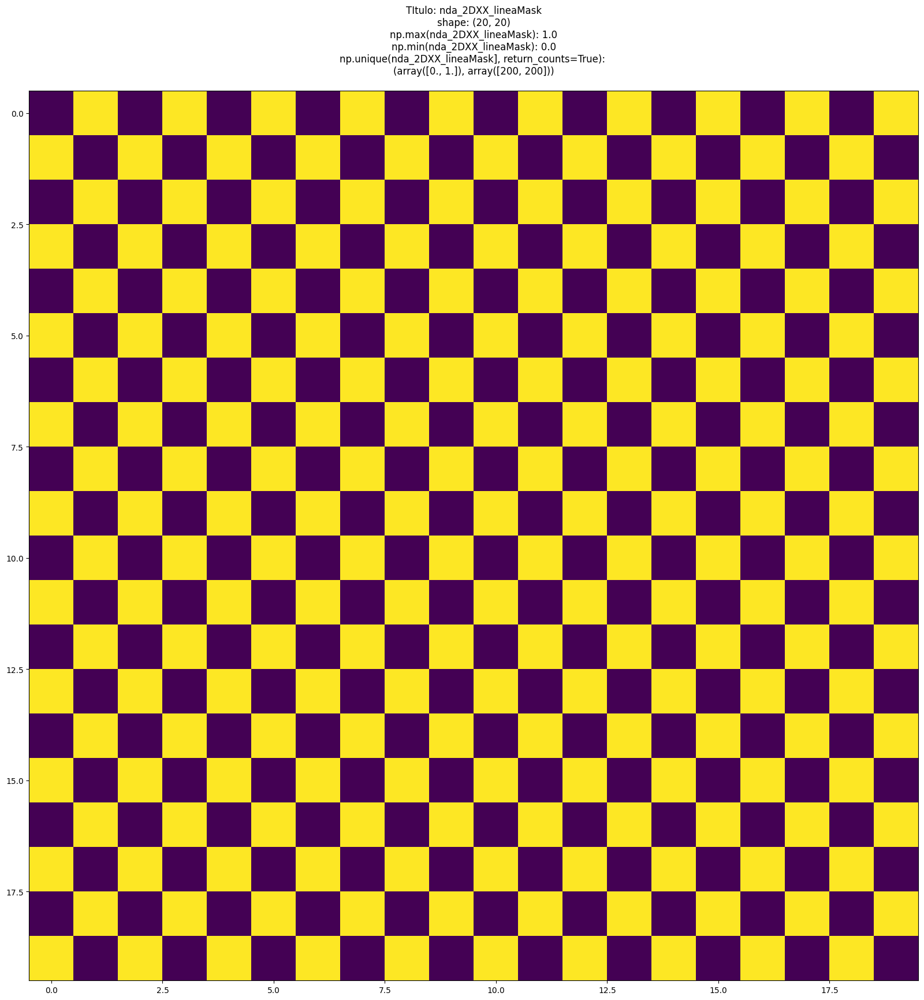

####################################
####################################
####################################
####################################
Plotear RAW


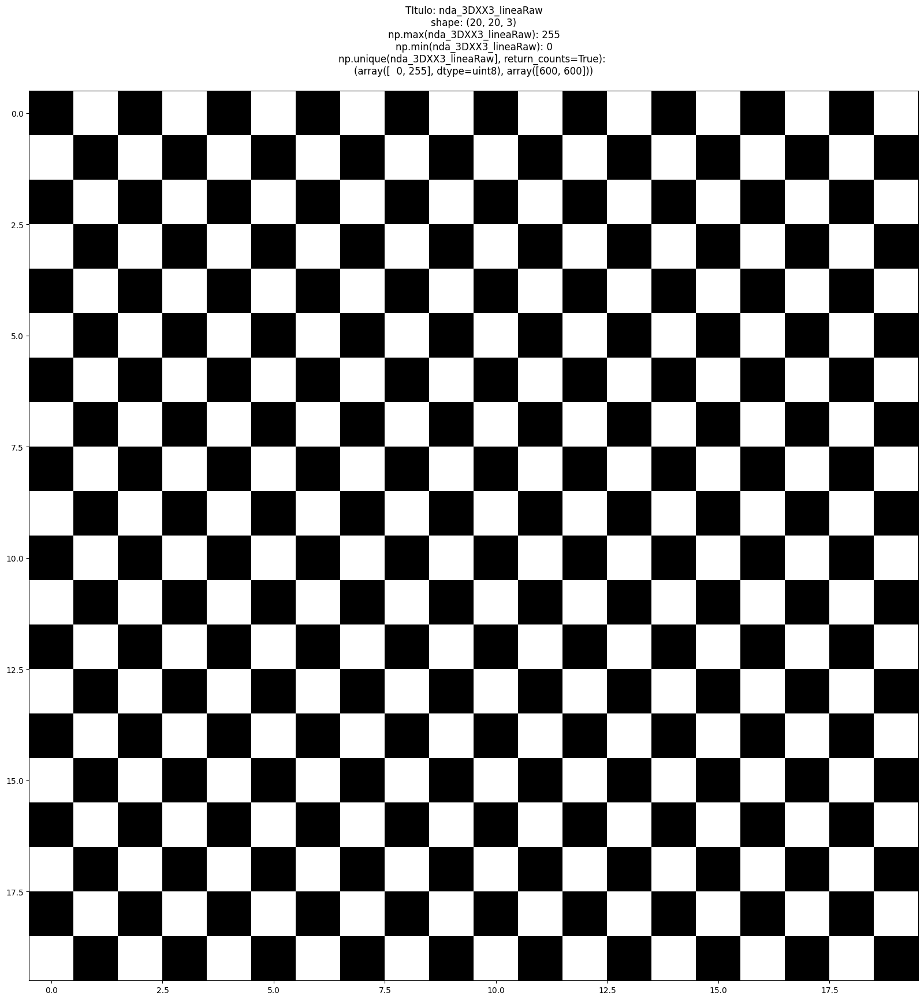

####################################
####################################
####################################
####################################
nda_3DXX2_arrProbmap.shape:  (20, 20, 2)
np.unique(nda_3DXX2_arrProbmap[:,:,0]):  [0.49 0.51]
np.unique(nda_3DXX2_arrProbmap[:,:,1]):  [0.49 0.51]
nda_3DXX2_arrProbmap.shape:  (20, 20, 2)
nda_3DXX2_arrProbmap[:,:,0].shape:  (20, 20)
nda_3DXX2_arrProbmap[:,:,1].shape:  (20, 20)
Plotear PROBDLMAP
Probmaps nda_3DXX2_ProbDLmap
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0], return_counts=True):  (array([0.49, 0.51]), array([200, 200]))
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1], return_counts=True):  (array([0.49, 0.51]), array([200, 200]))


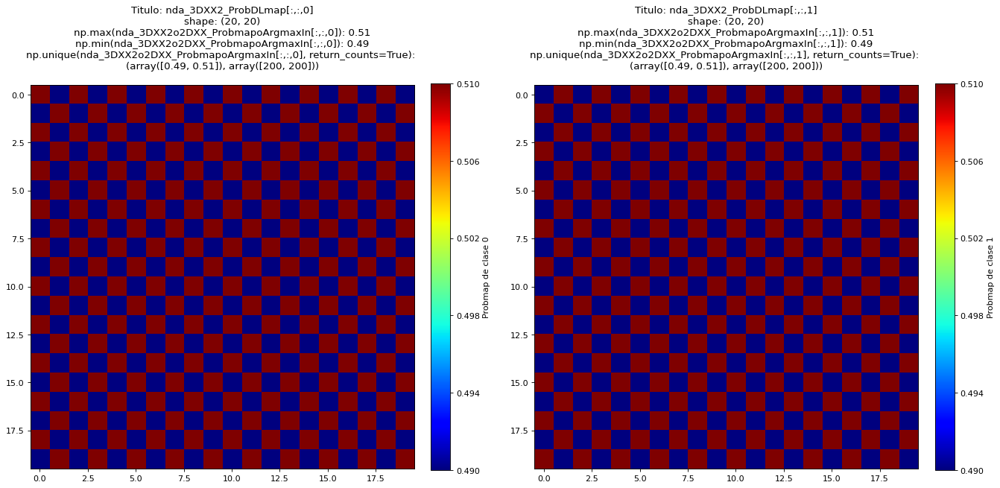

Plotear PROBDLMAP_ARGMAX
Segmentación (es argmax)nda_3DXX2_ProbDLmap_Argmax
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn, return_counts=True):  (array([0, 1]), array([200, 200]))


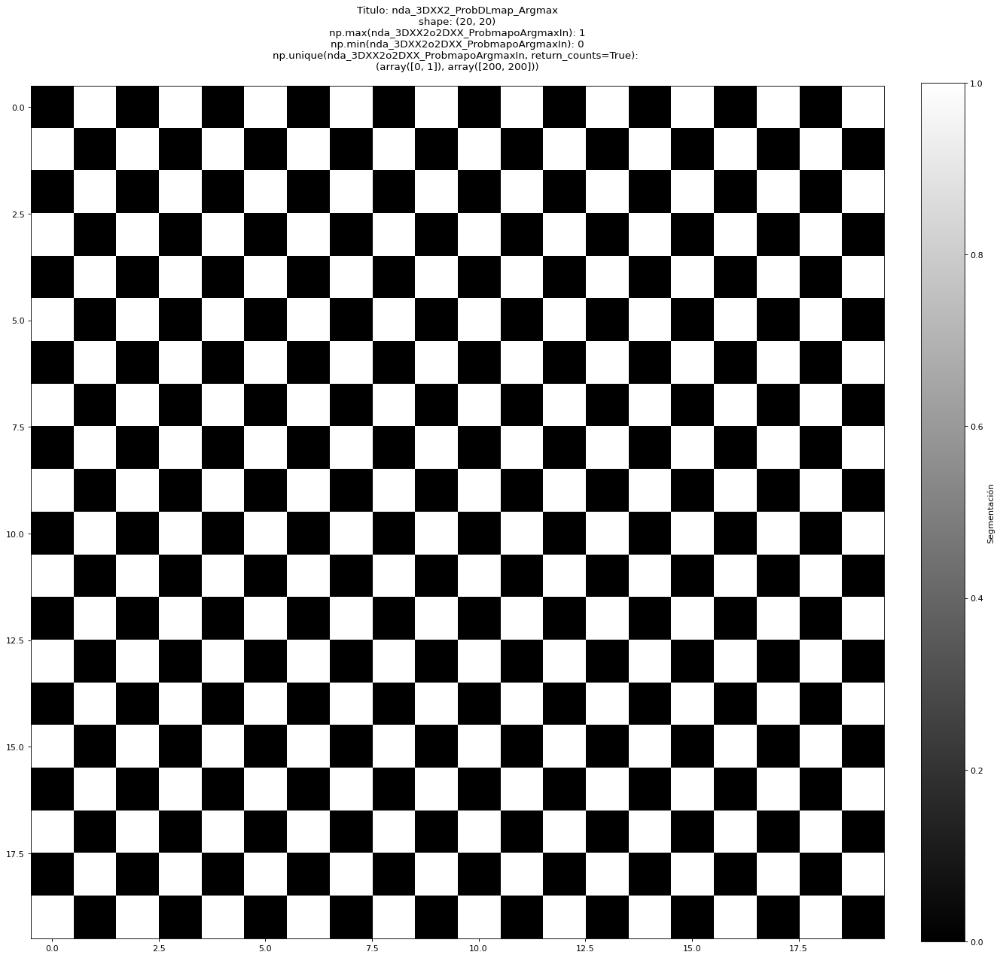

PROB_CRF
PROB_CRF
PROB_CRF
Plotear PROBCRFMAP
Probmaps nda_3DXX2_ProbCRFmap
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0], return_counts=True):  (array([0.4654898 , 0.46560782, 0.4718756 , 0.4731834 , 0.47580066,
       0.4759551 , 0.4782497 , 0.47937372, 0.4798555 , 0.48022294,
       0.48040578, 0.48061585, 0.48119727, 0.48273894, 0.48280963,
       0.4833258 , 0.4844464 , 0.48472306, 0.4850359 , 0.48516113,
       0.4854405 , 0.48552465, 0.48590088, 0.48597512, 0.48624334,
       0.48638734, 0.4874329 , 0.4876831 , 0.4877463 , 0.48794705,
       0.48831347, 0.48839682, 0.48854956, 0.48887128, 0.48889065,
       0.4889573 , 0.48898202, 0.48900586, 0.48915654, 0.48938072,
       0.48938334, 0.48957032, 0.48957232, 0.48958522, 0.4896024 ,
       0.48966584, 0.4896759 , 0.48975703, 0.48976886, 0.48978364,
       0.48982623, 0.4898435 , 0.48984814, 0.4898662 , 0.48988664,
       0.48990494, 0.4899388 , 0.48995626, 0.4899633 , 0.48996446,
       0.48996845, 0.48996916, 0.4899755 , 0.48

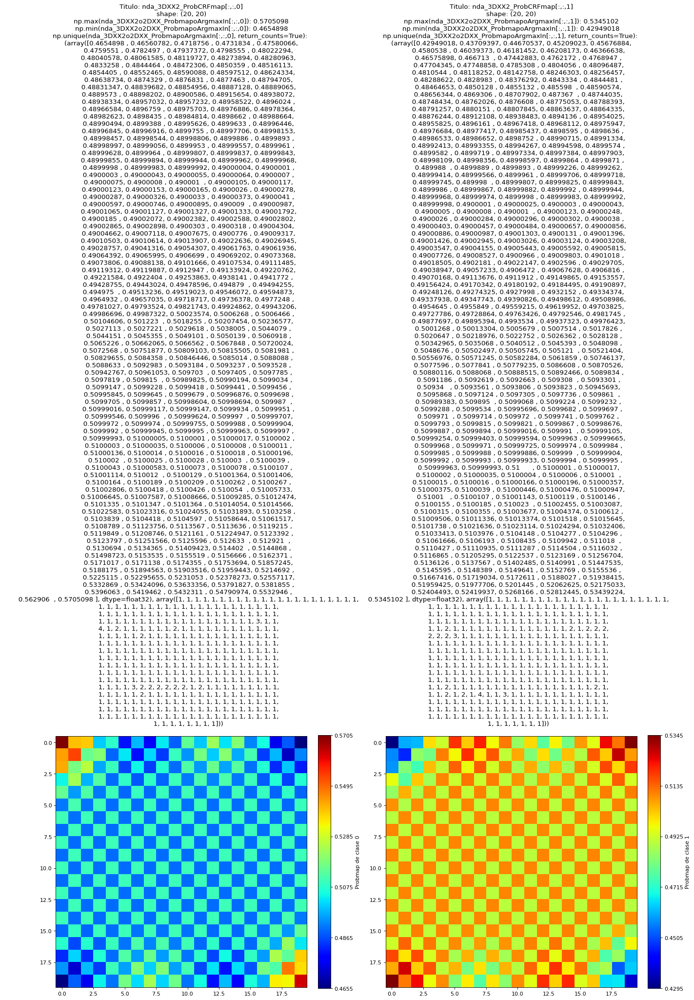

Plotear PROBCRFMAP_Argmax
Segmentación (es argmax)nda_2DXX_ProbCRFmap_Argmax
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn, return_counts=True):  (array([0, 1]), array([205, 195]))


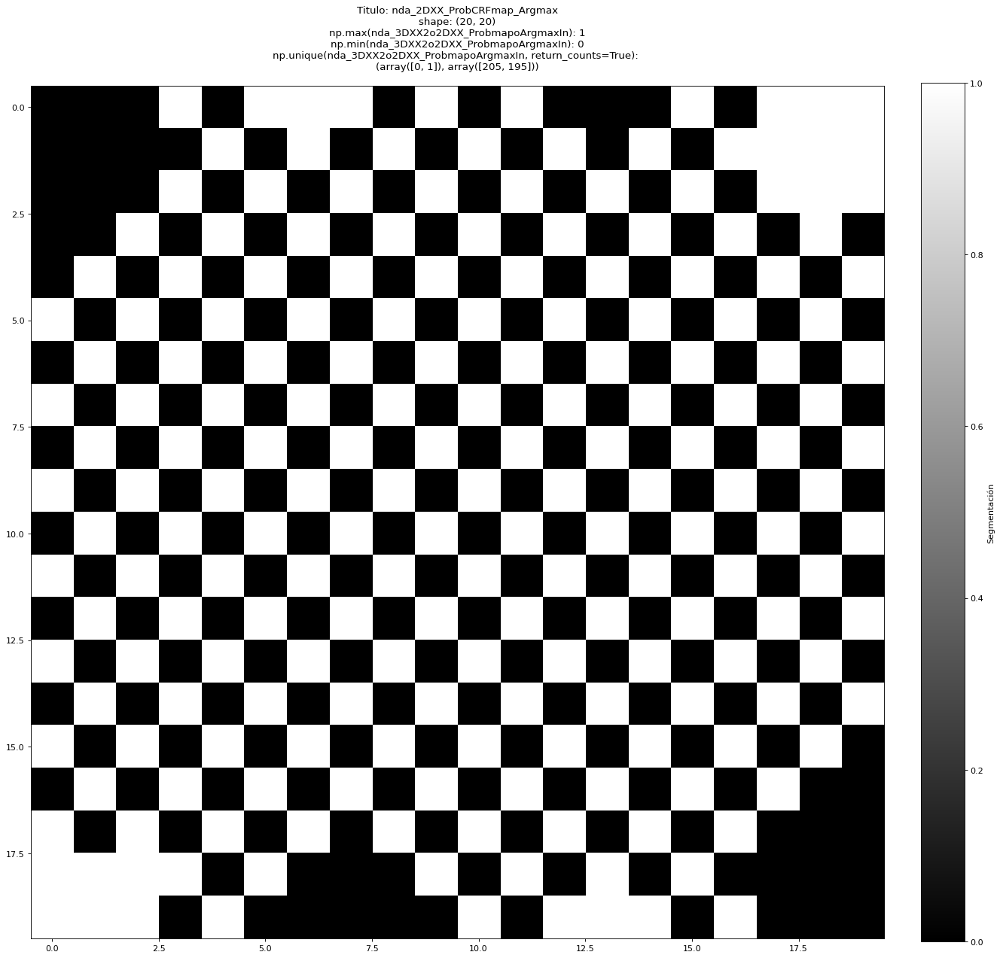

################
################
##NUEVAITERACION
################
################
PROBAR kernel simetrico
lst_tpl_ParametroXYIn1_i:  (2, 2)
Plotear MASCARA imperfecta respecto a RAW


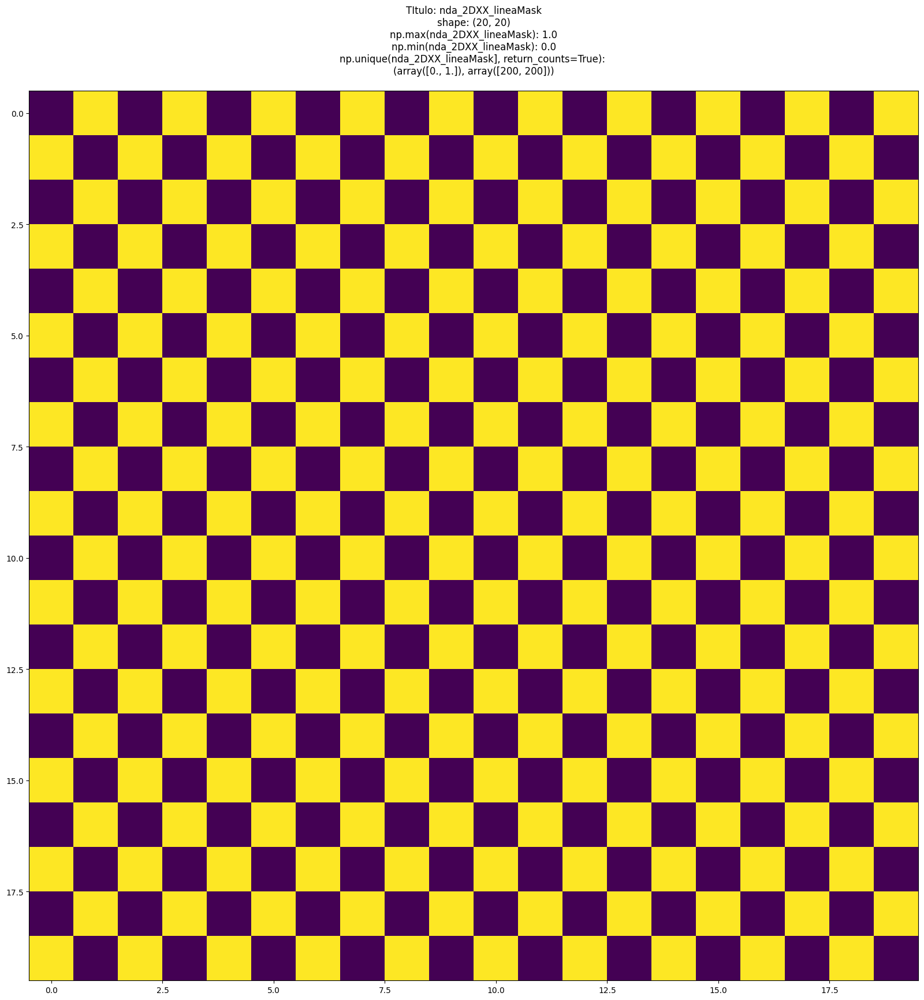

####################################
####################################
####################################
####################################
Plotear RAW


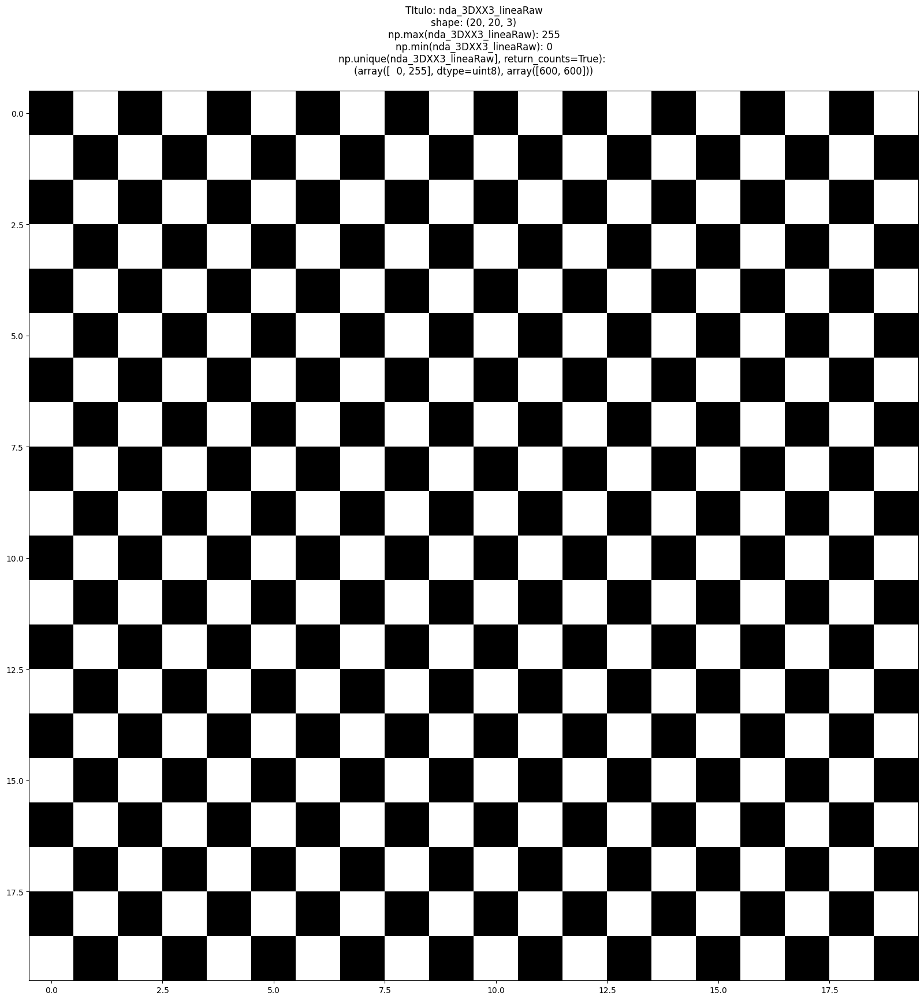

####################################
####################################
####################################
####################################
nda_3DXX2_arrProbmap.shape:  (20, 20, 2)
np.unique(nda_3DXX2_arrProbmap[:,:,0]):  [0.49 0.51]
np.unique(nda_3DXX2_arrProbmap[:,:,1]):  [0.49 0.51]
nda_3DXX2_arrProbmap.shape:  (20, 20, 2)
nda_3DXX2_arrProbmap[:,:,0].shape:  (20, 20)
nda_3DXX2_arrProbmap[:,:,1].shape:  (20, 20)
Plotear PROBDLMAP
Probmaps nda_3DXX2_ProbDLmap
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0], return_counts=True):  (array([0.49, 0.51]), array([200, 200]))
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1], return_counts=True):  (array([0.49, 0.51]), array([200, 200]))


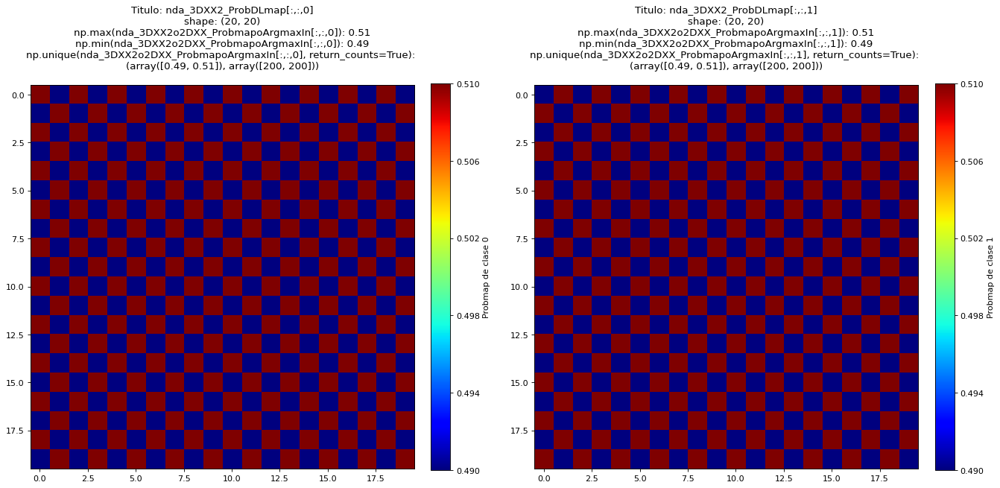

Plotear PROBDLMAP_ARGMAX
Segmentación (es argmax)nda_3DXX2_ProbDLmap_Argmax
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn, return_counts=True):  (array([0, 1]), array([200, 200]))


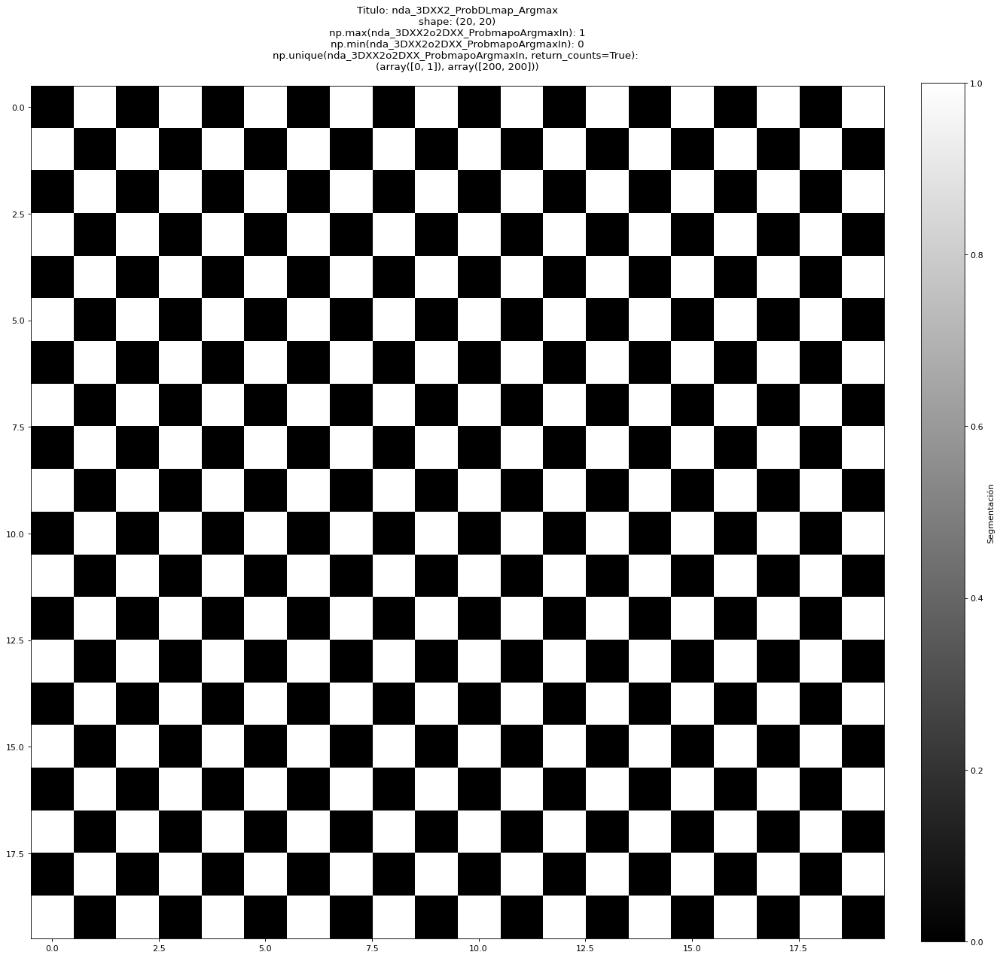

PROB_CRF
PROB_CRF
PROB_CRF
Plotear PROBCRFMAP
Probmaps nda_3DXX2_ProbCRFmap
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0], return_counts=True):  (array([0.4854016 , 0.48557946, 0.48573238, 0.48590985, 0.48608863,
       0.48614672, 0.48622403, 0.48623794, 0.48634946, 0.4864171 ,
       0.48670647, 0.48682958, 0.48703453, 0.48719323, 0.48746794,
       0.48749158, 0.48751596, 0.4875862 , 0.48760554, 0.4876123 ,
       0.4880431 , 0.4881185 , 0.48812386, 0.4881491 , 0.48817557,
       0.48823878, 0.48849893, 0.4885398 , 0.48856094, 0.48860615,
       0.48874545, 0.488794  , 0.48882863, 0.48886168, 0.48886326,
       0.48894024, 0.4889627 , 0.48901573, 0.48922217, 0.48924956,
       0.48925558, 0.48926958, 0.48932344, 0.48934457, 0.4893778 ,
       0.48939726, 0.48943052, 0.489431  , 0.48953032, 0.48953822,
       0.4895526 , 0.48955652, 0.48969007, 0.48969713, 0.48970875,
       0.48971167, 0.4897344 , 0.48974508, 0.48979324, 0.48979864,
       0.4898087 , 0.48981166, 0.4898451 , 0.48

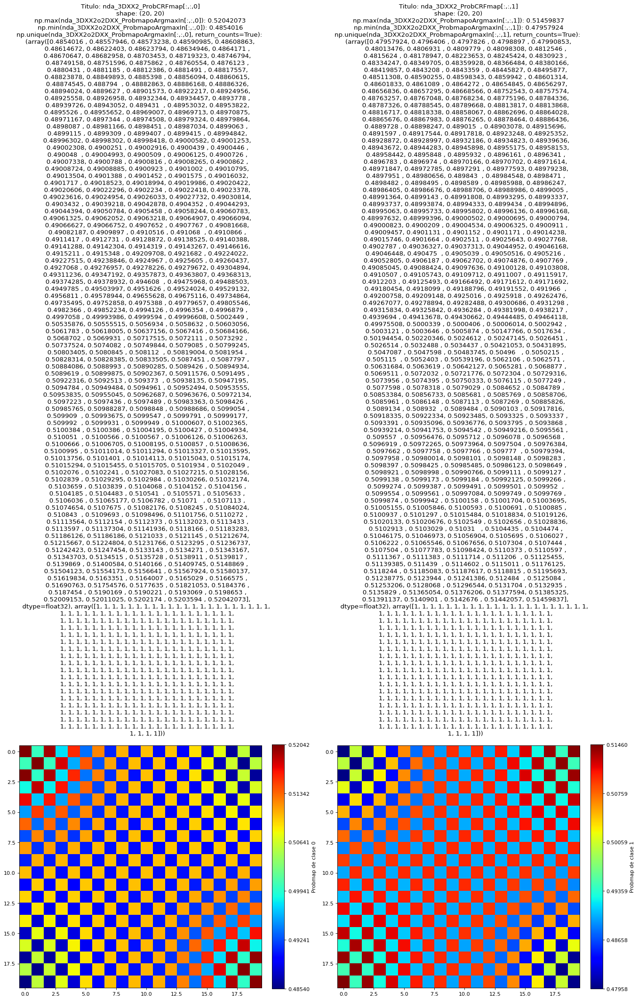

Plotear PROBCRFMAP_Argmax
Segmentación (es argmax)nda_2DXX_ProbCRFmap_Argmax
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn, return_counts=True):  (array([0, 1]), array([201, 199]))


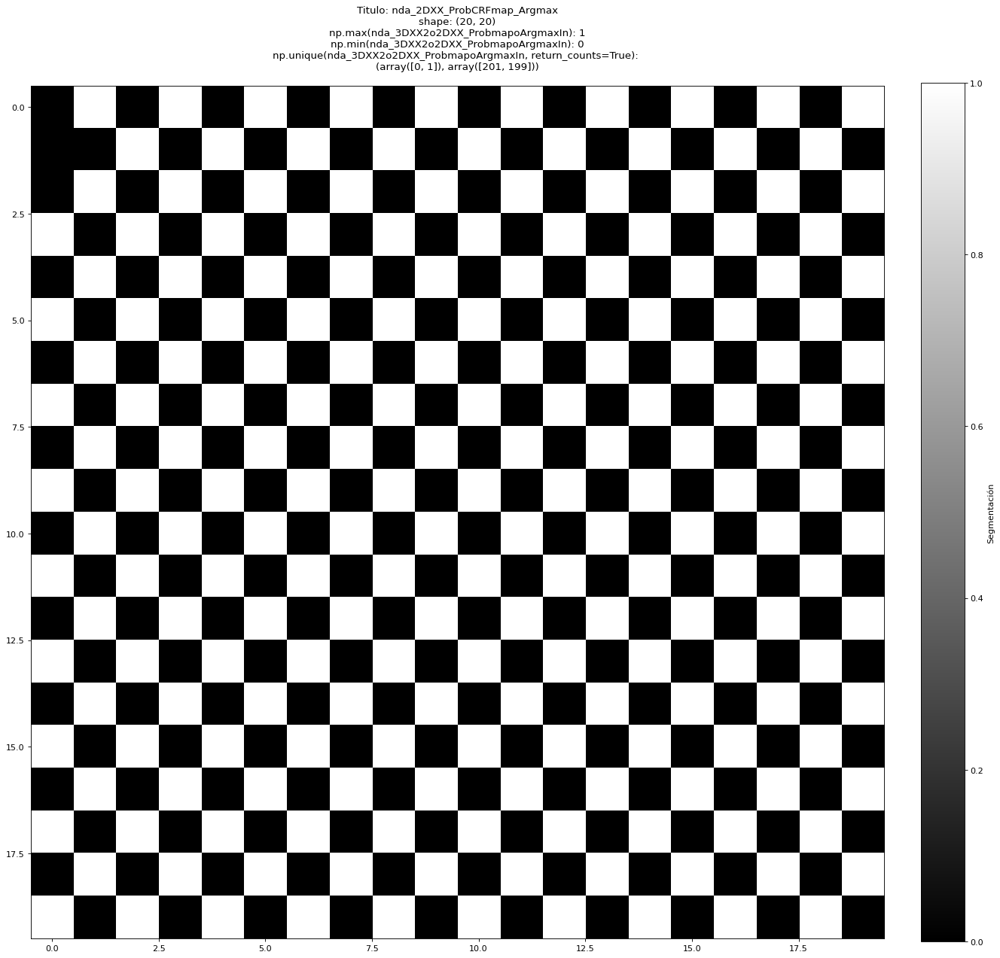

################
################
##NUEVAITERACION
################
################
PROBAR kernel simetrico
lst_tpl_ParametroXYIn1_i:  (3, 3)
Plotear MASCARA imperfecta respecto a RAW


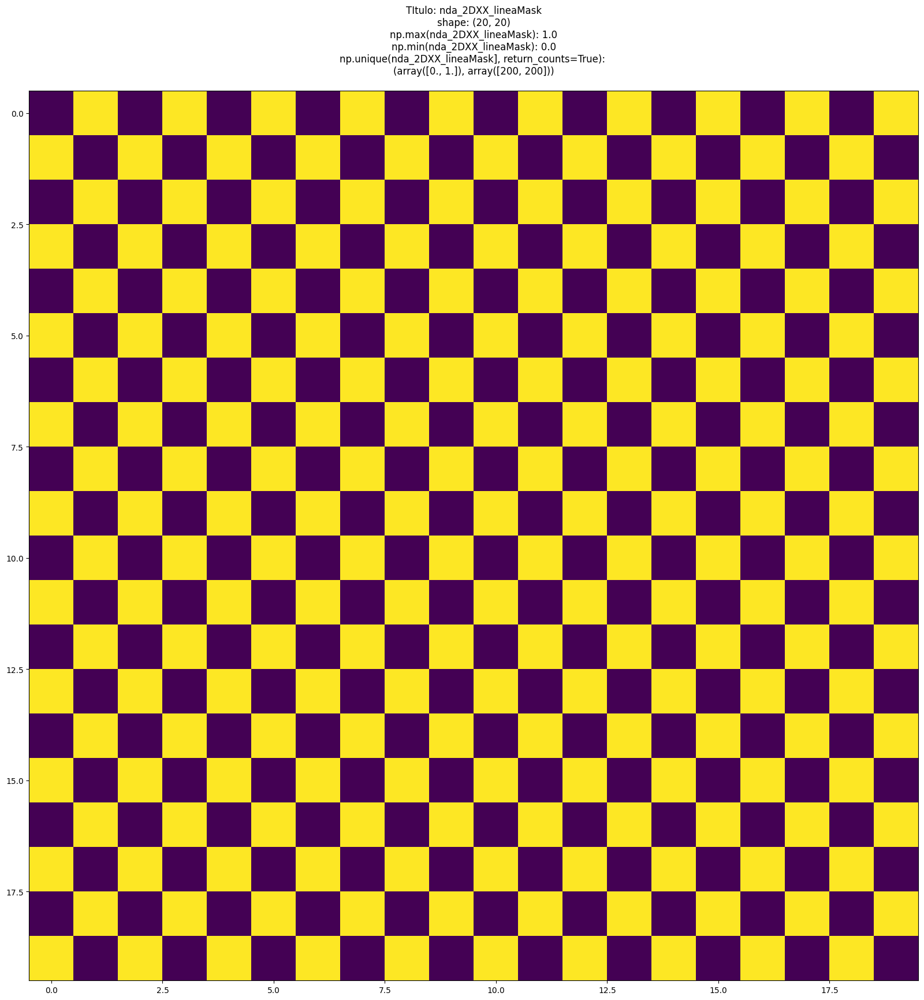

####################################
####################################
####################################
####################################
Plotear RAW


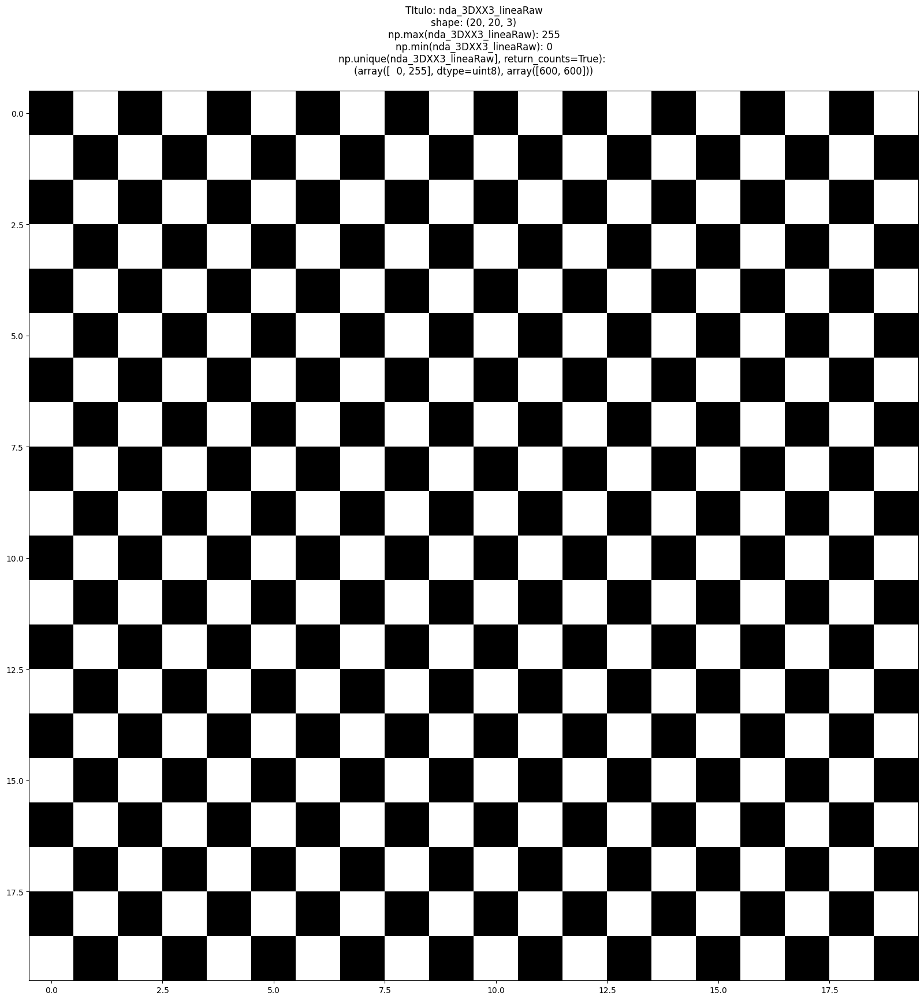

####################################
####################################
####################################
####################################
nda_3DXX2_arrProbmap.shape:  (20, 20, 2)
np.unique(nda_3DXX2_arrProbmap[:,:,0]):  [0.49 0.51]
np.unique(nda_3DXX2_arrProbmap[:,:,1]):  [0.49 0.51]
nda_3DXX2_arrProbmap.shape:  (20, 20, 2)
nda_3DXX2_arrProbmap[:,:,0].shape:  (20, 20)
nda_3DXX2_arrProbmap[:,:,1].shape:  (20, 20)
Plotear PROBDLMAP
Probmaps nda_3DXX2_ProbDLmap
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0], return_counts=True):  (array([0.49, 0.51]), array([200, 200]))
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,1], return_counts=True):  (array([0.49, 0.51]), array([200, 200]))


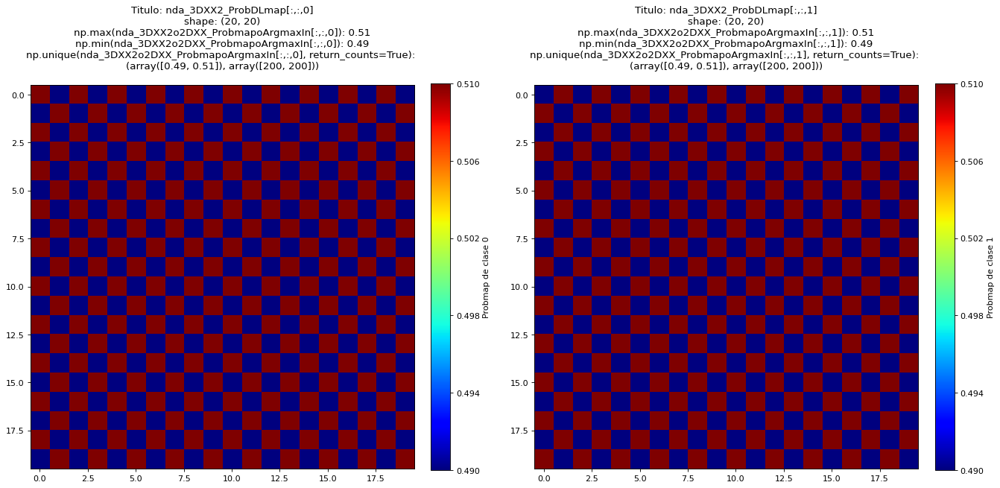

Plotear PROBDLMAP_ARGMAX
Segmentación (es argmax)nda_3DXX2_ProbDLmap_Argmax
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn, return_counts=True):  (array([0, 1]), array([200, 200]))


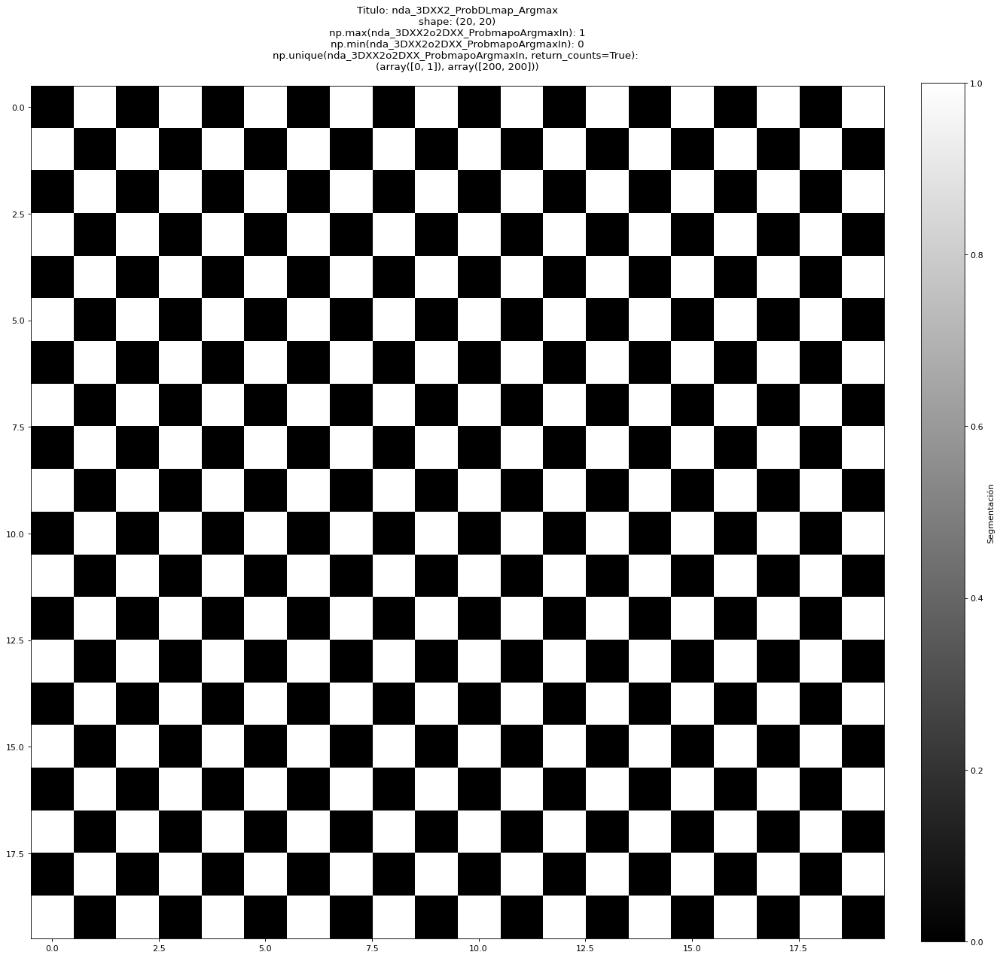

PROB_CRF
PROB_CRF
PROB_CRF
Plotear PROBCRFMAP
Probmaps nda_3DXX2_ProbCRFmap
np.unique(nda_3DXX2o2DXX_ProbmapoArgmaxIn[:,:,0], return_counts=True):  (array([0.48750606, 0.48762277, 0.48767814, 0.4876931 , 0.48774102,
       0.48780856, 0.48784468, 0.48790133, 0.48790416, 0.48792312,
       0.4879787 , 0.4880096 , 0.48803934, 0.48807922, 0.48809758,
       0.48811182, 0.4881223 , 0.48814666, 0.48816526, 0.4882097 ,
       0.48832446, 0.48835692, 0.48836157, 0.48838288, 0.48838556,
       0.48841894, 0.48847258, 0.48847732, 0.48848855, 0.48863983,
       0.48864585, 0.4886848 , 0.48869604, 0.488731  , 0.48874918,
       0.48874956, 0.48879886, 0.4888182 , 0.48885795, 0.48889622,
       0.4889023 , 0.48895442, 0.48902932, 0.48903233, 0.48905727,
       0.4891101 , 0.48911577, 0.4891207 , 0.4891208 , 0.48912194,
       0.48916337, 0.48925227, 0.48928437, 0.48933583, 0.4893474 ,
       0.48935837, 0.48939627, 0.48939702, 0.48943654, 0.4894898 ,
       0.48950782, 0.4895112 , 0.4895422 , 0.48

In [ ]:
#if ("func_experimentarPydenseCRF"=="func_experimentarPydenseCRF"):    
if __name__ == "__main__":
    print("20230912")
    print("2D intento")
    print("Estudiar 2 cosas: Que pasa si pongo mas vecinos, y el efecto domino. QUe pasa si cambio el shape del kernel")
    int_largo1=20#41
    lst_int_pixelesBlancosRaw1=[0,-1,-2]
    #lst_int_pixelesBlancosMask1=[int_largo1//2-1,int_largo1//2,int_largo1//2+1]
    lst_int_pixelesBlancosMask1=[int_largo1//2,int_largo1//2+1]
    int_CFijoIn21=0.51
    lst_int_inferenceIn11=[5,10]#5,10
    
    int_pairwisebilateralCompatIn11=5#5
    str_PairwiseoKernelIn1="GaussianoSmoothnessKernel"

    
    lst_lst_int_pixelesBlancosMask1=[
                                    #[int_largo1//2],
                                    #[int_largo1//2,int_largo1//2+2],
                                    #[int_largo1//2-2,int_largo1//2,int_largo1//2+2],
                                    #[int_largo1//2-4,int_largo1//2-2,int_largo1//2,int_largo1//2+2,int_largo1//2+4],
        
        
                                    #[int_largo1//2-6,int_largo1//2-4,int_largo1//2-2,int_largo1//2,int_largo1//2+2,int_largo1//2+4,int_largo1//2+6],
                                    [int_largo1//2-7,int_largo1//2-6,int_largo1//2-5,int_largo1//2-4,int_largo1//2-3,int_largo1//2+3,int_largo1//2+4,int_largo1//2+5,int_largo1//2+6,int_largo1//2+7],
                                    
        
        
        
                                    #[int_largo1//2-8,int_largo1//2-6,int_largo1//2-4,int_largo1//2-2,int_largo1//2,int_largo1//2+2,int_largo1//2+4,int_largo1//2+6,int_largo1//2+8],
                                    #[int_largo1//2-10,int_largo1//2-8,int_largo1//2-6,int_largo1//2-4,int_largo1//2-2,int_largo1//2,int_largo1//2+2,int_largo1//2+4,int_largo1//2+6,int_largo1//2+8,int_largo1//2+10],
                                    #[int_largo1//2-12,int_largo1//2-10,int_largo1//2-8,int_largo1//2-6,int_largo1//2-4,int_largo1//2-2,int_largo1//2,int_largo1//2+2,int_largo1//2+4,int_largo1//2+6,int_largo1//2+8,int_largo1//2+10,int_largo1//2+12],
                                    #[int_largo1//2-14,int_largo1//2-12,int_largo1//2-10,int_largo1//2-8,int_largo1//2-6,int_largo1//2-4,int_largo1//2-2,int_largo1//2,int_largo1//2+2,int_largo1//2+4,int_largo1//2+6,int_largo1//2+8,int_largo1//2+10,int_largo1//2+12,int_largo1//2+14],
        
                                    ]
 
    lst_tpl_ParametroXYIn1=[
                            (1,1),
                            (2,1),
                            (3,1),
                            (4,1),
                            (5,1)
                            ]
    
    if ("probarSDXY"!="probarSDXY"): #No influye el SDXY porque es una imagen horizontal, lo cual esta correcto
        lst_tpl_ParametroXYIn1=[
                                (1,1),
                                (2,1),
                                (3,1),
                                (4,1),
                                (5,1)
                                ]
        
        
    if False:
        if ("probarSDXY"!="probarSDXY"): #No influye el SDXY porque es una imagen horizontal, lo cual esta correcto
            lst_tpl_ParametroXYIn1=[
                                    (1,1),
                                    (1,2),
                                    (1,3),
                                    (1,4),
                                    (1,5)
                                    ]
    if False:
        for lst_lst_int_pixelesBlancosMask1_i in lst_lst_int_pixelesBlancosMask1:
            for lst_int_inferenceIn11_i in lst_int_inferenceIn11:
                for lst_tpl_ParametroXYIn1_i in lst_tpl_ParametroXYIn1:
                    print("################")
                    print("################")
                    print("##NUEVAITERACION")
                    print("################")
                    print("################")
                    print("PROBAR inferencia ")
                    print("lst_tpl_ParametroXYIn1_i: ", lst_tpl_ParametroXYIn1_i)
                    func_experimentarPydenseCRF2D(int_largo=int_largo1,
                                                int_CFijoIn2 =int_CFijoIn21,
                                                tpl_ParametroXYIn1=lst_tpl_ParametroXYIn1_i,#(1,1)
                                                tpl_ParametroRGBIn1=(1,1,1),
                                                lst_int_inferenceIn1=lst_int_inferenceIn11_i,
                                                int_pairwisebilateralCompatIn1=int_pairwisebilateralCompatIn11,
                                                str_PairwiseoKernelIn=str_PairwiseoKernelIn1,#["GaussianoSmoothnessKernel", "BilateraloAppearanceKernel"]
                                                lst_int_pixelesBlancosMask=lst_lst_int_pixelesBlancosMask1_i,#dejarlos en -1 la cosa en esta funcion no sirve lst_lst_int_pixelesBlancosMask1_i
                                                lst_int_pixelesBlancosRaw=lst_int_pixelesBlancosRaw1,#dejarlos en -1 la cosa en esta funcion no sirve lst_lst_int_pixelesBlancosMask1_i
                                                int_intervalo=2
                                               )

    if False:                    
        for lst_tpl_ParametroXYIn1_i in lst_tpl_ParametroXYIn1:
            print("################")
            print("################")
            print("##NUEVAITERACION")
            print("################")
            print("################")
            print("PROBAR int_pairwisebilateralCompatIn1")
            print("lst_tpl_ParametroXYIn1_i: ", lst_tpl_ParametroXYIn1_i)
            func_experimentarPydenseCRF2D(int_largo=int_largo1,
                                        int_CFijoIn2 =int_CFijoIn21,
                                        tpl_ParametroXYIn1=lst_tpl_ParametroXYIn1_i,#(1,1)
                                        tpl_ParametroRGBIn1=(1,1,1),
                                        lst_int_inferenceIn1=5,
                                        int_pairwisebilateralCompatIn1=15,
                                        str_PairwiseoKernelIn=str_PairwiseoKernelIn1,#["GaussianoSmoothnessKernel", "BilateraloAppearanceKernel"]
                                        lst_int_pixelesBlancosMask=-1,#dejarlos en -1 la cosa en esta funcion no sirve lst_lst_int_pixelesBlancosMask1_i
                                        lst_int_pixelesBlancosRaw=lst_int_pixelesBlancosRaw1,#dejarlos en -1 la cosa en esta funcion no sirve lst_lst_int_pixelesBlancosMask1_i
                                        int_intervalo=2
                                       )

    if False:
        for lst_tpl_ParametroXYIn1_i in lst_tpl_ParametroXYIn1:
            print("################")
            print("################")
            print("##NUEVAITERACION")
            print("################")
            print("################")
            print("PROBAR intercalado")
            print("lst_tpl_ParametroXYIn1_i: ", lst_tpl_ParametroXYIn1_i)
            func_experimentarPydenseCRF2D(int_largo=int_largo1,
                                        int_CFijoIn2 =int_CFijoIn21,
                                        tpl_ParametroXYIn1=lst_tpl_ParametroXYIn1_i,#(1,1)
                                        tpl_ParametroRGBIn1=(1,1,1),
                                        lst_int_inferenceIn1=5,
                                        int_pairwisebilateralCompatIn1=5,
                                        str_PairwiseoKernelIn=str_PairwiseoKernelIn1,#["GaussianoSmoothnessKernel", "BilateraloAppearanceKernel"]
                                        lst_int_pixelesBlancosMask=-1,#dejarlos en -1 la cosa en esta funcion no sirve lst_lst_int_pixelesBlancosMask1_i
                                        lst_int_pixelesBlancosRaw=lst_int_pixelesBlancosRaw1,#dejarlos en -1 la cosa en esta funcion no sirve lst_lst_int_pixelesBlancosMask1_i
                                        int_intervalo=3
                                       )

    if True:

        lst_tpl_ParametroXYIn1=[
                                (1,1),
                                (2,2),
                                (3,3),
                                (4,4),
                                (5,5)
                                ]
        for lst_tpl_ParametroXYIn1_i in lst_tpl_ParametroXYIn1:
            print("################")
            print("################")
            print("##NUEVAITERACION")
            print("################")
            print("################")
            print("PROBAR kernel simetrico")
            print("lst_tpl_ParametroXYIn1_i: ", lst_tpl_ParametroXYIn1_i)
            func_experimentarPydenseCRF2D(int_largo=int_largo1,
                                        int_CFijoIn2 =int_CFijoIn21,
                                        tpl_ParametroXYIn1=lst_tpl_ParametroXYIn1_i,#(1,1)
                                        tpl_ParametroRGBIn1=(1,1,1),
                                        lst_int_inferenceIn1=5,
                                        int_pairwisebilateralCompatIn1=5,
                                        str_PairwiseoKernelIn=str_PairwiseoKernelIn1,#["GaussianoSmoothnessKernel", "BilateraloAppearanceKernel"]
                                        lst_int_pixelesBlancosMask=-1,#dejarlos en -1 la cosa en esta funcion no sirve lst_lst_int_pixelesBlancosMask1_i
                                        lst_int_pixelesBlancosRaw=lst_int_pixelesBlancosRaw1,#dejarlos en -1 la cosa en esta funcion no sirve lst_lst_int_pixelesBlancosMask1_i
                                        int_intervalo=2
                                       )


In [ ]:
if False:
    if __name__ == "__main__":
    #if ("func_experimentarPydenseCRF"!="func_experimentarPydenseCRF"):    
        int_largo1=9#41


        int_CFijoIn21=0.51
        lst_int_inferenceIn11=5
        int_pairwisebilateralCompatIn11=5
        str_PairwiseoKernelIn1="BilateraloAppearanceKernel" #"GaussianoSmoothnessKernel"

        lst_int_pixelesBlancosMask1=[10]
        lst_int_pixelesBlancosRaw1=[0]

        func_experimentarPydenseCRF(int_largo=int_largo1,
                                int_CFijoIn2 = int_CFijoIn21,
                                tpl_ParametroXYIn1=(2,1),#En (23,23) clasifica todo correctamente con int_largo1=41. (29,29) clasifica todo bien con int_largo1=51. (17,17) clasifica todo bien con int_largo1=31. (58,58) clasifica todo bien con int_largo1=101. (6,6) clasifica todo bien con int_largo1=11. (2,2) clasifica todo bien con int_largo1=5. (3,3) clasifica todo bien con int_largo1=6. (4,4) clasifica todo bien con int_largo1=7,8. (5,5) clasifica todo bien con int_largo1=9
                                tpl_ParametroRGBIn1=(1,1,1),
                                lst_int_inferenceIn1=lst_int_inferenceIn11,
                                int_pairwisebilateralCompatIn1=int_pairwisebilateralCompatIn11,
                                str_PairwiseoKernelIn=str_PairwiseoKernelIn1,#["GaussianoSmoothnessKernel", "BilateraloAppearanceKernel"]
                                lst_int_pixelesBlancosMask=[-1,-2],#[-1,-2]
                                lst_int_pixelesBlancosRaw=lst_int_pixelesBlancosRaw1#lst_int_pixelesBlancosRaw1
                                   )

In [ ]:
if False:
    from datetime import datetime as dt  
    str_fecha=dt.today().strftime('%Y%m%d_%H%M')
    str_nombreIPYNB="A20230112_CRF"
    str_sufijo="embrion"
    #str_nombreIPYNBExt=str_nombreIPYNB+r".ipynb"
    str_nombreArchivoHTML=str_fecha+str_nombreIPYNB+str_sufijo
    #!jupyter nbconvert --output-dir="./outputsMasivos/OutputsPDF" --output=$nombreArchivoHTML --to html A20221210_pipeline5clase.ipynb 
    !jupyter nbconvert --output-dir="./outputsMasivos/OutputsPDF" --output=$nombreArchivoHTML --to html A20230112_CRF.ipynb

In [ ]:

#rr[rr==1]=0.6
#rr[rr==1]=0.3


In [ ]:


#int_CFijoIn2 = 0.55
#tpl_ParametroXYIn1=(1,1)
#tpl_ParametroRGBIn1=(1,1,1)
#lst_int_inferenceIn1=5


#int_IncorrectoClase0In2 = 0.51
#int_offset2 = 200
#lst_str_PairwiseoKernelIn=["GaussianoSmoothnessKernel", "BilateraloAppearanceKernel"]
